# Functions

In [1]:
import numpy as np
from scipy.special import factorial, eval_genlaguerre
from scipy.optimize import minimize
from scipy.linalg import eigh
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import TwoSlopeNorm
from joblib import Parallel, delayed
import contextlib, joblib
from tqdm.auto import tqdm
import qutip as qt
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import MaxNLocator
import warnings
from math import comb as _C
from matplotlib.ticker import PercentFormatter
warnings.filterwarnings('ignore')
from matplotlib.cm import ScalarMappable
import matplotlib.lines as mlines
import matplotlib.colors as colors
import os
from scipy.interpolate import RegularGridInterpolator
import matplotlib.ticker as ticker
from scipy.signal import savgol_filter
from scipy.interpolate import UnivariateSpline
from scipy.ndimage import gaussian_filter
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec




plt.rcParams.update({
    'text.usetex': True,
    'text.latex.preamble': r'\usepackage{amsmath}\usepackage[utf8]{inputenc}',
    'font.family': 'serif',
    'font.serif': ['Computer Modern'],
    'font.size': 22,
    'axes.labelsize': 22,
    'axes.titlesize': 22,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 16,
    'figure.titlesize': 20,
    'axes.facecolor': 'white',
    'figure.facecolor': 'white',
    'axes.edgecolor': 'black',
    'axes.linewidth': 1.0,
    'grid.alpha': 0.3,
    'grid.color': 'gray',
    'axes.axisbelow': True,
})

# ── Utilidades ────────────────────────────────────────────────────────────────

@contextlib.contextmanager
def tqdm_joblib(tqdm_object):
    class TqdmBatchCompletionCallback(joblib.parallel.BatchCompletionCallBack):
        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)
        def __call__(self, *args, **kwargs):
            tqdm_object.update(n=self.batch_size)
            return super().__call__(*args, **kwargs)
    old = joblib.parallel.BatchCompletionCallBack
    joblib.parallel.BatchCompletionCallBack = TqdmBatchCompletionCallback
    try:
        yield tqdm_object
    finally:
        joblib.parallel.BatchCompletionCallBack = old
        tqdm_object.close()


def get_M_CM(lam1, lam2, M_max=12):
    """Truncación adaptativa. El desplazamiento efectivo en los modos
    relativo/CoM es Λ = sqrt(λ₁²+λ₂²), por eso los umbrales se ajustan a Λ."""
    Lam = np.sqrt(lam1**2 + lam2**2)
    if   Lam < 0.5: return 5
    elif Lam < 1.5: return 9
    else:           return M_max


def disp_matrix(M_ph, alpha):
    """Elementos de matriz <m'|D(alpha)|m> en base de Fock, alpha real."""
    N      = M_ph + 1
    alpha2 = alpha * alpha
    gauss  = np.exp(-0.5 * alpha2)
    facts  = np.array([float(factorial(k, exact=True)) for k in range(N)])
    D = np.zeros((N, N))
    for mp in range(N):
        for n in range(N):
            if mp >= n:
                k    = mp - n
                pref = gauss * (alpha**k) * np.sqrt(facts[n] / facts[mp])
                D[mp, n] = pref * eval_genlaguerre(n, k, alpha2)
            else:
                k    = n - mp
                pref = gauss * ((-alpha)**k) * np.sqrt(facts[mp] / facts[n])
                D[mp, n] = pref * eval_genlaguerre(mp, k, alpha2)
    return D


def phonon_weight_CM(vec, m_r, m_c, nph, n_ph):
    """Peso fonónico |<m_r,m_c|psi>|^2 sumado sobre los dos bloques electrónicos.
    Índice en el bloque fonónico: idx = m_r * nph + m_c"""
    idx = m_r * nph + m_c
    return abs(vec[idx])**2 + abs(vec[n_ph + idx])**2


def build_CM_hamiltonians(M, eps1, eps2, t, Delta, omega0, g1, g2):
    """
    Hamiltoniano ANISOTRÓPICO (λ₁≠λ₂) en base rel/CoM |elec_sector, m_r, m_c>.

    OJO: cada sector define su PROPIA rotación rel/CoM (â_o,Â_o para impar;
    â_e,Â_e para par), pero ambas comparten el mismo desplazamiento efectivo
    Λ = √(λ₁²+λ₂²). En su base propia, cada sector tiene la estructura de un
    modo ACOPLADO (relativo para impar, CoM para par) y un modo espectador
    libre, idéntica al caso isotrópico salvo √2·λ → Λ.

    Sector impar (o): |1,0> y |0,1>,  modo relativo m_r acoplado
      H_o = [[ ε̃₁ + Ω,     t·D(Λ)      ],
             [ t·D(Λ)ᵀ,     ε̃₂ + Ω      ]]

    Sector par (e):   |0,0> y |1,1>,  modo CoM m_c acoplado
      H_e = [[ Ω,               Δ·D(Λ)†     ],
             [ Δ·D(Λ),          ε̃₁+ε̃₂ + Ω  ]]

    ε̃ᵢ = εᵢ - gᵢ²/ω₀ ,   Λ = √(λ₁²+λ₂²) ,   λᵢ = gᵢ/ω₀
    D(Λ)  actúa en m_r (impar);  D(Λ)† actúa en m_c (par)
    Ω = (m_r + m_c)·ω₀  (diagonal, incluye AMBOS modos)
    """
    nph  = M + 1
    n_ph = nph * nph

    lam1 = g1 / omega0
    lam2 = g2 / omega0
    Lam  = np.sqrt(lam1**2 + lam2**2)          # desplazamiento efectivo

    eps1_t = eps1 - g1**2 / omega0             # ε̃₁
    eps2_t = eps2 - g2**2 / omega0             # ε̃₂

    D_L = disp_matrix(M, Lam)                  # D(Λ)   (real)
    I   = np.eye(nph)

    D_t_full = np.kron(D_L,   I)               # D(Λ) ⊗ I   → acopla m_r (impar)
    D_D_full = np.kron(I, D_L.T)               # I ⊗ D(Λ)†  → acopla m_c (par)

    Omega = np.array([(mr + mc) * omega0
                      for mr in range(nph) for mc in range(nph)])

    # ── Sector impar (modo relativo acoplado) ──
    H_o = np.zeros((2*n_ph, 2*n_ph))
    H_o[:n_ph, :n_ph] = np.diag(eps1_t + Omega)
    H_o[n_ph:, n_ph:] = np.diag(eps2_t + Omega)
    H_o[:n_ph, n_ph:] = t * D_t_full
    H_o[n_ph:, :n_ph] = t * D_t_full.T

    # ── Sector par (modo CoM acoplado) ──
    H_e = np.zeros((2*n_ph, 2*n_ph))
    H_e[:n_ph, :n_ph] = np.diag(Omega)
    H_e[n_ph:, n_ph:] = np.diag(eps1_t + eps2_t + Omega)
    H_e[:n_ph, n_ph:] = Delta * D_D_full
    H_e[n_ph:, :n_ph] = Delta * D_D_full.T

    return H_e, H_o, nph, n_ph


def diagonalize_CM(M, eps1, eps2, t, Delta, omega0, g1, g2):
    H_e, H_o, nph, n_ph = build_CM_hamiltonians(
        M, eps1, eps2, t, Delta, omega0, g1, g2)
    ev_e, evec_e = eigh(H_e)
    ev_o, evec_o = eigh(H_o)
    return ev_e, evec_e, ev_o, evec_o, nph, n_ph


def compute_point_CM(lam1, lam2, Delta):
    """Un punto del barrido. Usa globales eps_val, t, omega0, M_max,
    phonon_states_keys (como en tu versión isotrópica)."""
    g1 = lam1 * omega0
    g2 = lam2 * omega0
    M_loc = get_M_CM(lam1, lam2, M_max)
    ev_e, evec_e, ev_o, evec_o, nph, n_ph = diagonalize_CM(
        M=M_loc, eps1=eps_val, eps2=eps_val, t=t, Delta=Delta,
        omega0=omega0, g1=g1, g2=g2)
    gs_e = evec_e[:, 0]
    gs_o = evec_o[:, 0]
    p    = ev_e[0] - ev_o[0]   # splitting con signo: E_e - E_o
    w_e  = {(mr, mc): phonon_weight_CM(gs_e, mr, mc, nph, n_ph)
            for (mr, mc) in phonon_states_keys}
    w_o  = {(mr, mc): phonon_weight_CM(gs_o, mr, mc, nph, n_ph)
            for (mr, mc) in phonon_states_keys}
    return p, w_e, w_o

print("Preámbulo y funciones ANISOTRÓPICAS (rel/CoM) cargadas correctamente.")

c:\Users\yumab\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Preámbulo y funciones ANISOTRÓPICAS (rel/CoM) cargadas correctamente.


# General results: Electronic sector

In [58]:
# ── Parámetros físicos ────────────────────────────────────────────
t       = 1.0
omega0  = 1.0
eps_val = 0.25
M_max   = 15

phonon_states_keys = [(0,0),(0,1),(1,0),(1,1),(2,0),(0,2)]

# ── Grilla ────────────────────────────────────────────────────────
n_lam, n_Delta = 200, 200
lam_arr   = np.linspace(0.01, 2.0, n_lam)
Delta_arr = np.linspace(0.0,  2.0, n_Delta)

print(f"Grid: {n_lam} x {n_Delta} = {n_lam*n_Delta:,} puntos")

# ── Cálculo paralelo ──────────────────────────────────────────────
print(f"Calculando mapa 2D [{n_lam}x{n_Delta}] — base rel/CoM (isotrópico: λ₁=λ₂=λ) ...")

def _point(lam, Delta):
    return compute_point_CM(lam, lam, Delta)   # λ₁ = λ₂ = λ  ⇒  Λ = √2·λ

flat_results = Parallel(n_jobs=-1, verbose=5)(
    delayed(_point)(lam, Delta)
    for lam in lam_arr
    for Delta in Delta_arr
)

print("\n¡Listo!")

# ── Reconstrucción de arrays 2D ───────────────────────────────────
hmap_p = np.zeros((n_Delta, n_lam))
phonon_states = {k: {"even": np.zeros((n_Delta, n_lam)),
                      "odd":  np.zeros((n_Delta, n_lam))}
                 for k in phonon_states_keys}

for j in range(n_lam):
    for i in range(n_Delta):
        p, w_e, w_o = flat_results[j * n_Delta + i]
        hmap_p[i, j] = p
        for (mr, mc) in phonon_states_keys:
            phonon_states[(mr, mc)]["even"][i, j] = w_e[(mr, mc)]
            phonon_states[(mr, mc)]["odd"][i, j]  = w_o[(mr, mc)]

print("Arrays reconstruidos.")
print(f"  rango de p = E_e - E_o : [{hmap_p.min():.4f}, {hmap_p.max():.4f}]")

Grid: 200 x 200 = 40,000 puntos
Calculando mapa 2D [200x200] — base rel/CoM (isotrópico: λ₁=λ₂=λ) ...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 360 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 3864 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done 8166 tasks      | elapsed:   19.2s
[Parallel(n_jobs=-1)]: Done 8436 tasks      | elapsed:   21.3s
[Parallel(n_jobs=-1)]: Done 9216 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 10296 tasks      | elapsed:   32.1s
[Parallel(n_jobs=-1)]: Done 11520 tasks      | elapsed:   38.7s
[Parallel(n_jobs=-1)]: Done 12888 tasks      | elapsed:   47.2s
[Parallel(n_jobs=-1)]: Done 14400 tasks      | elapsed:   56.2s
[Parallel(n_jobs=-1)]: Done 16056 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 17334 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 18960 tasks      | elapsed:  1.4min


KeyboardInterrupt: 

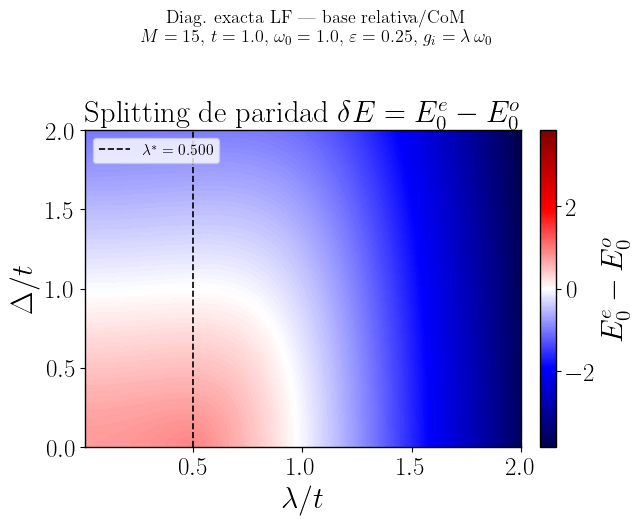

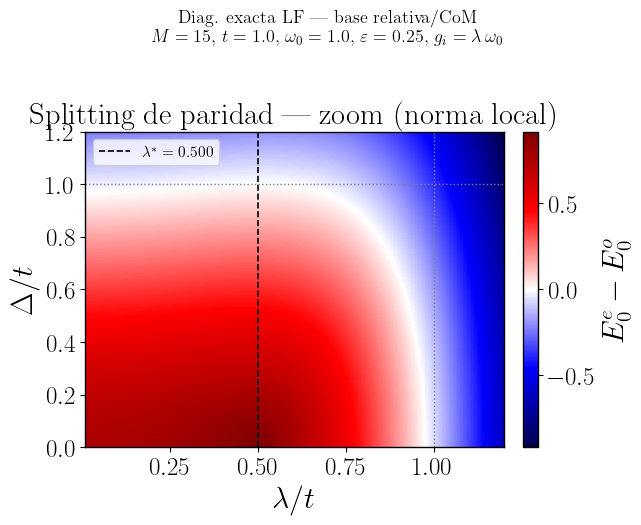

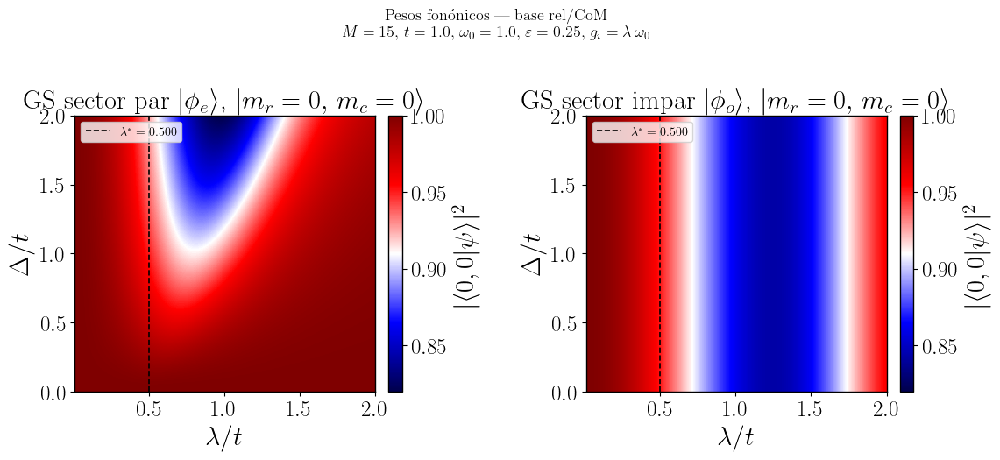

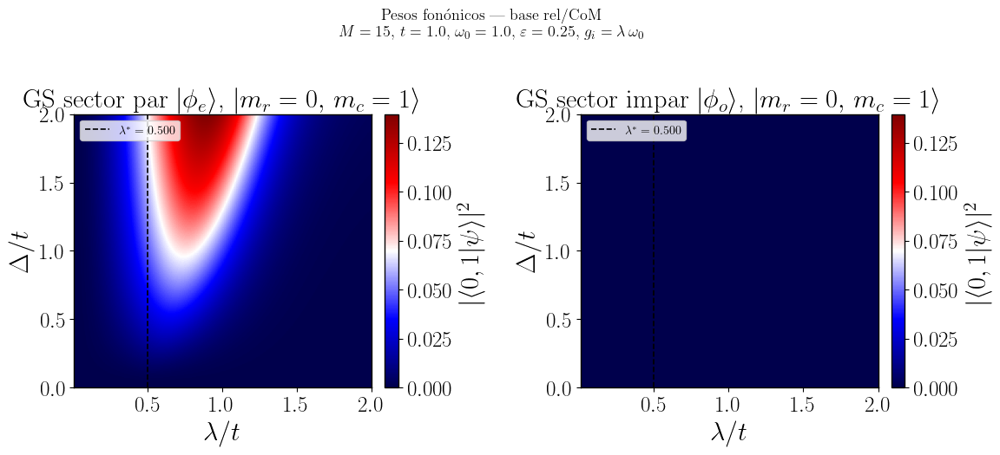

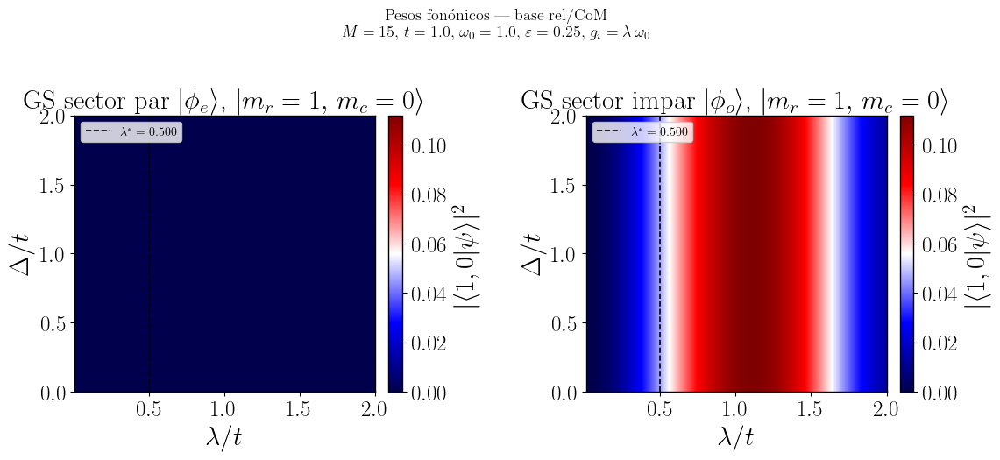

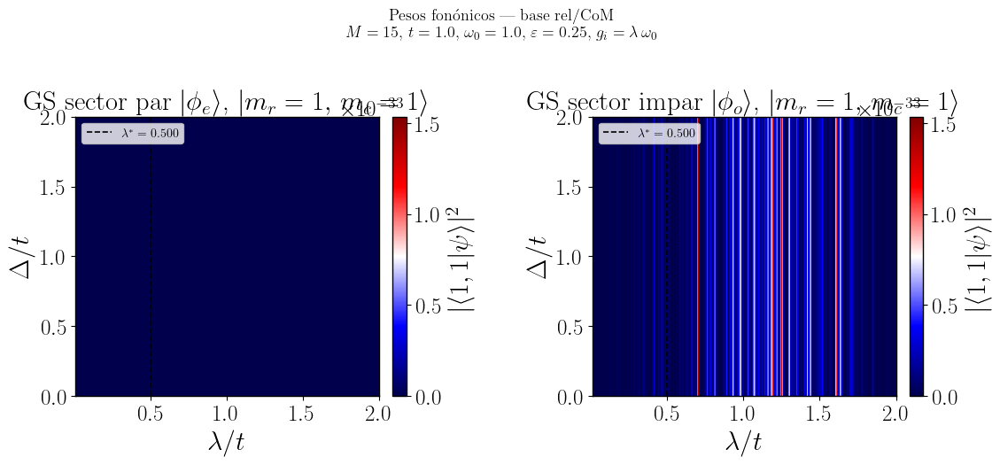

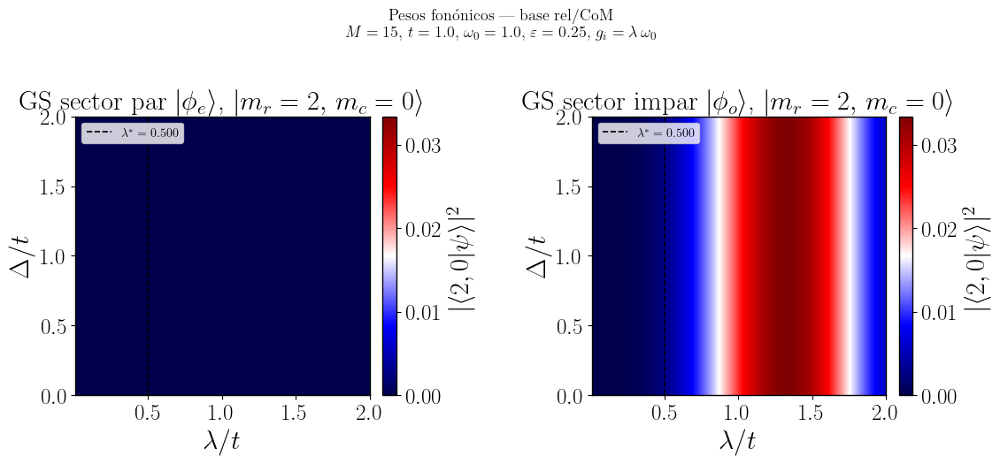

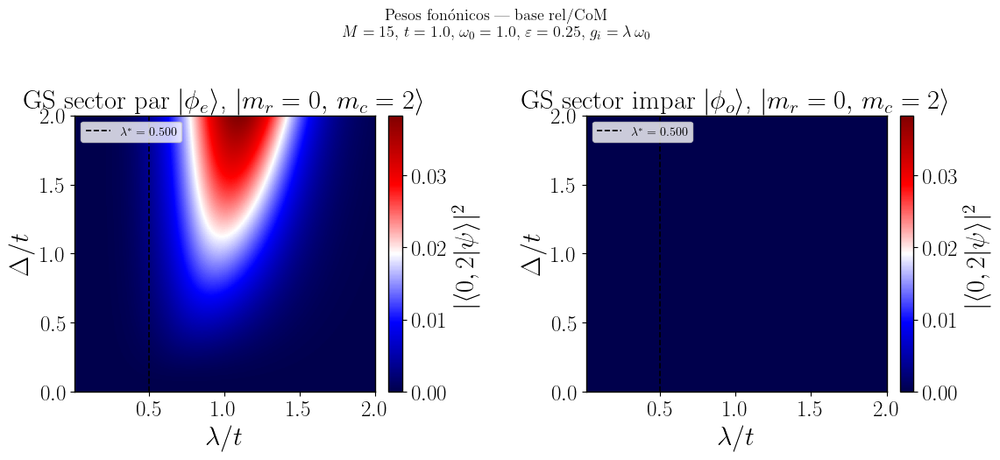

In [ ]:
extent   = [lam_arr[0], lam_arr[-1], Delta_arr[0], Delta_arr[-1]]
xlabel   = r'$\lambda/t$'
ylabel   = r'$\Delta/t$'
lam_star = np.sqrt(eps_val / omega0)
param_str = (
    rf"$M={M_max}$,  $t={t}$,  $\omega_0={omega0}$,  "
    rf"$\varepsilon={eps_val}$,  $g_i=\lambda\,\omega_0$"
)

# ── i.a  Mapa completo — splitting con signo ──────────────────────
vmax_p = np.max(np.abs(hmap_p))
norm_p = TwoSlopeNorm(vmin=-vmax_p, vcenter=0.0, vmax=vmax_p)

fig, ax = plt.subplots(figsize=(7, 5.5))
im = ax.imshow(hmap_p, origin='lower', aspect='auto',
               extent=extent, cmap='seismic', norm=norm_p)
cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$E^e_0 - E^o_0$')
ax.axvline(lam_star, color='black', ls='--', lw=1.2,
           label=rf'$\lambda^*={lam_star:.3f}$')
ax.set(xlabel=xlabel, ylabel=ylabel,
       title=r'Splitting de paridad $\delta E = E^e_0 - E^o_0$')
ax.legend(loc='upper left', fontsize=11)
fig.suptitle('Diag. exacta LF — base relativa/CoM\n' + param_str, fontsize=13)
plt.tight_layout()
plt.show()

# ── i.b  Zoom λ,Δ ∈ [0,1.2] — norma local ────────────────────────
lam_mask   = (lam_arr   >= 0.01) & (lam_arr   <= 1.2)
Delta_mask = (Delta_arr >= 0.0)  & (Delta_arr <= 1.2)

hmap_p_zoom = hmap_p[np.ix_(Delta_mask, lam_mask)]
vmax_zoom   = np.max(np.abs(hmap_p_zoom))
norm_zoom   = TwoSlopeNorm(vmin=-vmax_zoom, vcenter=0.0, vmax=vmax_zoom)

fig, ax = plt.subplots(figsize=(7, 5.5))
im = ax.imshow(hmap_p, origin='lower', aspect='auto',
               extent=extent, cmap='seismic', norm=norm_zoom)
cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$E^e_0 - E^o_0$')
ax.axvline(lam_star, color='black', ls='--', lw=1.2,
           label=rf'$\lambda^*={lam_star:.3f}$')
ax.axvline(1.0, color='gray', ls=':', lw=1.0)
ax.axhline(1.0, color='gray', ls=':', lw=1.0)
ax.set_xlim(0.01, 1.2)
ax.set_ylim(0.0,  1.2)
ax.set(xlabel=xlabel, ylabel=ylabel,
       title=r'Splitting de paridad — zoom (norma local)')
ax.legend(loc='upper left', fontsize=11)
fig.suptitle('Diag. exacta LF — base relativa/CoM\n' + param_str, fontsize=13)
plt.tight_layout()
plt.show()

# ── ii.  Pesos fonónicos por sector ───────────────────────────────
for (mr, mc), arrays in phonon_states.items():
    mn_str = rf'$|\langle {mr},{mc}|\psi\rangle|^2$'
    tag    = rf'$|m_r={mr},\,m_c={mc}\rangle$'

    vmax = 1.0 if (mr, mc) == (0, 0) else np.max([arrays["even"], arrays["odd"]])
    vmin = np.min([arrays["even"], arrays["odd"]])

    fig, axes = plt.subplots(1, 2, figsize=(12, 5.5))
    sector_labels = [r"par $|\phi_e\rangle$", r"impar $|\phi_o\rangle$"]

    for ax, label, data in zip(axes, sector_labels,
                                [arrays["even"], arrays["odd"]]):
        im = ax.imshow(data, origin='lower', aspect='auto',
                       extent=extent, cmap='seismic', vmin=vmin, vmax=vmax)
        cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cb.set_label(mn_str)
        ax.axvline(lam_star, color='black', ls='--', lw=1.2,
                   label=rf'$\lambda^*={lam_star:.3f}$')
        ax.legend(loc='upper left', fontsize=10)
        ax.set(xlabel=xlabel, ylabel=ylabel,
               title=rf'GS sector {label},  {tag}')

    fig.suptitle('Pesos fonónicos — base rel/CoM\n' + param_str, fontsize=13)
    plt.tight_layout()
    plt.show()

In [ ]:
# ══════════════════════════════════════════════════════════════════
#  Splitting δE en el plano λ₁/t vs λ₂/t  —  base rel/CoM (anisotrópico)
#  ε₁, ε₂ fijos; barrido en (λ₁, λ₂) para cada Δ
# ══════════════════════════════════════════════════════════════════
M        = 12
t        = 1.0
omega1   = 1.0
omega2   = 1.0
omega0   = 1.0

Delta_vals = [0.5, 1.0, 1.5]
eps1_val = 1.0
eps2_val = 0.75**2

n_lam    = 120
lam1_arr = np.linspace(-2.1, 2.1, n_lam)   # λ₁/t
lam2_arr = np.linspace(-2.1, 2.1, n_lam)   # λ₂/t

# ── Cálculo por columnas (λ₁ fijo, barre λ₂) ─────────────────────
def compute_column_lam(j, lam1_val, lam2_arr, Delta):
    col_p = np.zeros(len(lam2_arr))
    for i, lam2_val in enumerate(lam2_arr):
        g1 = lam1_val * omega1
        g2 = lam2_val * omega2
        ev_e, evec_e, ev_o, evec_o, nph, n_ph = diagonalize_CM(
            M=M, eps1=eps1_val, eps2=eps2_val,
            t=t, Delta=Delta, omega0=omega0, g1=g1, g2=g2)
        col_p[i] = ev_e[0] - ev_o[0]     # splitting con signo
    return j, col_p

results_lam = {}
for Delta in Delta_vals:
    print(f"\nΔ/t={Delta:.1f}  [{n_lam}×{n_lam} pts]  Total: {n_lam*n_lam:,}")
    col_results = Parallel(n_jobs=-1)(
        delayed(compute_column_lam)(j, lam1_val, lam2_arr, Delta)
        for j, lam1_val in enumerate(lam1_arr))

    hmap_p = np.zeros((n_lam, n_lam))
    for j, col_p in col_results:
        hmap_p[:, j] = col_p             # filas = λ₂, columnas = λ₁
    results_lam[Delta] = hmap_p
    print("  Listo!")

print("\nTodos los casos listos!")


Δ/t=0.5  [120×120 pts]  Total: 14,400
  Listo!

Δ/t=1.0  [120×120 pts]  Total: 14,400
  Listo!

Δ/t=1.5  [120×120 pts]  Total: 14,400
  Listo!

Todos los casos listos!


Paridad fermiónica del estado base
$M=12$, $t=1.0$, $\omega_0=1.0$


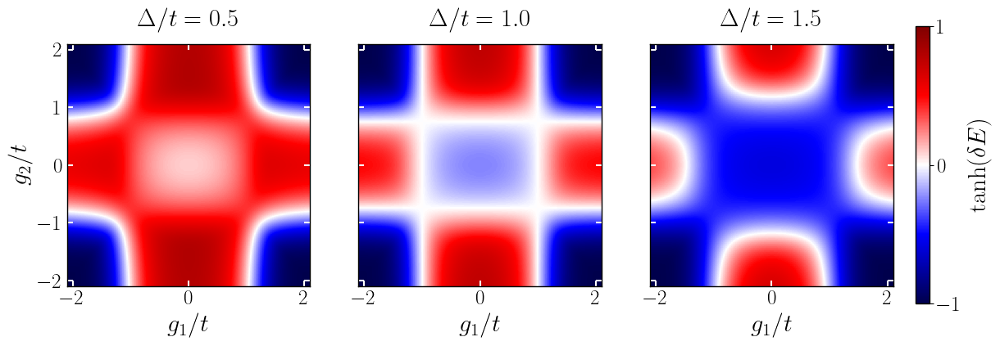

In [ ]:
# ══════════════════════════════════════════════════════════════════
#  Graficación — solo paridad hmap_p
# ══════════════════════════════════════════════════════════════════

extent = [lam1_arr[0], lam1_arr[-1], lam2_arr[0], lam2_arr[-1]]
xlabel = r'$g_1/t$'
ylabel = r'$g_2/t$'

fig_par, axes_par = plt.subplots(1, 3, figsize=(14, 5.5))
print(f'Paridad fermiónica del estado base\n$M={M}$, $t={t}$, $\\omega_0={omega1}$')

for idx, Delta in enumerate(Delta_vals):
    hmap_p = results_lam[Delta]

    ax2 = axes_par[idx]
    im2 = ax2.imshow(np.tanh(hmap_p), origin='lower', aspect='equal',
                     extent=extent, cmap='seismic', vmin=-1.0, vmax=1.0)
    ax2.tick_params(axis='x', direction='in', bottom=True, top=True,
                    right=True, left=True, color='white', size=5, width=1.5)
    ax2.tick_params(axis='y', direction='in', right=True, left=True,
                    color='white', size=5, width=1.5, labelleft=False)
    ax2.set(xlabel=xlabel, ylabel=ylabel)
    ax2.set_title(f'$\\Delta/t = {Delta}$', pad=15)

    if idx != 0:
        ax2.set_ylabel('')

axes_par[0].tick_params(axis='y', direction='in', right=True, left=True,
                        color='white', size=5, width=1.5, labelleft=True)

fig_par.colorbar(im2, ax=axes_par.ravel().tolist(),
                 label=r'$\tanh(\delta E)$',
                 fraction=0.046, pad=0.025,
                 ticks=[-1, 0, 1], shrink=0.8)
plt.show()

# Variatonal method

## Functions

In [22]:
# ══════════════════════════════════════════════════════════════════
#  FUNCIONES VARIACIONALES Y EXACTAS — CASO ANISOTRÓPICO (λ₁≠λ₂)
#
#  Ansatz de 4 parámetros por sector: (α₁,α₂,r₁,r₂) para el impar,
#  (β₁,β₂,ξ₁,ξ₂) para el par. 
#  Desplazamiento efectivo Λ=√(λ₁²+λ₂²); σ=+1 impar, σ=−1 par.
#
#  Globales requeridas: omega0, disp_matrix, squeezed_vacuum, eigh, minimize.
# ══════════════════════════════════════════════════════════════════

def _Lambda(lam1, lam2):
    return np.sqrt(lam1**2 + lam2**2)

def _M_aniso(lam1, lam2):
    """Truncación de Fock adaptada a Λ (el desplazamiento efectivo)."""
    Lam = _Lambda(lam1, lam2)
    return int(min(170, max(40, np.ceil(4.0*Lam*Lam) + 25)))

# ─────────────────────────────────────────────────────────────────
#  FUNCIONAL DE ENERGÍA GENERAL (4 parámetros)
#  E_s con eps=ε, epsp=ε', s=acoplamiento (t o Δ), sigma=±1
# ─────────────────────────────────────────────────────────────────
def energy_grad_general(x, eps, epsp, s, Lam, sigma):
    """E_s(a1,a2,r1,r2) y gradiente analítico. σ=+1 impar, σ=−1 par."""
    a1, a2, r1, r2 = x
    s1, s2 = np.sinh(r1)**2, np.sinh(r2)**2
    P   = 0.5*omega0*(a1*a1 + a2*a2 + s1 + s2)
    dlt = 0.5*(eps - epsp) + 0.5*omega0*(a1*a1 - a2*a2 + s1 - s2)
    rho = r2 - r1
    arg = sigma*Lam + a2 - a1
    Dd  = 1.0 + np.exp(2*rho)
    g   = arg*arg*np.exp(2*r2)/Dd
    F   = np.exp(-g)/np.sqrt(np.cosh(rho))
    R   = np.sqrt(dlt*dlt + s*s*F*F)
    E   = 0.5*(eps + epsp) + P - R

    # gradientes
    dP  = np.array([omega0*a1, omega0*a2,
                    0.5*omega0*np.sinh(2*r1), 0.5*omega0*np.sinh(2*r2)])
    ddl = np.array([omega0*a1, -omega0*a2,
                    0.5*omega0*np.sinh(2*r1), -0.5*omega0*np.sinh(2*r2)])
    # ∂g/∂(a1,a2,r1,r2)
    dg  = np.array([-2*arg*np.exp(2*r2)/Dd,          # ∂/∂a1 (arg tiene −a1)
                     2*arg*np.exp(2*r2)/Dd,          # ∂/∂a2 (arg tiene +a2)
                     2*g*np.exp(2*rho)/Dd,           # ∂/∂r1 (rho=r2−r1 ⇒ ∂Dd/∂r1)
                     2*g - 2*g*np.exp(2*rho)/Dd])    # ∂/∂r2 (e^{2r2} y Dd)
    th  = np.tanh(rho)
    # ∂F/∂x = F·(−∂g/∂x) + F·(½ th)·∂rho/∂x ; rho=r2−r1 ⇒ ∂rho/∂r1=−1,∂rho/∂r2=+1
    dF  = np.array([F*(-dg[0]),
                    F*(-dg[1]),
                    F*(-dg[2] + 0.5*th),
                    F*(-dg[3] - 0.5*th)])
    gr  = dP if R < 1e-300 else dP - (dlt*ddl + s*s*F*dF)/R
    return E, gr

# ─────────────────────────────────────────────────────────────────
#  MINIMIZACIÓN por sector
# ─────────────────────────────────────────────────────────────────
def _minimize_sector(eps, epsp, s, Lam, sigma, x_warm=None):
    h = 0.5*Lam
    seeds = [(0,0,0,0), (-h,h,-0.1,-0.1), (h,-h,-0.1,-0.1), (-h,h,0,0),
             (0,0,-0.1,-0.1), (-Lam,0,-0.1,-0.1), (0,Lam,-0.1,-0.1),
             (h,-h,0,0), (0.5*Lam,-0.5*Lam,-0.2,-0.2)]
    if x_warm is not None:
        seeds = [tuple(x_warm)] + seeds
    bnd = [(-Lam-1, Lam+1)]*2 + [(-1.5, 1.5)]*2
    lo = [b[0] for b in bnd]; hi = [b[1] for b in bnd]
    bestE, bestx = np.inf, None
    for sd in seeds:
        x0 = np.clip(np.array(sd, float), lo, hi)
        res = minimize(energy_grad_general, x0, args=(eps, epsp, s, Lam, sigma),
                       jac=True, method='L-BFGS-B', bounds=bnd,
                       options={'ftol': 1e-14, 'gtol': 1e-11, 'maxiter': 800})
        if res.fun < bestE:
            bestE, bestx = res.fun, res.x
    return bestE, bestx

def minimize_odd_aniso(lam1, lam2, eps1, eps2, x_warm=None):
    """Sector impar: ε=ε̃₁, ε'=ε̃₂, s=t, σ=+1."""
    Lam  = _Lambda(lam1, lam2)
    e1t  = eps1 - lam1**2 * omega0
    e2t  = eps2 - lam2**2 * omega0
    return _minimize_sector(e1t, e2t, t, Lam, +1.0, x_warm)

def minimize_even_aniso(lam1, lam2, eps1, eps2, Delta, x_warm=None):
    """Sector par: ε=0, ε'=ε̃₁+ε̃₂, s=Δ, σ=−1."""
    Lam  = _Lambda(lam1, lam2)
    e1t  = eps1 - lam1**2 * omega0
    e2t  = eps2 - lam2**2 * omega0
    return _minimize_sector(0.0, e1t + e2t, Delta, Lam, -1.0, x_warm)

# ─────────────────────────────────────────────────────────────────
#  ENERGÍAS EXACTAS por sector (diagonalización rel/CoM, 1 modo acoplado)
# ─────────────────────────────────────────────────────────────────
def E_odd_exact_aniso(lam1, lam2, eps1, eps2, M=None):
    if M is None: M = _M_aniso(lam1, lam2)
    Lam = _Lambda(lam1, lam2)
    e1t = eps1 - lam1**2 * omega0
    e2t = eps2 - lam2**2 * omega0
    n1  = M + 1
    DL  = disp_matrix(M, Lam)
    n   = np.diag(np.arange(n1)*omega0)
    H = np.zeros((2*n1, 2*n1))
    H[:n1, :n1] = e1t*np.eye(n1) + n
    H[n1:, n1:] = e2t*np.eye(n1) + n
    H[:n1, n1:] = t*DL;  H[n1:, :n1] = t*DL.T
    return np.linalg.eigvalsh(H)[0]

def E_even_exact_aniso(lam1, lam2, eps1, eps2, Delta, M=None):
    if M is None: M = _M_aniso(lam1, lam2)
    Lam = _Lambda(lam1, lam2)
    e1t = eps1 - lam1**2 * omega0
    e2t = eps2 - lam2**2 * omega0
    n1  = M + 1
    DL  = disp_matrix(M, Lam)
    n   = np.diag(np.arange(n1)*omega0)
    H = np.zeros((2*n1, 2*n1))
    H[:n1, :n1] = n
    H[n1:, n1:] = (e1t + e2t)*np.eye(n1) + n
    H[:n1, n1:] = Delta*DL.T;  H[n1:, :n1] = Delta*DL
    return np.linalg.eigvalsh(H)[0]

# ─────────────────────────────────────────────────────────────────
#  FIDELIDADES por sector
# ─────────────────────────────────────────────────────────────────
def _weights_2x2(A, B, C):
    """Pesos (c1,c2) normalizados del menor autovalor de [[A,C],[C,B]]."""
    Emin = 0.5*(A+B) - np.sqrt(0.25*(A-B)**2 + C*C)
    c1, c2 = C, (Emin - A)
    nn = np.hypot(c1, c2)
    return c1/nn, c2/nn

def fidelity_odd_aniso(lam1, lam2, eps1, eps2, x, M=None):
    """|<ψ_exact|ψ_var>|² sector impar. x=(α₁,α₂,r₁,r₂)."""
    if M is None: M = _M_aniso(lam1, lam2)
    Lam = _Lambda(lam1, lam2)
    e1t = eps1 - lam1**2 * omega0
    e2t = eps2 - lam2**2 * omega0
    n1  = M + 1
    DL  = disp_matrix(M, Lam)
    n   = np.diag(np.arange(n1)*omega0)
    H = np.zeros((2*n1, 2*n1))
    H[:n1, :n1] = e1t*np.eye(n1) + n
    H[n1:, n1:] = e2t*np.eye(n1) + n
    H[:n1, n1:] = t*DL;  H[n1:, :n1] = t*DL.T
    _, V = eigh(H); psi_ex = V[:, 0]

    a1, a2, r1, r2 = x
    phi1 = disp_matrix(M, a1) @ squeezed_vacuum(M, r1)
    phi2 = disp_matrix(M, a2) @ squeezed_vacuum(M, r2)
    A = e1t + omega0*(a1*a1 + np.sinh(r1)**2)
    B = e2t + omega0*(a2*a2 + np.sinh(r2)**2)
    rho = r2 - r1; arg = Lam + a2 - a1
    F = np.exp(-arg*arg*np.exp(2*r2)/(1+np.exp(2*rho)))/np.sqrt(np.cosh(rho))
    c1, c2 = _weights_2x2(A, B, t*F)
    psi_var = np.concatenate([c1*phi1, c2*phi2]); psi_var /= np.linalg.norm(psi_var)
    return abs(np.vdot(psi_ex, psi_var))**2

def fidelity_even_aniso(lam1, lam2, eps1, eps2, Delta, x, M=None):
    """|<ψ_exact|ψ_var>|² sector par. x=(β₁,β₂,ξ₁,ξ₂)."""
    if M is None: M = _M_aniso(lam1, lam2)
    Lam = _Lambda(lam1, lam2)
    e1t = eps1 - lam1**2 * omega0
    e2t = eps2 - lam2**2 * omega0
    n1  = M + 1
    DL  = disp_matrix(M, Lam)
    n   = np.diag(np.arange(n1)*omega0)
    H = np.zeros((2*n1, 2*n1))
    H[:n1, :n1] = n
    H[n1:, n1:] = (e1t + e2t)*np.eye(n1) + n
    H[:n1, n1:] = Delta*DL.T;  H[n1:, :n1] = Delta*DL
    _, V = eigh(H); psi_ex = V[:, 0]

    b1, b2, x1, x2 = x
    phi1 = disp_matrix(M, b1) @ squeezed_vacuum(M, x1)
    phi2 = disp_matrix(M, b2) @ squeezed_vacuum(M, x2)
    A = 0.0        + omega0*(b1*b1 + np.sinh(x1)**2)
    B = (e1t+e2t)  + omega0*(b2*b2 + np.sinh(x2)**2)
    rho = x2 - x1
    arg = -Lam + b2 - b1          # ← corregido (antes: b1 - b2)
    F = np.exp(-arg*arg*np.exp(2*x2)/(1+np.exp(2*rho)))/np.sqrt(np.cosh(rho))
    c1, c2 = _weights_2x2(A, B, Delta*F)
    psi_var = np.concatenate([c1*phi1, c2*phi2]); psi_var /= np.linalg.norm(psi_var)
    return abs(np.vdot(psi_ex, psi_var))**2

    
def squeezed_vacuum(M, r):
    """S(r)|0> en base de Fock, convención S(r)=exp[r/2(â²−â†²)]. Estable vía C(2k,k)."""
    vec  = np.zeros(M + 1)
    pref = 1.0 / np.sqrt(np.cosh(r))
    th   = np.tanh(r)
    for k in range(M // 2 + 1):
        if 2*k <= M:
            vec[2*k] = pref * ((-th)**k) * np.sqrt(float(_C(2*k, k))) / (2.0**k)
    return vec


def _Mof_Lam(Lam):
    return int(min(170, max(50, np.ceil(4.0*Lam*Lam) + 25)))


## Variational

In [ ]:
# ─── parámetros del sistema ──────────────────────────────────────
t        = 1.0
omega0   = 1.0
eps1_val = 0.25
eps2_val = 0.25
_S2      = np.sqrt(2.0)

# ─── malla (λ/t, Δ/t) ────────────────────────────────────────────
n_lam, n_Delta = 200, 200
lam_arr   = np.linspace(0.0, 1.5, n_lam)     # λ/t  (λ₁=λ₂=λ)
Delta_arr = np.linspace(0.0, 1.5, n_Delta)   # Δ/t

# ─── E_o(λ): sector impar NO depende de Δ (1D, warm start) ───────
E_odd_1d = np.empty(n_lam)
warm = None
for k, lam in enumerate(lam_arr):
    E, x = minimize_odd_aniso(lam, lam, eps1_val, eps2_val, x_warm=warm)
    warm = x
    E_odd_1d[k] = E
print("E_o (1D) listo.")

# ─── E_e(λ,Δ): barrido 2D, una fila por Δ con continuación en λ ──
def _even_row(Delta):
    row = np.empty(n_lam); w = None
    for k, lam in enumerate(lam_arr):
        E, x = minimize_even_aniso(lam, lam, eps1_val, eps2_val, Delta, x_warm=w)
        w = x
        row[k] = E
    return row

print(f"Grid {n_lam}×{n_Delta}: calculando E_e ...")
E_even_2d = np.empty((n_Delta, n_lam))
chunks = np.array_split(np.arange(n_Delta), 20)
done = 0
with joblib.parallel_backend('loky', n_jobs=-1):
    for idx in chunks:
        res = joblib.Parallel()(joblib.delayed(_even_row)(Delta_arr[i]) for i in idx)
        for i, row in zip(idx, res):
            E_even_2d[i] = row
        done += len(idx)
        print(f"  E_e: {100.0*done/n_Delta:5.1f}% completado")

# ─── splitting δE = E_e − E_o ────────────────────────────────────
dE = E_even_2d - E_odd_1d[None, :]
print("δE: min=%.4f  max=%.4f" % (dE.min(), dE.max()))

KeyboardInterrupt: 

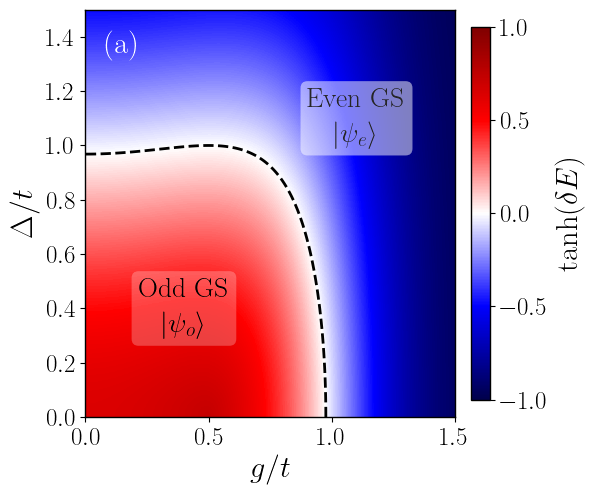

Parity Splitting $\delta E = E^e_0 - E^o_0$  (anisotrópico)
$t=1.0,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ \omega_0=1.0$


In [ ]:
# ══════════════════════════════════════════════════════════════════
#  GRAFICACIÓN
# ══════════════════════════════════════════════════════════════════
extent    = [lam_arr[0], lam_arr[-1], Delta_arr[0], Delta_arr[-1]]
xlabel    = r'$g/t$'
ylabel    = r'$\Delta/t$'
param_str = rf"$t={t:.1f},\ \varepsilon_1={eps1_val},\ \varepsilon_2={eps2_val:.4f},\ \omega_0={omega0}$"
norm_p    = TwoSlopeNorm(vmin=-1.0, vcenter=0.0, vmax=1.0)

fig, ax = plt.subplots(figsize=(6.5, 5.5))
im = ax.imshow(np.tanh(dE), origin='lower', aspect='auto',
               extent=extent, cmap='seismic', norm=norm_p)
cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=r'$\tanh(\delta E)$')

ax.contour(lam_arr, Delta_arr, dE, levels=[0.0], colors='k',
           linewidths=2.0, alpha=1.0, linestyles='--')
ax.set(xlabel=xlabel, ylabel=ylabel)

import matplotlib.patheffects as pe

ax.text(1.1, 1.1, r'\begin{center} Even GS \\ $|\psi_e\rangle$ \end{center}',
        fontsize=20, color='0.15', ha='center', va='center',
        bbox=dict(facecolor='white', alpha=0.5, edgecolor='none',
                  pad=5, boxstyle='round,pad=0.25'))

ax.text(0.4, 0.4, r'\begin{center} Odd GS \\ $|\psi_o\rangle$ \end{center}',
        fontsize=20, color='black', ha='center', va='center',
        bbox=dict(facecolor='white', alpha=0.25, edgecolor='none',
                  pad=5, boxstyle='round,pad=0.25'))

ax.text(0.15, 0.95, '(a)', transform=ax.transAxes, ha='right', va='top',
        fontweight='bold', color='white')

plt.tight_layout()
plt.savefig('Resultados_aniso/Parity_Splitting_aniso.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()

print(r'Parity Splitting $\delta E = E^e_0 - E^o_0$  (anisotrópico)')
print(param_str)

In [ ]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE EJECUCIÓN — caso ANISOTRÓPICO, eje = Λ, anisotropía δλ fija
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
eps1_val = 0.25
eps2_val = 0.25
_S2      = np.sqrt(2.0)

cv_list = [0.5, 1.0, 1.5]       

# eje de control: Λ = √(λ₁²+λ₂²)
n_Lam   = 200
Lam_arr = np.linspace(0.01, 4.0*np.sqrt(2), n_Lam)


# diccionarios indexados por δλ ------------------------------------
a1_o = {}; a2_o = {}; r1_o = {}; r2_o = {}; Evar_o = {}; Eex_o = {}; fid_o = {}; rel_o = {}
a1_e = {}; a2_e = {}; r1_e = {}; r2_e = {}; Evar_e = {}; Eex_e = {}; fid_e = {}; rel_e = {}
lam1_rec = {}; lam2_rec = {}      # λ₁,λ₂ reconstruidos por si los quieres

for cv in cv_list:
    t = cv
    A1o=np.full(n_Lam,np.nan); A2o=np.full(n_Lam,np.nan)
    R1o=np.full(n_Lam,np.nan); R2o=np.full(n_Lam,np.nan)
    Evo=np.full(n_Lam,np.nan); Eeo=np.full(n_Lam,np.nan)
    Fo =np.full(n_Lam,np.nan); Reo=np.full(n_Lam,np.nan)
    A1e=np.full(n_Lam,np.nan); A2e=np.full(n_Lam,np.nan)
    R1e=np.full(n_Lam,np.nan); R2e=np.full(n_Lam,np.nan)
    Eve=np.full(n_Lam,np.nan); Eee=np.full(n_Lam,np.nan)
    Fe =np.full(n_Lam,np.nan); Ree=np.full(n_Lam,np.nan)
    L1 =np.full(n_Lam,np.nan); L2 =np.full(n_Lam,np.nan)

    warm_o = warm_e = None
    for k, Lam in enumerate(Lam_arr):
        lam1, lam2 = Lam_to_lam12(Lam, 0)
        if np.isnan(lam1):
            continue
        L1[k], L2[k] = lam1, lam2
        
        M = _Mof_Lam(Lam)

        # ----- SECTOR IMPAR -----
        E, x = minimize_odd_aniso(lam1, lam2, eps1_val, eps2_val, x_warm=warm_o)
        warm_o = x
        A1o[k], A2o[k], R1o[k], R2o[k] = x
        Evo[k] = E
        Eeo[k] = E_odd_exact_aniso(lam1, lam2, eps1_val, eps2_val, M=M)
        Fo[k]  = fidelity_odd_aniso(lam1, lam2, eps1_val, eps2_val, x, M=M)
        Reo[k] = abs(E - Eeo[k]) / abs(Eeo[k]) if abs(Eeo[k])>1e-12 else np.nan

        # ----- SECTOR PAR -----
        Delta_val = cv
        E, x = minimize_even_aniso(lam1, lam2, eps1_val, eps2_val, Delta_val, x_warm=warm_e)
        warm_e = x
        A1e[k], A2e[k], R1e[k], R2e[k] = x
        Eve[k] = E
        Eee[k] = E_even_exact_aniso(lam1, lam2, eps1_val, eps2_val, Delta_val, M=M)
        Fe[k]  = fidelity_even_aniso(lam1, lam2, eps1_val, eps2_val, Delta_val, x, M=M)
        Ree[k] = abs(E - Eee[k]) / abs(Eee[k]) if abs(Eee[k])>1e-12 else np.nan

    a1_o[cv]=A1o; a2_o[cv]=A2o; r1_o[cv]=R1o; r2_o[cv]=R2o
    Evar_o[cv]=Evo; Eex_o[cv]=Eeo; fid_o[cv]=Fo; rel_o[cv]=Reo
    a1_e[cv]=A1e; a2_e[cv]=A2e; r1_e[cv]=R1e; r2_e[cv]=R2e
    Evar_e[cv]=Eve; Eex_e[cv]=Eee; fid_e[cv]=Fe; rel_e[cv]=Ree
    lam1_rec[cv]=L1; lam2_rec[cv]=L2

print("Ejecución  lista.")

Ejecución  lista.


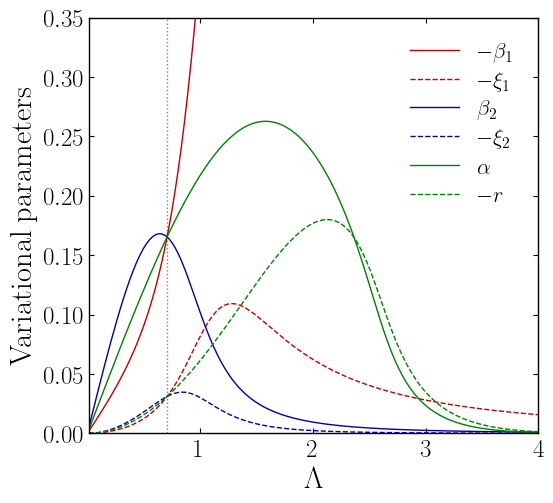

Optimal parameters (even), $\delta\lambda=0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.250,\ \Delta/\omega_0=0.5$


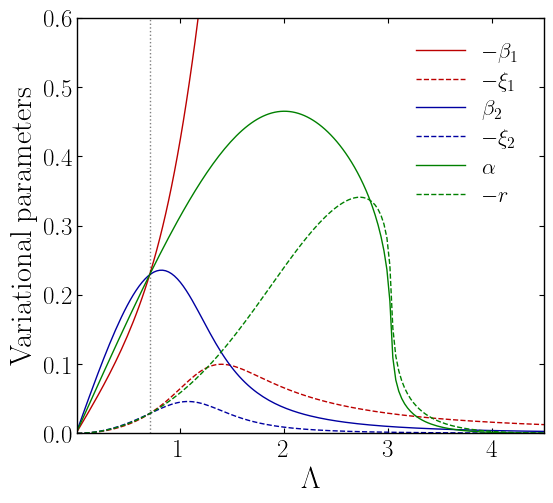

Optimal parameters (even), $\delta\lambda=0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.250,\ \Delta/\omega_0=1.0$


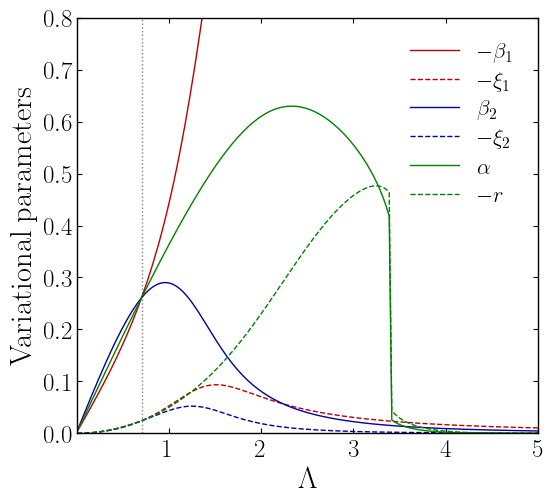

Optimal parameters (even), $\delta\lambda=0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.250,\ \Delta/\omega_0=1.5$


In [ ]:
# ══════════════════════════════════════════════════════════════════
# GRAFICACIÓN — parámetros, fidelidad, error (eje = Λ)
# ══════════════════════════════════════════════════════════════════
C_A = plt.cm.seismic(0.12)   # azul  (bloque 2)
C_B = plt.cm.seismic(0.88)   # rojo  (bloque 1)
COLS = [plt.cm.seismic(0.12), plt.cm.seismic(0.6), plt.cm.seismic(0.88)]
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

ylim_by_cv = {0.5: 0.35, 1.0: 0.6, 1.5: 0.8}
xlim_by_cv = {0.5: 4.0, 1.0: 4.5, 1.5: 5.0}

# ── (1) Parámetros variacionales ──────
for cv in cv_list:
    pstr = rf"$\delta\lambda={0},\ \varepsilon_1={eps1_val},\ \varepsilon_2={eps2_val:.3f},\ \Delta/\omega_0={cv}$"
    fig, ax = plt.subplots(figsize=(6, 5.5))
    ax.plot(Lam_arr, -a1_e[cv], '-',  color=C_B, lw=1.0, label=r'$-\beta_1$')
    ax.plot(Lam_arr, -r1_e[cv], '--', color=C_B, lw=1.0, label=r'$-\xi_1$')
    ax.plot(Lam_arr,  a2_e[cv], '-',  color=C_A, lw=1.0, label=r'$\beta_2$')
    ax.plot(Lam_arr, -r2_e[cv], '--', color=C_A, lw=1.0, label=r'$-\xi_2$')
    ax.plot(Lam_arr, a1_o[cv], '-',  color='green', lw=1.0, label=r'$\alpha$')
    ax.plot(Lam_arr, -r1_o[cv], '--', color='green', lw=1.0, label=r'$-r$')
    ax.axvline(0.5*np.sqrt(2), color='k', lw=1.0, ls=':', alpha=0.5)
    ax.set_xlim(Lam_arr[0], xlim_by_cv[cv])
    ax.set_ylim(0.0, ylim_by_cv[cv])
    ax.set_xlabel(r'$\Lambda$'); ax.set_ylabel(r'Variational parameters')
    ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
    ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False,
              borderpad=0.6, handlelength=2.2, labelspacing=0.4)
    plt.tight_layout()
    plt.savefig(f'Resultados_aniso/Optimal_parameters_iso_s{cv}_even.png',
                bbox_inches='tight', transparent=False, dpi=300)
    plt.show()
    print('Optimal parameters (even), ' + pstr)

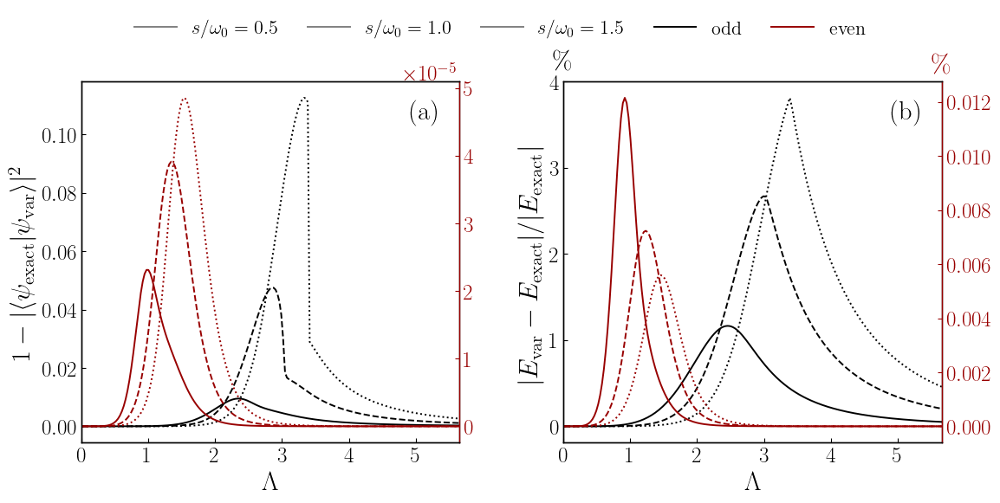

Fidelity by sector, omega_0=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.250
Relative error by sector, omega_0=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.250


In [ ]:
LS = {0.5: '-', 1.0: '--', 1.5: ':'}
C_ODD = 'black'
C_EVEN = plt.cm.seismic(0.95)   # rojo intenso

fid_o_err = {cv: 1.0 - fid_o[cv] for cv in cv_list}
fid_e_err = {cv: 1.0 - fid_e[cv] for cv in cv_list}


fig, (ax_o1, ax_o2) = plt.subplots(1, 2, figsize=(12, 6))

# ═══════════════════════════════════════════════════════════════
# Panel (a): Fidelidad
# ═══════════════════════════════════════════════════════════════
ax_e1 = ax_o1.twinx()

for cv in cv_list:
    ax_o1.plot(Lam_arr, fid_o_err[cv], LS[cv], color=C_ODD, lw=1.4)
    ax_e1.plot(Lam_arr, fid_e_err[cv], LS[cv], color=C_EVEN, lw=1.4)

ax_o1.set_xlabel(r'$\Lambda$')
ax_o1.set_ylabel(r'$1-|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$',
                 color=C_ODD)
ax_o1.tick_params(axis='y', colors=C_ODD,  direction='in')
ax_o1.tick_params(axis='x', direction='in')
ax_o1.set_xlim(Lam_arr[0], Lam_arr[-1])

ax_e1.tick_params(axis='y', colors=C_EVEN, direction='in')
ax_e1.spines['right'].set_color(C_EVEN)
ax_e1.spines['left'].set_color(C_ODD)

ax_o1.text(0.95, 0.95, '(a)', transform=ax_o1.transAxes,
           ha='right', va='top', fontweight='bold')

ax_o1.set_xticks([0, 1, 2, 3, 4, 5])

# ═══════════════════════════════════════════════════════════════
# Panel (b): Error relativo
# ═══════════════════════════════════════════════════════════════
ax_e2 = ax_o2.twinx()

for cv in cv_list:
    ax_o2.plot(Lam_arr, 100*rel_o[cv], LS[cv], color=C_ODD,  lw=1.4)
    ax_e2.plot(Lam_arr, 100*rel_e[cv], LS[cv], color=C_EVEN, lw=1.4)

ax_o2.set_xlabel(r'$\Lambda$')
ax_o2.set_ylabel(r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
                 color=C_ODD)
ax_o2.tick_params(axis='y', colors=C_ODD,  direction='in')
ax_o2.tick_params(axis='x', direction='in')
ax_o2.set_xlim(Lam_arr[0], Lam_arr[-1])
ax_o2.text(0.0, 1.02, r'$\%$', transform=ax_o2.transAxes,
           color=C_ODD, ha='center', va='bottom')

ax_e2.tick_params(axis='y', colors=C_EVEN, direction='in')
ax_e2.spines['right'].set_color(C_EVEN)
ax_e2.spines['left'].set_color(C_ODD)
ax_e2.text(1.0, 1.01, r'$\%$', transform=ax_e2.transAxes,
           color=C_EVEN, ha='center', va='bottom')

ax_o2.text(0.95, 0.95, '(b)', transform=ax_o2.transAxes,
           ha='right', va='top', fontweight='bold')

ax_o2.set_xticks([0, 1, 2, 3, 4, 5])

# ═══════════════════════════════════════════════════════════════
# Leyenda compartida — a la derecha de la figura
# ═══════════════════════════════════════════════════════════════
handles = [mlines.Line2D([], [], color='gray', ls='-', lw=1.4,
                         label=rf'$s/\omega_0={cv/omega0}$') for cv in cv_list]
handles += [mlines.Line2D([], [], color=C_ODD,  lw=1.4, label='odd'),
            mlines.Line2D([], [], color=C_EVEN, lw=1.4, label='even')]

fig.legend(handles=handles,
           loc='upper center',
           bbox_to_anchor=(0.5,1.01),     # centrada sobre la figura
           ncol=len(handles),               # una sola fila
           frameon=False,
           borderpad=0.6, handlelength=2.2, labelspacing=0.4, columnspacing=1.5)

plt.tight_layout()
plt.subplots_adjust(top=0.85)              # espacio para la leyenda arriba
plt.savefig(f'Resultados_aniso/Fidelidad_y_error_relativo_por_sector.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()


print(r'Fidelity by sector, ' + rf'omega_0={omega0},\ \varepsilon_1={eps1_val},\ \varepsilon_2={eps2_val:.3f}')
print(r'Relative error by sector, ' + rf'omega_0={omega0},\ \varepsilon_1={eps1_val},\ \varepsilon_2={eps2_val:.3f}')

In [ ]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE EJECUCIÓN — caso ANISOTRÓPICO, eje = Λ, anisotropía ρ fija
#                       + barrido en s/ω0 (t para impar, Δ para par)
#   NOTA: la variable de bucle se llama 'dlam' por compatibilidad,
#         pero representa ρ = λ₁/λ₂  (dlam_list contiene valores de ρ).
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
eps1_val = 0.25
eps2_val = 0.25
_S2      = np.sqrt(2.0)

# valores de ρ = λ₁/λ₂ (anisotropía relativa, fija por curva)
dlam_list = [1.0]        # 1.0 = isotrópico (λ₁=λ₂)

# valores de acoplamiento s/ω0 (t para impar, Δ para par)
cv_list = [0.5, 1.0, 1.5]

# eje de control: Λ = √(λ₁²+λ₂²)
n_Lam   = 120
Lam_arr = np.linspace(0.01, 4.0*np.sqrt(2), n_Lam)

# (Λ, ρ) → (λ₁, λ₂) con ρ=λ₁/λ₂, Λ²=λ₁²+λ₂²
def Lam_rho_to_lam12(Lam, rho):
    lam2 = Lam / np.sqrt(1.0 + rho**2)
    lam1 = rho * lam2
    return lam1, lam2

# diccionarios indexados por (dlam, cv) ------------------------------------
a1_o = {}; a2_o = {}; r1_o = {}; r2_o = {}; Evar_o = {}; Eex_o = {}; fid_o = {}; rel_o = {}
a1_e = {}; a2_e = {}; r1_e = {}; r2_e = {}; Evar_e = {}; Eex_e = {}; fid_e = {}; rel_e = {}
lam1_rec = {}; lam2_rec = {}      # λ₁,λ₂ reconstruidos por si los quieres

for dlam in dlam_list:            # dlam ≡ ρ
    rho = dlam
    for cv in cv_list:
        t = cv
        Delta_val = cv

        A1o=np.full(n_Lam,np.nan); A2o=np.full(n_Lam,np.nan)
        R1o=np.full(n_Lam,np.nan); R2o=np.full(n_Lam,np.nan)
        Evo=np.full(n_Lam,np.nan); Eeo=np.full(n_Lam,np.nan)
        Fo =np.full(n_Lam,np.nan); Reo=np.full(n_Lam,np.nan)
        A1e=np.full(n_Lam,np.nan); A2e=np.full(n_Lam,np.nan)
        R1e=np.full(n_Lam,np.nan); R2e=np.full(n_Lam,np.nan)
        Eve=np.full(n_Lam,np.nan); Eee=np.full(n_Lam,np.nan)
        Fe =np.full(n_Lam,np.nan); Ree=np.full(n_Lam,np.nan)
        L1 =np.full(n_Lam,np.nan); L2 =np.full(n_Lam,np.nan)

        warm_o = warm_e = None
        for k, Lam in enumerate(Lam_arr):
            lam1, lam2 = Lam_rho_to_lam12(Lam, rho)
            if np.isnan(lam1):
                continue
            L1[k], L2[k] = lam1, lam2
            M = _Mof_Lam(Lam)

            # ----- SECTOR IMPAR -----
            E, x = minimize_odd_aniso(lam1, lam2, eps1_val, eps2_val, x_warm=warm_o)
            warm_o = x
            A1o[k], A2o[k], R1o[k], R2o[k] = x
            Evo[k] = E
            Eeo[k] = E_odd_exact_aniso(lam1, lam2, eps1_val, eps2_val, M=M)
            Fo[k]  = fidelity_odd_aniso(lam1, lam2, eps1_val, eps2_val, x, M=M)
            Reo[k] = abs(E - Eeo[k]) / abs(Eeo[k]) if abs(Eeo[k])>1e-12 else np.nan

            # ----- SECTOR PAR -----
            E, x = minimize_even_aniso(lam1, lam2, eps1_val, eps2_val, Delta_val, x_warm=warm_e)
            warm_e = x
            A1e[k], A2e[k], R1e[k], R2e[k] = x
            Eve[k] = E
            Eee[k] = E_even_exact_aniso(lam1, lam2, eps1_val, eps2_val, Delta_val, M=M)
            Fe[k]  = fidelity_even_aniso(lam1, lam2, eps1_val, eps2_val, Delta_val, x, M=M)
            Ree[k] = abs(E - Eee[k]) / abs(Eee[k]) if abs(Eee[k])>1e-12 else np.nan

        key = (dlam, cv)
        a1_o[key]=A1o; a2_o[key]=A2o; r1_o[key]=R1o; r2_o[key]=R2o
        Evar_o[key]=Evo; Eex_o[key]=Eeo; fid_o[key]=Fo; rel_o[key]=Reo
        a1_e[key]=A1e; a2_e[key]=A2e; r1_e[key]=R1e; r2_e[key]=R2e
        Evar_e[key]=Eve; Eex_e[key]=Eee; fid_e[key]=Fe; rel_e[key]=Ree
        lam1_rec[key]=L1; lam2_rec[key]=L2

        print(f"ρ={dlam}, s/ω0={cv}: barrido listo")

print("Ejecución anisotrópica lista.")

ρ=1.0, s/ω0=0.5: barrido listo
ρ=1.0, s/ω0=1.0: barrido listo
ρ=1.0, s/ω0=1.5: barrido listo
Ejecución anisotrópica lista.


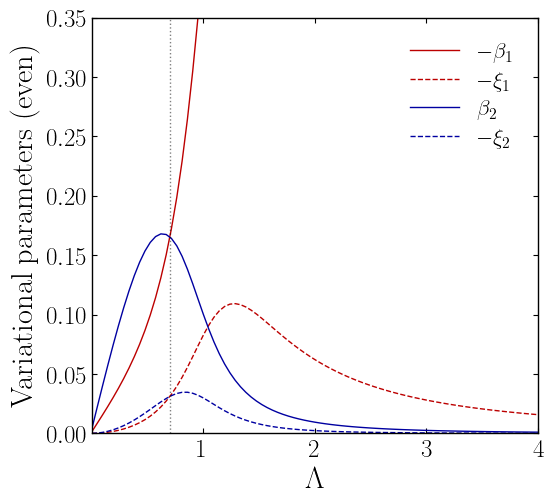

Optimal parameters (even), $\lambda_1/\lambda_2=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.250,\ \Delta/\omega_0=0.5$


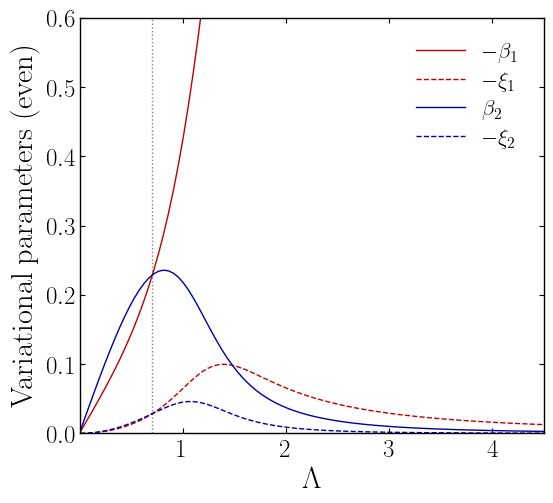

Optimal parameters (even), $\lambda_1/\lambda_2=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.250,\ \Delta/\omega_0=1.0$


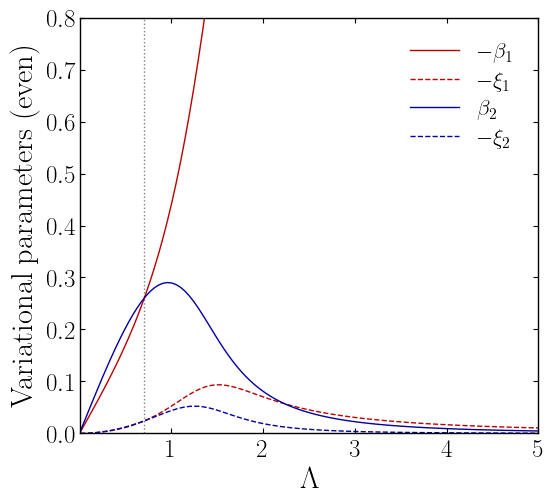

Optimal parameters (even), $\lambda_1/\lambda_2=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.250,\ \Delta/\omega_0=1.5$


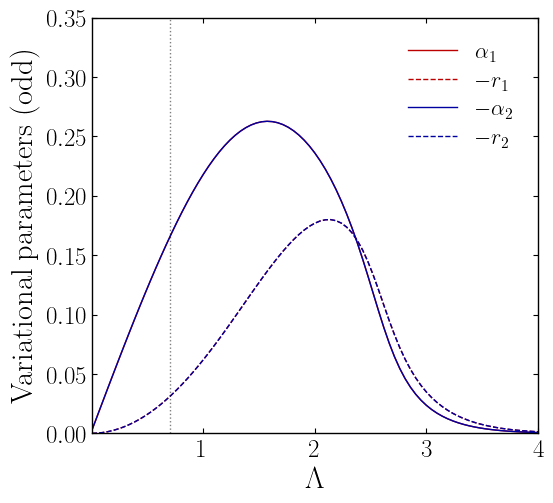

Optimal parameters (odd), $\lambda_1/\lambda_2=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.250,\ \Delta/\omega_0=0.5$


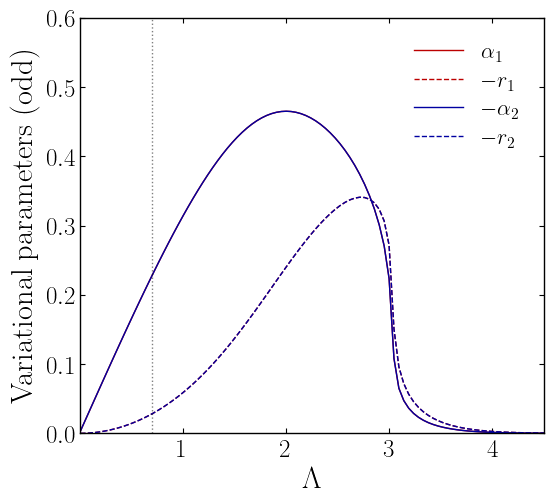

Optimal parameters (odd), $\lambda_1/\lambda_2=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.250,\ \Delta/\omega_0=1.0$


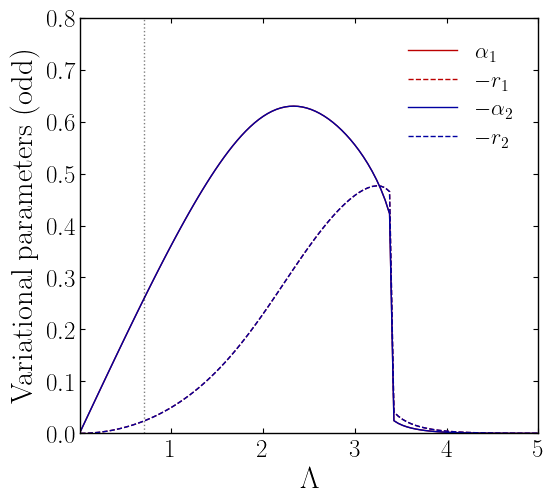

Optimal parameters (odd), $\lambda_1/\lambda_2=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.250,\ \Delta/\omega_0=1.5$


In [ ]:
# ══════════════════════════════════════════════════════════════════
# GRAFICACIÓN — parámetros, fidelidad, error (eje = Λ)
# ══════════════════════════════════════════════════════════════════
C_A = plt.cm.seismic(0.12)   # azul  (bloque 2)
C_B = plt.cm.seismic(0.88)   # rojo  (bloque 1)
COLS = [plt.cm.seismic(0.12), plt.cm.seismic(0.6), plt.cm.seismic(0.88)]
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'


ylim_by_cv = {0.5: 0.35, 1.0: 0.6, 1.5: 0.8}
xlim_by_cv = {0.5: 4.0, 1.0: 4.5, 1.5: 5.0}

# ── (1) Parámetros variacionales ──────
for dlam in dlam_list:
    for cv in cv_list:
        key = (dlam, cv)

        pstr = rf"$\lambda_1/\lambda_2={dlam},\ \varepsilon_1={eps1_val},\ \varepsilon_2={eps2_val:.3f},\ \Delta/\omega_0={cv}$"
        fig, ax = plt.subplots(figsize=(6, 5.5))
        ax.plot(Lam_arr, -a1_e[key], '-',  color=C_B, lw=1.0, label=r'$-\beta_1$')
        ax.plot(Lam_arr, -r1_e[key], '--', color=C_B, lw=1.0, label=r'$-\xi_1$')
        ax.plot(Lam_arr,  a2_e[key], '-',  color=C_A, lw=1.0, label=r'$\beta_2$')
        ax.plot(Lam_arr, -r2_e[key], '--', color=C_A, lw=1.0, label=r'$-\xi_2$')
        ax.axvline(0.5*np.sqrt(2), color='k', lw=1.0, ls=':', alpha=0.5)
        ax.set_xlim(Lam_arr[0], xlim_by_cv[cv])
        ax.set_ylim(0.0, ylim_by_cv[cv])
        ax.set_xlabel(r'$\Lambda$'); ax.set_ylabel(r'Variational parameters (even)')
        ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
        ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False,
              borderpad=0.6, handlelength=2.2, labelspacing=0.4)
        plt.tight_layout()
        plt.savefig(f'Resultados_aniso/Optimal_parameters_aniso_dl{dlam}_even.png',
                bbox_inches='tight', transparent=False, dpi=300)
        plt.show()
        print('Optimal parameters (even), ' + pstr)

# ── (1) Parámetros variacionales del IMPAR, una figura por δλ ──────
for dlam in dlam_list:
    for cv in cv_list:
        key = (dlam, cv)
        pstr = rf"$\lambda_1/\lambda_2={dlam},\ \varepsilon_1={eps1_val},\ \varepsilon_2={eps2_val:.3f},\ \Delta/\omega_0={cv}$"
        fig, ax = plt.subplots(figsize=(6, 5.5))
        ax.plot(Lam_arr, a1_o[key], '-',  color=C_B, lw=1.0, label=r'$\alpha_1$')
        ax.plot(Lam_arr, -r1_o[key], '--', color=C_B, lw=1.0, label=r'$-r_1$')
        ax.plot(Lam_arr, -a2_o[key], '-',  color=C_A, lw=1.0, label=r'$-\alpha_2$')
        ax.plot(Lam_arr, -r2_o[key], '--', color=C_A, lw=1.0, label=r'$-r_2$')
        ax.axvline(0.5*np.sqrt(2), color='k', lw=1.0, ls=':', alpha=0.5)
        ax.set_xlim(Lam_arr[0], xlim_by_cv[cv])
        ax.set_ylim(0.0, ylim_by_cv[cv])
        ax.set_xlabel(r'$\Lambda$'); ax.set_ylabel(r'Variational parameters (odd)')
        ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
        ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False,
              borderpad=0.6, handlelength=2.2, labelspacing=0.4)
        plt.tight_layout()
        plt.savefig(f'Resultados_aniso/Optimal_parameters_aniso_dl{dlam}_odd.png',
                bbox_inches='tight', transparent=False, dpi=300)
        plt.show()
        print('Optimal parameters (odd), ' + pstr)

Fidelity by sector and energy relative error, lam1/lam2=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.250


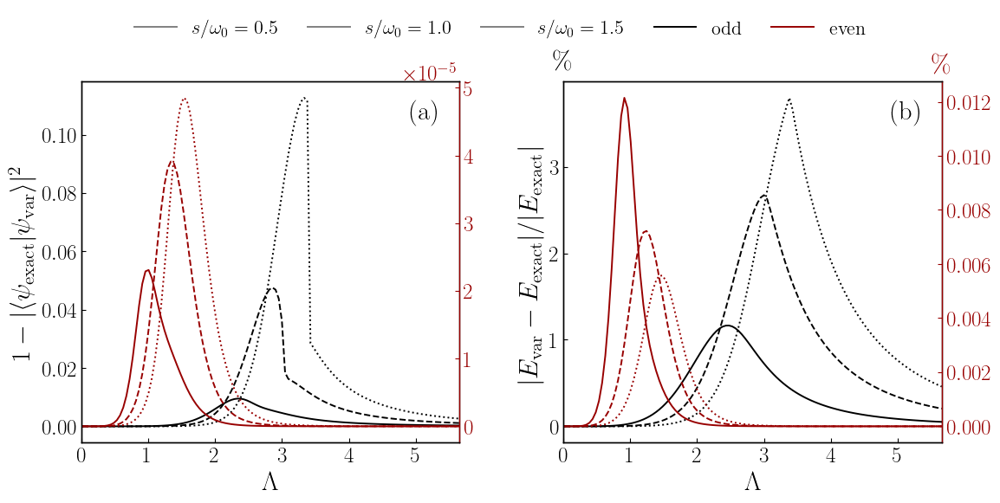

In [ ]:
LS = {0.5: '-', 1.0: '--', 1.5: ':'}
C_ODD = 'black'
C_EVEN = plt.cm.seismic(0.95)   # rojo intenso



fig, (ax_o1, ax_o2) = plt.subplots(1, 2, figsize=(12, 6))

# ═══════════════════════════════════════════════════════════════
# Panel (a): Fidelidad
# ═══════════════════════════════════════════════════════════════
ax_e1 = ax_o1.twinx()

for dlam in dlam_list:
    for cv in cv_list:
        key = (dlam, cv)
        
        
        fid_o_err = {key: 1.0 - fid_o[key] }
        fid_e_err = {key: 1.0 - fid_e[key] }

        ax_o1.plot(Lam_arr, fid_o_err[key], LS[cv], color=C_ODD, lw=1.4)
        ax_e1.plot(Lam_arr, fid_e_err[key], LS[cv], color=C_EVEN, lw=1.4)

ax_o1.set_xlabel(r'$\Lambda$')
ax_o1.set_ylabel(r'$1-|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$',
                 color=C_ODD)
ax_o1.tick_params(axis='y', colors=C_ODD,  direction='in')
ax_o1.tick_params(axis='x', direction='in')
ax_o1.set_xlim(Lam_arr[0], Lam_arr[-1])

ax_e1.tick_params(axis='y', colors=C_EVEN, direction='in')
ax_e1.spines['right'].set_color(C_EVEN)
ax_e1.spines['left'].set_color(C_ODD)

ax_o1.text(0.95, 0.95, '(a)', transform=ax_o1.transAxes,
           ha='right', va='top', fontweight='bold')

ax_o1.set_xticks([0, 1, 2, 3, 4, 5])

# ═══════════════════════════════════════════════════════════════
# Panel (b): Error relativo
# ═══════════════════════════════════════════════════════════════
ax_e2 = ax_o2.twinx()

for dlam in dlam_list:
    print(r'Fidelity by sector and energy relative error, ' + rf'lam1/lam2={dlam},\ \varepsilon_1={eps1_val},\ \varepsilon_2={eps2_val:.3f}')
    for cv in cv_list:
        key = (dlam, cv)
        ax_o2.plot(Lam_arr, 100*rel_o[key], LS[cv], color=C_ODD,  lw=1.4)
        ax_e2.plot(Lam_arr, 100*rel_e[key], LS[cv], color=C_EVEN, lw=1.4)

ax_o2.set_xlabel(r'$\Lambda$')
ax_o2.set_ylabel(r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
                 color=C_ODD)
ax_o2.tick_params(axis='y', colors=C_ODD,  direction='in')
ax_o2.tick_params(axis='x', direction='in')
ax_o2.set_xlim(Lam_arr[0], Lam_arr[-1])
ax_o2.text(0.0, 1.02, r'$\%$', transform=ax_o2.transAxes,
           color=C_ODD, ha='center', va='bottom')

ax_e2.tick_params(axis='y', colors=C_EVEN, direction='in')
ax_e2.spines['right'].set_color(C_EVEN)
ax_e2.spines['left'].set_color(C_ODD)
ax_e2.text(1.0, 1.01, r'$\%$', transform=ax_e2.transAxes,
           color=C_EVEN, ha='center', va='bottom')

ax_o2.text(0.95, 0.95, '(b)', transform=ax_o2.transAxes,
           ha='right', va='top', fontweight='bold')

ax_o2.set_xticks([0, 1, 2, 3, 4, 5])

# ═══════════════════════════════════════════════════════════════
# Leyenda compartida — a la derecha de la figura
# ═══════════════════════════════════════════════════════════════
handles = [mlines.Line2D([], [], color='gray', ls='-', lw=1.4,
                         label=rf'$s/\omega_0={cv/omega0}$') for cv in cv_list]
handles += [mlines.Line2D([], [], color=C_ODD,  lw=1.4, label='odd'),
            mlines.Line2D([], [], color=C_EVEN, lw=1.4, label='even')]

fig.legend(handles=handles,
           loc='upper center',
           bbox_to_anchor=(0.5,1.01),     # centrada sobre la figura
           ncol=len(handles),               # una sola fila
           frameon=False,
           borderpad=0.6, handlelength=2.2, labelspacing=0.4, columnspacing=1.5)

plt.tight_layout()
plt.subplots_adjust(top=0.85)              # espacio para la leyenda arriba
plt.savefig(f'Resultados_aniso/Fidelidad_y_error_relativo_por_sector.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()




In [49]:
# ══════════════════════════════════════════════════════════════════
# EJECUCIÓN — δE variacional para figura de paridad tanh(E_even − E_odd)
#   Barre Δ/t: fija t=1 (global), varía Δ = cv en el sector par.
#   Sector impar gobernado por t; sector par por Δ.
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
eps2_val = 1.25**2
eps1_val = 1.0
t_fixed  = 1.0                    # tunelaje FIJO
cv_list  = [0.5, 1.0, 1.5]        # cv = Δ  →  Δ/t = cv (con t=1)

n_lam    = 150
lam1_arr = np.linspace(-2.5, 2.5, n_lam)
lam2_arr = np.linspace(-2.5, 2.5, n_lam)

def _parity_point(i2, j1, cv):
    """δE variacional en un nodo. t fijo (global), Δ=cv en el par."""
    lam1 = lam1_arr[j1]; lam2 = lam2_arr[i2]
    Lam  = np.sqrt(lam1**2 + lam2**2); M = _Mof_Lam(Lam)
    global t; t = t_fixed                                   # ← t FIJO, no cv
    Eo, _ = minimize_odd_aniso(lam1, lam2, eps1_val, eps2_val)          # impar: usa t
    Ee, _ = minimize_even_aniso(lam1, lam2, eps1_val, eps2_val, cv)     # par: Δ=cv
    return (i2, j1, Ee - Eo)

def _blank(): return {cv: np.full((n_lam, n_lam), np.nan) for cv in cv_list}
dE = _blank()

for cv in cv_list:
    print(f"cv(Δ/t)={cv}: δE variacional {n_lam}×{n_lam} ...", flush=True)
    args = [(i2, j1, cv) for i2 in range(n_lam) for j1 in range(n_lam)]
    chunks = np.array_split(np.arange(len(args)), 20); done = 0
    with joblib.parallel_backend('loky', n_jobs=-1):
        for chunk_idx in chunks:
            batch = [args[a] for a in chunk_idx]
            res = joblib.Parallel()(joblib.delayed(_parity_point)(*a) for a in batch)
            for (i2, j1, d) in res:
                dE[cv][i2, j1] = d
            done += len(chunk_idx)
            print(f"   {100.0*done/len(args):5.1f}%", flush=True)

print("δE variacional listo.")

cv(Δ/t)=0.5: δE variacional 150×150 ...


     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
cv(Δ/t)=1.0: δE variacional 150×150 ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
cv(Δ/t)=1.5: δE variacional 150×150 ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
δE variacional listo.


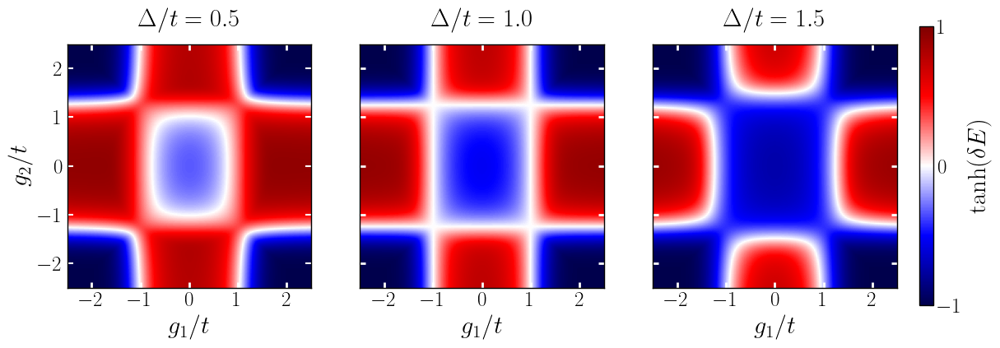

In [50]:
# ══════════════════════════════════════════════════════════════════
#  Graficación — solo paridad hmap_p  (a partir de dE variacional)
# ══════════════════════════════════════════════════════════════════

extent = [lam1_arr[0], lam1_arr[-1], lam2_arr[0], lam2_arr[-1]]
xlabel = r'$g_1/t$'
ylabel = r'$g_2/t$'

fig_par, axes_par = plt.subplots(1, len(cv_list), figsize=(14, 5.5))

for idx, cv in enumerate(cv_list):
    hmap_p = dE[cv]

    ax2 = axes_par[idx]
    im2 = ax2.imshow(np.tanh(hmap_p), origin='lower', aspect='equal', extent=extent, cmap='seismic', vmin=-1.0, vmax=1.0)
    ax2.tick_params(axis='x', direction='in', bottom=True, top=True, right=True, left=True, color='white', size=5, width=2)
    ax2.tick_params(axis='y', direction='in', right=True, left=True, color='white', size=5, width=2, labelleft=False)
    ax2.set(xlabel=xlabel, ylabel=ylabel)
    ax2.set_xticks([-2, -1, 0, 1, 2])
    ax2.set_title(f'$\\Delta/t = {cv}$', pad=15)

    if idx != 0:
        ax2.set_ylabel('')

axes_par[0].tick_params(axis='y', direction='in', right=True, left=True, color='white', size=5, width=1.5, labelleft=True)

fig_par.colorbar(im2, ax=axes_par.ravel().tolist(),
                 label=r'$\tanh(\delta E)$',
                 fraction=0.046, pad=0.025,
                 ticks=[-1, 0, 1], shrink=0.8)
plt.show()

In [3]:
# ══════════════════════════════════════════════════════════════════
# EJECUCIÓN — δE variacional en el plano de asimetrías (δε, δλ)
#   ε1 = εc + δε/2,  ε2 = εc - δε/2   (desnudos; la función hace el shift)
#   λ1 = λc + δλ/2,  λ2 = λc - δλ/2
#   Δ = t = ω0 = 1.  Dos centros: (0,0) y (0.5,0.5).
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
t_fixed  = 1.0
Delta    = 1.0

n_deps, n_dlam = 400, 400
deps_arr = np.linspace(-3.0, 3.0, n_deps)
dlam_arr = np.linspace(-3.0, 3.0, n_dlam)

centrals = [(0.0, 0.0), (0.5, 0.5)]     # (eps_c, lam_c): panel izq, panel der

def _parity_point(i, j, eps_c, lam_c):
    """δE = E_even - E_odd en un nodo (δε, δλ)."""
    deps = deps_arr[j]
    dlam = dlam_arr[i]
    eps1 = eps_c + deps/2.0             # ε desnudos
    eps2 = eps_c - deps/2.0
    lam1 = lam_c + dlam/2.0
    lam2 = lam_c - dlam/2.0
    global t; t = t_fixed               # impar usa t global
    Eo, _ = minimize_odd_aniso(lam1, lam2, eps1, eps2)
    Ee, _ = minimize_even_aniso(lam1, lam2, eps1, eps2, Delta)
    return (i, j, Ee - Eo)

dE = {c: np.full((n_dlam, n_deps), np.nan) for c in centrals}

for (eps_c, lam_c) in centrals:
    print(f"centro (εc,λc)=({eps_c},{lam_c}): δE {n_dlam}×{n_deps} ...", flush=True)
    args = [(i, j, eps_c, lam_c) for i in range(n_dlam) for j in range(n_deps)]
    chunks = np.array_split(np.arange(len(args)), 20); done = 0
    with joblib.parallel_backend('loky', n_jobs=-1):
        for chunk_idx in chunks:
            batch = [args[a] for a in chunk_idx]
            res = joblib.Parallel()(joblib.delayed(_parity_point)(*a) for a in batch)
            for (i, j, d) in res:
                dE[(eps_c, lam_c)][i, j] = d
            done += len(chunk_idx)
            print(f"   {100.0*done/len(args):5.1f}%", flush=True)

print("δE variacional listo.")

centro (εc,λc)=(0.0,0.0): δE 400×400 ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
centro (εc,λc)=(0.5,0.5): δE 400×400 ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
δE variacional listo.


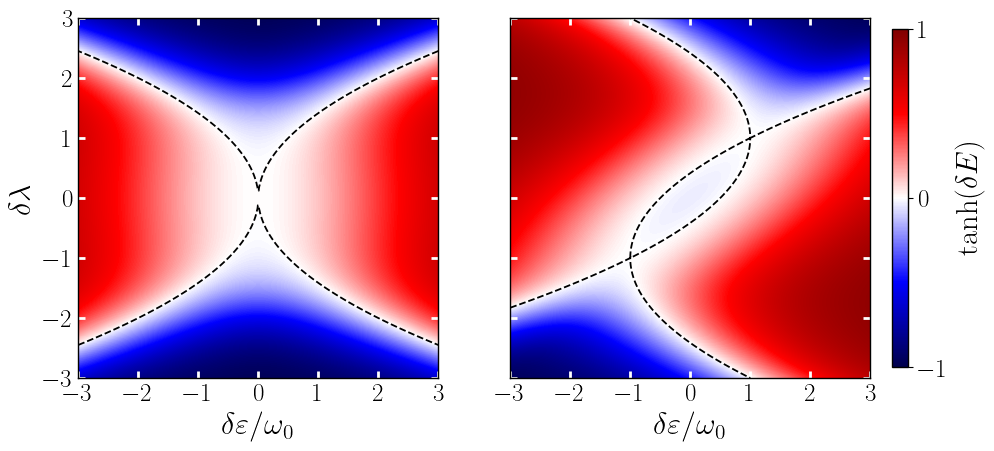

Figura de paridad (δε, δλ) variacional lista.


In [4]:
# ══════════════════════════════════════════════════════════════════
# GRAFICACIÓN — tanh(δE) en el plano (δε, δλ), 2 paneles + contorno δE=0
# ══════════════════════════════════════════════════════════════════
extent = [deps_arr[0], deps_arr[-1], dlam_arr[0], dlam_arr[-1]]
xlabel = r'$\delta\varepsilon/\omega_0$'
ylabel = r'$\delta\lambda$'

fig, axes = plt.subplots(1, 2, figsize=(11, 5.5))
for idx, (eps_c, lam_c) in enumerate(centrals):
    ax = axes[idx]
    data = dE[(eps_c, lam_c)]
    im = ax.imshow(np.tanh(data), origin='lower', aspect='equal', extent=extent, cmap='seismic', vmin=-1.0, vmax=1.0)
    # frontera δE = 0 (contorno sobre δE, no sobre tanh)
    ax.contour(deps_arr, dlam_arr, data, levels=[0.0], colors='black', linestyles='dashed', linewidths=1.3)
    ax.set_xlabel(xlabel)
    ax.tick_params(axis='x', direction='in', bottom=True, top=True, right=True, left=True, color='white', size=5, width=2.0)
    ax.tick_params(axis='y', direction='in', right=True, left=True,  color='white', size=5, width=2.0, labelleft=(idx == 0))
    if idx == 0:
        ax.set_ylabel(ylabel)
    ax.set_xticks([-3, -2, -1, 0, 1, 2, 3])
    ax.set_yticks([-3, -2, -1, 0, 1, 2, 3])

cbar = fig.colorbar(im, ax=axes.ravel().tolist(), label=r'$\tanh(\delta E)$', fraction=0.046, pad=0.025, ticks=[-1, 0, 1], shrink=0.8)
plt.savefig('Resultados_aniso/parity_asymmetry_variational.png', bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura de paridad (δε, δλ) variacional lista.')

## Heatmaps, $\varepsilon_1$ = 0.25, $\varepsilon_2$ = 0.25

In [ ]:
# ══════════════════════════════════════════════════════════════════
# EJECUCIÓN — evaluación DIRECTA de cada nodo cartesiano (sin interpolar)
#   Cada píxel (λ₁,λ₂) es un cálculo real. Cero interpolación → las
#   discontinuidades de la superficie salen exactas. Frío punto a punto.
# ══════════════════════════════════════════════════════════════════

omega0   = 1.0
eps1_val = 0.25
eps2_val = 0.25
_S2      = np.sqrt(2.0)

cv_list  = [0.5, 1.0, 1.5]
rho_list = [0.5, 1.0, 1.5]

n_lam    = 400
lam1_arr = np.linspace(0.01, 4.0, n_lam)
lam2_arr = np.linspace(0.01, 4.0, n_lam)

def _cart_point(i2, j1, cv):
    """Un nodo cartesiano (λ₁,λ₂). Frío (sin warm-start). Devuelve todo."""
    lam1 = lam1_arr[j1]; lam2 = lam2_arr[i2]
    Lam  = np.sqrt(lam1**2 + lam2**2); M = _Mof_Lam(Lam)
    global t; t = cv
    Eo, xo = minimize_odd_aniso(lam1, lam2, eps1_val, eps2_val)
    Eeo    = E_odd_exact_aniso(lam1, lam2, eps1_val, eps2_val, M=M)
    Fo     = fidelity_odd_aniso(lam1, lam2, eps1_val, eps2_val, xo, M=M)
    Reo    = abs(Eo-Eeo)/abs(Eeo) if abs(Eeo)>1e-12 else np.nan
    Ee, xe = minimize_even_aniso(lam1, lam2, eps1_val, eps2_val, cv)
    Eee    = E_even_exact_aniso(lam1, lam2, eps1_val, eps2_val, cv, M=M)
    Fe     = fidelity_even_aniso(lam1, lam2, eps1_val, eps2_val, cv, xe, M=M)
    Ree    = abs(Ee-Eee)/abs(Eee) if abs(Eee)>1e-12 else np.nan
    return (i2, j1, xo, Eo, Eeo, Fo, Reo, xe, Ee, Eee, Fe, Ree)

def _blank(): return {cv: np.full((n_lam, n_lam), np.nan) for cv in cv_list}
a1_o=_blank(); a2_o=_blank(); r1_o=_blank(); r2_o=_blank()
Evar_o=_blank(); Eex_o=_blank(); fid_o=_blank(); rel_o=_blank()
a1_e=_blank(); a2_e=_blank(); r1_e=_blank(); r2_e=_blank()
Evar_e=_blank(); Eex_e=_blank(); fid_e=_blank(); rel_e=_blank()

for cv in cv_list:
    print(f"cv={cv}: evaluación directa {n_lam}×{n_lam} = {n_lam*n_lam} nodos ...", flush=True)
    args = [(i2, j1, cv) for i2 in range(n_lam) for j1 in range(n_lam)]
    chunks = np.array_split(np.arange(len(args)), 20)
    done = 0
    with joblib.parallel_backend('loky', n_jobs=-1):
        for chunk_idx in chunks:
            batch = [args[a] for a in chunk_idx]
            res = joblib.Parallel()(joblib.delayed(_cart_point)(*a) for a in batch)
            for (i2,j1,xo,Eo,Eeo,Fo,Reo,xe,Ee,Eee,Fe,Ree) in res:
                a1_o[cv][i2,j1],a2_o[cv][i2,j1],r1_o[cv][i2,j1],r2_o[cv][i2,j1]=xo
                Evar_o[cv][i2,j1]=Eo; Eex_o[cv][i2,j1]=Eeo; fid_o[cv][i2,j1]=Fo; rel_o[cv][i2,j1]=Reo
                a1_e[cv][i2,j1],a2_e[cv][i2,j1],r1_e[cv][i2,j1],r2_e[cv][i2,j1]=xe
                Evar_e[cv][i2,j1]=Ee; Eex_e[cv][i2,j1]=Eee; fid_e[cv][i2,j1]=Fe; rel_e[cv][i2,j1]=Ree
            done += len(chunk_idx)
            print(f"   {100.0*done/len(args):5.1f}%", flush=True)

print("Ejecución 2D directa lista.")

# ══════════════════════════════════════════════════════════════════
#  GUARDAR ARRAYS EN ARCHIVOS .txt  (uno por parámetro, por cv)
#  Estructura:  variational_params_{param_label}/cv_{cv}/<nombre>_{param_label}.txt
#  (raíz única sin cv; las subcarpetas cv_{cv} indican el acoplamiento)
# ══════════════════════════════════════════════════════════════════
_SAVE_MAP = [
    (a1_o,   'alpha1_odd'),
    (a2_o,   'alpha2_odd'),
    (r1_o,   'r1_odd'),
    (r2_o,   'r2_odd'),
    (Evar_o, 'E_var_odd'),
    (Eex_o,  'E_exact_odd'),
    (fid_o,  'fidelity_odd'),
    (rel_o,  'relative_error_odd'),
    (a1_e,   'alpha1_even'),
    (a2_e,   'alpha2_even'),
    (r1_e,   'r1_even'),
    (r2_e,   'r2_even'),
    (Evar_e, 'E_var_even'),
    (Eex_e,  'E_exact_even'),
    (fid_e,  'fidelity_even'),
    (rel_e,  'relative_error_even'),
]

# param_label, nombra la raíz y los archivos

root_label =  (f"omega0{omega0:.1f}" f"_eps1{eps1_val:.2f}_eps2{eps2_val:.2f}" f"_nl1_{n_lam}_nl2_{n_lam}")
root_dir = f"variational_params_{root_label}"
os.makedirs(root_dir, exist_ok=True)

for cv in cv_list:
    param_label = (f"{cv:.1f}_omega0{omega0:.1f}" f"_eps1{eps1_val:.2f}_eps2{eps2_val:.2f}" f"_nl1_{n_lam}_nl2_{n_lam}")
    cv_dir = os.path.join(root_dir, f"cv_{cv}")
    os.makedirs(cv_dir, exist_ok=True)

    hdr_common = (f"cv={cv}, t=Delta={cv}, omega0={omega0}, "
                  f"eps1={eps1_val}, eps2={eps2_val}\n"
                  f"malla 2D [filas=lam2, columnas=lam1], "
                  f"lam1: {n_lam} pts en [{lam1_arr[0]:.3f},{lam1_arr[-1]:.3f}], "
                  f"lam2: {n_lam} pts en [{lam2_arr[0]:.3f},{lam2_arr[-1]:.3f}]")

    np.savetxt(os.path.join(cv_dir, f"coord_lambda1_{param_label}.txt"),
               lam1_arr, fmt='%.8e',
               header=f"Array lambda1 (columnas de los mapas): {n_lam} puntos")
    np.savetxt(os.path.join(cv_dir, f"coord_lambda2_{param_label}.txt"),
               lam2_arr, fmt='%.8e',
               header=f"Array lambda2 (filas de los mapas): {n_lam} puntos")

    for dct, name in _SAVE_MAP:
        fname = os.path.join(cv_dir, f"{name}_{param_label}.txt")
        np.savetxt(fname, dct[cv], fmt='%.8e',
                   header=f"{name}\n{hdr_common}")

    print(f"cv={cv}: guardado en {os.path.abspath(cv_dir)}/", flush=True)

print(f"\nTodos los archivos .txt guardados en {os.path.abspath(root_dir)}/")

cv=0.5: evaluación directa 400×400 = 160000 nodos ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
cv=1.0: evaluación directa 400×400 = 160000 nodos ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
cv=1.5: evaluación directa 400×400 = 160000 nodos ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
Ejecución 2D directa lista.
cv=0.5: guardado en c:\Users\yumab\OneDrive\Documentos\KitaevHolstein\variational_params_omega01.0_eps10.25_eps20.25_nl1_400_nl2_400\cv_0.5/
cv=1.0: guardado en c:\Users\yumab\OneDrive\Documentos\KitaevHolstein

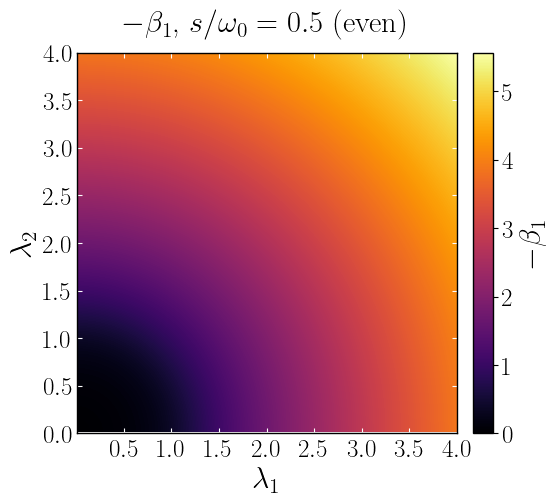

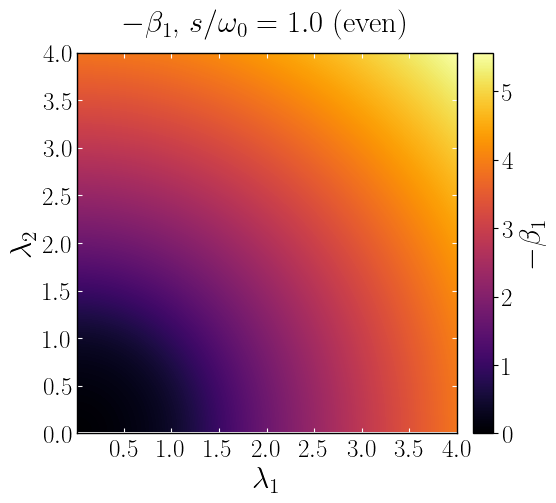

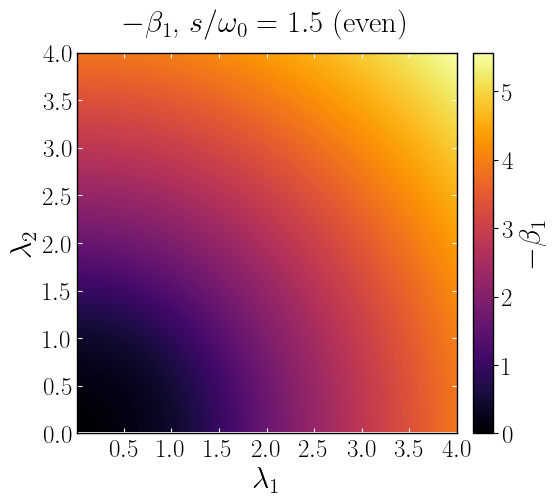

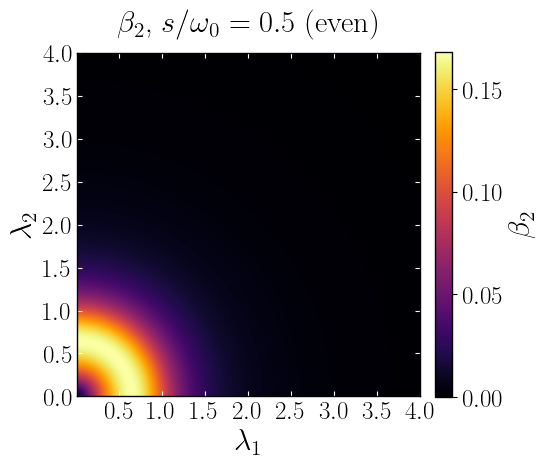

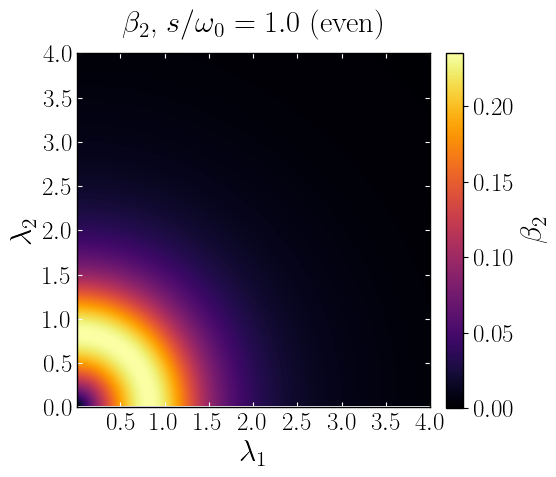

...

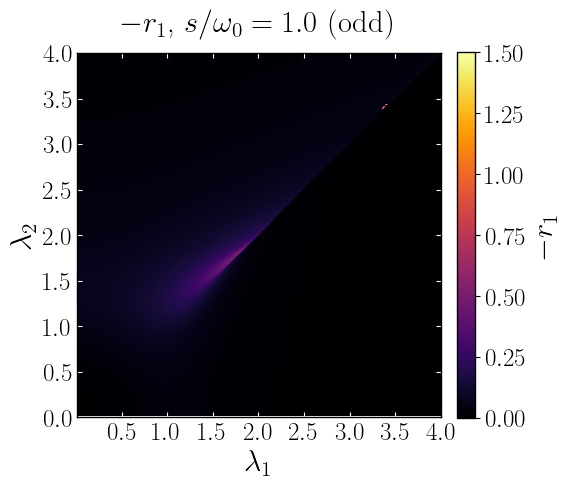

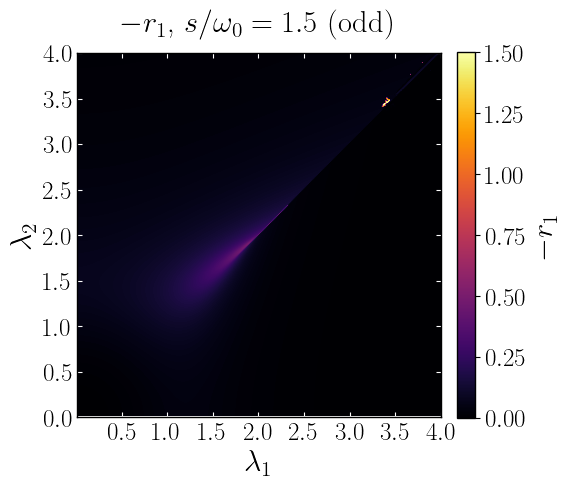

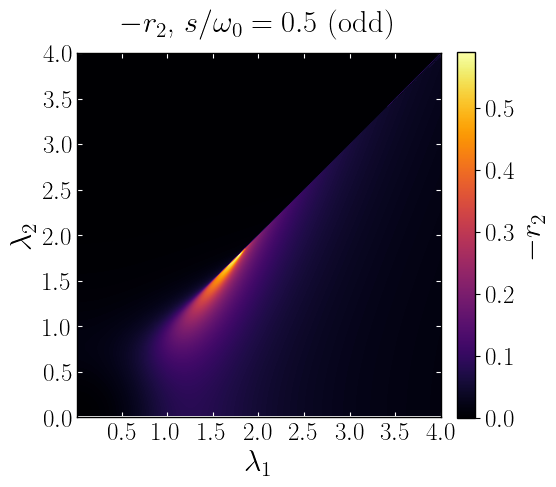

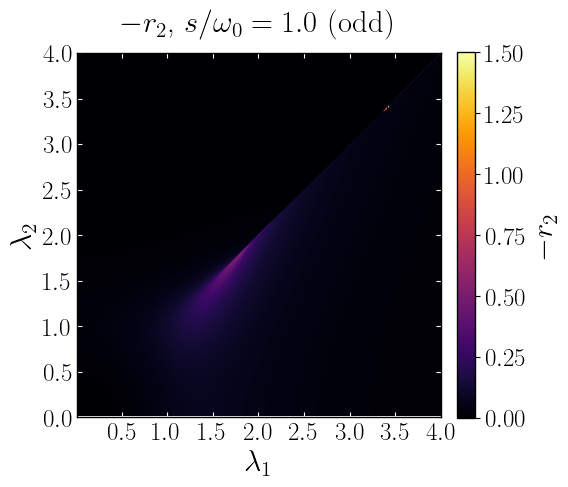

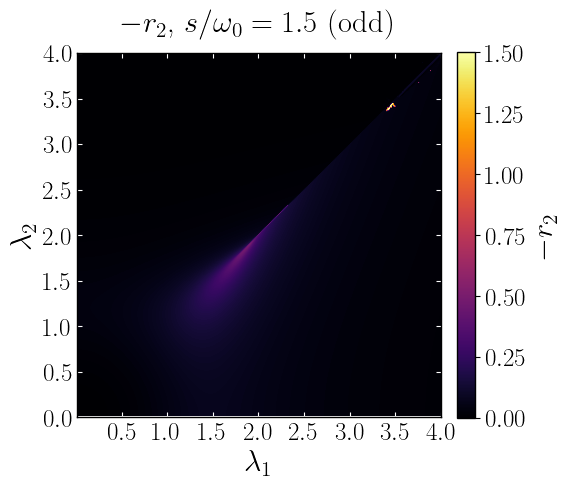

In [ ]:
extent = [lam1_arr[0], lam1_arr[-1], lam2_arr[0], lam2_arr[-1]]

# entradas: (dict, signo, label, ftag, zoom)   zoom=True → genera zoom extra
param_maps_even = [(a1_e,-1,r'$-\beta_1$','mbeta1',False),(a2_e,+1,r'$\beta_2$','beta2',False),
                   (r1_e,-1,r'$-\xi_1$','mxi1',False),(r2_e,-1,r'$-\xi_2$','mxi2',False)]
param_maps_odd  = [(a1_o, 1,r'$\alpha_1$','alpha1',True),(a2_o,-1,r'$-\alpha_2$','malpha2',True),
                   (r1_o,-1,r'$-r_1$','mr1',False),(r2_o,-1,r'$-r_2$','mr2',False)]

ZOOM_LIM = (0.0, 1.5)   # límites del zoom en ambos ejes

def _param_heatmaps(param_maps, sector_tag):
    for dct, sgn, lbl, ftag, zoom in param_maps:
        for cv in cv_list:
            data = sgn*dct[cv]; vmax = np.nanmax(data)

            # ── heatmap principal ──
            fig, ax = plt.subplots(figsize=(6, 5.5))
            im = ax.imshow(data, origin='lower', aspect='equal', extent=extent,
                           cmap='inferno', vmin=0.0, vmax=vmax)
            fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=lbl)
            ax.set_xlabel(r'$\lambda_1$'); ax.set_ylabel(r'$\lambda_2$')
            ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                           right=True, left=True, color='white')
            ax.set_xticks([0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0])
            ax.set_yticks([0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0])
            ax.set_title(rf'{lbl},  $s/\omega_0={cv}$ ({sector_tag})', pad=15)
            plt.tight_layout()
            plt.savefig(f'Resultados_aniso/heatmap_{ftag}_{sector_tag}_cv{cv}.png',
                        bbox_inches='tight', transparent=False, dpi=300)
            plt.show()

            # ── heatmap de zoom (opcional), colorbar reescalada a la máscara ──
            if zoom:
                lo, hi = ZOOM_LIM
                mask1 = (lam1_arr >= lo) & (lam1_arr <= hi)
                mask2 = (lam2_arr >= lo) & (lam2_arr <= hi)
                sub = data[np.ix_(mask2, mask1)]           # [i2, j1]
                vmin_z, vmax_z = np.nanmin(sub), np.nanmax(sub)
                extent_z = [lam1_arr[mask1][0], lam1_arr[mask1][-1],
                            lam2_arr[mask2][0], lam2_arr[mask2][-1]]

                fig, ax = plt.subplots(figsize=(6, 5.5))
                im = ax.imshow(sub, origin='lower', aspect='equal', extent=extent_z,
                               cmap='inferno', vmin=vmin_z, vmax=vmax_z)
                fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=lbl)
                ax.set_xlabel(r'$\lambda_1$'); ax.set_ylabel(r'$\lambda_2$')
                ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                               right=True, left=True, color='white')
                ax.set_xticks([0.0, 0.5, 1.0, 1.5]); ax.set_yticks([0.0, 0.5, 1.0, 1.5])
                ax.set_title(rf'{lbl} (zoom),  $s/\omega_0={cv}$ ({sector_tag})', pad=15)
                plt.tight_layout()
                plt.savefig(f'Resultados_aniso/heatmap_{ftag}_{sector_tag}_cv{cv}_zoom.png',
                            bbox_inches='tight', transparent=False, dpi=300)
                plt.show()

_param_heatmaps(param_maps_even, 'even')
_param_heatmaps(param_maps_odd,  'odd')

Cut params (even), $\rho=0.5,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ \Delta/\omega_0=0.5$


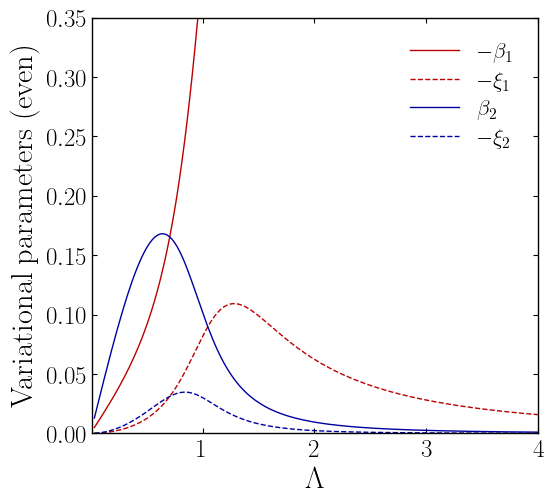

Cut params (even), $\rho=0.5,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ \Delta/\omega_0=1.0$


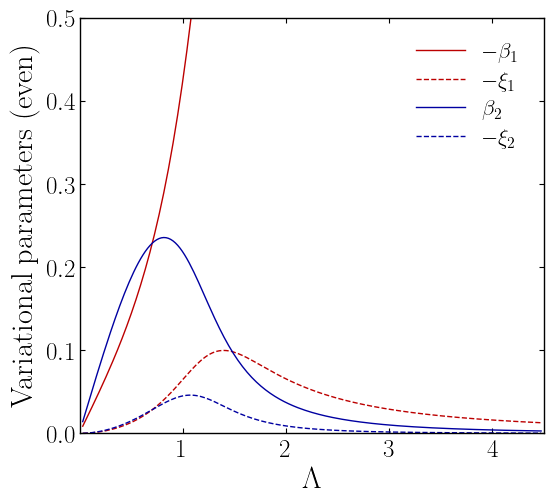

Cut params (even), $\rho=0.5,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ \Delta/\omega_0=1.5$


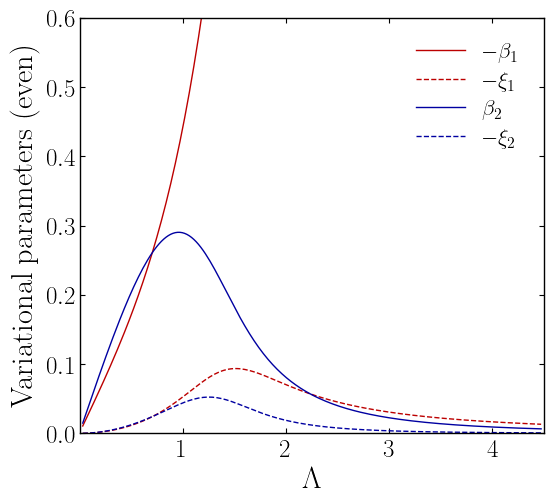

Cut params (even), $\rho=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ \Delta/\omega_0=0.5$


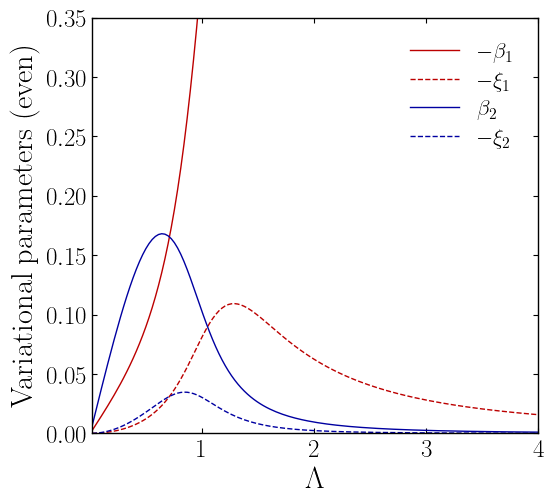

Cut params (even), $\rho=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ \Delta/\omega_0=1.0$


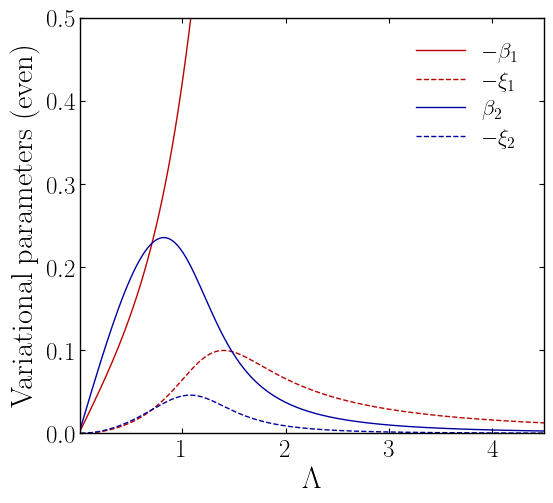

Cut params (even), $\rho=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ \Delta/\omega_0=1.5$


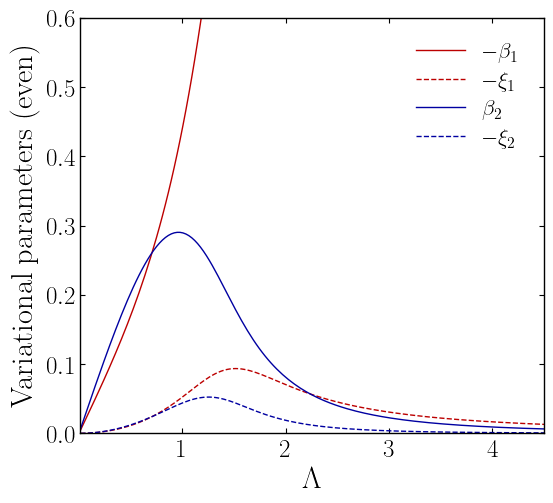

Cut params (even), $\rho=1.5,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ \Delta/\omega_0=0.5$


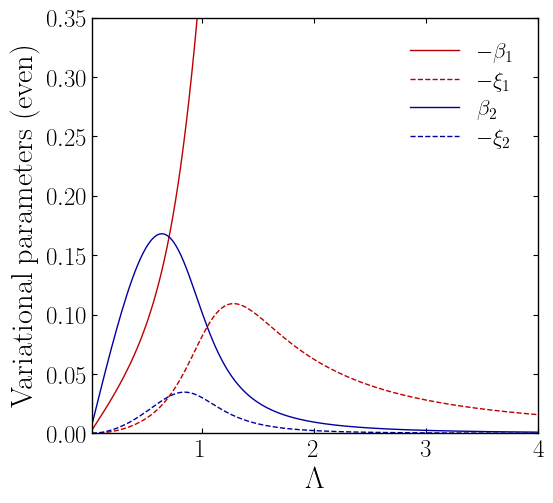

Cut params (even), $\rho=1.5,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ \Delta/\omega_0=1.0$


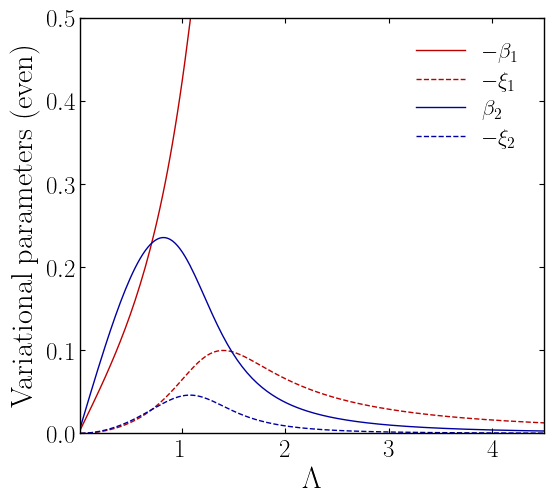

Cut params (even), $\rho=1.5,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ \Delta/\omega_0=1.5$


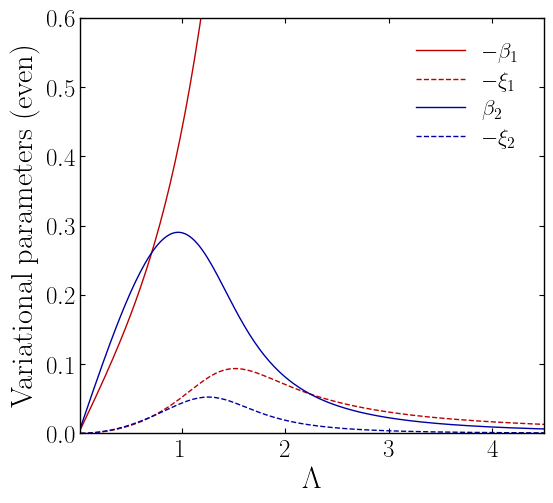

Cut params (odd), $\rho=0.5,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ t/\omega_0=0.5$


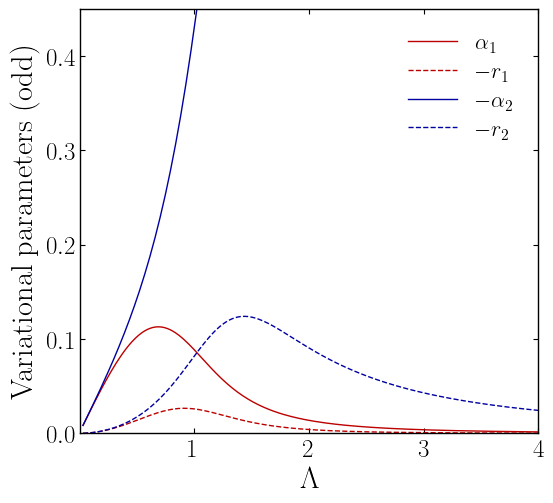

Cut params (odd), $\rho=0.5,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ t/\omega_0=1.0$


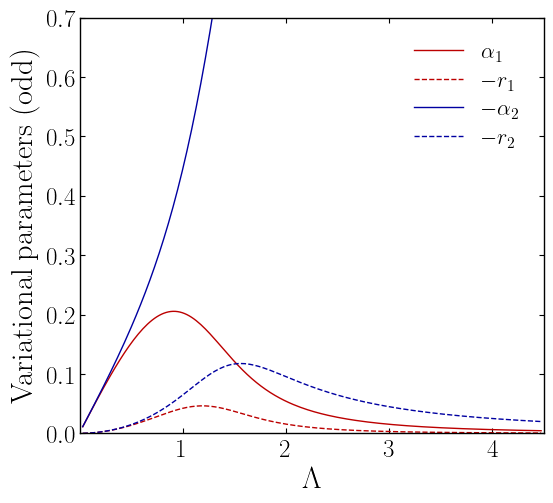

Cut params (odd), $\rho=0.5,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ t/\omega_0=1.5$


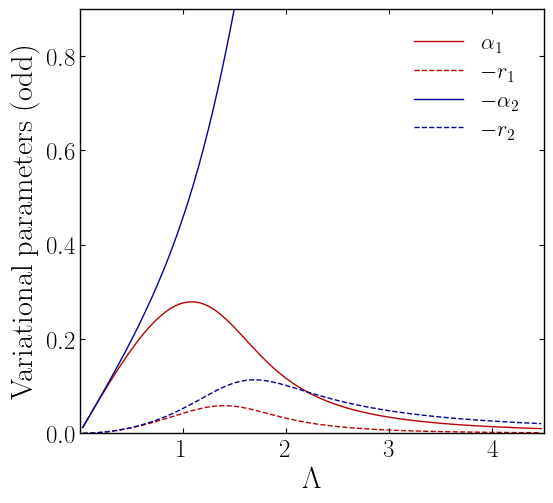

Cut params (odd), $\rho=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ t/\omega_0=0.5$


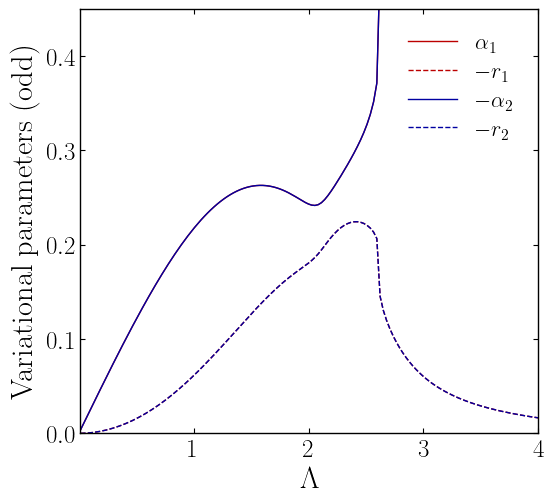

Cut params (odd), $\rho=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ t/\omega_0=1.0$


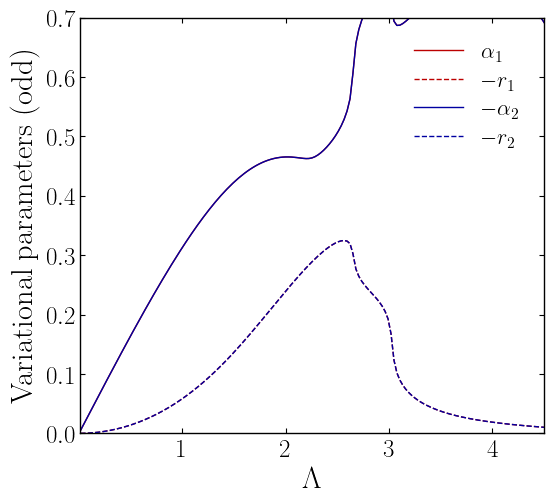

Cut params (odd), $\rho=1.0,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ t/\omega_0=1.5$


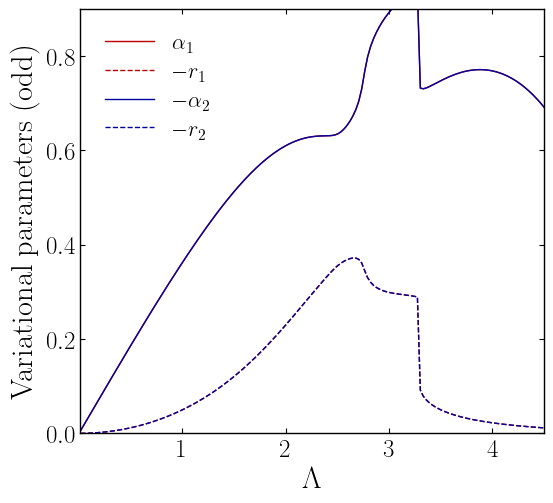

Cut params (odd), $\rho=1.5,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ t/\omega_0=0.5$


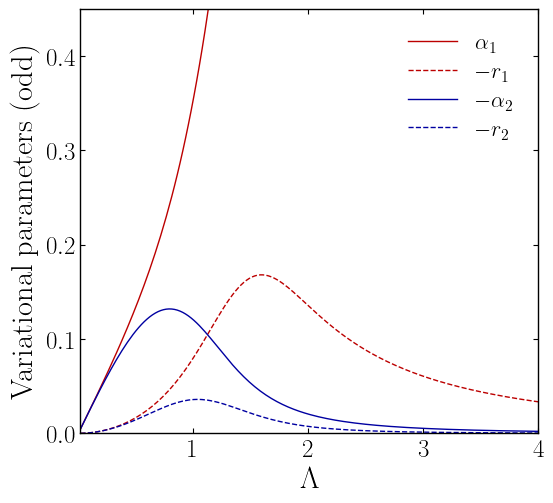

Cut params (odd), $\rho=1.5,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ t/\omega_0=1.0$


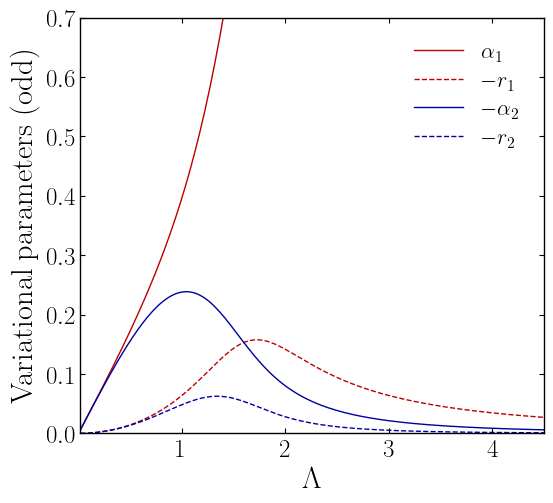

Cut params (odd), $\rho=1.5,\ \varepsilon_1=0.25,\ \varepsilon_2=0.25,\ t/\omega_0=1.5$


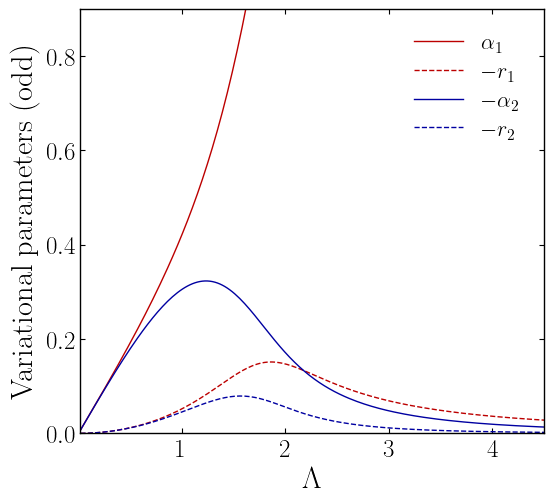

In [ ]:
from scipy.interpolate import RegularGridInterpolator
C_A = plt.cm.seismic(0.12)   # azul  (bloque 2)
C_B = plt.cm.seismic(0.88)   # rojo  (bloque 1)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

ylim_by_cv1 = {0.5: 0.35, 1.0: 0.5, 1.5: 0.6}
xlim_by_cv = {0.5: 4.0, 1.0: 4.5, 1.5: 4.5}
ylim_by_cv2 = {0.5: 0.45, 1.0: 0.7, 1.5: 0.9}


def _cut_along_rho(data2d, rho, n_cut=200):
    interp = RegularGridInterpolator((lam2_arr, lam1_arr), data2d, bounds_error=False, fill_value=np.nan)
    l1max = min(lam1_arr[-1], lam2_arr[-1]/rho)
    l1 = np.linspace(max(lam1_arr[0], 0.01), l1max, n_cut)
    l2 = rho*l1
    Lam = np.sqrt(l1**2 + l2**2)
    vals = interp(np.column_stack([l2, l1]))
    return Lam, vals

# ── (ii) Cortes λ₂=ρλ₁ — parámetros variacionales del PAR ────────
for rho in rho_list:
    for cv in cv_list:
        pstr = rf"$\rho={rho},\ \varepsilon_1={eps1_val},\ \varepsilon_2={eps2_val},\ \Delta/\omega_0={cv}$"
        print('Cut params (even), ' + pstr)
        fig, ax = plt.subplots(figsize=(6, 5.5))
        Lc,v=_cut_along_rho(-a1_e[cv],rho); ax.plot(Lc, v, '-',  color=C_B, lw=1.0, label=r'$-\beta_1$')
        Lc,v=_cut_along_rho(-r1_e[cv],rho); ax.plot(Lc, v, '--', color=C_B, lw=1.0, label=r'$-\xi_1$')
        Lc,v=_cut_along_rho( a2_e[cv],rho); ax.plot(Lc, v, '-',  color=C_A, lw=1.0, label=r'$\beta_2$')
        Lc,v=_cut_along_rho(-r2_e[cv],rho); ax.plot(Lc, v, '--', color=C_A, lw=1.0, label=r'$-\xi_2$')
        ax.set_xlim(Lc[0], xlim_by_cv[cv])
        ax.set_ylim(0.0, ylim_by_cv1[cv])
        ax.set_xlabel(r'$\Lambda$'); ax.set_ylabel(r'Variational parameters (even)')
        ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
        ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)
        plt.tight_layout()
        plt.savefig(f'Resultados_aniso/cut_params_even_rho{rho}_cv{cv}.png', bbox_inches='tight', transparent=False, dpi=300)
        plt.show()
       

# ── (ii) Cortes λ₂=ρλ₁ — parámetros variacionales del IMPAR ──────
for rho in rho_list:
    for cv in cv_list:
        pstr = rf"$\rho={rho},\ \varepsilon_1={eps1_val},\ \varepsilon_2={eps2_val},\ t/\omega_0={cv}$"
        print('Cut params (odd), ' + pstr)
        fig, ax = plt.subplots(figsize=(6, 5.5))
        Lc,v=_cut_along_rho( a1_o[cv],rho); ax.plot(Lc, v, '-',  color=C_B, lw=1.0, label=r'$\alpha_1$')
        Lc,v=_cut_along_rho(-r1_o[cv],rho); ax.plot(Lc, v, '--', color=C_B, lw=1.0, label=r'$-r_1$')
        Lc,v=_cut_along_rho(-a2_o[cv],rho); ax.plot(Lc, v, '-',  color=C_A, lw=1.0, label=r'$-\alpha_2$')
        Lc,v=_cut_along_rho(-r2_o[cv],rho); ax.plot(Lc, v, '--', color=C_A, lw=1.0, label=r'$-r_2$')
        ax.set_xlim(Lc[0], xlim_by_cv[cv])
        ax.set_ylim(0.0, ylim_by_cv2[cv])
        ax.set_xlabel(r'$\Lambda$'); ax.set_ylabel(r'Variational parameters (odd)')
        ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
        ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)
        plt.tight_layout()
        plt.savefig(f'Resultados_aniso/cut_params_odd_rho{rho}_cv{cv}.png', bbox_inches='tight', transparent=False, dpi=300)
        plt.show()
       

Infidelity (even), $\Delta/\omega_0=0.5$


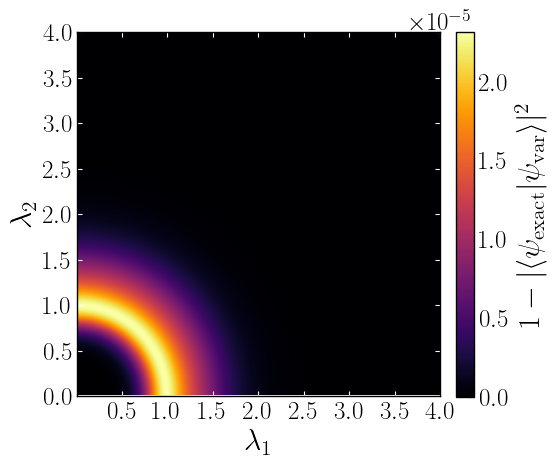

Relative error (even), $\Delta/\omega_0=0.5$


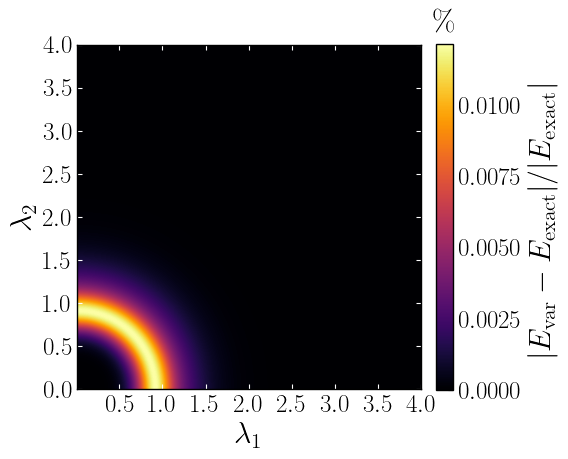

Infidelity (even), $\Delta/\omega_0=1.0$


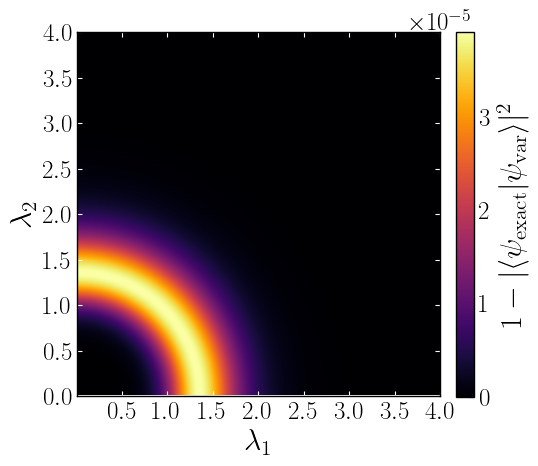

Relative error (even), $\Delta/\omega_0=1.0$


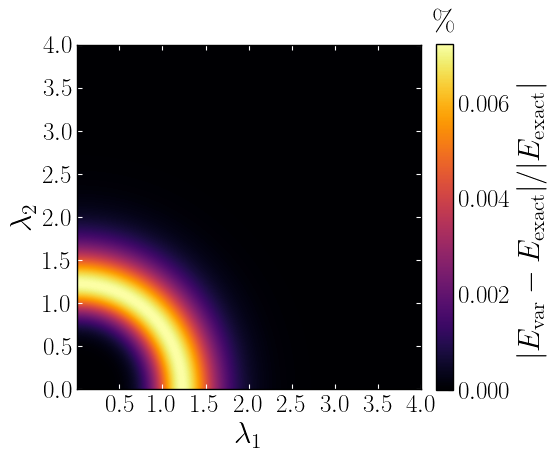

Infidelity (even), $\Delta/\omega_0=1.5$


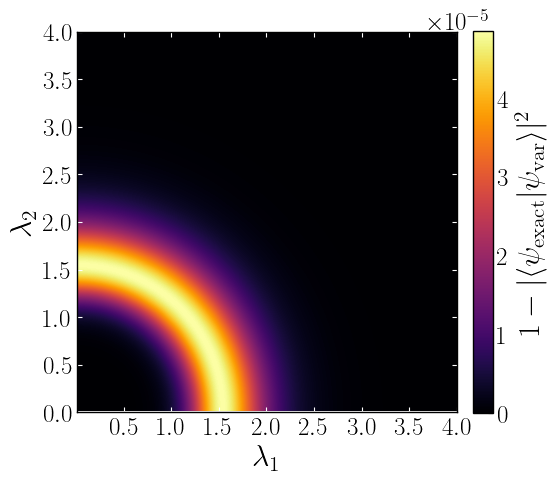

Relative error (even), $\Delta/\omega_0=1.5$


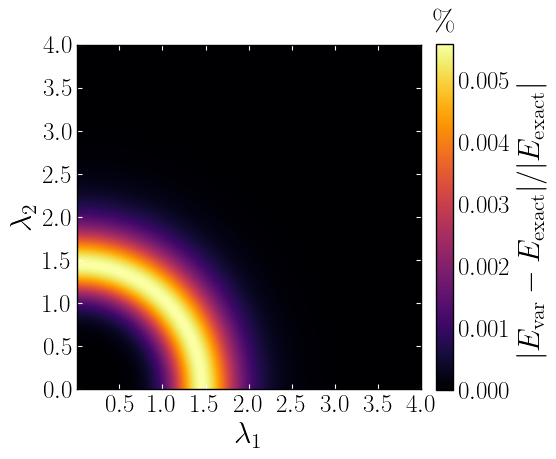

Infidelity (odd), $t/\omega_0=0.5$


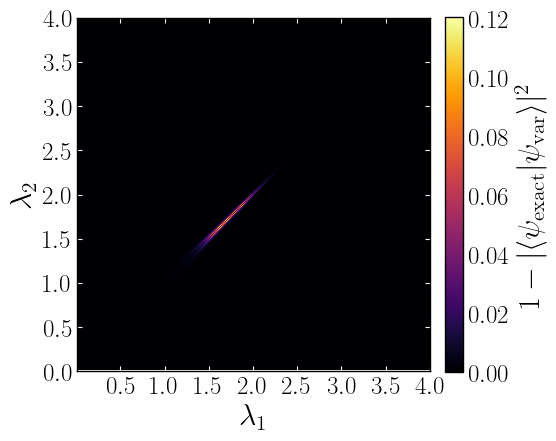

Relative error (odd), $t/\omega_0=0.5$


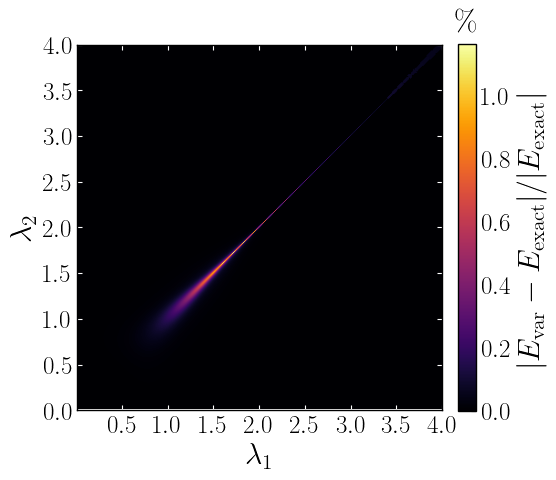

Infidelity (odd), $t/\omega_0=1.0$


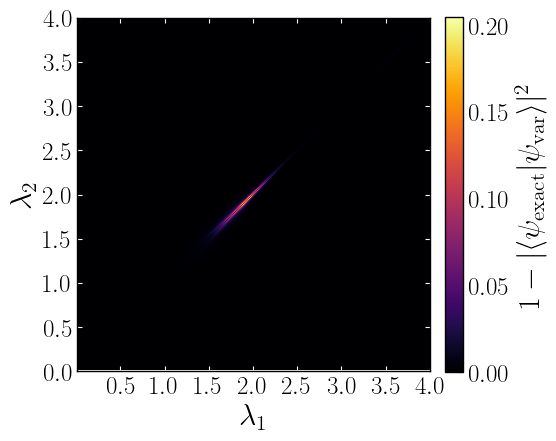

Relative error (odd), $t/\omega_0=1.0$


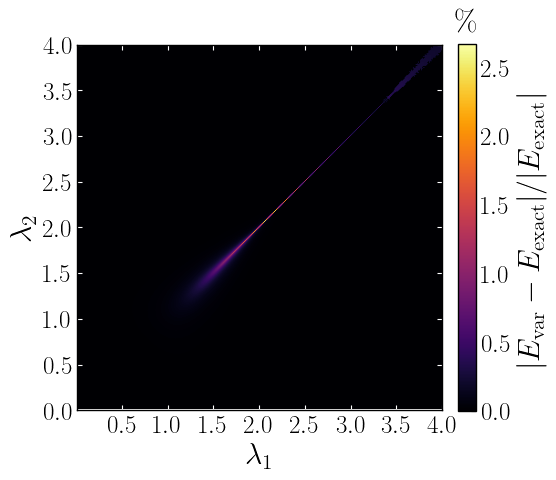

Infidelity (odd), $t/\omega_0=1.5$


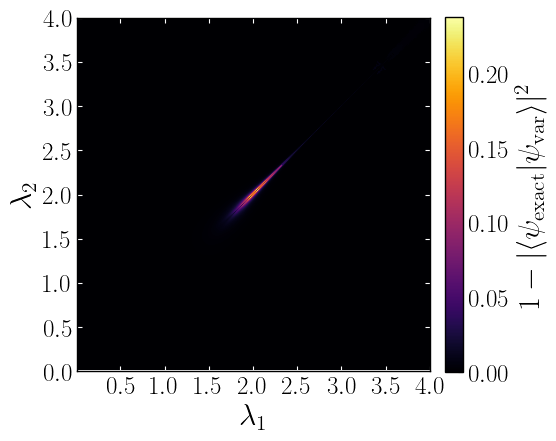

Relative error (odd), $t/\omega_0=1.5$


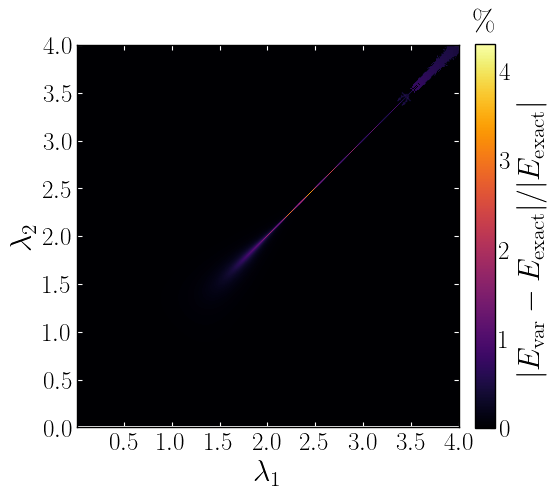

In [ ]:
# ══════════════════════════════════════════════════════════════════
# (iii-a) HEATMAPS de infidelidad y error — UNA FIGURA POR HEATMAP
# ══════════════════════════════════════════════════════════════════
def _single_heatmap(data, label, ftag, percent=False):
    vmax = np.nanmax(data)
    fig, ax = plt.subplots(figsize=(6, 5.5))
    im = ax.imshow(data, origin='lower', aspect='equal', extent=extent,
                   cmap='inferno', vmin=0.0, vmax=vmax)
    cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=label)
    if percent:
        cb.ax.text(0.5, 1.02, r'$\%$', transform=cb.ax.transAxes,
                   ha='center', va='bottom')
    ax.set_xlabel(r'$\lambda_1$'); ax.set_ylabel(r'$\lambda_2$')
    ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                   right=True, left=True, color='white')
    ax.set_xticks([0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0])
    ax.set_yticks([0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0])
    plt.tight_layout()
    plt.savefig(f'Resultados_aniso/heatmap_{ftag}.png', bbox_inches='tight',
                transparent=False, dpi=300)
    plt.show()

# ── sector PAR ──
for cv in cv_list:
    print(rf'Infidelity (even), $\Delta/\omega_0={cv}$')
    _single_heatmap(1.0 - fid_e[cv],
                    r'$1-|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$',
                    f'infid_even_cv{cv}')

    print(rf'Relative error (even), $\Delta/\omega_0={cv}$')
    _single_heatmap(100.0 * rel_e[cv],
                    r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
                    f'relerr_even_cv{cv}', percent=True)

# ── sector IMPAR ──
for cv in cv_list:
    print(rf'Infidelity (odd), $t/\omega_0={cv}$')
    _single_heatmap(1.0 - fid_o[cv],
                    r'$1-|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$',
                    f'infid_odd_cv{cv}')

    print(rf'Relative error (odd), $t/\omega_0={cv}$')
    _single_heatmap(100.0 * rel_o[cv],
                    r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
                    f'relerr_odd_cv{cv}', percent=True)

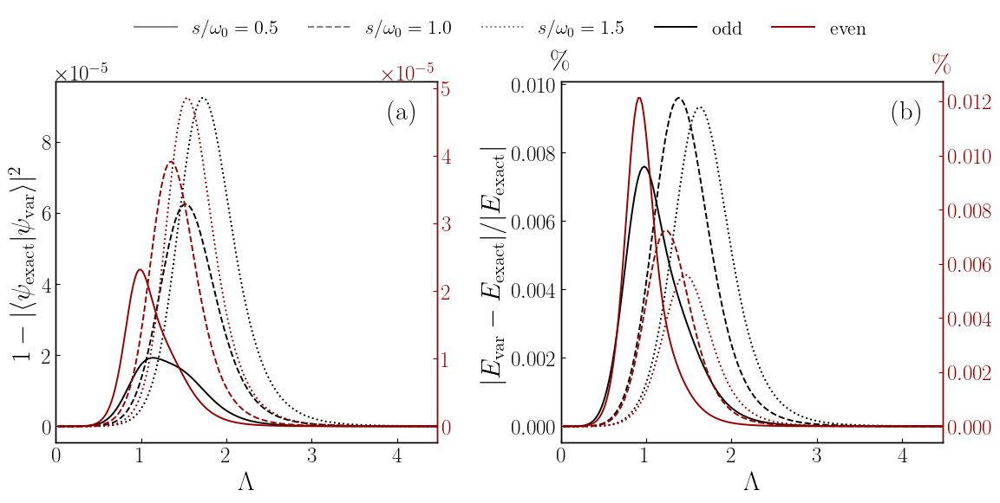

Fidelity + relative error by sector, rho=0.5


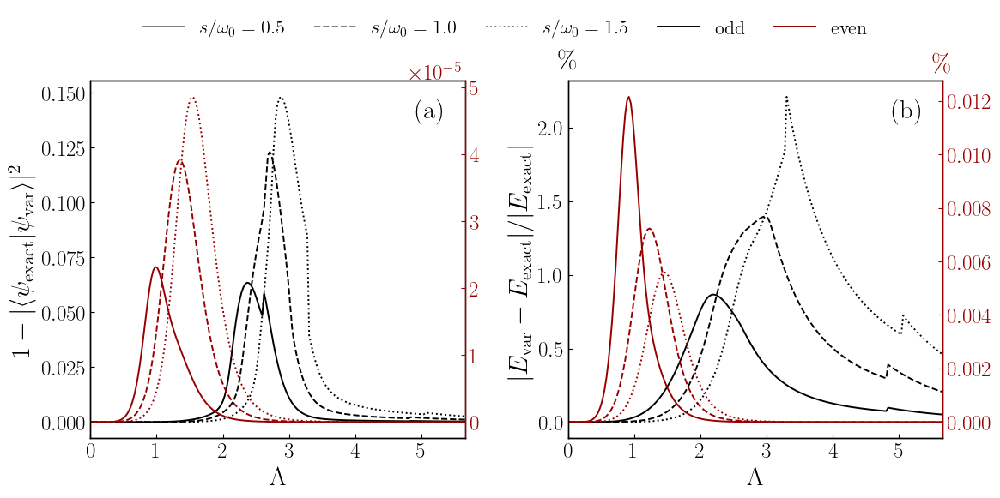

Fidelity + relative error by sector, rho=1.0


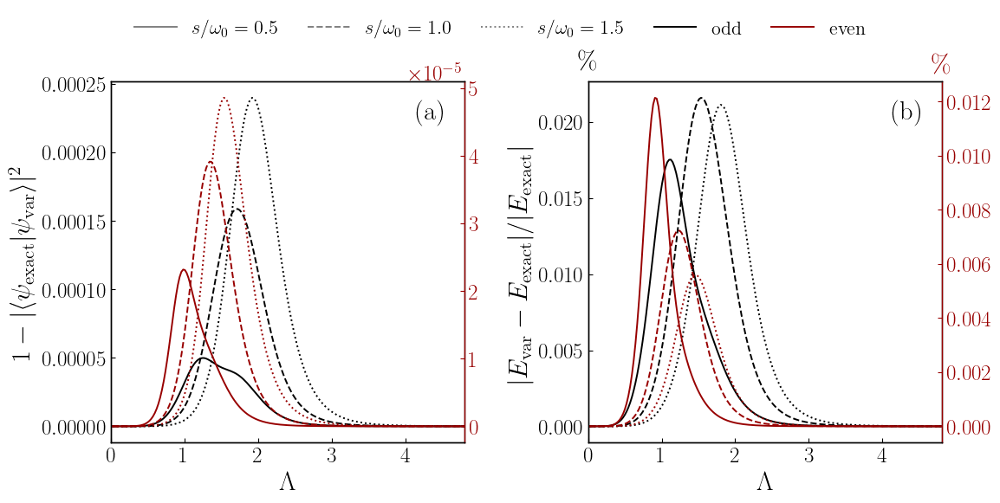

Fidelity + relative error by sector, rho=1.5


In [ ]:
# ══════════════════════════════════════════════════════════════════
# (iii-b) CORTE λ₂=ρλ₁ — figura de 2 paneles estilo isotrópico:
#   (a) infidelidad   (b) error relativo (%)
#   impar = negro (eje izq), par = rojo (eje der), LS por cv
# ══════════════════════════════════════════════════════════════════
LS     = {0.5: '-', 1.0: '--', 1.5: ':'}
C_ODD  = 'black'
C_EVEN = plt.cm.seismic(0.95)   # rojo intenso

for rho in rho_list:
    fig, (ax_o1, ax_o2) = plt.subplots(1, 2, figsize=(12, 6))

    # ═══════════════════════════════════════════════════════════
    # Panel (a): infidelidad
    # ═══════════════════════════════════════════════════════════
    ax_e1 = ax_o1.twinx()

    for cv in cv_list:
        Lc, fo = _cut_along_rho(1.0 - fid_o[cv], rho)
        Lc, fe = _cut_along_rho(1.0 - fid_e[cv], rho)
        ax_o1.plot(Lc, fo, LS[cv], color=C_ODD,  lw=1.4)
        ax_e1.plot(Lc, fe, LS[cv], color=C_EVEN, lw=1.4)

    ax_o1.set_xlabel(r'$\Lambda$')
    ax_o1.set_ylabel(r'$1-|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$', color=C_ODD)
    ax_o1.tick_params(axis='y', colors=C_ODD,  direction='in')
    ax_o1.tick_params(axis='x', direction='in')
    ax_o1.set_xlim(Lc[0], Lc[-1])

    ax_e1.tick_params(axis='y', colors=C_EVEN, direction='in')
    ax_e1.spines['right'].set_color(C_EVEN)
    ax_e1.spines['left'].set_color(C_ODD)

    ax_o1.text(0.95, 0.95, '(a)', transform=ax_o1.transAxes, ha='right', va='top', fontweight='bold')
    ax_o1.set_xticks( np.arange(0, np.floor(Lc[-1]) + 1, 1))    

    # ═══════════════════════════════════════════════════════════
    # Panel (b): error relativo (%)
    # ═══════════════════════════════════════════════════════════
    ax_e2 = ax_o2.twinx()

    for cv in cv_list:
        Lc, ro = _cut_along_rho(rel_o[cv], rho)
        Lc, re = _cut_along_rho(rel_e[cv], rho)
        ax_o2.plot(Lc, 100*ro, LS[cv], color=C_ODD,  lw=1.4)
        ax_e2.plot(Lc, 100*re, LS[cv], color=C_EVEN, lw=1.4)

    ax_o2.set_xlabel(r'$\Lambda$')
    ax_o2.set_ylabel(r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
                     color=C_ODD)
    ax_o2.tick_params(axis='y', colors=C_ODD,  direction='in')
    ax_o2.tick_params(axis='x', direction='in')
    ax_o2.set_xlim(Lc[0], Lc[-1])

    ax_e2.tick_params(axis='y', colors=C_EVEN, direction='in')
    ax_e2.spines['right'].set_color(C_EVEN)
    ax_e2.spines['left'].set_color(C_ODD)

    ax_o2.text(0.0, 1.02, r'$\%$', transform=ax_o2.transAxes, color=C_ODD, ha='center', va='bottom')
    ax_e2.text(1.0, 1.01, r'$\%$', transform=ax_e2.transAxes, color=C_EVEN, ha='center', va='bottom')

    ax_o2.text(0.95, 0.95, '(b)', transform=ax_o2.transAxes, ha='right', va='top', fontweight='bold')
    ax_o2.set_xticks( np.arange(0, np.floor(Lc[-1]) + 1, 1))

    # ═══════════════════════════════════════════════════════════
    # Leyenda compartida — arriba, una sola fila
    # ═══════════════════════════════════════════════════════════
    handles = [mlines.Line2D([], [], color='gray', ls=LS[cv], lw=1.4,
                             label=rf'$s/\omega_0={cv}$') for cv in cv_list]
    handles += [mlines.Line2D([], [], color=C_ODD,  lw=1.4, label='odd'),
                mlines.Line2D([], [], color=C_EVEN, lw=1.4, label='even')]

    fig.legend(handles=handles,
               loc='upper center',
               bbox_to_anchor=(0.5, 1.01),
               ncol=len(handles),
               frameon=False,
               borderpad=0.6, handlelength=2.2, labelspacing=0.4,
               columnspacing=1.5)

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.savefig(f'Resultados_aniso/Fidelidad_y_error_relativo_por_sector_rho{rho}.png',
                bbox_inches='tight', transparent=False, dpi=300)
    plt.show()
    print(f'Fidelity + relative error by sector, rho={rho}')

## Heatmaps, $\varepsilon_1$ = 1.0, $\varepsilon_2$ = $1.25^2$

In [ ]:
# ══════════════════════════════════════════════════════════════════
# EJECUCIÓN — evaluación DIRECTA de cada nodo cartesiano (sin interpolar)
#   Cada píxel (λ₁,λ₂) es un cálculo real. Cero interpolación → las
#   discontinuidades de la superficie salen exactas. Frío punto a punto.
# ══════════════════════════════════════════════════════════════════

omega0   = 1.0
eps1_val = 1.0
eps2_val = 1.25**2
_S2      = np.sqrt(2.0)

cv_list  = [0.5, 1.0, 1.5]
rho_list = [0.5, 1.0, 1.5]

n_lam    = 400
lam1_arr = np.linspace(0.01, 4.0, n_lam)
lam2_arr = np.linspace(0.01, 4.0, n_lam)

def _cart_point(i2, j1, cv):
    """Un nodo cartesiano (λ₁,λ₂). Frío (sin warm-start). Devuelve todo."""
    lam1 = lam1_arr[j1]; lam2 = lam2_arr[i2]
    Lam  = np.sqrt(lam1**2 + lam2**2); M = _Mof_Lam(Lam)
    global t; t = cv
    Eo, xo = minimize_odd_aniso(lam1, lam2, eps1_val, eps2_val)
    Eeo    = E_odd_exact_aniso(lam1, lam2, eps1_val, eps2_val, M=M)
    Fo     = fidelity_odd_aniso(lam1, lam2, eps1_val, eps2_val, xo, M=M)
    Reo    = abs(Eo-Eeo)/abs(Eeo) if abs(Eeo)>1e-12 else np.nan
    Ee, xe = minimize_even_aniso(lam1, lam2, eps1_val, eps2_val, cv)
    Eee    = E_even_exact_aniso(lam1, lam2, eps1_val, eps2_val, cv, M=M)
    Fe     = fidelity_even_aniso(lam1, lam2, eps1_val, eps2_val, cv, xe, M=M)
    Ree    = abs(Ee-Eee)/abs(Eee) if abs(Eee)>1e-12 else np.nan
    return (i2, j1, xo, Eo, Eeo, Fo, Reo, xe, Ee, Eee, Fe, Ree)

def _blank(): return {cv: np.full((n_lam, n_lam), np.nan) for cv in cv_list}
a1_o=_blank(); a2_o=_blank(); r1_o=_blank(); r2_o=_blank()
Evar_o=_blank(); Eex_o=_blank(); fid_o=_blank(); rel_o=_blank()
a1_e=_blank(); a2_e=_blank(); r1_e=_blank(); r2_e=_blank()
Evar_e=_blank(); Eex_e=_blank(); fid_e=_blank(); rel_e=_blank()

for cv in cv_list:
    print(f"cv={cv}: evaluación directa {n_lam}×{n_lam} = {n_lam*n_lam} nodos ...", flush=True)
    args = [(i2, j1, cv) for i2 in range(n_lam) for j1 in range(n_lam)]
    chunks = np.array_split(np.arange(len(args)), 20)
    done = 0
    with joblib.parallel_backend('loky', n_jobs=-1):
        for chunk_idx in chunks:
            batch = [args[a] for a in chunk_idx]
            res = joblib.Parallel()(joblib.delayed(_cart_point)(*a) for a in batch)
            for (i2,j1,xo,Eo,Eeo,Fo,Reo,xe,Ee,Eee,Fe,Ree) in res:
                a1_o[cv][i2,j1],a2_o[cv][i2,j1],r1_o[cv][i2,j1],r2_o[cv][i2,j1]=xo
                Evar_o[cv][i2,j1]=Eo; Eex_o[cv][i2,j1]=Eeo; fid_o[cv][i2,j1]=Fo; rel_o[cv][i2,j1]=Reo
                a1_e[cv][i2,j1],a2_e[cv][i2,j1],r1_e[cv][i2,j1],r2_e[cv][i2,j1]=xe
                Evar_e[cv][i2,j1]=Ee; Eex_e[cv][i2,j1]=Eee; fid_e[cv][i2,j1]=Fe; rel_e[cv][i2,j1]=Ree
            done += len(chunk_idx)
            print(f"   {100.0*done/len(args):5.1f}%", flush=True)

print("Ejecución 2D directa lista.")

# ══════════════════════════════════════════════════════════════════
#  GUARDAR ARRAYS EN ARCHIVOS .txt  (uno por parámetro, por cv)
#  Estructura:  variational_params_{param_label}/cv_{cv}/<nombre>_{param_label}.txt
#  (raíz única sin cv; las subcarpetas cv_{cv} indican el acoplamiento)
# ══════════════════════════════════════════════════════════════════
_SAVE_MAP = [
    (a1_o,   'alpha1_odd'),
    (a2_o,   'alpha2_odd'),
    (r1_o,   'r1_odd'),
    (r2_o,   'r2_odd'),
    (Evar_o, 'E_var_odd'),
    (Eex_o,  'E_exact_odd'),
    (fid_o,  'fidelity_odd'),
    (rel_o,  'relative_error_odd'),
    (a1_e,   'alpha1_even'),
    (a2_e,   'alpha2_even'),
    (r1_e,   'r1_even'),
    (r2_e,   'r2_even'),
    (Evar_e, 'E_var_even'),
    (Eex_e,  'E_exact_even'),
    (fid_e,  'fidelity_even'),
    (rel_e,  'relative_error_even'),
]

# param_label, nombra la raíz y los archivos

root_label =  (f"omega0{omega0:.1f}" f"_eps1{eps1_val:.2f}_eps2{eps2_val:.2f}" f"_nl1_{n_lam}_nl2_{n_lam}")
root_dir = f"variational_params_{root_label}"
os.makedirs(root_dir, exist_ok=True)

for cv in cv_list:
    param_label = (f"{cv:.1f}_omega0{omega0:.1f}" f"_eps1{eps1_val:.2f}_eps2{eps2_val:.2f}" f"_nl1_{n_lam}_nl2_{n_lam}")
    cv_dir = os.path.join(root_dir, f"cv_{cv}")
    os.makedirs(cv_dir, exist_ok=True)

    hdr_common = (f"cv={cv}, t=Delta={cv}, omega0={omega0}, "
                  f"eps1={eps1_val}, eps2={eps2_val}\n"
                  f"malla 2D [filas=lam2, columnas=lam1], "
                  f"lam1: {n_lam} pts en [{lam1_arr[0]:.3f},{lam1_arr[-1]:.3f}], "
                  f"lam2: {n_lam} pts en [{lam2_arr[0]:.3f},{lam2_arr[-1]:.3f}]")

    np.savetxt(os.path.join(cv_dir, f"coord_lambda1_{param_label}.txt"),
               lam1_arr, fmt='%.8e',
               header=f"Array lambda1 (columnas de los mapas): {n_lam} puntos")
    np.savetxt(os.path.join(cv_dir, f"coord_lambda2_{param_label}.txt"),
               lam2_arr, fmt='%.8e',
               header=f"Array lambda2 (filas de los mapas): {n_lam} puntos")

    for dct, name in _SAVE_MAP:
        fname = os.path.join(cv_dir, f"{name}_{param_label}.txt")
        np.savetxt(fname, dct[cv], fmt='%.8e',
                   header=f"{name}\n{hdr_common}")

    print(f"cv={cv}: guardado en {os.path.abspath(cv_dir)}/", flush=True)

print(f"\nTodos los archivos .txt guardados en {os.path.abspath(root_dir)}/")

cv=0.5: evaluación directa 400×400 = 160000 nodos ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%


KeyboardInterrupt: 

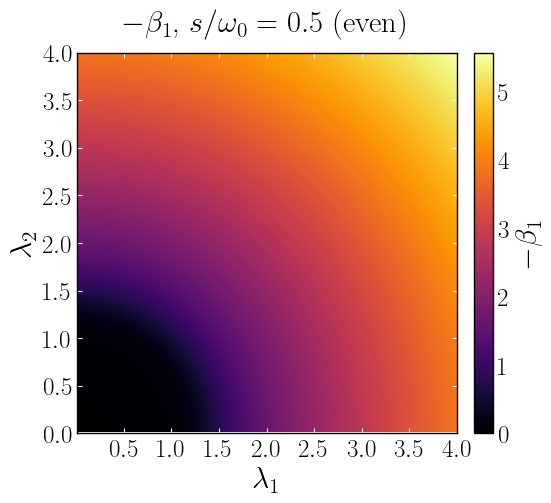

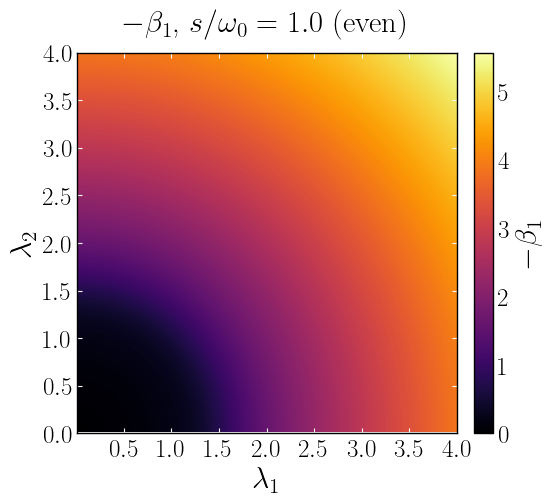

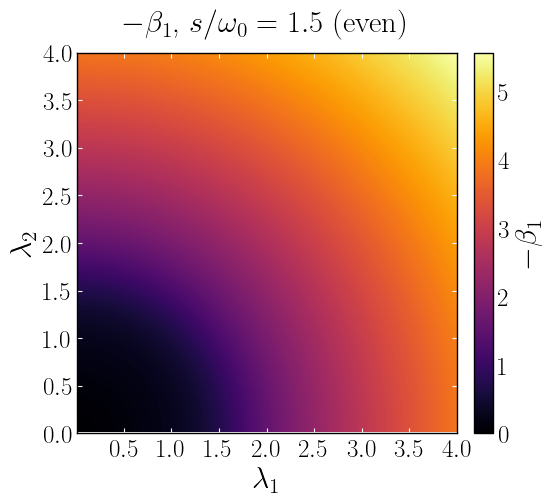

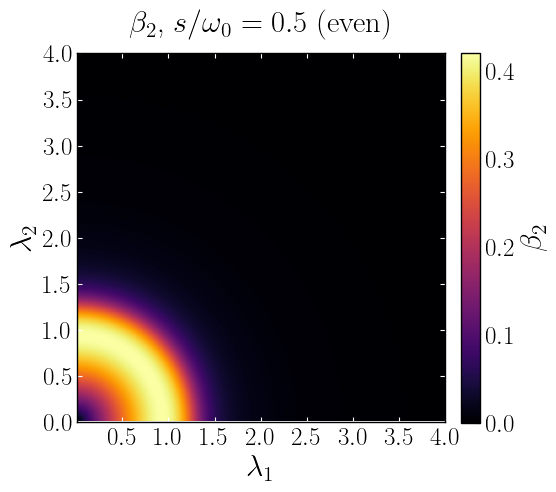

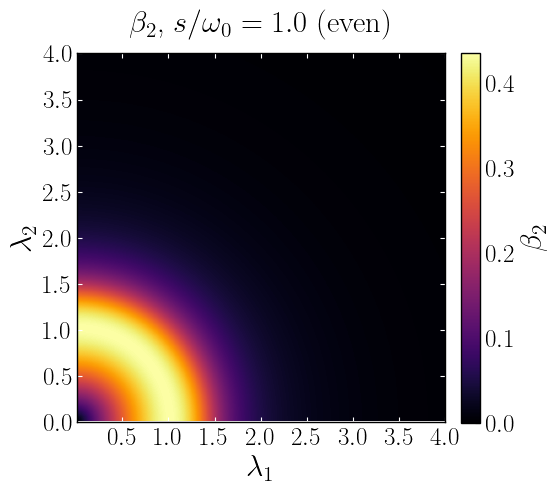

...

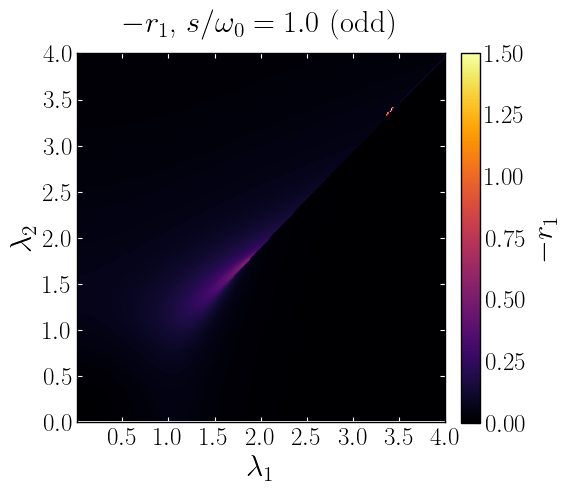

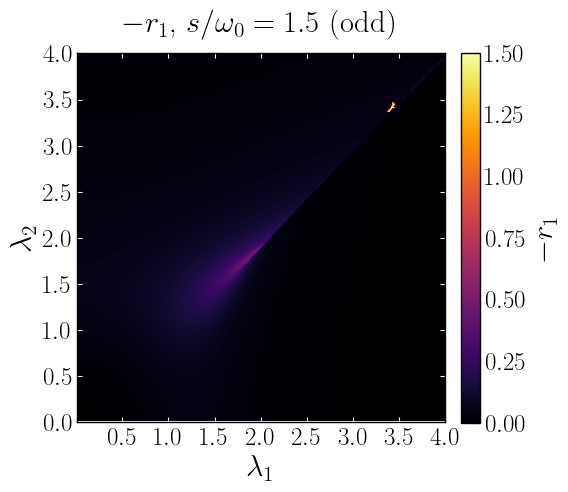

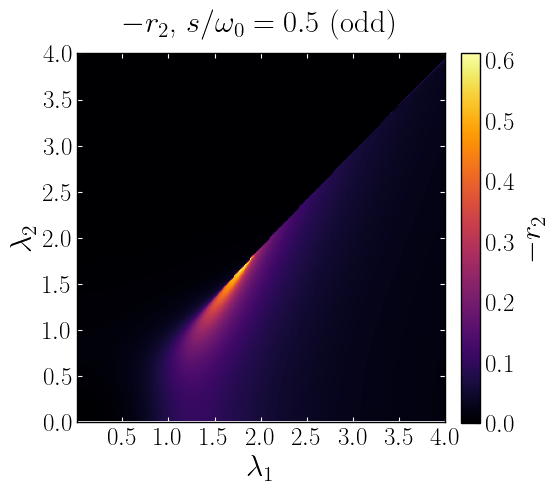

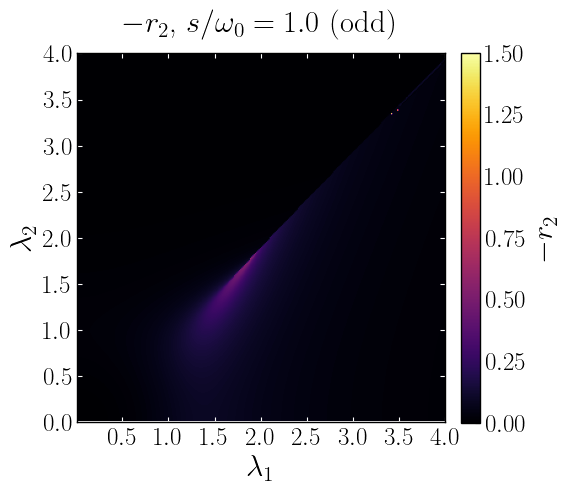

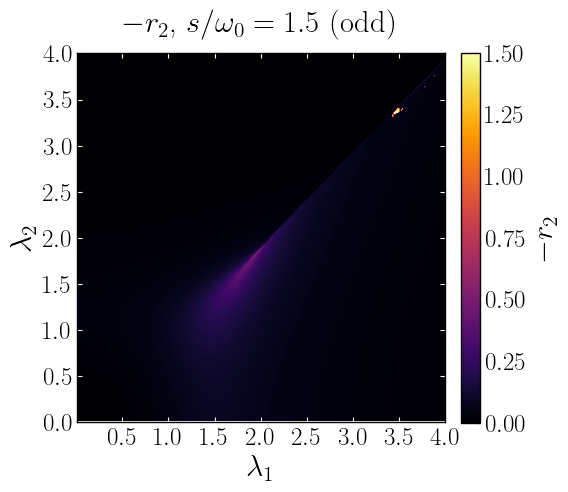

In [ ]:
extent = [lam1_arr[0], lam1_arr[-1], lam2_arr[0], lam2_arr[-1]]

# entradas: (dict, signo, label, ftag, zoom)   zoom=True → genera zoom extra
param_maps_even = [(a1_e,-1,r'$-\beta_1$','mbeta1',False),(a2_e,+1,r'$\beta_2$','beta2',False),
                   (r1_e,-1,r'$-\xi_1$','mxi1',False),(r2_e,-1,r'$-\xi_2$','mxi2',False)]
param_maps_odd  = [(a1_o, 1,r'$\alpha_1$','alpha1',True),(a2_o,-1,r'$-\alpha_2$','malpha2',True),
                   (r1_o,-1,r'$-r_1$','mr1',False),(r2_o,-1,r'$-r_2$','mr2',False)]

ZOOM_LIM = (0.0, 1.5)   # límites del zoom en ambos ejes

def _param_heatmaps(param_maps, sector_tag):
    for dct, sgn, lbl, ftag, zoom in param_maps:
        for cv in cv_list:
            data = sgn*dct[cv]; vmax = np.nanmax(data)

            # ── heatmap principal ──
            fig, ax = plt.subplots(figsize=(6, 5.5))
            im = ax.imshow(data, origin='lower', aspect='equal', extent=extent,
                           cmap='inferno', vmin=0.0, vmax=vmax)
            fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=lbl)
            ax.set_xlabel(r'$\lambda_1$'); ax.set_ylabel(r'$\lambda_2$')
            ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                           right=True, left=True, color='white')
            ax.set_xticks([0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0])
            ax.set_yticks([0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0])
            ax.set_title(rf'{lbl},  $s/\omega_0={cv}$ ({sector_tag})', pad=15)
            plt.tight_layout()
            plt.savefig(f'Resultados_aniso/heatmap_{ftag}_{sector_tag}_cv{cv}.png',
                        bbox_inches='tight', transparent=False, dpi=300)
            plt.show()

            # ── heatmap de zoom (opcional), colorbar reescalada a la máscara ──
            if zoom:
                lo, hi = ZOOM_LIM
                mask1 = (lam1_arr >= lo) & (lam1_arr <= hi)
                mask2 = (lam2_arr >= lo) & (lam2_arr <= hi)
                sub = data[np.ix_(mask2, mask1)]           # [i2, j1]
                vmin_z, vmax_z = np.nanmin(sub), np.nanmax(sub)
                extent_z = [lam1_arr[mask1][0], lam1_arr[mask1][-1],
                            lam2_arr[mask2][0], lam2_arr[mask2][-1]]

                fig, ax = plt.subplots(figsize=(6, 5.5))
                im = ax.imshow(sub, origin='lower', aspect='equal', extent=extent_z,
                               cmap='inferno', vmin=vmin_z, vmax=vmax_z)
                fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=lbl)
                ax.set_xlabel(r'$\lambda_1$'); ax.set_ylabel(r'$\lambda_2$')
                ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                               right=True, left=True, color='white')
                ax.set_xticks([0.0, 0.5, 1.0, 1.5]); ax.set_yticks([0.0, 0.5, 1.0, 1.5])
                ax.set_title(rf'{lbl} (zoom),  $s/\omega_0={cv}$ ({sector_tag})', pad=15)
                plt.tight_layout()
                plt.savefig(f'Resultados_aniso/heatmap_{ftag}_{sector_tag}_cv{cv}_zoom.png',
                            bbox_inches='tight', transparent=False, dpi=300)
                plt.show()

_param_heatmaps(param_maps_even, 'even')
_param_heatmaps(param_maps_odd,  'odd')

Cut params (even), $\rho=0.5,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ \Delta/\omega_0=0.5$


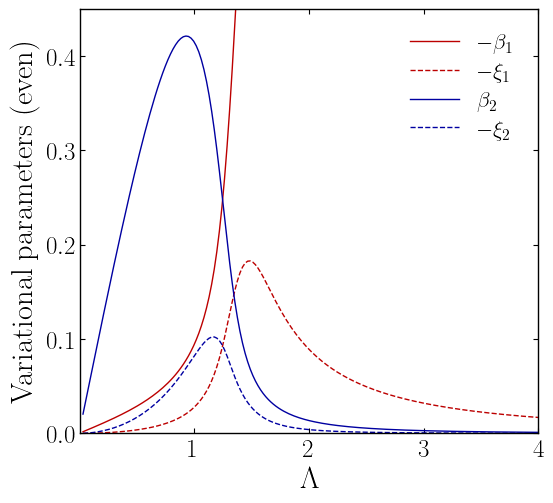

Cut params (even), $\rho=0.5,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ \Delta/\omega_0=1.0$


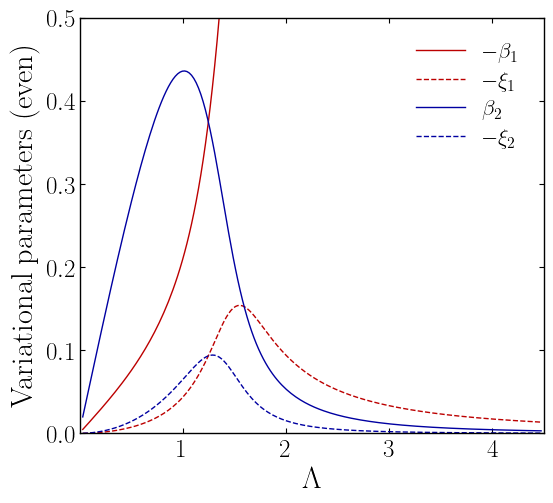

Cut params (even), $\rho=0.5,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ \Delta/\omega_0=1.5$


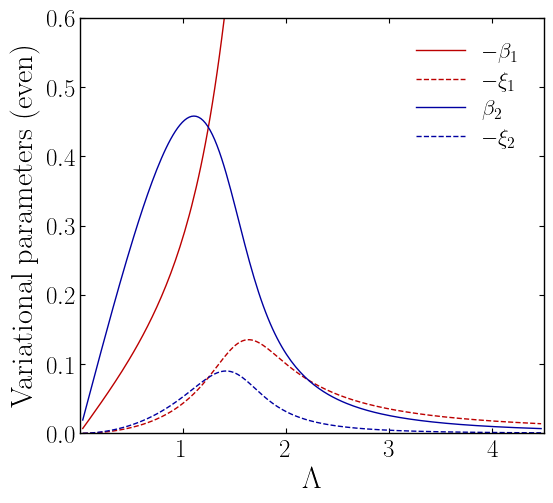

Cut params (even), $\rho=1.0,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ \Delta/\omega_0=0.5$


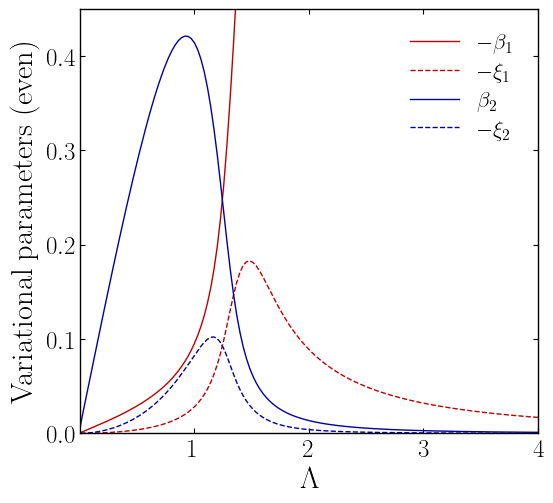

Cut params (even), $\rho=1.0,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ \Delta/\omega_0=1.0$


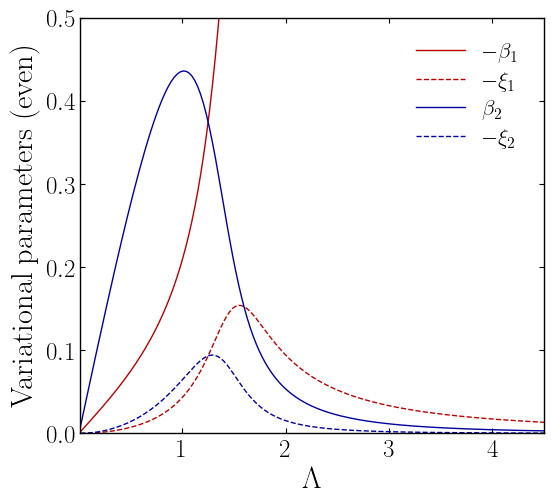

Cut params (even), $\rho=1.0,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ \Delta/\omega_0=1.5$


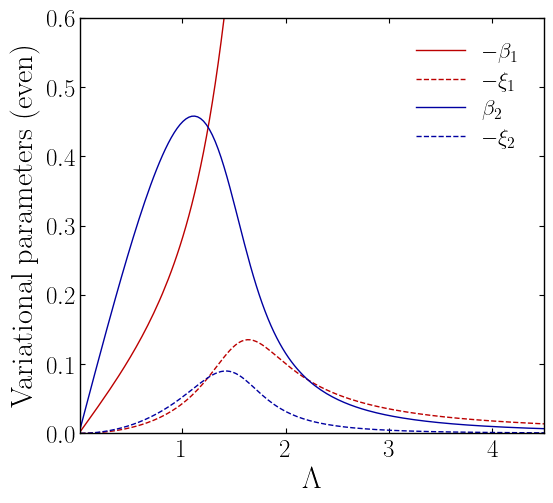

Cut params (even), $\rho=1.5,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ \Delta/\omega_0=0.5$


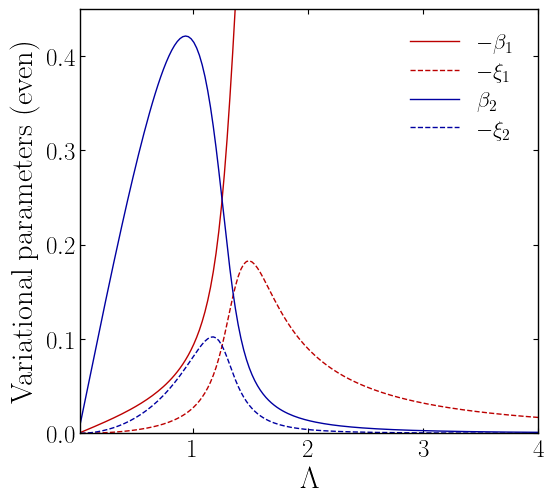

Cut params (even), $\rho=1.5,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ \Delta/\omega_0=1.0$


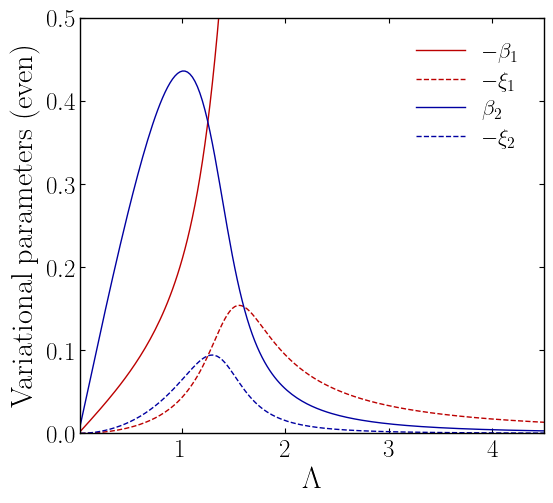

Cut params (even), $\rho=1.5,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ \Delta/\omega_0=1.5$


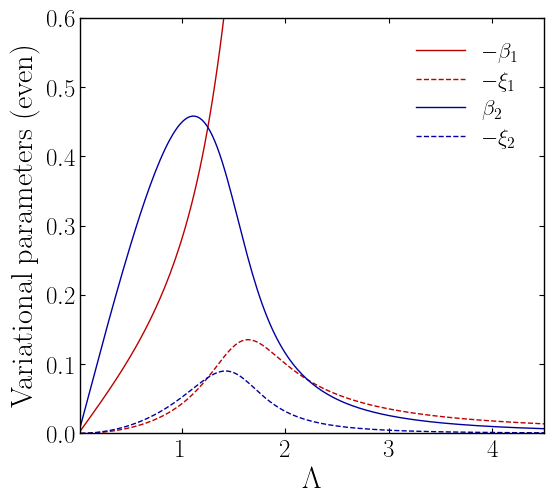

Cut params (odd), $\rho=0.5,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ t/\omega_0=0.5$


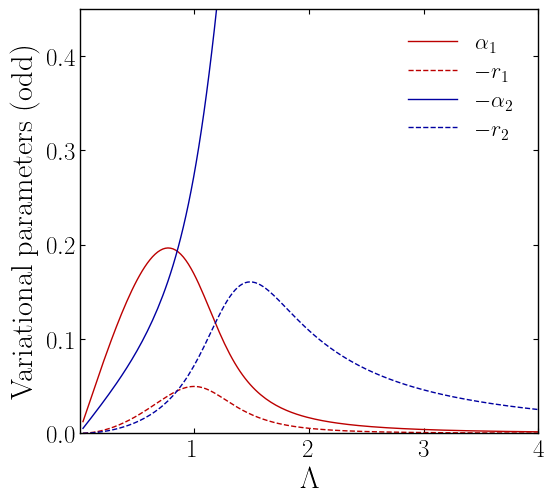

Cut params (odd), $\rho=0.5,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ t/\omega_0=1.0$


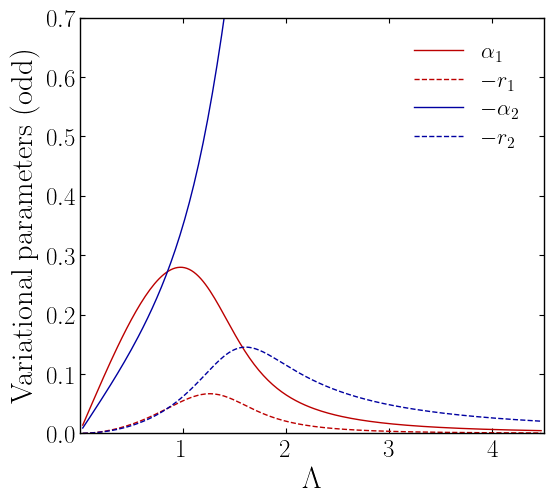

Cut params (odd), $\rho=0.5,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ t/\omega_0=1.5$


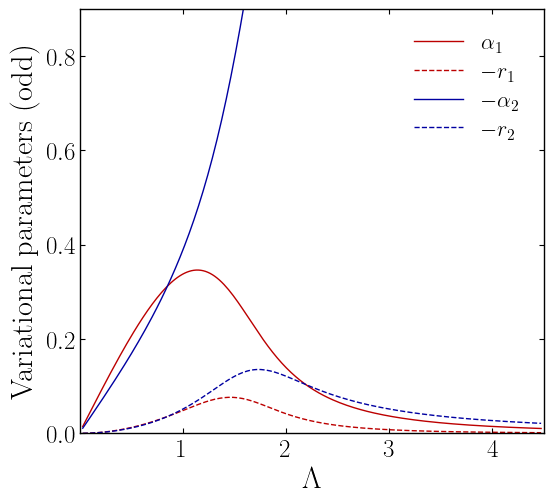

Cut params (odd), $\rho=1.0,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ t/\omega_0=0.5$


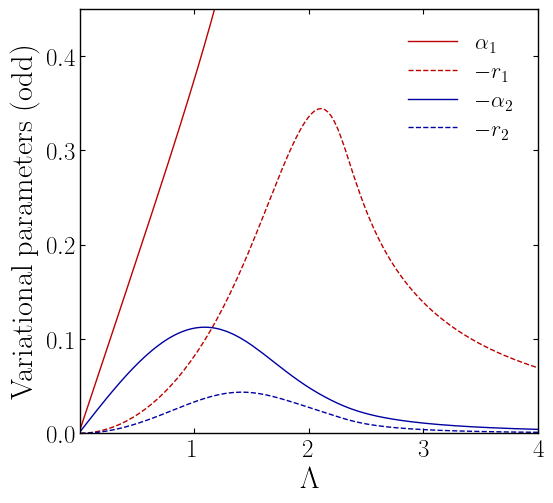

Cut params (odd), $\rho=1.0,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ t/\omega_0=1.0$


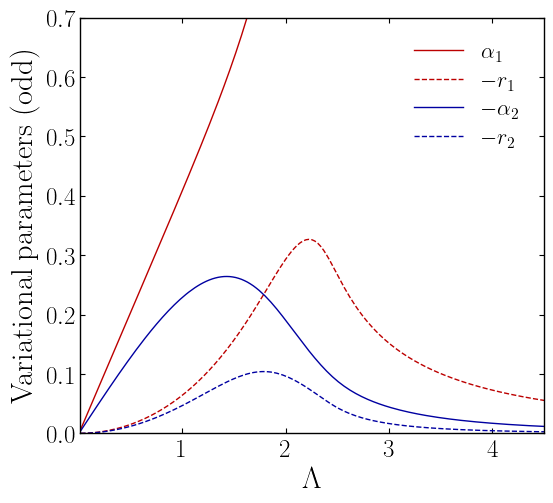

Cut params (odd), $\rho=1.0,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ t/\omega_0=1.5$


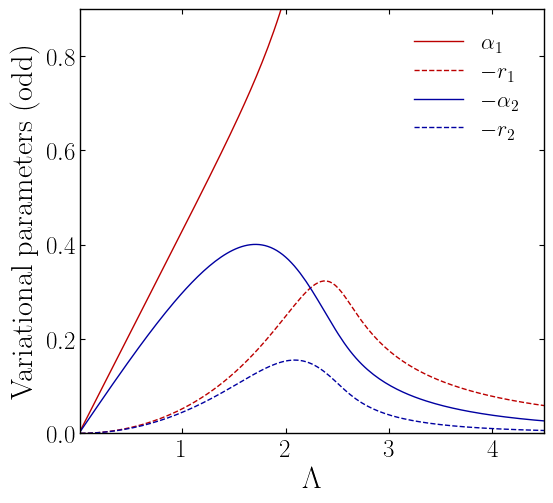

Cut params (odd), $\rho=1.5,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ t/\omega_0=0.5$


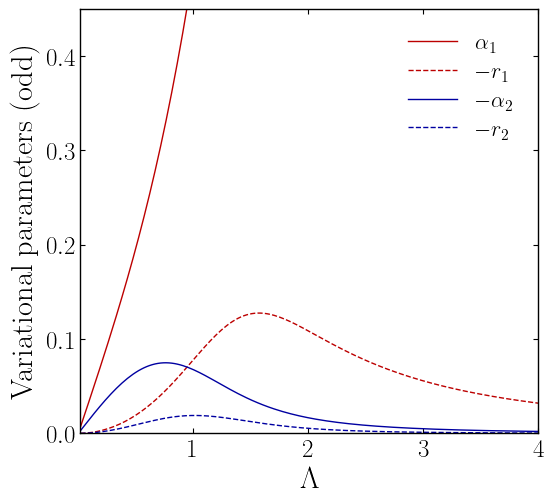

Cut params (odd), $\rho=1.5,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ t/\omega_0=1.0$


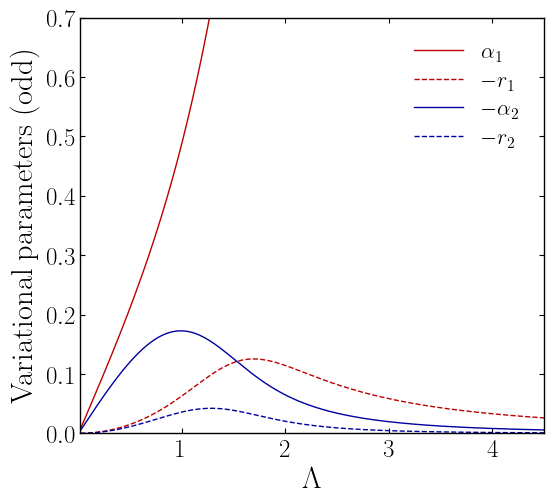

Cut params (odd), $\rho=1.5,\ \varepsilon_1=1.0,\ \varepsilon_2=0.5625,\ t/\omega_0=1.5$


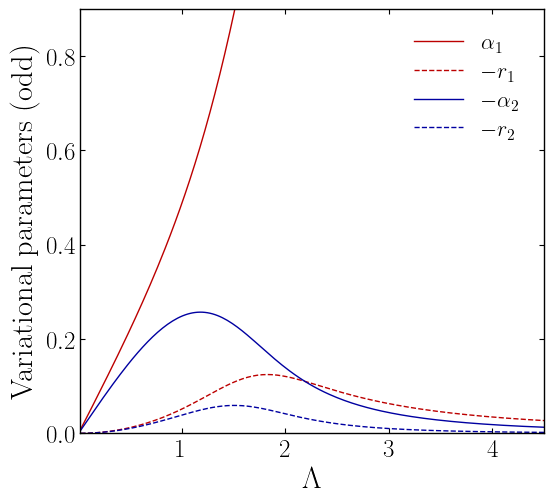

In [ ]:
from scipy.interpolate import RegularGridInterpolator
C_A = plt.cm.seismic(0.12)   # azul  (bloque 2)
C_B = plt.cm.seismic(0.88)   # rojo  (bloque 1)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

ylim_by_cv1 = {0.5: 0.45, 1.0: 0.5, 1.5: 0.6}
xlim_by_cv = {0.5: 4.0, 1.0: 4.5, 1.5: 4.5}
ylim_by_cv2 = {0.5: 0.45, 1.0: 0.7, 1.5: 0.9}


def _cut_along_rho(data2d, rho, n_cut=200):
    interp = RegularGridInterpolator((lam2_arr, lam1_arr), data2d, bounds_error=False, fill_value=np.nan)
    l1max = min(lam1_arr[-1], lam2_arr[-1]/rho)
    l1 = np.linspace(max(lam1_arr[0], 0.01), l1max, n_cut)
    l2 = rho*l1
    Lam = np.sqrt(l1**2 + l2**2)
    vals = interp(np.column_stack([l2, l1]))
    return Lam, vals

# ── (ii) Cortes λ₂=ρλ₁ — parámetros variacionales del PAR ────────
for rho in rho_list:
    for cv in cv_list:
        pstr = rf"$\rho={rho},\ \varepsilon_1={eps1_val},\ \varepsilon_2={eps2_val},\ \Delta/\omega_0={cv}$"
        print('Cut params (even), ' + pstr)
        fig, ax = plt.subplots(figsize=(6, 5.5))
        Lc,v=_cut_along_rho(-a1_e[cv],rho); ax.plot(Lc, v, '-',  color=C_B, lw=1.0, label=r'$-\beta_1$')
        Lc,v=_cut_along_rho(-r1_e[cv],rho); ax.plot(Lc, v, '--', color=C_B, lw=1.0, label=r'$-\xi_1$')
        Lc,v=_cut_along_rho( a2_e[cv],rho); ax.plot(Lc, v, '-',  color=C_A, lw=1.0, label=r'$\beta_2$')
        Lc,v=_cut_along_rho(-r2_e[cv],rho); ax.plot(Lc, v, '--', color=C_A, lw=1.0, label=r'$-\xi_2$')
        ax.set_xlim(Lc[0], xlim_by_cv[cv])
        ax.set_ylim(0.0, ylim_by_cv1[cv])
        ax.set_xlabel(r'$\Lambda$'); ax.set_ylabel(r'Variational parameters (even)')
        ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
        ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)
        plt.tight_layout()
        plt.savefig(f'Resultados_aniso/cut_params_even_rho{rho}_cv{cv}.png', bbox_inches='tight', transparent=False, dpi=300)
        plt.show()
       

# ── (ii) Cortes λ₂=ρλ₁ — parámetros variacionales del IMPAR ──────
for rho in rho_list:
    for cv in cv_list:
        pstr = rf"$\rho={rho},\ \varepsilon_1={eps1_val},\ \varepsilon_2={eps2_val},\ t/\omega_0={cv}$"
        print('Cut params (odd), ' + pstr)
        fig, ax = plt.subplots(figsize=(6, 5.5))
        Lc,v=_cut_along_rho( a1_o[cv],rho); ax.plot(Lc, v, '-',  color=C_B, lw=1.0, label=r'$\alpha_1$')
        Lc,v=_cut_along_rho(-r1_o[cv],rho); ax.plot(Lc, v, '--', color=C_B, lw=1.0, label=r'$-r_1$')
        Lc,v=_cut_along_rho(-a2_o[cv],rho); ax.plot(Lc, v, '-',  color=C_A, lw=1.0, label=r'$-\alpha_2$')
        Lc,v=_cut_along_rho(-r2_o[cv],rho); ax.plot(Lc, v, '--', color=C_A, lw=1.0, label=r'$-r_2$')
        ax.set_xlim(Lc[0], xlim_by_cv[cv])
        ax.set_ylim(0.0, ylim_by_cv2[cv])
        ax.set_xlabel(r'$\Lambda$'); ax.set_ylabel(r'Variational parameters (odd)')
        ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
        ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)
        plt.tight_layout()
        plt.savefig(f'Resultados_aniso/cut_params_odd_rho{rho}_cv{cv}.png', bbox_inches='tight', transparent=False, dpi=300)
        plt.show()
       

Infidelity (even), $\Delta/\omega_0=0.5$


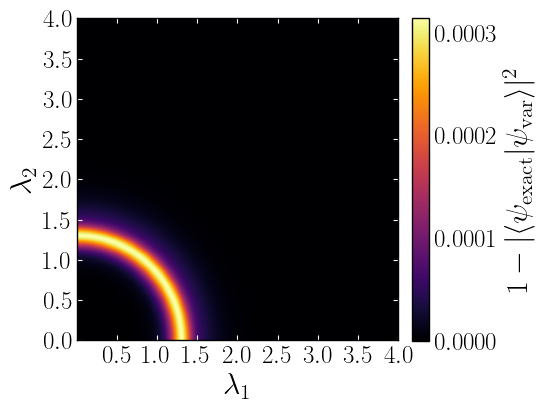

Relative error (even), $\Delta/\omega_0=0.5$


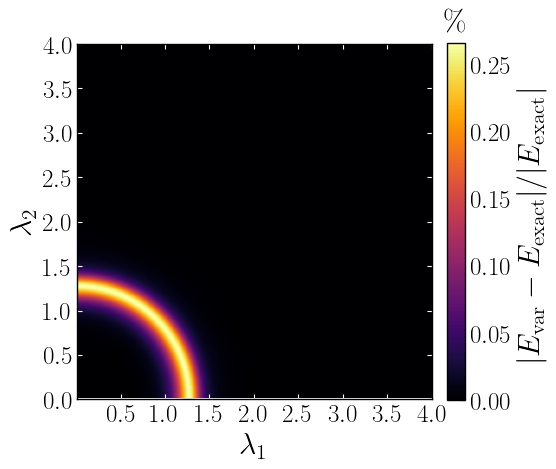

Infidelity (even), $\Delta/\omega_0=1.0$


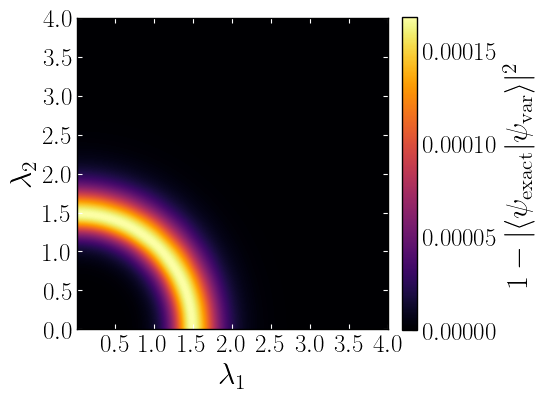

Relative error (even), $\Delta/\omega_0=1.0$


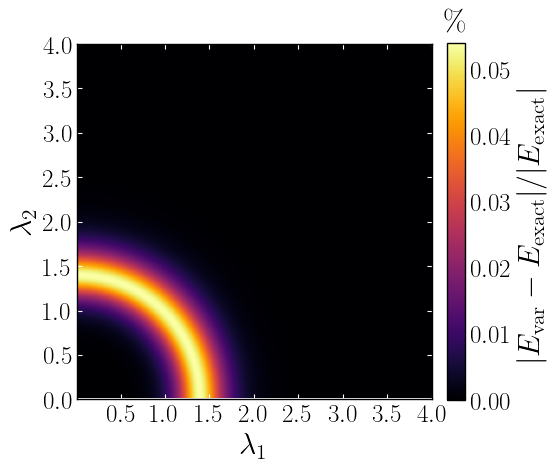

Infidelity (even), $\Delta/\omega_0=1.5$


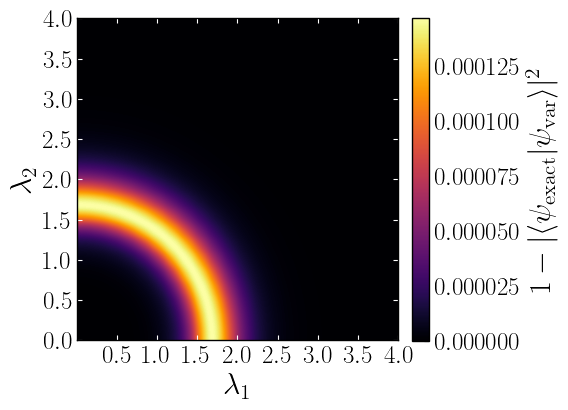

Relative error (even), $\Delta/\omega_0=1.5$


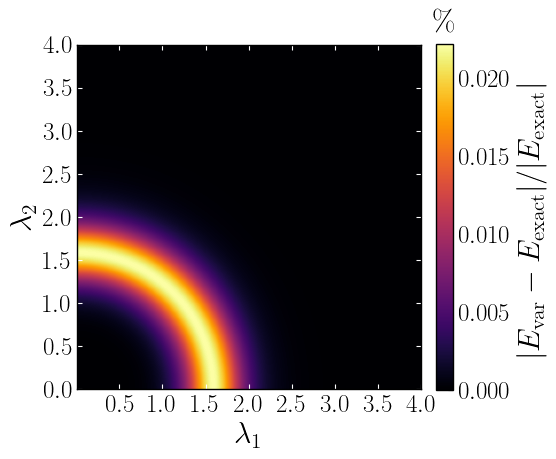

Infidelity (odd), $t/\omega_0=0.5$


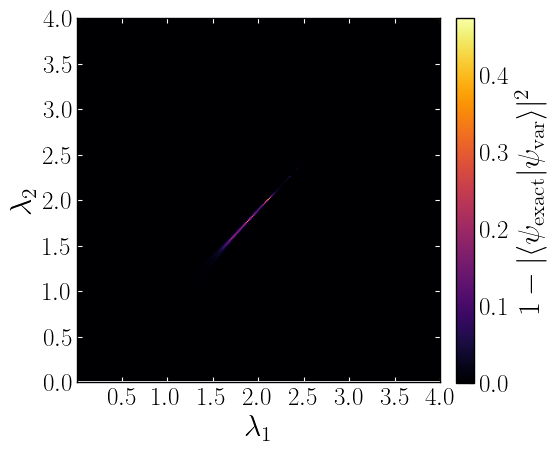

Relative error (odd), $t/\omega_0=0.5$


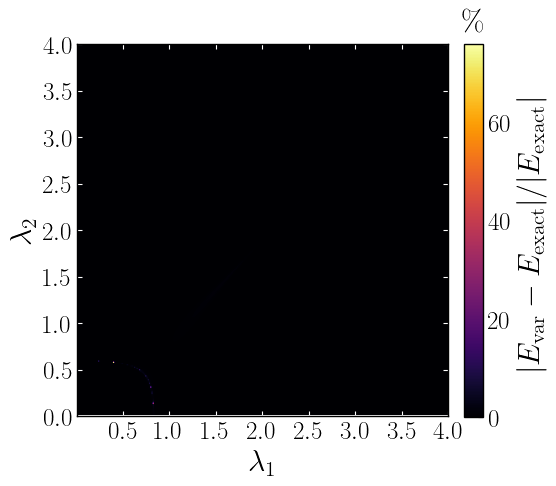

Infidelity (odd), $t/\omega_0=1.0$


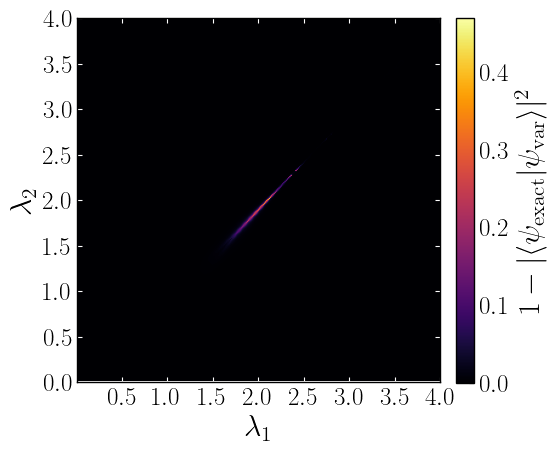

Relative error (odd), $t/\omega_0=1.0$


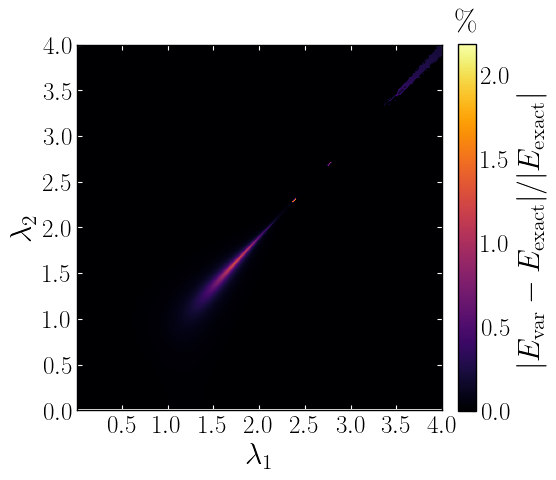

Infidelity (odd), $t/\omega_0=1.5$


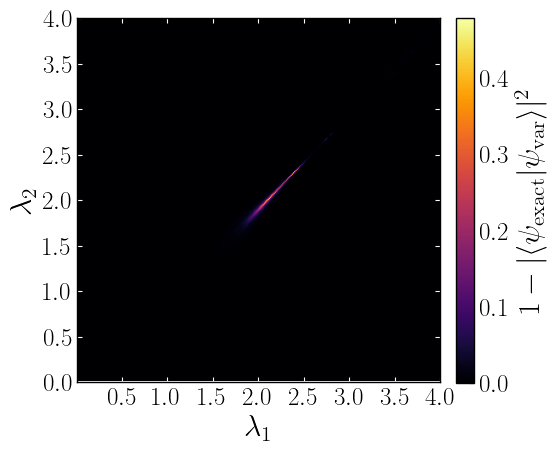

Relative error (odd), $t/\omega_0=1.5$


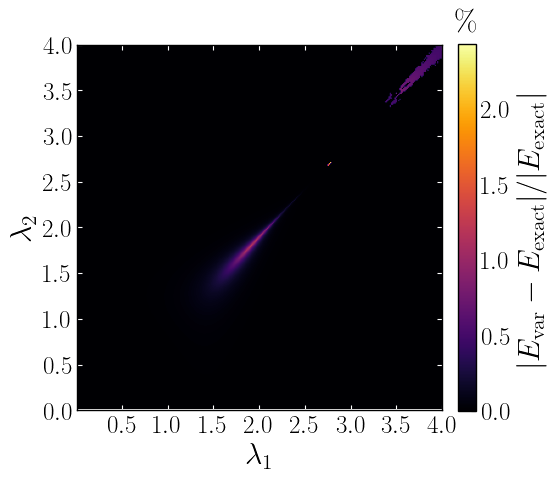

In [ ]:
# ══════════════════════════════════════════════════════════════════
# (iii-a) HEATMAPS de infidelidad y error — UNA FIGURA POR HEATMAP
# ══════════════════════════════════════════════════════════════════
def _single_heatmap(data, label, ftag, percent=False):
    vmax = np.nanmax(data)
    fig, ax = plt.subplots(figsize=(6, 5.5))
    im = ax.imshow(data, origin='lower', aspect='equal', extent=extent,
                   cmap='inferno', vmin=0.0, vmax=vmax)
    cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=label)
    if percent:
        cb.ax.text(0.5, 1.02, r'$\%$', transform=cb.ax.transAxes,
                   ha='center', va='bottom')
    ax.set_xlabel(r'$\lambda_1$'); ax.set_ylabel(r'$\lambda_2$')
    ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                   right=True, left=True, color='white')
    ax.set_xticks([0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0])
    ax.set_yticks([0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0])
    plt.tight_layout()
    plt.savefig(f'Resultados_aniso/heatmap_{ftag}.png', bbox_inches='tight',
                transparent=False, dpi=300)
    plt.show()

# ── sector PAR ──
for cv in cv_list:
    print(rf'Infidelity (even), $\Delta/\omega_0={cv}$')
    _single_heatmap(1.0 - fid_e[cv],
                    r'$1-|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$',
                    f'infid_even_cv{cv}')

    print(rf'Relative error (even), $\Delta/\omega_0={cv}$')
    _single_heatmap(100.0 * rel_e[cv],
                    r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
                    f'relerr_even_cv{cv}', percent=True)

# ── sector IMPAR ──
for cv in cv_list:
    print(rf'Infidelity (odd), $t/\omega_0={cv}$')
    _single_heatmap(1.0 - fid_o[cv],
                    r'$1-|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$',
                    f'infid_odd_cv{cv}')

    print(rf'Relative error (odd), $t/\omega_0={cv}$')
    _single_heatmap(100.0 * rel_o[cv],
                    r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
                    f'relerr_odd_cv{cv}', percent=True)

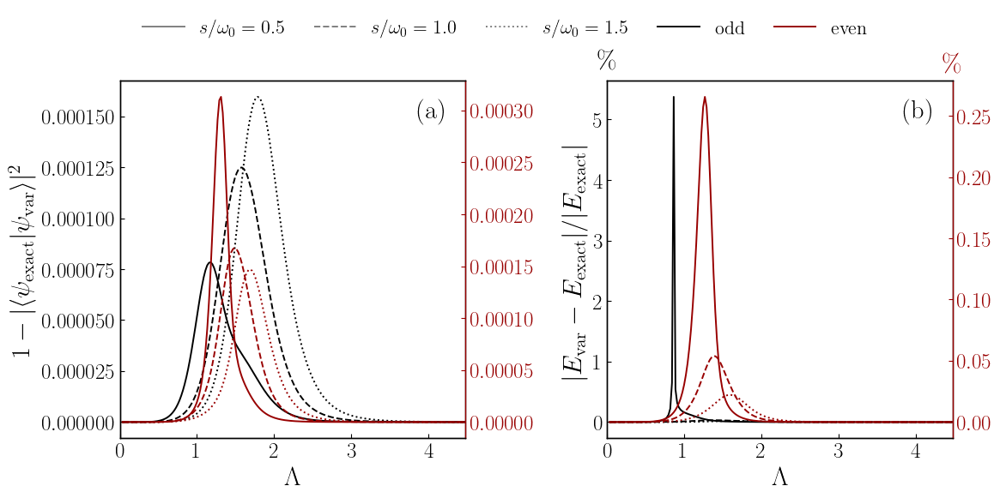

Fidelity + relative error by sector, rho=0.5


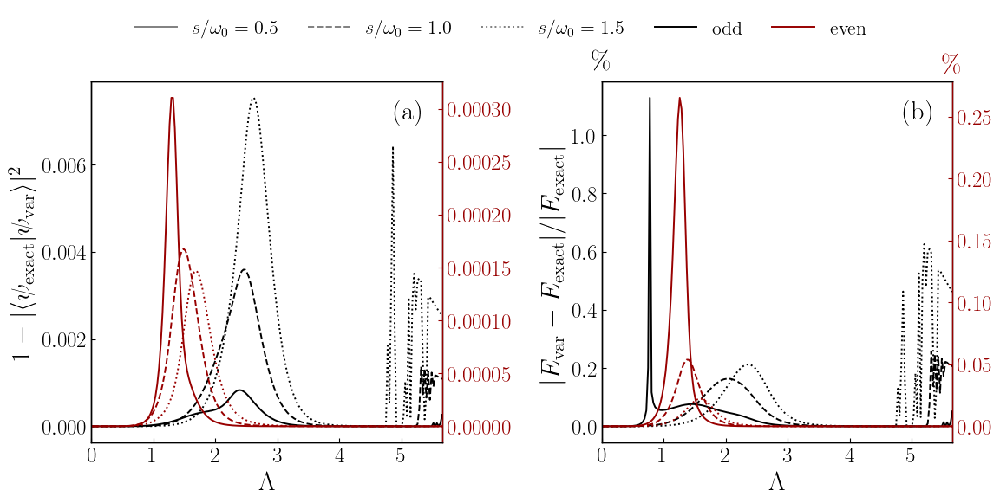

Fidelity + relative error by sector, rho=1.0


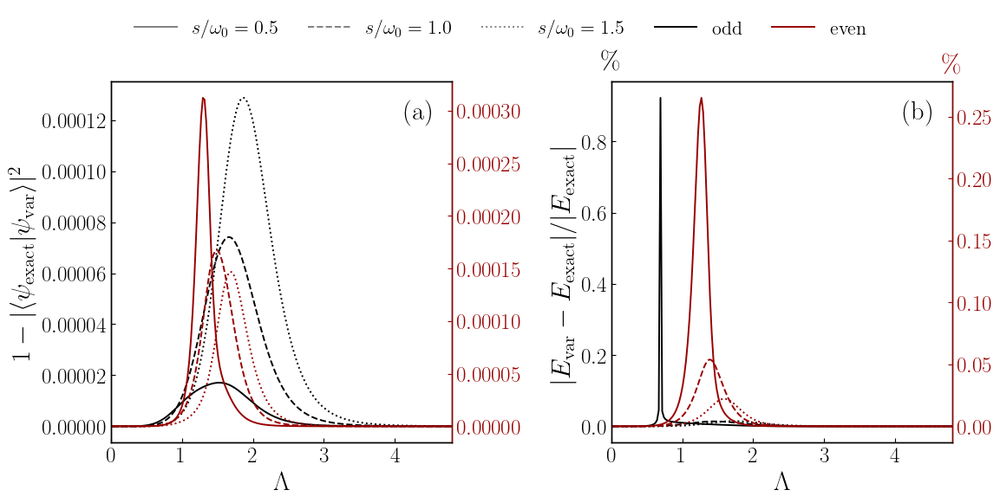

Fidelity + relative error by sector, rho=1.5


In [ ]:
# ══════════════════════════════════════════════════════════════════
# (iii-b) CORTE λ₂=ρλ₁ — figura de 2 paneles estilo isotrópico:
#   (a) infidelidad   (b) error relativo (%)
#   impar = negro (eje izq), par = rojo (eje der), LS por cv
# ══════════════════════════════════════════════════════════════════
LS     = {0.5: '-', 1.0: '--', 1.5: ':'}
C_ODD  = 'black'
C_EVEN = plt.cm.seismic(0.95)   # rojo intenso

for rho in rho_list:
    fig, (ax_o1, ax_o2) = plt.subplots(1, 2, figsize=(12, 6))

    # ═══════════════════════════════════════════════════════════
    # Panel (a): infidelidad
    # ═══════════════════════════════════════════════════════════
    ax_e1 = ax_o1.twinx()

    for cv in cv_list:
        Lc, fo = _cut_along_rho(1.0 - fid_o[cv], rho)
        Lc, fe = _cut_along_rho(1.0 - fid_e[cv], rho)
        ax_o1.plot(Lc, fo, LS[cv], color=C_ODD,  lw=1.4)
        ax_e1.plot(Lc, fe, LS[cv], color=C_EVEN, lw=1.4)

    ax_o1.set_xlabel(r'$\Lambda$')
    ax_o1.set_ylabel(r'$1-|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$', color=C_ODD)
    ax_o1.tick_params(axis='y', colors=C_ODD,  direction='in')
    ax_o1.tick_params(axis='x', direction='in')
    ax_o1.set_xlim(Lc[0], Lc[-1])

    ax_e1.tick_params(axis='y', colors=C_EVEN, direction='in')
    ax_e1.spines['right'].set_color(C_EVEN)
    ax_e1.spines['left'].set_color(C_ODD)

    ax_o1.text(0.95, 0.95, '(a)', transform=ax_o1.transAxes, ha='right', va='top', fontweight='bold')
    ax_o1.set_xticks( np.arange(0, np.floor(Lc[-1]) + 1, 1))    

    # ═══════════════════════════════════════════════════════════
    # Panel (b): error relativo (%)
    # ═══════════════════════════════════════════════════════════
    ax_e2 = ax_o2.twinx()

    for cv in cv_list:
        Lc, ro = _cut_along_rho(rel_o[cv], rho)
        Lc, re = _cut_along_rho(rel_e[cv], rho)
        ax_o2.plot(Lc, 100*ro, LS[cv], color=C_ODD,  lw=1.4)
        ax_e2.plot(Lc, 100*re, LS[cv], color=C_EVEN, lw=1.4)

    ax_o2.set_xlabel(r'$\Lambda$')
    ax_o2.set_ylabel(r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
                     color=C_ODD)
    ax_o2.tick_params(axis='y', colors=C_ODD,  direction='in')
    ax_o2.tick_params(axis='x', direction='in')
    ax_o2.set_xlim(Lc[0], Lc[-1])

    ax_e2.tick_params(axis='y', colors=C_EVEN, direction='in')
    ax_e2.spines['right'].set_color(C_EVEN)
    ax_e2.spines['left'].set_color(C_ODD)

    ax_o2.text(0.0, 1.02, r'$\%$', transform=ax_o2.transAxes, color=C_ODD, ha='center', va='bottom')
    ax_e2.text(1.0, 1.01, r'$\%$', transform=ax_e2.transAxes, color=C_EVEN, ha='center', va='bottom')

    ax_o2.text(0.95, 0.95, '(b)', transform=ax_o2.transAxes, ha='right', va='top', fontweight='bold')
    ax_o2.set_xticks( np.arange(0, np.floor(Lc[-1]) + 1, 1))

    # ═══════════════════════════════════════════════════════════
    # Leyenda compartida — arriba, una sola fila
    # ═══════════════════════════════════════════════════════════
    handles = [mlines.Line2D([], [], color='gray', ls=LS[cv], lw=1.4,
                             label=rf'$s/\omega_0={cv}$') for cv in cv_list]
    handles += [mlines.Line2D([], [], color=C_ODD,  lw=1.4, label='odd'),
                mlines.Line2D([], [], color=C_EVEN, lw=1.4, label='even')]

    fig.legend(handles=handles,
               loc='upper center',
               bbox_to_anchor=(0.5, 1.01),
               ncol=len(handles),
               frameon=False,
               borderpad=0.6, handlelength=2.2, labelspacing=0.4,
               columnspacing=1.5)

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.savefig(f'Resultados_aniso/Fidelidad_y_error_relativo_por_sector_rho{rho}.png',
                bbox_inches='tight', transparent=False, dpi=300)
    plt.show()
    print(f'Fidelity + relative error by sector, rho={rho}')

## Cross-Correlation,  $\varepsilon_1$ = 0.25, $\varepsilon_2$ = 0.25

In [ ]:
def compute_Xb2_recentered_CM(evec, nph, n_ph, lam1, lam2, sector):
    """
    <X_b²> del modo acoplado tras el re-centrado D(∓Λ/2), caso anisotrópico.
    Modo acoplado: relativo (impar) / CoM (par).
    Signo del re-centrado por bloque según la convención de pseudospin del sector:
      impar (σ_z): bloque1=↑=|10⟩ → −√2Λ ; bloque2=↓=|01⟩ → +√2Λ
      par   (τ_z): bloque1=↑=|11⟩ → +√2Λ ; bloque2=↓=|00⟩ → −√2Λ   (INVERTIDO)
    """
    Lam = np.sqrt(lam1**2 + lam2**2)
    inv   = 1.0 / np.sqrt(max(np.dot(evec.conj(), evec).real, 1e-30))
    psi_A = (evec[:n_ph] * inv).reshape(nph, nph)   # bloque 1 (↑)
    psi_B = (evec[n_ph:] * inv).reshape(nph, nph)   # bloque 2 (↓)

    a  = np.diag(np.sqrt(np.arange(1, nph)), 1)
    X1 = (a + a.T) / np.sqrt(2.0)
    X2 = X1 @ X1

    def moments(psi):
        w = float(np.sum(np.abs(psi)**2))
        if w < 1e-15:
            return 0.0, 0.0, 0.0
        if sector == 'odd':          # relativo: actúa sobre filas
            Xp  = X1 @ psi;  X2p = X2 @ psi
        else:                        # CoM: actúa sobre columnas
            Xp  = psi @ X1;  X2p = psi @ X2
        xb  = float(np.real(np.sum(psi.conj() * Xp)))  / w
        x2b = float(np.real(np.sum(psi.conj() * X2p))) / w
        return w, xb, x2b

    c1sq, Xb1, X2b1 = moments(psi_A)
    c2sq, Xb2, X2b2 = moments(psi_B)

    s2L = np.sqrt(2.0) * Lam
    if sector == 'odd':
        sgn1, sgn2 = -1.0, +1.0
    else:
        sgn1, sgn2 = +1.0, -1.0      # INVERTIDO en el par

    term1 = c1sq * (X2b1 + sgn1 * s2L * Xb1)
    term2 = c2sq * (X2b2 + sgn2 * s2L * Xb2)
    return term1 + term2 + Lam**2 / 2.0

    c1sq, Xb1, X2b1 = moments(psi_A)
    c2sq, Xb2, X2b2 = moments(psi_B)

    s2L = np.sqrt(2.0) * Lam
    term1 = c1sq * (X2b1 - s2L * Xb1)
    term2 = c2sq * (X2b2 + s2L * Xb2)
    return term1 + term2 + Lam**2 / 2.0


def compute_X1X2_CM(evec_e, evec_o, nph, n_ph, lam1, lam2):
    """
    Cross-correlator <X̂₁X̂₂> por sector:
        <X̂₁X̂₂>_{e/o} = ± (λ₁λ₂/Λ²)(<X̂_b²> − ½)
    Signo: par (+), impar (−).
    Devuelve (X1X2_even, X1X2_odd).
    """
    Lam  = np.sqrt(lam1**2 + lam2**2)
    pref = lam1 * lam2 / Lam**2

    Xb2_e = compute_Xb2_recentered_CM(evec_e, nph, n_ph, lam1, lam2, 'even')
    Xb2_o = compute_Xb2_recentered_CM(evec_o, nph, n_ph, lam1, lam2, 'odd')

    X1X2_e = + pref * (Xb2_e - 0.5)
    X1X2_o = - pref * (Xb2_o - 0.5)
    return X1X2_e, X1X2_o


def compute_point_X1X2(i2, j1, lam1, lam2, cv):
    """Un nodo (λ₁,λ₂). Devuelve <X₁X₂> de ambos sectores."""
    global t
    t = cv
    M_loc = get_M_CM(lam1, lam2, M_max)
    ev_e, evec_e, ev_o, evec_o, nph, n_ph = diagonalize_CM(
        M=M_loc, eps1=eps1_val, eps2=eps2_val, t=t, Delta=cv,
        omega0=omega0, g1=lam1*omega0, g2=lam2*omega0)
    X1X2_e, X1X2_o = compute_X1X2_CM(
        evec_e[:, 0], evec_o[:, 0], nph, n_ph, lam1, lam2)
    return i2, j1, X1X2_e, X1X2_o

In [ ]:
# ══════════════════════════════════════════════════════════════════
# EJECUCIÓN — <X₁X₂> por sector, plano (λ₁,λ₂) ∈ [0,3]², evaluación directa
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
eps1_val = 0.25
eps2_val = 0.25
M_max    = 15

cv       = 1.0                       # t (impar) = Δ (par)
n_lam    = 100
lam1_arr = np.linspace(0.01, 3.0, n_lam)
lam2_arr = np.linspace(0.01, 3.0, n_lam)

X1X2_even = np.full((n_lam, n_lam), np.nan)   # [i2, j1]
X1X2_odd  = np.full((n_lam, n_lam), np.nan)

args = [(i2, j1, lam1_arr[j1], lam2_arr[i2], cv)
        for i2 in range(n_lam) for j1 in range(n_lam)]

print(f"Plano {n_lam}×{n_lam} = {n_lam*n_lam} nodos, cv={cv} ...", flush=True)
chunks = np.array_split(np.arange(len(args)), 20); done = 0
with joblib.parallel_backend('loky', n_jobs=-1):
    for ch in chunks:
        res = joblib.Parallel()(joblib.delayed(compute_point_X1X2)(*args[a]) for a in ch)
        for (i2, j1, xe, xo) in res:
            X1X2_even[i2, j1] = xe
            X1X2_odd[i2, j1]  = xo
        done += len(ch)
        print(f"   {100.0*done/len(args):5.1f}%", flush=True)

print("Listo.")
print(f"  <X1X2>_even: [{np.nanmin(X1X2_even):.4f}, {np.nanmax(X1X2_even):.4f}]")
print(f"  <X1X2>_odd : [{np.nanmin(X1X2_odd):.4f}, {np.nanmax(X1X2_odd):.4f}]")

Plano 100×100 = 10000 nodos, cv=1.0 ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
Listo.
  <X1X2>_even: [0.0000, 4.4530]
  <X1X2>_odd : [-4.3748, -0.0000]


<X1X2> sector PAR
$\langle\hat{X}_1\hat{X}_2\rangle$  (par),  $s/\omega_0=1.0$


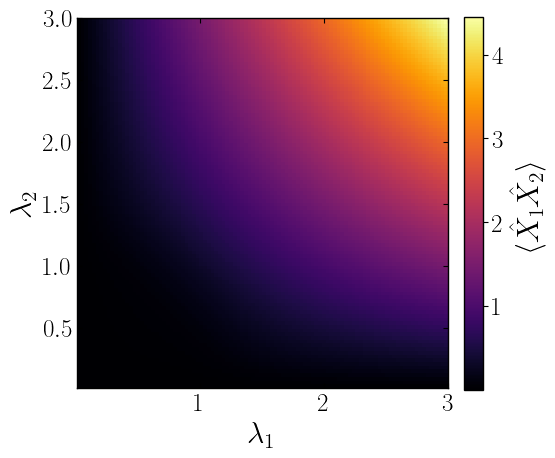

<X1X2> sector IMPAR
$\langle\hat{X}_1\hat{X}_2\rangle$  (impar),  $s/\omega_0=1.0$


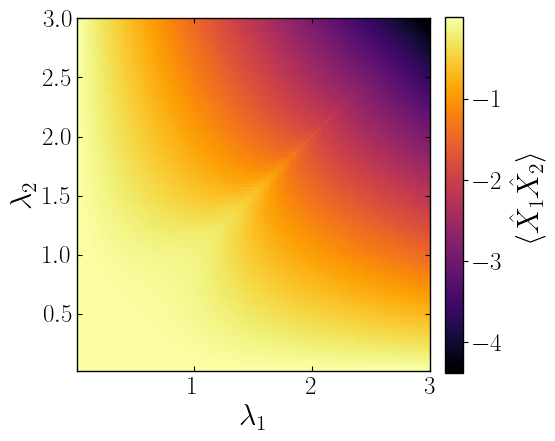

In [ ]:
# ══════════════════════════════════════════════════════════════════
# GRAFICACIÓN — <X₁X₂> par e impar (seismic, simétrico en 0)
# ══════════════════════════════════════════════════════════════════
extent = [lam1_arr[0], lam1_arr[-1], lam2_arr[0], lam2_arr[-1]]

def _plot_X1X2(data, sector_label, ftag):
    print(rf'$\langle\hat{{X}}_1\hat{{X}}_2\rangle$  {sector_label},  'rf'$s/\omega_0={cv}$')
    vmax = np.nanmax(data)
    vmin = np.nanmin(data)
    fig, ax = plt.subplots(figsize=(6, 5.5))
    im = ax.imshow(data, origin='lower', aspect='equal', extent=extent, cmap='inferno', vmin=vmin, vmax=vmax)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=r'$\langle\hat{X}_1\hat{X}_2\rangle$')
    ax.set_xlabel(r'$\lambda_1$'); ax.set_ylabel(r'$\lambda_2$')
    ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True, color='black')
    plt.tight_layout()
    plt.savefig(f'Resultados_aniso/X1X2_{ftag}.png', bbox_inches='tight', transparent=False, dpi=300)
    plt.show()

print(r'<X1X2> sector PAR')
_plot_X1X2(X1X2_even, r'(par)',   'even')

print(r'<X1X2> sector IMPAR')
_plot_X1X2(X1X2_odd,  r'(impar)', 'odd')

In [ ]:
# ── rutas y carga ────────────────────────────────────────────────
omega0   = 1.0
eps1_val = 0.25
eps2_val = 0.25
n_lam_var= 400
cv       = 1.0

param_label = (f"{cv}_omega0{omega0:.1f}" f"_eps1{eps1_val:.2f}_eps2{eps2_val:.2f}" f"_nl1_{n_lam_var}_nl2_{n_lam_var}")
root_dir = (f"variational_params_omega0{omega0:.1f}" f"_eps1{eps1_val:.2f}_eps2{eps2_val:.2f}_nl1_{n_lam_var}_nl2_{n_lam_var}")
cv_dir   = os.path.join(root_dir, f"cv_{cv}")

def _load(name):
    return np.loadtxt(os.path.join(cv_dir, f"{name}_{param_label}.txt"))

lam1_arr_var = _load("coord_lambda1")
lam2_arr_var = _load("coord_lambda2")

a1_o = _load("alpha1_odd");  a2_o = _load("alpha2_odd")
r1_o = _load("r1_odd");      r2_o = _load("r2_odd")
a1_e = _load("alpha1_even"); a2_e = _load("alpha2_even")
r1_e = _load("r1_even");     r2_e = _load("r2_even")
# mapas [i2, j1]: filas = lam2, columnas = lam1

# ── F variacional (Franck-Condon) ────────────────────────────────
def _F(a1, a2, r1, r2, Lam, sigma):
    rho = r2 - r1
    arg = sigma*Lam + a2 - a1
    return np.exp(-arg*arg*np.exp(2*r2)/(1.0+np.exp(2*rho))) / np.sqrt(np.cosh(rho))

def _weights_2x2(A, B, C):
    Emin = 0.5*(A+B) - np.sqrt(0.25*(A-B)**2 + C*C)
    c1, c2 = C, (Emin - A)
    nn = np.hypot(c1, c2)
    if nn < 1e-30:
        return 1.0, 0.0
    return c1/nn, c2/nn

# ── <X_b²> variacional (tu fórmula cerrada) ──────────────────────
def Xb2_var(a1, a2, r1, r2, lam1, lam2, cv, sector):
    Lam = np.sqrt(lam1**2 + lam2**2)
    e1t = eps1_val - lam1**2*omega0
    e2t = eps2_val - lam2**2*omega0
    if sector == 'odd':
        eps, epsp, s, sigma = e1t, e2t, cv, +1.0
        sL1, sL2 = -Lam/2, +Lam/2          # bloque1 ↑=|10⟩ → −Λ/2
    else:
        eps, epsp, s, sigma = 0.0, e1t + e2t, cv, -1.0
        sL1, sL2 = +Lam/2, -Lam/2          # bloque1 ↑=|11⟩ → +Λ/2 (INVERTIDO)
    F = _F(a1, a2, r1, r2, Lam, sigma)
    A = eps  + omega0*(a1*a1 + np.sinh(r1)**2)
    B = epsp + omega0*(a2*a2 + np.sinh(r2)**2)
    C = s*F
    c1, c2 = _weights_2x2(A, B, C)
    # <X_b²> = c1²[2(sL1+α1)² + e^{−2r1}/2] + c2²[2(sL2+α2)² + e^{−2r2}/2]
    blk1 = 2.0*(sL1 + a1)**2 + np.exp(-2*r1)/2.0
    blk2 = 2.0*(sL2 + a2)**2 + np.exp(-2*r2)/2.0
    return c1*c1*blk1 + c2*c2*blk2

# ── cross-correlator variacional en el plano ─────────────────────
X1X2_even_var = np.full((n_lam_var, n_lam_var), np.nan)
X1X2_odd_var  = np.full((n_lam_var, n_lam_var), np.nan)

for i2, lam2 in enumerate(lam2_arr_var):
    for j1, lam1 in enumerate(lam1_arr_var):
        Lam  = np.sqrt(lam1**2 + lam2**2)
        if Lam < 1e-12:
            continue
        pref = lam1*lam2/Lam**2
        Xb2_o = Xb2_var(a1_o[i2,j1], a2_o[i2,j1], r1_o[i2,j1], r2_o[i2,j1],
                        lam1, lam2, cv, 'odd')
        Xb2_e = Xb2_var(a1_e[i2,j1], a2_e[i2,j1], r1_e[i2,j1], r2_e[i2,j1],
                        lam1, lam2, cv, 'even')
        X1X2_odd_var[i2,j1]  = - pref*(Xb2_o - 0.5)
        X1X2_even_var[i2,j1] = + pref*(Xb2_e - 0.5)

print("Cross-correlator variacional listo.")
print(f"  <X1X2>_even_var: [{np.nanmin(X1X2_even_var):.4f}, {np.nanmax(X1X2_even_var):.4f}]")
print(f"  <X1X2>_odd_var : [{np.nanmin(X1X2_odd_var):.4f}, {np.nanmax(X1X2_odd_var):.4f}]")

Cross-correlator variacional listo.
  <X1X2>_even_var: [0.0000, 7.9919]
  <X1X2>_odd_var : [-8.0000, -0.0000]


<X1X2> variacional sector PAR
$\langle\hat{X}_1\hat{X}_2\rangle$  (par),  $s/\omega_0=1.0$


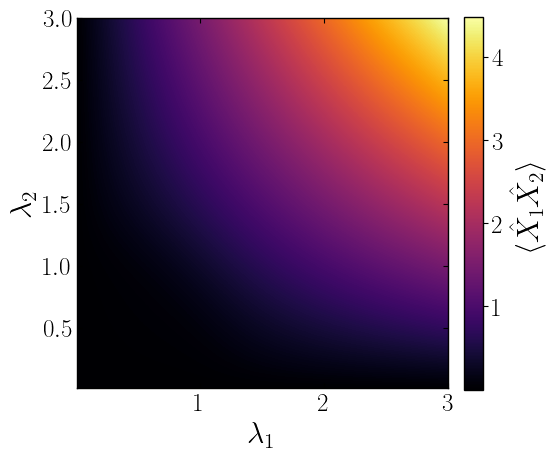

<X1X2> variacional sector IMPAR
$\langle\hat{X}_1\hat{X}_2\rangle$  (impar),  $s/\omega_0=1.0$


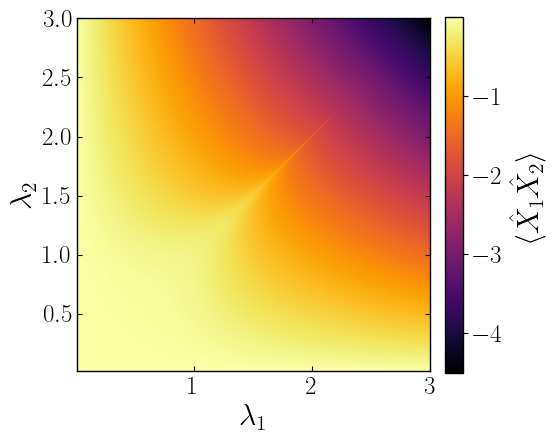

In [ ]:
# ══════════════════════════════════════════════════════════════════
# GRAFICACIÓN — <X₁X₂> variacional, par e impar, ventana [0,3]²
#   colorbar escalada a la máscara de la ventana (seismic, simétrico en 0)
# ══════════════════════════════════════════════════════════════════
extent = [lam1_arr_var[0], lam1_arr_var[-1], lam2_arr_var[0], lam2_arr_var[-1]]

XLIM = (0.01, 3.0)
YLIM = (0.01, 3.0)
mask1 = (lam1_arr_var >= XLIM[0]) & (lam1_arr_var <= XLIM[1])
mask2 = (lam2_arr_var >= YLIM[0]) & (lam2_arr_var <= YLIM[1])

def _plot_X1X2(data, sector_label, ftag):
    # escala simétrica ajustada a la ventana
    sub  = data[np.ix_(mask2, mask1)]
    vmax = np.nanmax(sub)
    vmin = np.nanmin(sub)

    fig, ax = plt.subplots(figsize=(6, 5.5))
    im = ax.imshow(data, origin='lower', aspect='equal', extent=extent, cmap='inferno', vmin=vmin, vmax=vmax)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=r'$\langle\hat{X}_1\hat{X}_2\rangle$')
    ax.set_xlabel(r'$\lambda_1$'); ax.set_ylabel(r'$\lambda_2$')
    ax.set_xlim(*XLIM); ax.set_ylim(*YLIM)
    ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True, color='black')
    print(rf'$\langle\hat{{X}}_1\hat{{X}}_2\rangle$  {sector_label},  'rf'$s/\omega_0={cv}$')
    plt.tight_layout()
    plt.savefig(f'Resultados_aniso/X1X2_var_{ftag}.png', bbox_inches='tight',transparent=False, dpi=300)
    plt.show()

print(r'<X1X2> variacional sector PAR')
_plot_X1X2(X1X2_even_var, r'(par)',   'even')

print(r'<X1X2> variacional sector IMPAR')
_plot_X1X2(X1X2_odd_var, r'(impar)', 'odd')

$\langle\hat{X}_1\hat{X}_2\rangle$,  $\rho=0.5$,  $s/\omega_0=1.0$


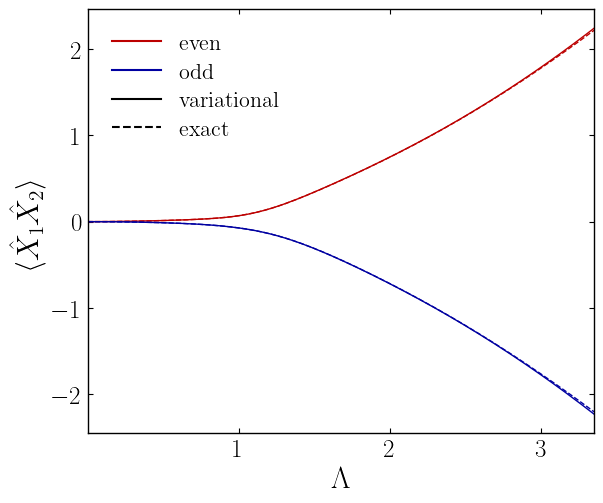

Corte <X1X2> var vs exacto, rho=0.5  (λ_i ≤ 3.0)
$\langle\hat{X}_1\hat{X}_2\rangle$,  $\rho=1.0$,  $s/\omega_0=1.0$


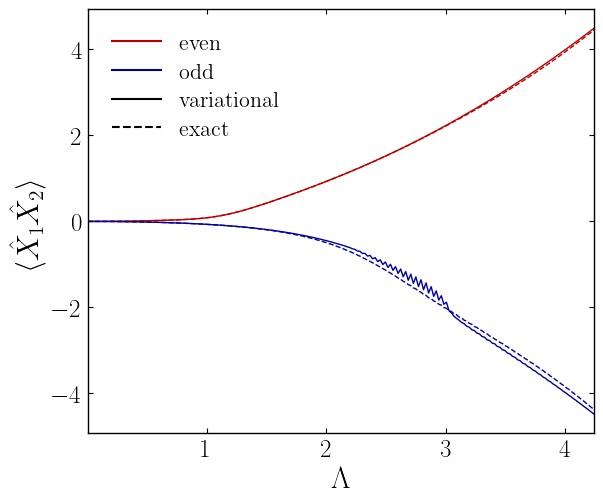

Corte <X1X2> var vs exacto, rho=1.0  (λ_i ≤ 3.0)
$\langle\hat{X}_1\hat{X}_2\rangle$,  $\rho=2.0$,  $s/\omega_0=1.0$


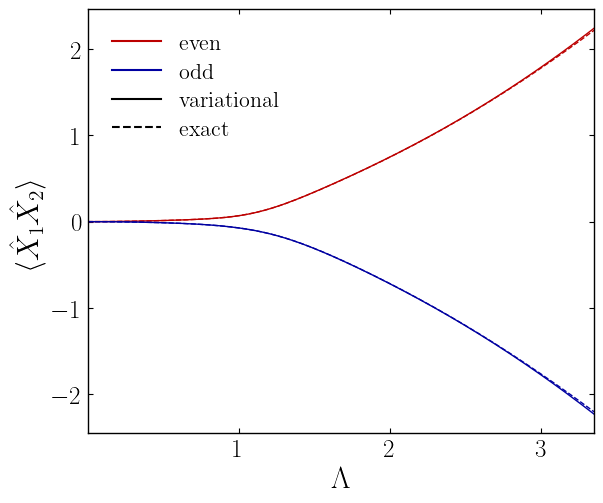

Corte <X1X2> var vs exacto, rho=2.0  (λ_i ≤ 3.0)


In [ ]:
# ══════════════════════════════════════════════════════════════════
# CORTES λ₂=ρλ₁ de <X₁X₂>: variacional (sólida) vs exacto (dashed)
#   mallas DISTINTAS: cada matriz con sus propias coordenadas.
# ══════════════════════════════════════════════════════════════════
rho_list = [0.5, 1.0, 2.0]
C_EVEN = plt.cm.seismic(0.88)
C_ODD  = plt.cm.seismic(0.12)
LAM_CAP = 3.0

# coordenadas por malla, derivadas del tamaño real de cada matriz
# variacional (0→4, tantos puntos como filas/cols de X1X2_*_var)
lam1_arr_var = np.linspace(0.0, 4.0, X1X2_even_var.shape[1])
lam2_arr_var = np.linspace(0.0, 4.0, X1X2_even_var.shape[0])
# exacto (0→3)
lam1_arr_ex  = np.linspace(0.0, 3.0, X1X2_even.shape[1])
lam2_arr_ex  = np.linspace(0.0, 3.0, X1X2_even.shape[0])

def _cut_along_rho(data2d, l1_arr, l2_arr, rho, n_cut=200, cap=None):
    interp = RegularGridInterpolator((l2_arr, l1_arr), data2d,
                                     bounds_error=False, fill_value=np.nan)
    l1max = min(l1_arr[-1], l2_arr[-1]/rho)
    if cap is not None:
        l1max = min(l1max, cap, cap/rho)
    l1 = np.linspace(max(l1_arr[0], 1e-6), l1max, n_cut)
    l2 = rho*l1
    Lam = np.sqrt(l1**2 + l2**2)
    return Lam, interp(np.column_stack([l2, l1]))

for rho in rho_list:
    fig, ax = plt.subplots(figsize=(6.5, 5.5))

    Lc, ve = _cut_along_rho(X1X2_even_var, lam1_arr_var, lam2_arr_var, rho, cap=LAM_CAP)
    _,  ne = _cut_along_rho(X1X2_even,     lam1_arr_ex,  lam2_arr_ex,  rho, cap=LAM_CAP)
    ax.plot(Lc, ve, '-',  color=C_EVEN, lw=1.0)
    ax.plot(Lc, ne, '--', color=C_EVEN, lw=1.0)
    Lc, vo = _cut_along_rho(X1X2_odd_var,  lam1_arr_var, lam2_arr_var, rho, cap=LAM_CAP)
    _,  no = _cut_along_rho(X1X2_odd,      lam1_arr_ex,  lam2_arr_ex,  rho, cap=LAM_CAP)
    ax.plot(Lc, vo, '-',  color=C_ODD, lw=1.0)
    ax.plot(Lc, no, '--', color=C_ODD, lw=1.0)
    ax.set_xlabel(r'$\Lambda$')
    ax.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle$')
    ax.set_xlim(Lc[0], Lc[-1])
    ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                   right=True, left=True)

    handles = [
        mlines.Line2D([], [], color=C_EVEN, lw=1.5, label='even'),
        mlines.Line2D([], [], color=C_ODD,  lw=1.5, label='odd'),
        mlines.Line2D([], [], color='k', ls='-',  lw=1.5, label='variational'),
        mlines.Line2D([], [], color='k', ls='--', lw=1.5, label='exact'),
    ]
    ax.legend(handles=handles, frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4, ncol=1)
    print(rf'$\langle\hat{{X}}_1\hat{{X}}_2\rangle$,  ' rf'$\rho={rho}$,  $s/\omega_0={cv}$')
    plt.tight_layout()
    plt.savefig(f'Resultados_aniso/cut_X1X2_rho{rho}.png', bbox_inches='tight', transparent=False, dpi=300)
    plt.show()
    print(f'Corte <X1X2> var vs exacto, rho={rho}  (λ_i ≤ {LAM_CAP})')

In [ ]:
# ══════════════════════════════════════════════════════════════════
# EXACTO — <X₁X₂> por sector, barrido cv=[0.5,1.0,1.5], plano [0,3]²
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
eps1_val = 0.25
eps2_val = 0.25
M_max    = 15

cv_list  = [0.5, 1.0, 1.5]
n_lam    = 300
lam1_arr = np.linspace(0.01, 3.0, n_lam)
lam2_arr = np.linspace(0.01, 3.0, n_lam)

X1X2_even_cv = {}   # cv -> mapa [i2,j1]
X1X2_odd_cv  = {}

for cv in cv_list:
    Xe = np.full((n_lam, n_lam), np.nan)
    Xo = np.full((n_lam, n_lam), np.nan)
    args = [(i2, j1, lam1_arr[j1], lam2_arr[i2], cv)
            for i2 in range(n_lam) for j1 in range(n_lam)]
    print(f"cv={cv}: {n_lam}×{n_lam} nodos ...", flush=True)
    chunks = np.array_split(np.arange(len(args)), 20); done = 0
    with joblib.parallel_backend('loky', n_jobs=-1):
        for ch in chunks:
            res = joblib.Parallel()(joblib.delayed(compute_point_X1X2)(*args[a]) for a in ch)
            for (i2, j1, xe, xo) in res:
                Xe[i2, j1] = xe; Xo[i2, j1] = xo
            done += len(ch)
            print(f"   {100.0*done/len(args):5.1f}%", flush=True)
    X1X2_even_cv[cv] = Xe
    X1X2_odd_cv[cv]  = Xo

print("Exacto listo (todos los cv).")

cv=0.5: 300×300 nodos ...


     5.0%
    10.0%
    15.0%
    20.0%
    25.0%


KeyboardInterrupt: 

In [ ]:
# ══════════════════════════════════════════════════════════════════
# VARIACIONAL — <X₁X₂> por sector, barrido cv=[0.5,1.0,1.5]
# ══════════════════════════════════════════════════════════════════
omega0    = 1.0
eps1_val  = 0.25
eps2_val  = 0.25
n_lam_var = 400
cv_list   = [0.5, 1.0, 1.5]


X1X2_even_var_cv = {}
X1X2_odd_var_cv  = {}
lam1_arr_var = lam2_arr_var = None

for cv in cv_list:
    param_label = (f"{cv}_omega0{omega0:.1f}"
                   f"_eps1{eps1_val:.2f}_eps2{eps2_val:.2f}"
                   f"_nl1_{n_lam_var}_nl2_{n_lam_var}")
    root_dir = (f"variational_params_omega0{omega0:.1f}"
                f"_eps1{eps1_val:.2f}_eps2{eps2_val:.2f}_nl1_{n_lam_var}_nl2_{n_lam_var}")
    cv_dir = os.path.join(root_dir, f"cv_{cv}")
    def _load(name): return np.loadtxt(os.path.join(cv_dir, f"{name}_{param_label}.txt"))

    lam1_arr_var = _load("coord_lambda1")
    lam2_arr_var = _load("coord_lambda2")
    a1_o=_load("alpha1_odd"); a2_o=_load("alpha2_odd"); r1_o=_load("r1_odd"); r2_o=_load("r2_odd")
    a1_e=_load("alpha1_even");a2_e=_load("alpha2_even");r1_e=_load("r1_even");r2_e=_load("r2_even")

    Xe = np.full((n_lam_var, n_lam_var), np.nan)
    Xo = np.full((n_lam_var, n_lam_var), np.nan)
    for i2, lam2 in enumerate(lam2_arr_var):
        for j1, lam1 in enumerate(lam1_arr_var):
            Lam = np.sqrt(lam1**2 + lam2**2)
            if Lam < 1e-12: continue
            pref = lam1*lam2/Lam**2
            Xb2_o = Xb2_var(a1_o[i2,j1],a2_o[i2,j1],r1_o[i2,j1],r2_o[i2,j1],lam1,lam2,cv,'odd')
            Xb2_e = Xb2_var(a1_e[i2,j1],a2_e[i2,j1],r1_e[i2,j1],r2_e[i2,j1],lam1,lam2,cv,'even')
            Xo[i2,j1] = -pref*(Xb2_o-0.5)
            Xe[i2,j1] = +pref*(Xb2_e-0.5)
    X1X2_even_var_cv[cv] = Xe
    X1X2_odd_var_cv[cv]  = Xo
    print(f"cv={cv}: variacional listo.", flush=True)

print("Variacional listo (todos los cv).")

cv=0.5: variacional listo.
cv=1.0: variacional listo.
cv=1.5: variacional listo.
Variacional listo (todos los cv).


$\langle\hat{X}_1\hat{X}_2\rangle$  (par)  [exacto]


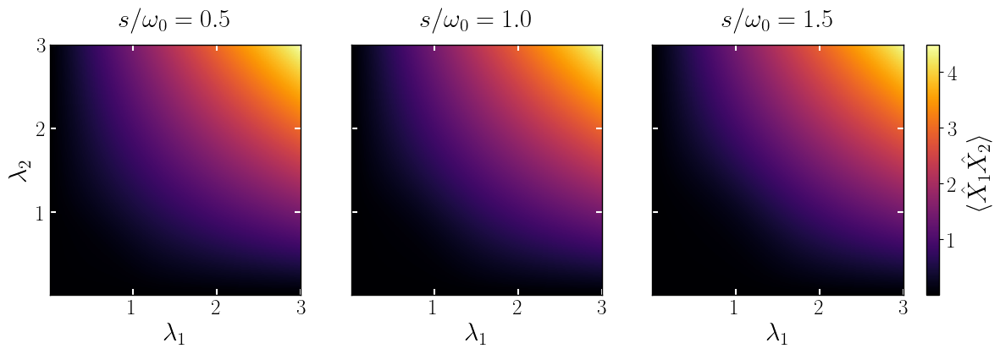

exacto — (par)
$\langle\hat{X}_1\hat{X}_2\rangle$  (impar)  [exacto]


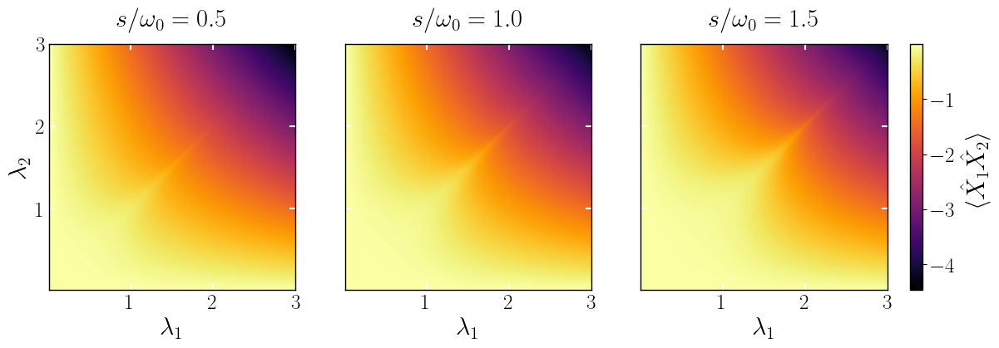

exacto — (impar)
$\langle\hat{X}_1\hat{X}_2\rangle$  (par)  [variacional]


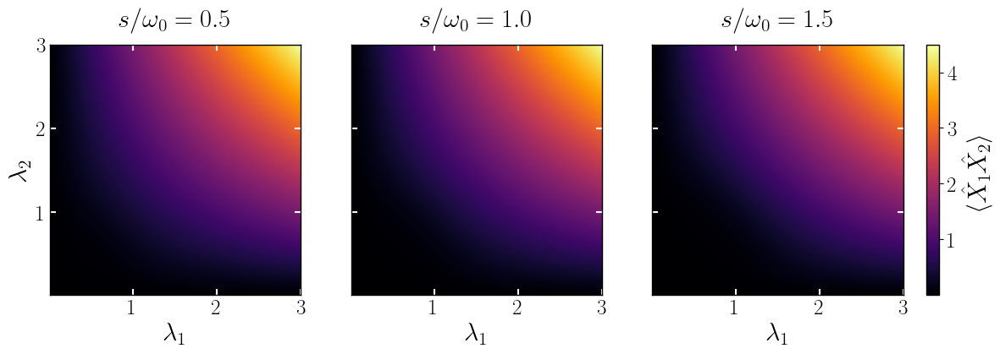

variacional — (par)
$\langle\hat{X}_1\hat{X}_2\rangle$  (impar)  [variacional]


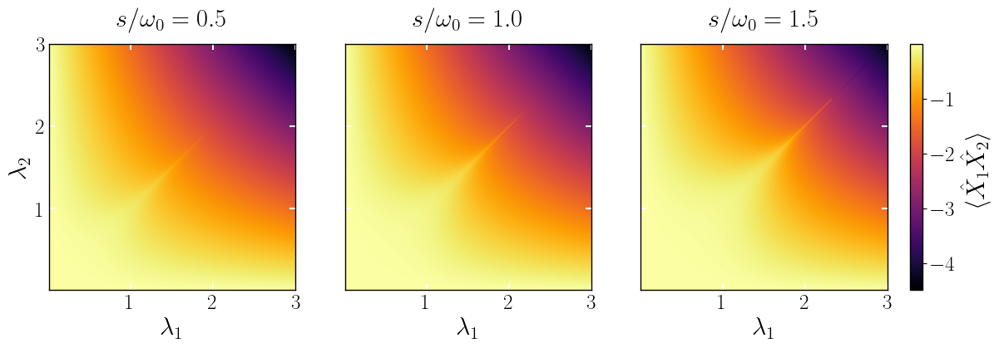

variacional — (impar)


In [ ]:
# ══════════════════════════════════════════════════════════════════
# GRAFICACIÓN — <X₁X₂> en fila por cv, colorbar compartida (seismic)
# ══════════════════════════════════════════════════════════════════
def _row_X1X2(data_by_cv, l1, l2, sector_label, method_label, ftag,
              xwin=(0.01, 3.0), ywin=(0.01, 3.0)):
    extent = [l1[0], l1[-1], l2[0], l2[-1]]
    m1 = (l1 >= xwin[0]) & (l1 <= xwin[1])
    m2 = (l2 >= ywin[0]) & (l2 <= ywin[1])
    # escala simétrica común a los 3 cv, ajustada a la ventana
    vmax = max(np.nanmax(data_by_cv[cv][np.ix_(m2, m1)]) for cv in cv_list)
    vmin = min(np.nanmin(data_by_cv[cv][np.ix_(m2, m1)]) for cv in cv_list)

    fig, axes = plt.subplots(1, 3, figsize=(14, 5.5))
    for idx, cv in enumerate(cv_list):
        ax = axes[idx]
        im = ax.imshow(data_by_cv[cv], origin='lower', aspect='equal', extent=extent,
                       cmap='inferno', vmin=vmin, vmax=vmax)
        ax.set_xlim(*xwin); ax.set_ylim(*ywin)
        ax.tick_params(axis='x', direction='in', bottom=True, top=True,
                       right=True, left=True, color='white', size=5, width=1.5)
        ax.tick_params(axis='y', direction='in', right=True, left=True,
                       color='white', size=5, width=1.5, labelleft=(idx == 0))
        ax.set_xlabel(r'$\lambda_1$')
        if idx == 0: ax.set_ylabel(r'$\lambda_2$')
        ax.set_title(rf'$s/\omega_0 = {cv}$', pad=15)

    fig.colorbar(im, ax=axes.ravel().tolist(), label=r'$\langle\hat{X}_1\hat{X}_2\rangle$', fraction=0.046, pad=0.025, shrink=0.7)
    print(rf'$\langle\hat{{X}}_1\hat{{X}}_2\rangle$  {sector_label}  [{method_label}]')
    plt.savefig(f'Resultados_aniso/X1X2_row_{ftag}.png',
                bbox_inches='tight', transparent=False, dpi=300)
    plt.show()
    print(f'{method_label} — {sector_label}')

# ── EXACTO ──
_row_X1X2(X1X2_even_cv, lam1_arr, lam2_arr, '(par)',   'exacto', 'even_exact')
_row_X1X2(X1X2_odd_cv,  lam1_arr, lam2_arr, '(impar)', 'exacto', 'odd_exact')


# ── VARIACIONAL ──
_row_X1X2(X1X2_even_var_cv, lam1_arr_var, lam2_arr_var, '(par)',   'variacional', 'even_var')
_row_X1X2(X1X2_odd_var_cv,  lam1_arr_var, lam2_arr_var, '(impar)', 'variacional', 'odd_var')

In [ ]:
# ══════════════════════════════════════════════════════════════════
# BARRIDO 1D — parámetros variacionales por rayo ρ, para cv=[0.5,1.0,1.5]
#   Llena los diccionarios a1_o[(dlam,cv)], ..., lam1_rec[(dlam,cv)]
#   Warm-start radial a lo largo de cada rayo (confiable, sin ramas).
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
eps1_val = 0.25
eps2_val = 0.25
_S2      = np.sqrt(2.0)

dlam_list = [0.5, 1.0, 2.0]     # ρ = λ₁/λ₂
cv_list   = [0.5, 1.0, 1.5]     # t (impar) = Δ (par)

n_Lam   = 400
Lam_arr = np.linspace(0.01, 4.0*np.sqrt(2), n_Lam)

def Lam_rho_to_lam12(Lam, rho):
    lam2 = Lam / np.sqrt(1.0 + rho**2)
    lam1 = rho * lam2
    return lam1, lam2

# diccionarios indexados por (dlam, cv)
a1_o = {}; a2_o = {}; r1_o = {}; r2_o = {}; Evar_o = {}; Eex_o = {}; fid_o = {}; rel_o = {}
a1_e = {}; a2_e = {}; r1_e = {}; r2_e = {}; Evar_e = {}; Eex_e = {}; fid_e = {}; rel_e = {}
lam1_rec = {}; lam2_rec = {}

for dlam in dlam_list:
    rho = dlam
    for cv in cv_list:
        t = cv
        Delta_val = cv

        A1o=np.full(n_Lam,np.nan); A2o=np.full(n_Lam,np.nan)
        R1o=np.full(n_Lam,np.nan); R2o=np.full(n_Lam,np.nan)
        Evo=np.full(n_Lam,np.nan); Eeo=np.full(n_Lam,np.nan)
        Fo =np.full(n_Lam,np.nan); Reo=np.full(n_Lam,np.nan)
        A1e=np.full(n_Lam,np.nan); A2e=np.full(n_Lam,np.nan)
        R1e=np.full(n_Lam,np.nan); R2e=np.full(n_Lam,np.nan)
        Eve=np.full(n_Lam,np.nan); Eee=np.full(n_Lam,np.nan)
        Fe =np.full(n_Lam,np.nan); Ree=np.full(n_Lam,np.nan)
        L1 =np.full(n_Lam,np.nan); L2 =np.full(n_Lam,np.nan)

        warm_o = warm_e = None
        for k, Lam in enumerate(Lam_arr):
            lam1, lam2 = Lam_rho_to_lam12(Lam, rho)
            if np.isnan(lam1):
                continue
            L1[k], L2[k] = lam1, lam2
            M = _Mof_Lam(Lam)

            E, x = minimize_odd_aniso(lam1, lam2, eps1_val, eps2_val, x_warm=warm_o)
            warm_o = x
            A1o[k], A2o[k], R1o[k], R2o[k] = x
            Evo[k] = E
            Eeo[k] = E_odd_exact_aniso(lam1, lam2, eps1_val, eps2_val, M=M)
            Fo[k]  = fidelity_odd_aniso(lam1, lam2, eps1_val, eps2_val, x, M=M)
            Reo[k] = abs(E - Eeo[k]) / abs(Eeo[k]) if abs(Eeo[k])>1e-12 else np.nan

            E, x = minimize_even_aniso(lam1, lam2, eps1_val, eps2_val, Delta_val, x_warm=warm_e)
            warm_e = x
            A1e[k], A2e[k], R1e[k], R2e[k] = x
            Eve[k] = E
            Eee[k] = E_even_exact_aniso(lam1, lam2, eps1_val, eps2_val, Delta_val, M=M)
            Fe[k]  = fidelity_even_aniso(lam1, lam2, eps1_val, eps2_val, Delta_val, x, M=M)
            Ree[k] = abs(E - Eee[k]) / abs(Eee[k]) if abs(Eee[k])>1e-12 else np.nan

        key = (dlam, cv)
        a1_o[key]=A1o; a2_o[key]=A2o; r1_o[key]=R1o; r2_o[key]=R2o
        Evar_o[key]=Evo; Eex_o[key]=Eeo; fid_o[key]=Fo; rel_o[key]=Reo
        a1_e[key]=A1e; a2_e[key]=A2e; r1_e[key]=R1e; r2_e[key]=R2e
        Evar_e[key]=Eve; Eex_e[key]=Eee; fid_e[key]=Fe; rel_e[key]=Ree
        lam1_rec[key]=L1; lam2_rec[key]=L2

        print(f"ρ={dlam}, s/ω0={cv}: barrido 1D listo", flush=True)

print("Barrido 1D listo (todos los ρ y cv).")

ρ=0.5, s/ω0=0.5: barrido 1D listo
ρ=0.5, s/ω0=1.0: barrido 1D listo
ρ=0.5, s/ω0=1.5: barrido 1D listo
ρ=1.0, s/ω0=0.5: barrido 1D listo
ρ=1.0, s/ω0=1.0: barrido 1D listo
ρ=1.0, s/ω0=1.5: barrido 1D listo
ρ=2.0, s/ω0=0.5: barrido 1D listo
ρ=2.0, s/ω0=1.0: barrido 1D listo
ρ=2.0, s/ω0=1.5: barrido 1D listo
Barrido 1D listo (todos los ρ y cv).


$\langle\hat{X}_1\hat{X}_2\rangle$,  $\rho=0.5$,  $s/\omega_0=0.5$


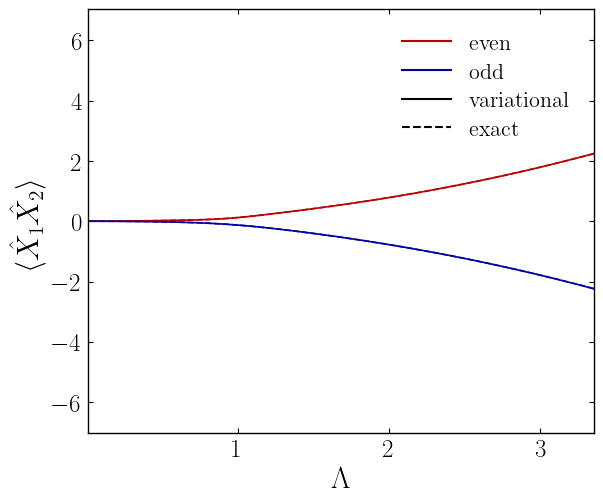

Corte <X1X2> var(1D) vs exact, rho=0.5, cv=0.5
$\langle\hat{X}_1\hat{X}_2\rangle$,  $\rho=0.5$,  $s/\omega_0=1.0$


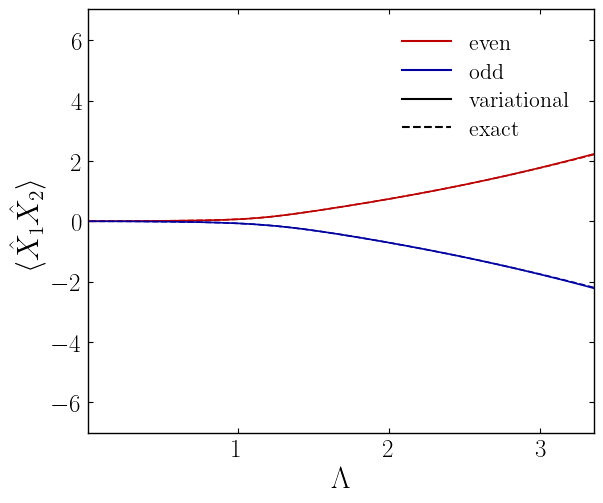

Corte <X1X2> var(1D) vs exact, rho=0.5, cv=1.0
$\langle\hat{X}_1\hat{X}_2\rangle$,  $\rho=0.5$,  $s/\omega_0=1.5$


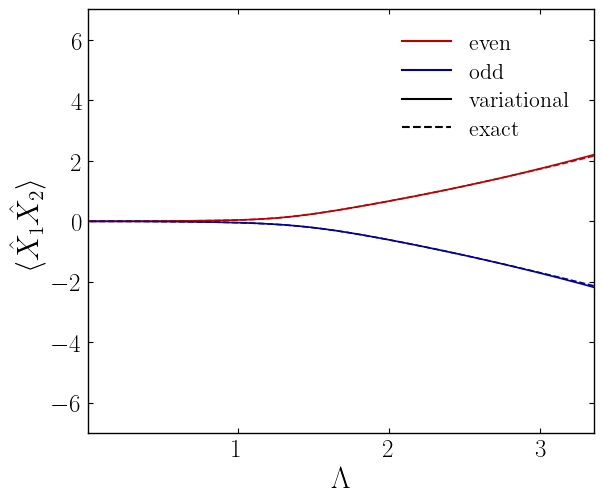

Corte <X1X2> var(1D) vs exact, rho=0.5, cv=1.5
$\langle\hat{X}_1\hat{X}_2\rangle$,  $\rho=1.0$,  $s/\omega_0=0.5$


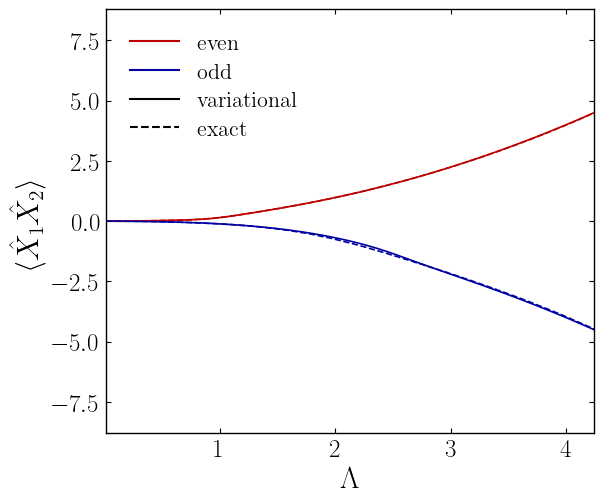

Corte <X1X2> var(1D) vs exact, rho=1.0, cv=0.5
$\langle\hat{X}_1\hat{X}_2\rangle$,  $\rho=1.0$,  $s/\omega_0=1.0$


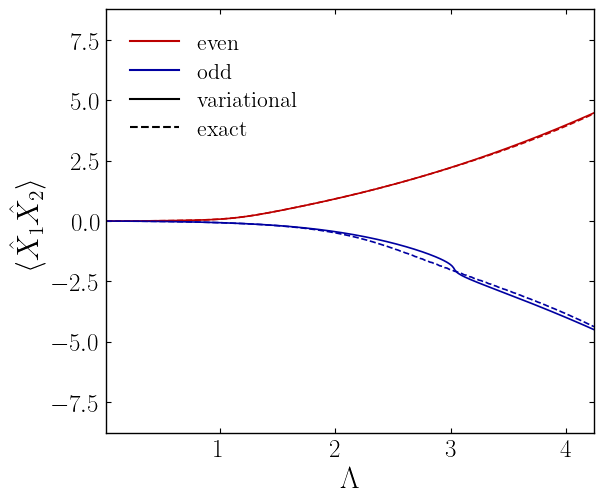

Corte <X1X2> var(1D) vs exact, rho=1.0, cv=1.0
$\langle\hat{X}_1\hat{X}_2\rangle$,  $\rho=1.0$,  $s/\omega_0=1.5$


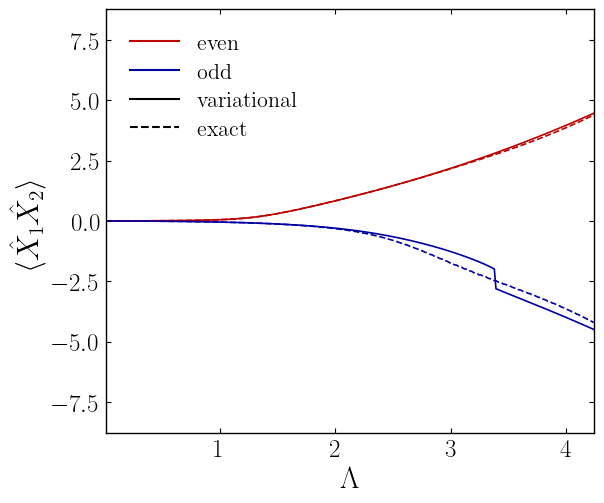

Corte <X1X2> var(1D) vs exact, rho=1.0, cv=1.5
$\langle\hat{X}_1\hat{X}_2\rangle$,  $\rho=2.0$,  $s/\omega_0=0.5$


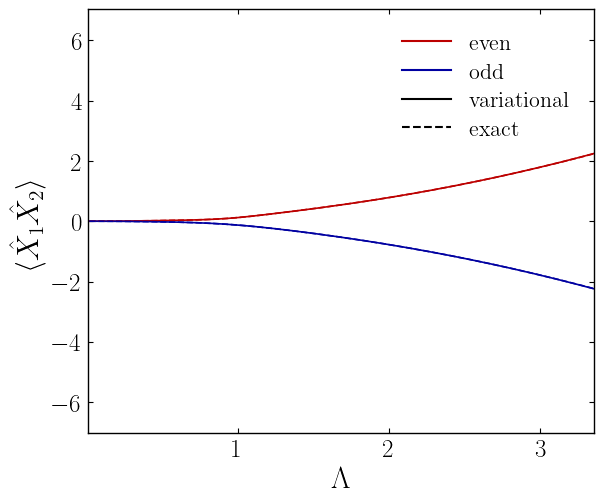

Corte <X1X2> var(1D) vs exact, rho=2.0, cv=0.5
$\langle\hat{X}_1\hat{X}_2\rangle$,  $\rho=2.0$,  $s/\omega_0=1.0$


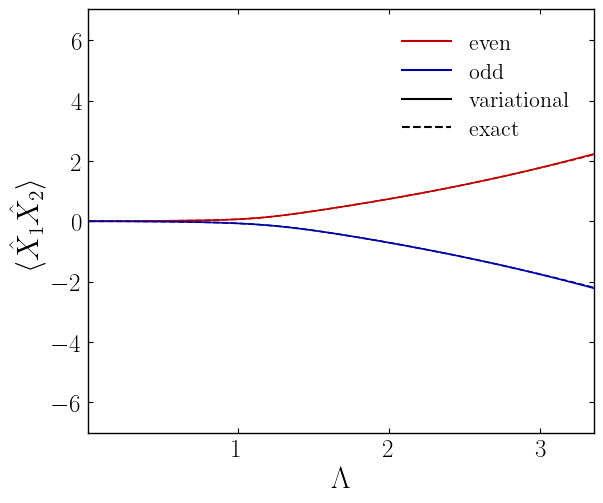

Corte <X1X2> var(1D) vs exact, rho=2.0, cv=1.0
$\langle\hat{X}_1\hat{X}_2\rangle$,  $\rho=2.0$,  $s/\omega_0=1.5$


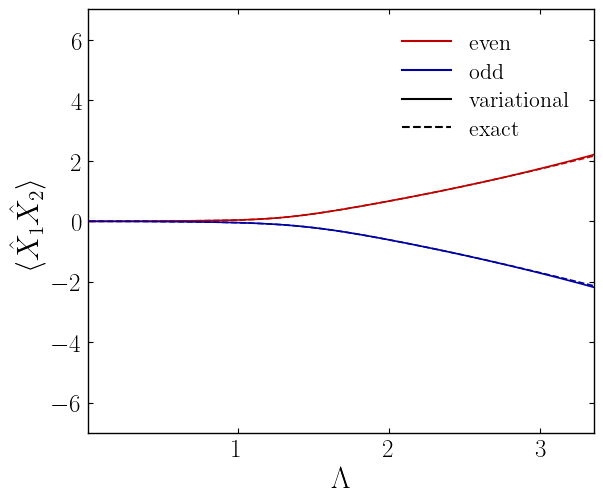

Corte <X1X2> var(1D) vs exact, rho=2.0, cv=1.5


In [ ]:
# guardar los diccionarios del barrido 1D con nombres propios (evita colisión)
PAR1D = dict(
    a1_o=a1_o, a2_o=a2_o, r1_o=r1_o, r2_o=r2_o,
    a1_e=a1_e, a2_e=a2_e, r1_e=r1_e, r2_e=r2_e,
    lam1_rec=lam1_rec, lam2_rec=lam2_rec,
)

def X1X2_var_ray(dlam, cv):
    """Devuelve (Λ, X1X2_even, X1X2_odd) sobre el rayo ρ=dlam para este cv."""
    key = (dlam, cv)
    L1 = PAR1D['lam1_rec'][key]; L2 = PAR1D['lam2_rec'][key]
    Lam = np.sqrt(L1**2 + L2**2)
    xe = np.full_like(Lam, np.nan)
    xo = np.full_like(Lam, np.nan)
    for k in range(len(Lam)):
        lam1, lam2 = L1[k], L2[k]
        if not np.isfinite(lam1) or Lam[k] < 1e-12:
            continue
        pref = lam1*lam2/Lam[k]**2
        Xb2_o = Xb2_var(PAR1D['a1_o'][key][k], PAR1D['a2_o'][key][k],
                        PAR1D['r1_o'][key][k], PAR1D['r2_o'][key][k],
                        lam1, lam2, cv, 'odd')
        Xb2_e = Xb2_var(PAR1D['a1_e'][key][k], PAR1D['a2_e'][key][k],
                        PAR1D['r1_e'][key][k], PAR1D['r2_e'][key][k],
                        lam1, lam2, cv, 'even')
        xo[k] = -pref*(Xb2_o - 0.5)
        xe[k] = +pref*(Xb2_e - 0.5)
    return Lam, xe, xo

# ── corte del mapa EXACTO 2D a lo largo de ρ (con cap en λ_i≤3) ──
lam1_arr_ex = np.linspace(0.01, 3.0, X1X2_even_cv[cv_list[0]].shape[1])
lam2_arr_ex = np.linspace(0.01, 3.0, X1X2_even_cv[cv_list[0]].shape[0])
LAM_CAP = 3.0

def _cut_exact(data2d, rho, n_cut=200, cap=LAM_CAP):
    interp = RegularGridInterpolator((lam2_arr_ex, lam1_arr_ex), data2d,
                                     bounds_error=False, fill_value=np.nan)
    l1max = min(lam1_arr_ex[-1], lam2_arr_ex[-1]/rho, cap, cap/rho)
    l1 = np.linspace(max(lam1_arr_ex[0], 1e-6), l1max, n_cut)
    l2 = rho*l1
    Lam = np.sqrt(l1**2 + l2**2)
    return Lam, interp(np.column_stack([l2, l1]))

# ── graficación: una figura por (ρ, cv) ─────────────────────────
C_EVEN = plt.cm.seismic(0.88)
C_ODD  = plt.cm.seismic(0.12)

for dlam in dlam_list:
    rho = dlam
    for cv in cv_list:
        fig, ax = plt.subplots(figsize=(6.5, 5.5))

        # variacional: rayo 1D
        Lv, xe_v, xo_v = X1X2_var_ray(dlam, cv)
        # cortar a λ_i≤3 (el rayo llega hasta Λ_max, recortamos para comparar)
        capmask = (Lv <= np.sqrt(min(3.0, 3.0/rho)**2 + min(3.0*rho, 3.0)**2) + 1e-9)
        ax.plot(Lv, xe_v, '-', color=C_EVEN, lw=1.2)
        ax.plot(Lv, xo_v, '-', color=C_ODD,  lw=1.2)

        # exacto: corte del mapa 2D
        Le, xe_e = _cut_exact(X1X2_even_cv[cv], rho)
        _,  xo_e = _cut_exact(X1X2_odd_cv[cv],  rho)
        ax.plot(Le, xe_e, '--', color=C_EVEN, lw=1.2)
        ax.plot(Le, xo_e, '--', color=C_ODD,  lw=1.2)

        ax.set_xlabel(r'$\Lambda$')
        ax.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle$')
        ax.set_xlim(0.01, Le[-1])
        ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)

        handles = [
            mlines.Line2D([], [], color=C_EVEN, lw=1.5, label='even'),
            mlines.Line2D([], [], color=C_ODD,  lw=1.5, label='odd'),
            mlines.Line2D([], [], color='k', ls='-',  lw=1.5, label='variational'),
            mlines.Line2D([], [], color='k', ls='--', lw=1.5, label='exact'),
        ]
        ax.legend(handles=handles, frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)
        print(rf'$\langle\hat{{X}}_1\hat{{X}}_2\rangle$,  'rf'$\rho={rho}$,  $s/\omega_0={cv}$')
        plt.tight_layout()
        plt.savefig(f'Resultados_aniso/cut_X1X2_1D_rho{rho}_cv{cv}.png', bbox_inches='tight', transparent=False, dpi=300)
        plt.show()
        print(f'Corte <X1X2> var(1D) vs exact, rho={rho}, cv={cv}')

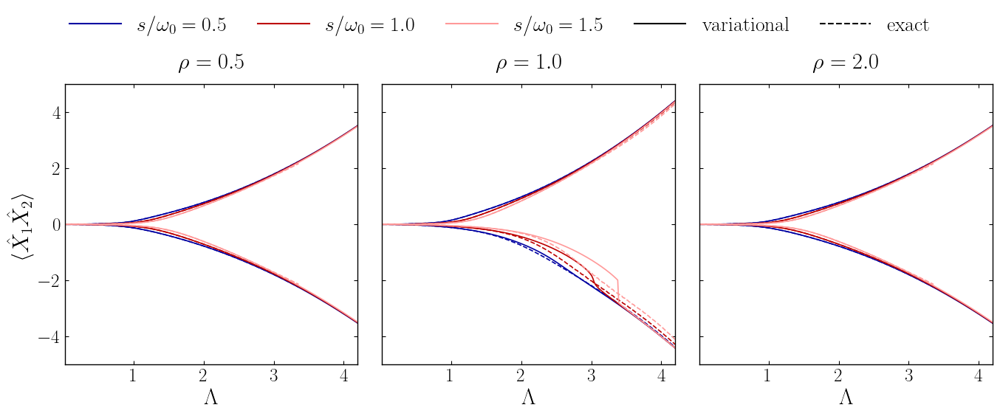

Panel por ρ (color = s/ω₀)


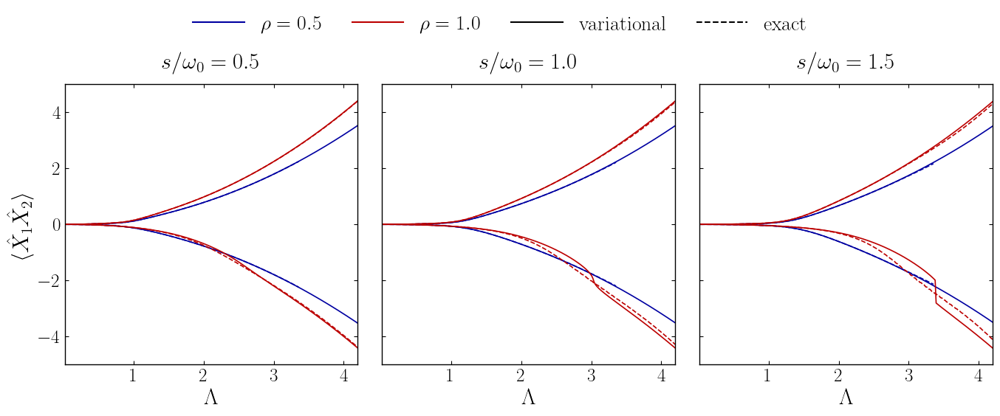

Panel por s/ω₀ (color = ρ)


In [ ]:
# ══════════════════════════════════════════════════════════════════
# PANELES 1×3 de cortes <X₁X₂>: variacional (sólida) vs exacto (dashed)
#   Fig A: un panel por ρ, curvas coloreadas por s/ω₀
#   Fig B: un panel por s/ω₀, curvas coloreadas por ρ
#   par e impar en el mismo panel (signo opuesto los separa)
# ══════════════════════════════════════════════════════════════════
COLS = [plt.cm.seismic(0.12),  plt.cm.seismic(0.88), plt.cm.seismic(0.6)]

# ── FIGURA A: paneles por ρ, color = s/ω₀ ───────────────────────
fig, axes = plt.subplots(1, 3, figsize=(14, 5.5), sharey=True)
for idx, rho in enumerate(dlam_list):
    ax = axes[idx]
    for cv, col in zip(cv_list, COLS):
        Lv, xe_v, xo_v = X1X2_var_ray(rho, cv)
        Le, xe_e = _cut_exact(X1X2_even_cv[cv], rho)
        _,  xo_e = _cut_exact(X1X2_odd_cv[cv],  rho)
        ax.plot(Lv, xe_v, '-',  color=col, lw=1.2)   # par variacional
        ax.plot(Lv, xo_v, '-',  color=col, lw=1.2)   # impar variacional
        ax.plot(Le, xe_e, '--', color=col, lw=1.2)   # par exacto
        ax.plot(Le, xo_e, '--', color=col, lw=1.2)   # impar exacto
    ax.set_xlim(0.01, 4.2)
    ax.set_ylim(-5, 5)
    ax.set_xlabel(r'$\Lambda$')
    if idx == 0: ax.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle$')
    ax.set_title(rf'$\rho={rho}$', pad=15)
    ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)

handles = [mlines.Line2D([], [], color=c, lw=1.5, label=rf'$s/\omega_0={cv}$')
           for c, cv in zip(COLS, cv_list)]
handles += [mlines.Line2D([], [], color='k', ls='-',  lw=1.5, label='variational'),
            mlines.Line2D([], [], color='k', ls='--', lw=1.5, label='exact')]
fig.legend(handles=handles, loc='upper center', bbox_to_anchor=(0.5, 1.075), ncol=len(handles), frameon=False, handlelength=2.5, columnspacing=1.5, fontsize=20)
plt.tight_layout(); plt.subplots_adjust(top=0.86)
plt.savefig('Resultados_aniso/panel_X1X2_byrho.png', bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Panel por ρ (color = s/ω₀)')

dlam_list2= [0.5, 1.0]
# ── FIGURA B: paneles por s/ω₀, color = ρ ───────────────────────
fig, axes = plt.subplots(1, 3, figsize=(14, 5.5), sharey=True)
for idx, cv in enumerate(cv_list):
    ax = axes[idx]
    for rho, col in zip(dlam_list2, COLS):
        Lv, xe_v, xo_v = X1X2_var_ray(rho, cv)
        Le, xe_e = _cut_exact(X1X2_even_cv[cv], rho)
        _,  xo_e = _cut_exact(X1X2_odd_cv[cv],  rho)
        ax.plot(Lv, xe_v, '-',  color=col, lw=1.2)
        ax.plot(Lv, xo_v, '-',  color=col, lw=1.2)
        ax.plot(Le, xe_e, '--', color=col, lw=1.2)
        ax.plot(Le, xo_e, '--', color=col, lw=1.2)
    ax.set_xlim(0.01, 4.2)
    ax.set_ylim(-5, 5)
    ax.set_xlabel(r'$\Lambda$')
    if idx == 0: ax.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle$')
    ax.set_title(rf'$s/\omega_0={cv}$', pad=15)
    ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)

handles = [mlines.Line2D([], [], color=c, lw=1.5, label=rf'$\rho={rho}$')
           for c, rho in zip(COLS, dlam_list2)]
handles += [mlines.Line2D([], [], color='k', ls='-',  lw=1.5, label='variational'),
            mlines.Line2D([], [], color='k', ls='--', lw=1.5, label='exact')]
fig.legend(handles=handles, loc='upper center', bbox_to_anchor=(0.5, 1.075), ncol=len(handles), frameon=False, handlelength=2.5, columnspacing=1.5, fontsize=20)
plt.tight_layout(); plt.subplots_adjust(top=0.86)
plt.savefig('Resultados_aniso/panel_X1X2_bycv.png', bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Panel por s/ω₀ (color = ρ)')

# Cat states

### Functions

In [21]:
# ══════════════════════════════════════════════════════════════════
#  FUNCIONAL Y MINIMIZACIÓN DEL GATO (2 params), detuning cero
# ══════════════════════════════════════════════════════════════════
def energy_grad_cat(x, Lam, s):
    """E(a,r) y gradiente. s = t (impar) o Δ (par). Detuning cero."""
    a, r = x
    d = (Lam - a)
    A = d*d
    B = np.exp(2.0*r)
    F = np.exp(-0.5*A*B)
    E = omega0*(0.25*a*a + np.sinh(r)**2) - s*F
    dE_da = 0.5*omega0*a       - s*F*B*d
    dE_dr = omega0*np.sinh(2.0*r) + s*A*B*F
    return E, np.array([dE_da, dE_dr])

def _minimize_cat(lam1, lam2, s, x_warm=None):
    """Minimiza E(a,r). Devuelve (E, (a,r))."""
    Lam = np.sqrt(lam1**2 + lam2**2)          # ← CON raíz
    seeds = [(0.0, 0.0), (0.0, -0.1), (Lam, 0.0), (Lam, -0.25), (0.5*Lam, -0.1)]
    if x_warm is not None:
        seeds = [tuple(x_warm)] + seeds
    bnd = [(-Lam-1, Lam+1), (-1.0, 0.0)]
    lo = [b[0] for b in bnd]; hi = [b[1] for b in bnd]
    bestE, bestx = np.inf, None
    for sd in seeds:
        x0 = np.clip(np.array(sd, float), lo, hi)
        res = minimize(energy_grad_cat, x0, args=(Lam, s), jac=True, method='L-BFGS-B', bounds=bnd, options={'ftol': 1e-14, 'gtol': 1e-11, 'maxiter': 500})
        if res.fun < bestE:
            bestE, bestx = res.fun, res.x
    return bestE, bestx


# ══════════════════════════════════════════════════════════════════
#  EXACTO Y FIDELIDAD DEL GATO — ambas ramas ±
# ══════════════════════════════════════════════════════════════════
def E_cat_exact(lam1, lam2, s, M=None):
    """GS exacto en detuning cero. Devuelve (E, evec, M). s = t o Δ."""
    Lam = _Lambda(lam1, lam2)
    if M is None: M = _Mof_Lam(Lam)
    n1 = M + 1
    DL = disp_matrix(M, Lam)
    n  = np.diag(np.arange(n1)*omega0)
    H = np.zeros((2*n1, 2*n1))
    H[:n1, :n1] = n
    H[n1:, n1:] = n
    H[:n1, n1:] = s*DL;  H[n1:, :n1] = s*DL.T
    ev, V = eigh(H)
    return ev[0], V[:, 0], M

def _cat_overlap(lam1, lam2, a, r, evec_ex, M, sign=+1):
    """
    (|fid|, o_ex, o_var) para la rama sign del gato.
    Esquema de cutoff escalonado (10 tramos) para o_ex:
      Λ < 1.5            → sin cutoff (estado completo; colas físicas)
      1.5 <= Λ < ... 4.0 → cutoff decreciente de 0.999 a 0.995 en 10 escalones
      Λ >= 4.0           → cutoff 0.995 (ultra-fuerte, corrige saturación)
    Los cortes suavizan la transición del estado completo al recorte agresivo,
    respetando las colas físicas en el intermedio y corrigiendo la saturación
    asintótica del overlap exacto (D(Λ) truncada no es unitaria sobre Fock altos).
    La fidelidad NO se recorta (usa desplazamiento Λ/2, insensible al problema).
    """
    # cortes y cutoffs fijos (10 escalones entre Λ=1.5 y Λ=4.0)
    LAM_CUTS = np.linspace(1.5, 4.0, 20)
    CUTOFFS  = np.linspace(0.999, 0.995, 20)

    Lam = _Lambda(lam1, lam2)
    n1 = M + 1

    # bloques crudos, tal cual salen del vector (peso+signo dentro)
    phi1 = evec_ex[:n1]
    phi2 = evec_ex[n1:]

    sq   = squeezed_vacuum(M, r)
    g_pa = disp_matrix(M, +0.5*a) @ sq     # |r, α/2>
    g_ma = disp_matrix(M, -0.5*a) @ sq     # |r,−α/2>

    DpL2 = disp_matrix(M, +0.5*Lam)
    DmL2 = disp_matrix(M, -0.5*Lam)

    # gato variacional (rama sign)
    cat_var = DpL2 @ g_ma + sign * (DmL2 @ g_pa)
    cat_var /= np.linalg.norm(cat_var)

    # gato exacto (misma rama física): −sign por el signo intrínseco del vector
    cat_ex = DpL2 @ phi2 + (-sign) * (DmL2 @ phi1)
    cat_ex /= np.linalg.norm(cat_ex)

    fid_overlap = np.vdot(cat_var, cat_ex)

    # overlap variacional: desplazamiento absorbido en el bra
    g_ma_L = disp_matrix(M, -0.5*a + Lam) @ sq      # |r,−α/2+Λ>
    o_var  = np.vdot(g_pa, g_ma_L).real             # <r,α/2|D(Λ)|r,−α/2>

    # ── overlap exacto: elegir cutoff según el tramo de Λ ──
    n_passed = int(np.searchsorted(LAM_CUTS, Lam, side='right'))

    if n_passed == 0:
        # Λ por debajo del primer corte: estado completo, sin cutoff
        o_ex = 2.0 * np.vdot(phi1, disp_matrix(M, +Lam) @ phi2).real
    else:
        c = CUTOFFS[min(n_passed - 1, len(CUTOFFS) - 1)]

        def _Mc(v):
            cs = np.cumsum(np.abs(v)**2) / max(np.vdot(v, v).real, 1e-30)
            return int(np.searchsorted(cs, c)) + 1

        Mc = max(_Mc(phi1), _Mc(phi2))
        Mc = min(Mc, n1)

        b1 = phi1[:Mc]
        b2 = phi2[:Mc]
        o_ex = 2.0 * np.vdot(b1, disp_matrix(Mc - 1, +Lam) @ b2).real

    return abs(fid_overlap), o_ex, o_var

### Heatmaps, $\varepsilon_1 = \lambda_1^2$, $\varepsilon_2 = \lambda_2^2$

In [5]:
# ══════════════════════════════════════════════════════════════════
# EJECUCIÓN — GATO (2 params), detuning cero. Dos ramas de fidelidad.
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
cv_list  = [0.5, 1.0, 1.5]
n_lam    = 300
lam1_arr = np.linspace(0.01, 4.0, n_lam)
lam2_arr = np.linspace(0.01, 4.0, n_lam)

def _cart_point(i2, j1, cv):
    lam1 = lam1_arr[j1]; lam2 = lam2_arr[i2]
    Lam  = np.sqrt(lam1**2 + lam2**2)
    M = _Mof_Lam(Lam)

    E, x = _minimize_cat(lam1, lam2, cv)
    Ee, vec, _ = E_cat_exact(lam1, lam2, cv, M=M)   

    ov_p, o_ex, o_var = _cat_overlap(lam1, lam2, x[0], x[1], vec, M, sign=+1)
    ov_m, _,    _     = _cat_overlap(lam1, lam2, x[0], x[1], vec, M, sign=-1)

    Fp = 1.0 - ov_p**2
    Fm = 1.0 - ov_m**2
    Re = abs(E - Ee)
    return (i2, j1, x[0], x[1], E, Ee, Fp, Fm, Re, o_ex, o_var)

def _blank(): return {cv: np.full((n_lam, n_lam), np.nan) for cv in cv_list}
alpha_m=_blank(); r_m=_blank(); Evar=_blank(); Eex=_blank()
fid_p=_blank(); fid_m=_blank(); rel=_blank()
oex=_blank(); ovar=_blank()

for cv in cv_list:
    print(f"cv={cv}: gato {n_lam}×{n_lam} = {n_lam*n_lam} nodos ...", flush=True)
    args = [(i2, j1, cv) for i2 in range(n_lam) for j1 in range(n_lam)]
    chunks = np.array_split(np.arange(len(args)), 20); done = 0
    with joblib.parallel_backend('loky', n_jobs=-1):
        for chunk_idx in chunks:
            batch = [args[a] for a in chunk_idx]
            res = joblib.Parallel()(joblib.delayed(_cart_point)(*a) for a in batch)
            for (i2,j1,al,rr,Eo,Eeo,Fp,Fm,Re,o_ex,o_var) in res:
                alpha_m[cv][i2,j1]=al; r_m[cv][i2,j1]=rr
                Evar[cv][i2,j1]=Eo; Eex[cv][i2,j1]=Eeo
                fid_p[cv][i2,j1]=Fp; fid_m[cv][i2,j1]=Fm; rel[cv][i2,j1]=Re
                oex[cv][i2,j1]=o_ex; ovar[cv][i2,j1]=o_var
            done += len(chunk_idx)
            print(f"   {100.0*done/len(args):5.1f}%", flush=True)

print("Ejecución gato lista.")

# ══════════════════════════════════════════════════════════════════
#  GUARDAR
# ══════════════════════════════════════════════════════════════════
_SAVE_MAP = [
    (alpha_m, 'alpha'),        (r_m,   'r'),
    (Evar,    'E_var'),        (Eex,   'E_exact'),
    (fid_p,   'fidelity_plus'),(fid_m, 'fidelity_minus'),
    (rel,     'abs_error'),
    (oex,     'overlap_exact'),(ovar,  'overlap_var'),
]

root_label = f"omega0{omega0:.1f}_nl1_{n_lam}_nl2_{n_lam}"
root_dir   = f"cat_state_variational_params_{root_label}"
os.makedirs(root_dir, exist_ok=True)

for cv in cv_list:
    param_label = f"{cv:.1f}_omega0{omega0:.1f}_nl1_{n_lam}_nl2_{n_lam}"
    cv_dir = os.path.join(root_dir, f"cv_{cv}")
    os.makedirs(cv_dir, exist_ok=True)

    hdr_common = (f"cv={cv}, t=Delta={cv}, omega0={omega0}, detuning cero (eps_tilde=0)\n"
                  f"malla 2D [filas=lam2, columnas=lam1], "
                  f"lam1: {n_lam} pts en [{lam1_arr[0]:.3f},{lam1_arr[-1]:.3f}], "
                  f"lam2: {n_lam} pts en [{lam2_arr[0]:.3f},{lam2_arr[-1]:.3f}]")

    np.savetxt(os.path.join(cv_dir, f"coord_lambda1_{param_label}.txt"),
               lam1_arr, fmt='%.8e', header=f"Array lambda1 (columnas): {n_lam} puntos")
    np.savetxt(os.path.join(cv_dir, f"coord_lambda2_{param_label}.txt"),
               lam2_arr, fmt='%.8e', header=f"Array lambda2 (filas): {n_lam} puntos")

    for dct, name in _SAVE_MAP:
        np.savetxt(os.path.join(cv_dir, f"{name}_{param_label}.txt"),
                   dct[cv], fmt='%.8e', header=f"{name}\n{hdr_common}")

    print(f"cv={cv}: guardado en {os.path.abspath(cv_dir)}/", flush=True)

print(f"\nTodos los .txt guardados en {os.path.abspath(root_dir)}/")

cv=0.5: gato 300×300 = 90000 nodos ...


     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
cv=1.0: gato 300×300 = 90000 nodos ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
cv=1.5: gato 300×300 = 90000 nodos ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
Ejecución gato lista.
cv=0.5: guardado en c:\Users\yumab\OneDrive\Documentos\KitaevHolstein\cat_state_variational_params_omega01.0_nl1_300_nl2_300\cv_0.5/
cv=1.0: guardado en c:\Users\yumab\OneDrive\Documentos\KitaevHolstein\cat_state_variational_params_omega01.0_nl1_300_nl2_300\cv_1.0/
cv=1.5: guardado en c:\Users\yumab

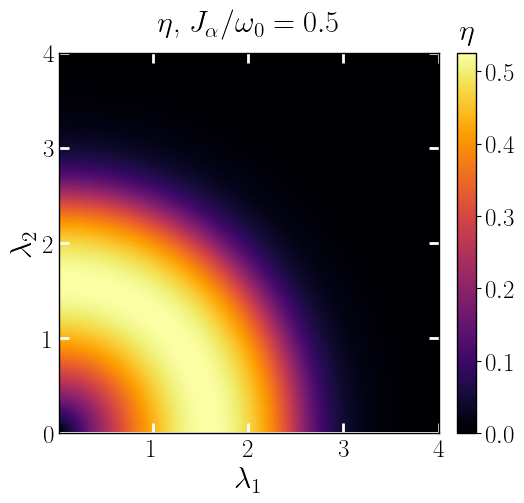

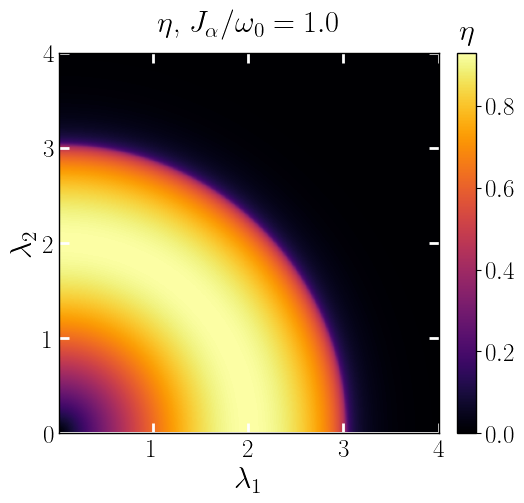

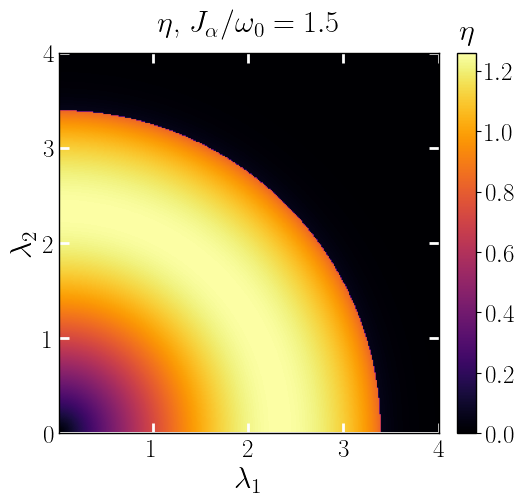

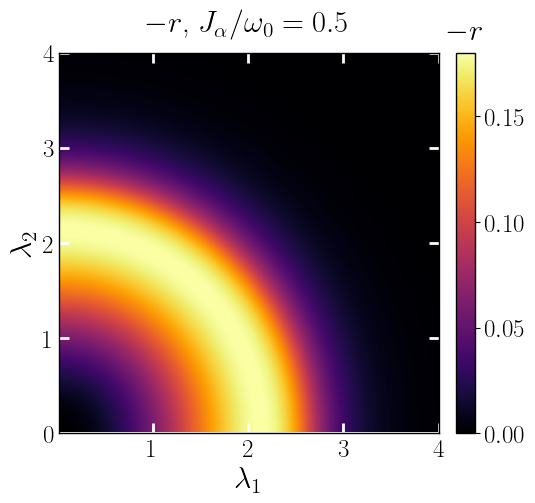

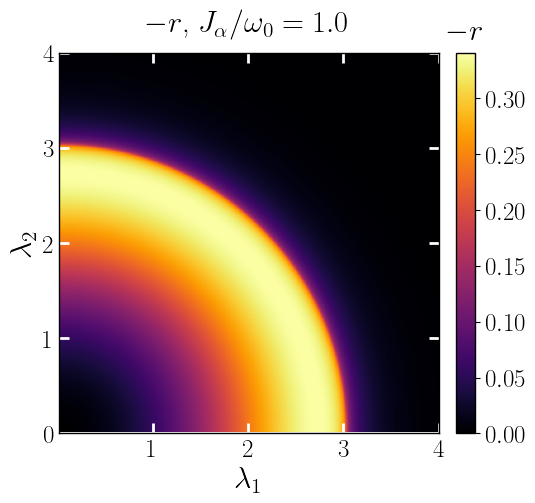

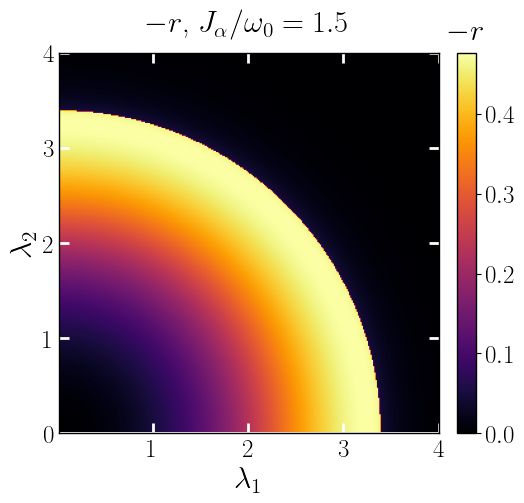

In [6]:
extent = [lam1_arr[0], lam1_arr[-1], lam2_arr[0], lam2_arr[-1]]

# entradas: (dict, signo, label, ftag, zoom)   zoom=True → genera zoom extra
param_maps = [(alpha_m, 1, r'$\eta$', 'alpha', False), (r_m, -1, r'$-r$', 'mr', False)]

ZOOM_LIM = (0.0, 1.5)   # límites del zoom en ambos ejes

def _param_heatmaps(param_maps):
    for dct, sgn, lbl, ftag, zoom in param_maps:
        for cv in cv_list:
            data = sgn*dct[cv]; vmax = np.nanmax(data)

            # ── heatmap principal ──
            fig, ax = plt.subplots(figsize=(6, 5.5))
            im = ax.imshow(data, origin='lower', aspect='equal', extent=extent, cmap='inferno', vmin=0.0, vmax=vmax)
            cbar =fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            cbar.ax.set_title(lbl,  pad=10)
            ax.set_xlabel(r'$\lambda_1$'); ax.set_ylabel(r'$\lambda_2$')
            ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True, color='white', size=7.5, width=2.0)
            ax.set_xticks([ 1.0,  2.0,  3.0,  4.0])
            ax.set_yticks([0, 1.0, 2.0,  3.0, 4.0])
            ax.set_title(rf'{lbl},  $J_\alpha /\omega_0={cv}$', pad=15)
            plt.tight_layout()
            plt.savefig(f'Resultados_aniso/heatmap_cat_{ftag}_cv{cv}.png', bbox_inches='tight', transparent=False, dpi=300)
            plt.show()

            # ── heatmap de zoom (opcional), colorbar reescalada a la máscara ──
            if zoom:
                lo, hi = ZOOM_LIM
                mask1 = (lam1_arr >= lo) & (lam1_arr <= hi)
                mask2 = (lam2_arr >= lo) & (lam2_arr <= hi)
                sub = data[np.ix_(mask2, mask1)]           # [i2, j1]
                vmin_z, vmax_z = np.nanmin(sub), np.nanmax(sub)
                extent_z = [lam1_arr[mask1][0], lam1_arr[mask1][-1], lam2_arr[mask2][0], lam2_arr[mask2][-1]]

                fig, ax = plt.subplots(figsize=(6, 5.5))
                im = ax.imshow(sub, origin='lower', aspect='equal', extent=extent_z, cmap='inferno', vmin=vmin_z, vmax=vmax_z)
                fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=lbl)
                ax.set_xlabel(r'$\lambda_1$'); ax.set_ylabel(r'$\lambda_2$')
                ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True, color='white')
                ax.set_xticks([0.0, 0.5, 1.0, 1.5]); ax.set_yticks([0.0, 0.5, 1.0, 1.5])
                ax.set_title(rf'{lbl} (zoom),  $J_\alpha /\omega_0={cv}$', pad=15)
                plt.tight_layout()
                plt.savefig(f'Resultados_aniso/heatmap_cat_{ftag}_cv{cv}_zoom.png', bbox_inches='tight', transparent=False, dpi=300)
                plt.show()

_param_heatmaps(param_maps)

Cut cat params, rho=1.0, cv=0.5


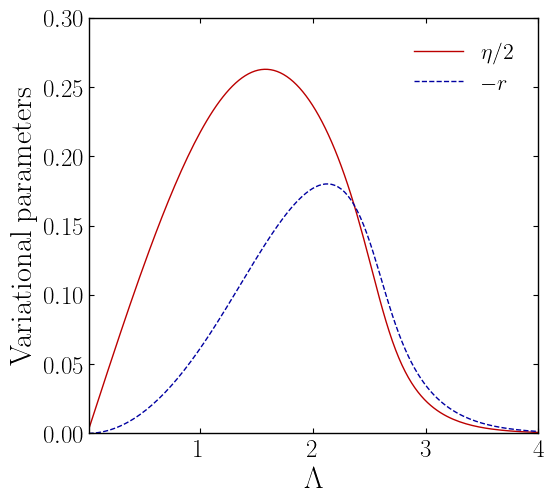

Cut cat params, rho=1.0, cv=1.0


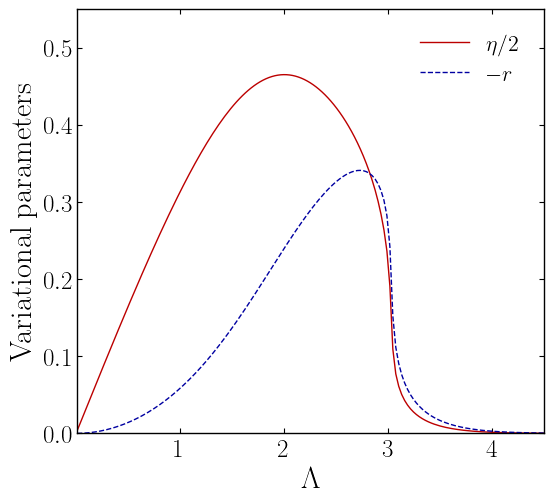

Cut cat params, rho=1.0, cv=1.5


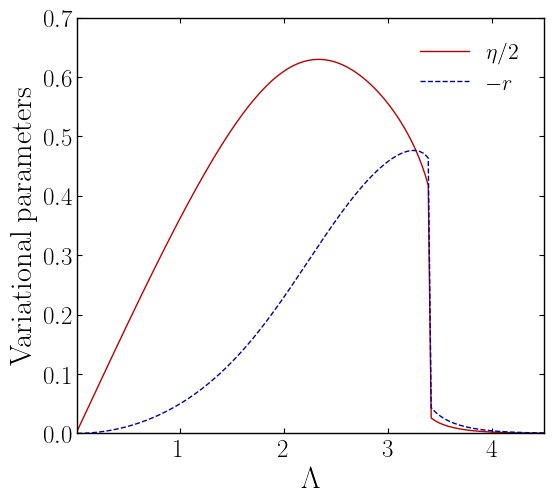

In [7]:
C_A = plt.cm.seismic(0.12)   # azul  (squeezing)
C_B = plt.cm.seismic(0.88)   # rojo  (desplazamiento)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

xlim_by_cv = {0.5: 4.0, 1.0: 4.5, 1.5: 4.5}
ylim_by_cv = {0.5: 0.3, 1.0: 0.55, 1.5: 0.7}
rho_list   = [1.0]

n_Lam   = 200
Lam_max = 4.0*np.sqrt(2)

def _lam12_from_Lam_rho(Lam, rho):
    lam2 = Lam / np.sqrt(1.0 + rho**2)
    lam1 = rho * lam2
    return lam1, lam2

def _cat_param_ray(rho, cv):
    """Barrido 1D radial: parámetros de gato (α, r) vs Λ a ρ fijo."""
    Lam_arr = np.linspace(0.01, Lam_max, n_Lam)
    out = {k: np.full(n_Lam, np.nan) for k in ('Lam', 'alpha', 'r')}
    warm = None
    for k, Lam in enumerate(Lam_arr):
        lam1, lam2 = _lam12_from_Lam_rho(Lam, rho)
        out['Lam'][k] = Lam
        E, x = _minimize_cat(lam1, lam2, s=cv, x_warm=warm); warm = x
        out['alpha'][k], out['r'][k] = x
    return out

# ── Cortes 1D — parámetros de gato (α, r) ──────────────
for rho in rho_list:
    for cv in cv_list:
        print(f'Cut cat params, rho={rho}, cv={cv}', flush=True)
        ray = _cat_param_ray(rho, cv)
        Lc = ray['Lam']
        fig, ax = plt.subplots(figsize=(6, 5.5))
        ax.plot(Lc,  ray['alpha']/2, '-',  color=C_B, lw=1.0, label=r'$\eta/2$')
        ax.plot(Lc, -ray['r'],       '--', color=C_A, lw=1.0, label=r'$-r$')
        ax.set_xlim(Lc[0], xlim_by_cv[cv])
        ax.set_ylim(0.0, ylim_by_cv[cv])
        ax.set_xlabel(r'$\Lambda$'); ax.set_ylabel(r'Variational parameters')
        ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
        ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)
        plt.tight_layout()
        plt.savefig(f'Resultados_aniso/cut_cat_params_rho{rho}_cv{cv}.png', bbox_inches='tight', transparent=False, dpi=300)
        plt.show()

Cat infidelity (+), $J_\alpha/\omega_0=0.5$


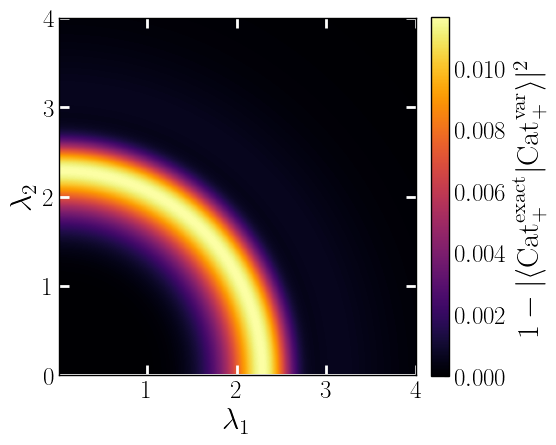

Cat infidelity (-), $J_\alpha/\omega_0=0.5$


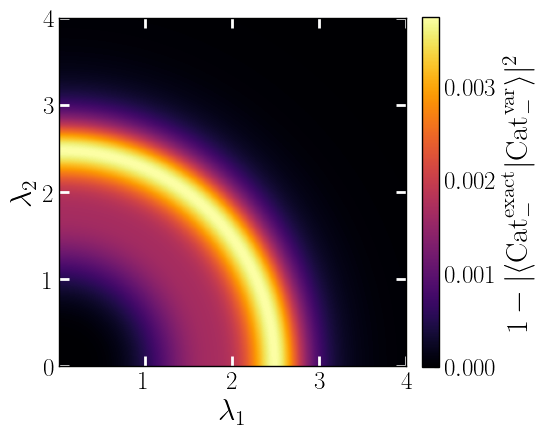

Absolute error, $J_\alpha/\omega_0=0.5$


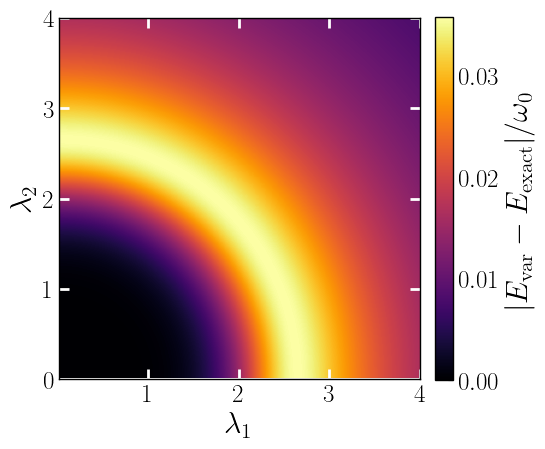

Cat infidelity (+), $J_\alpha/\omega_0=1.0$


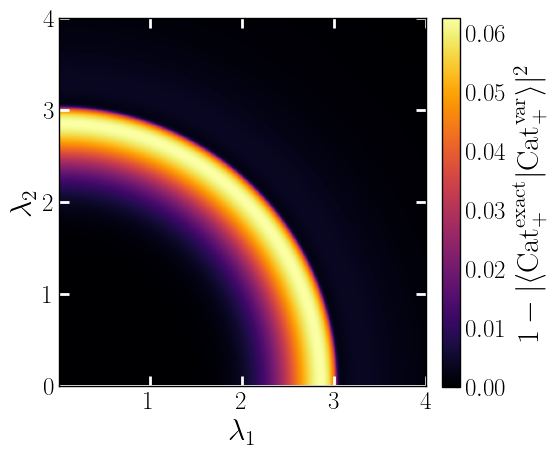

Cat infidelity (-), $J_\alpha/\omega_0=1.0$


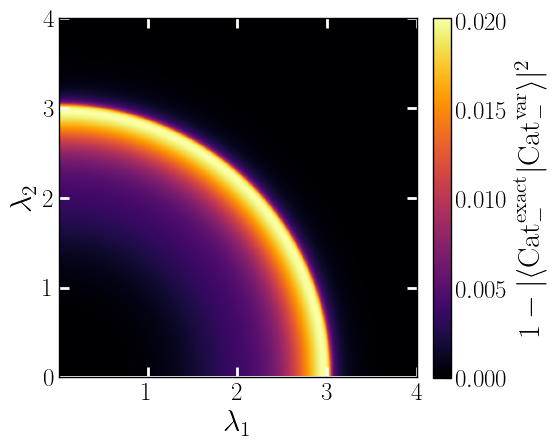

Absolute error, $J_\alpha/\omega_0=1.0$


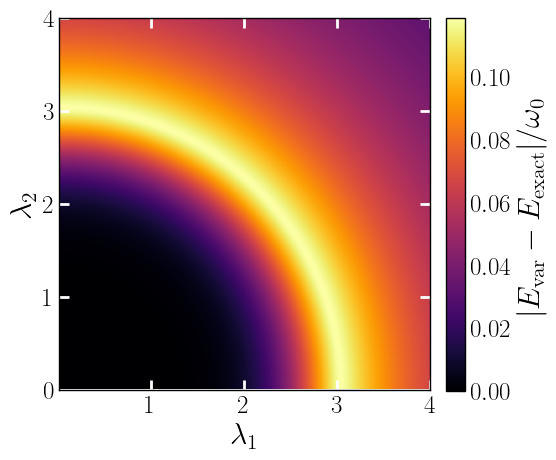

Cat infidelity (+), $J_\alpha/\omega_0=1.5$


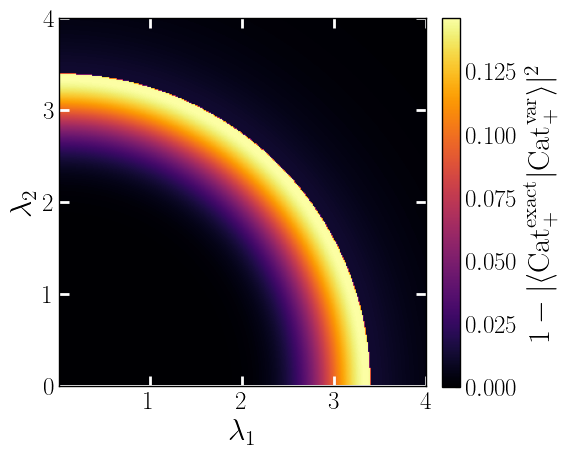

Cat infidelity (-), $J_\alpha/\omega_0=1.5$


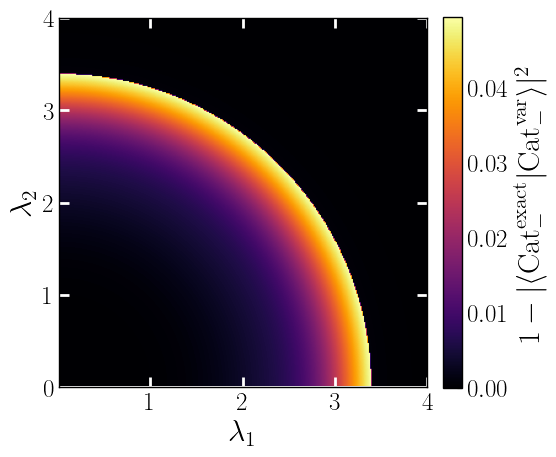

Absolute error, $J_\alpha/\omega_0=1.5$


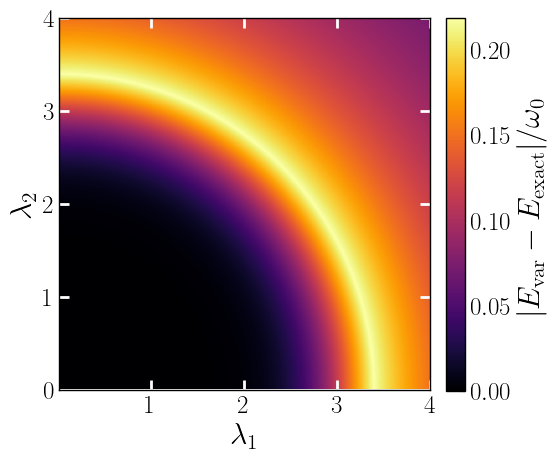

In [8]:
# ══════════════════════════════════════════════════════════════════
# HEATMAPS de infidelidad (AMBAS RAMAS) y error absoluto del GATO
# ══════════════════════════════════════════════════════════════════
def _single_heatmap(data, label, ftag):
    vmax = np.nanmax(data)
    fig, ax = plt.subplots(figsize=(6, 5.5))
    im = ax.imshow(data, origin='lower', aspect='equal', extent=extent, cmap='inferno', vmin=0.0, vmax=vmax)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=label)
    ax.set_xlabel(r'$\lambda_1$'); ax.set_ylabel(r'$\lambda_2$')
    ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True, color='white', size=7.5, width=2.0)
    ax.set_xticks([1.0,  2.0,  3.0, 4.0])
    ax.set_yticks([0, 1.0, 2.0,  3.0, 4.0])
    plt.tight_layout()
    plt.savefig(f'Resultados_aniso/heatmap_cat_{ftag}.png', bbox_inches='tight', transparent=False, dpi=300)
    plt.show()

for cv in cv_list:
    print(rf'Cat infidelity (+), $J_\alpha/\omega_0={cv}$')
    _single_heatmap(fid_p[cv], r'$1-|\langle\mathrm{Cat}_+^{\mathrm{exact}}|\mathrm{Cat}_+^{\mathrm{var}}\rangle|^2$', f'infid_plus_cv{cv}')

    print(rf'Cat infidelity (-), $J_\alpha/\omega_0={cv}$')
    _single_heatmap(fid_m[cv], r'$1-|\langle\mathrm{Cat}_-^{\mathrm{exact}}|\mathrm{Cat}_-^{\mathrm{var}}\rangle|^2$', f'infid_minus_cv{cv}')

    print(rf'Absolute error, $J_\alpha/\omega_0={cv}$')
    _single_heatmap(np.abs(Evar[cv] - Eex[cv]), r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/\omega_0$', f'abserr_cv{cv}')

In [4]:
def _lam12_from_Lam_rho(Lam, rho):
    lam2 = Lam / np.sqrt(1.0 + rho**2)
    lam1 = rho * lam2
    return lam1, lam2

def _cat_ray(rho, cv):
    """Barrido 1D radial del gato a ρ fijo. Infidelidad de ambas ramas vs Λ."""
    Lam_arr = np.linspace(0.01, Lam_max, n_Lam)
    out = {k: np.full(n_Lam, np.nan) for k in ('Lam', 'infid_p', 'infid_m')}
    warm = None
    for k, Lam in enumerate(Lam_arr):
        lam1, lam2 = _lam12_from_Lam_rho(Lam, rho)
        M = _Mof_Lam(Lam)
        out['Lam'][k] = Lam
        E, x = _minimize_cat(lam1, lam2, cv, x_warm=warm); warm = x
        Ee, vec, _ = E_cat_exact(lam1, lam2, cv, M=M)
        ov_p, _, _ = _cat_overlap(lam1, lam2, x[0], x[1], vec, M, sign=+1)
        ov_m, _, _ = _cat_overlap(lam1, lam2, x[0], x[1], vec, M, sign=-1)
        out['infid_p'][k] = 1.0 - ov_p**2
        out['infid_m'][k] = 1.0 - ov_m**2
    return out


  rho=1.0, cv=0.5: calculando rayo ...
  rho=1.0, cv=1.0: calculando rayo ...
  rho=1.0, cv=1.5: calculando rayo ...


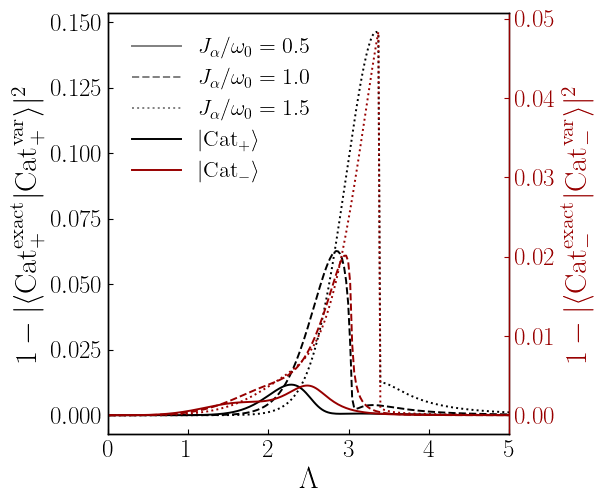

Cat infidelity (both branches, 1D), rho=1.0


In [ ]:
# ══════════════════════════════════════════════════════════════════
# CORTE λ₂=ρλ₁ del GATO — barrido 1D radial (sin interpolar mapa 2D)
#   Infidelidad de las dos ramas: (+) negro eje izq / (−) rojo eje der
# ══════════════════════════════════════════════════════════════════
LS      = {0.5: '-', 1.0: '--', 1.5: ':'}
C_PLUS  = 'black'               # rama (+)
C_MINUS = plt.cm.seismic(0.95)  # rama (−)

n_Lam   = 200
Lam_max = 5.0


for rho in rho_list:
    fig, ax_o1 = plt.subplots(figsize=(6.5, 5.5))
    ax_e1 = ax_o1.twinx()      # eje derecho: rama (−)

    Lc = None
    for cv in cv_list:
        print(f"  rho={rho}, cv={cv}: calculando rayo ...", flush=True)
        ray = _cat_ray(rho, cv)
        Lc = ray['Lam']
        ax_o1.plot(Lc, ray['infid_p'], LS[cv], color=C_PLUS,  lw=1.4)
        ax_e1.plot(Lc, ray['infid_m'], LS[cv], color=C_MINUS, lw=1.4)

    # ── formato ──
    ax_o1.set_xlabel(r'$\Lambda$')
    ax_o1.set_ylabel(r'$1-|\langle\mathrm{Cat}_+^{\mathrm{exact}}|\mathrm{Cat}_+^{\mathrm{var}}\rangle|^2$',
                     color=C_PLUS)
    ax_o1.tick_params(axis='y', colors=C_PLUS, direction='in')
    ax_o1.tick_params(axis='x', direction='in')
    ax_o1.set_xlim(Lc[0], Lam_max)
    ax_e1.set_ylabel(r'$1-|\langle\mathrm{Cat}_-^{\mathrm{exact}}|\mathrm{Cat}_-^{\mathrm{var}}\rangle|^2$',
                     color=C_MINUS)
    ax_e1.tick_params(axis='y', colors=C_MINUS, direction='in')
    ax_e1.spines['right'].set_color(C_MINUS)
    ax_e1.spines['left'].set_color(C_PLUS)
    ax_o1.set_xticks(np.arange(0, np.floor(Lc[-1]) + 1, 1))

    # ── leyenda dentro del axes, arriba-izquierda, una columna ──
    handles  = [mlines.Line2D([], [], color='gray', ls=LS[cv], lw=1.4,
                              label=rf'$J_\alpha/\omega_0={cv}$') for cv in cv_list]
    handles += [mlines.Line2D([], [], color=C_PLUS,  lw=1.4, label=r'$|\mathrm{Cat}_+\rangle$'),
                mlines.Line2D([], [], color=C_MINUS, lw=1.4, label=r'$|\mathrm{Cat}_-\rangle$')]
    ax_o1.legend(handles=handles, loc='upper left', ncol=1, frameon=True,
                 edgecolor='black', framealpha=0.0, fancybox=False,
                 borderpad=0.6, handlelength=2.2, labelspacing=0.4)

    plt.tight_layout()
    plt.savefig(f'Resultados_aniso/cat_infid_1D_rho{rho}.png',
                bbox_inches='tight', transparent=False, dpi=300)
    plt.show()
    print(f'Cat infidelity (both branches, 1D), rho={rho}')

In [5]:

def _lam12_from_Lam_rho(Lam, rho):
    lam2 = Lam / np.sqrt(1.0 + rho**2)
    lam1 = rho * lam2
    return lam1, lam2

def _cat_ray(rho, cv):
    """Barrido 1D radial del gato a ρ fijo. Infidelidad de ambas ramas vs Λ."""
    Lam_arr = np.linspace(0.01, Lam_max, n_Lam)
    out = {k: np.full(n_Lam, np.nan) for k in ('Lam', 'infid_p', 'infid_m')}
    warm = None
    for k, Lam in enumerate(Lam_arr):
        lam1, lam2 = _lam12_from_Lam_rho(Lam, rho)
        M = _Mof_Lam(Lam)
        out['Lam'][k] = Lam
        E, x = _minimize_cat(lam1, lam2, cv, x_warm=warm); warm = x
        Ee, vec, _ = E_cat_exact(lam1, lam2, cv, M=M)
        ov_p, _, _ = _cat_overlap(lam1, lam2, x[0], x[1], vec, M, sign=+1)
        ov_m, _, _ = _cat_overlap(lam1, lam2, x[0], x[1], vec, M, sign=-1)
        out['infid_p'][k] = 1.0 - ov_p**2
        out['infid_m'][k] = 1.0 - ov_m**2
    return out

  rho=1.0, cv=0.5: calculando rayo ...
  rho=1.0, cv=1.0: calculando rayo ...
  rho=1.0, cv=1.5: calculando rayo ...


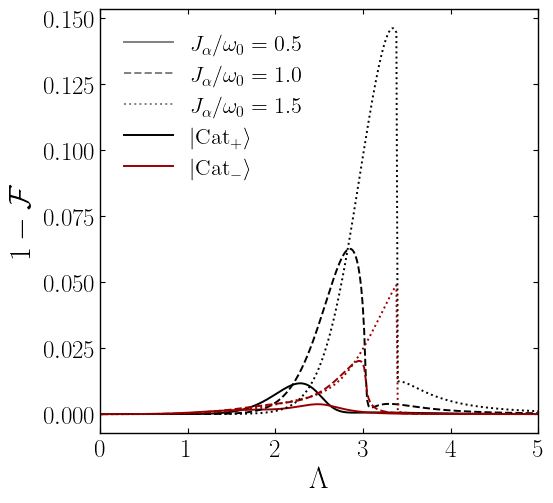

Cat infidelity (both branches, 1D), rho=1.0


In [ ]:
# ══════════════════════════════════════════════════════════════════
# CORTE λ₂=ρλ₁ del GATO — barrido 1D radial (sin interpolar mapa 2D)
#   Infidelidad de las dos ramas, mismo eje/escala. (+) negro, (−) rojo.
# ══════════════════════════════════════════════════════════════════
LS      = {0.5: '-', 1.0: '--', 1.5: ':'}
C_PLUS  = 'black'               # rama (+)
C_MINUS = plt.cm.seismic(0.95)  # rama (−)

rho_list = [1.0]
cv_list = [0.5, 1.0, 1.5]

n_Lam   = 300
Lam_max = 5.0


for rho in rho_list:
    fig, ax = plt.subplots(figsize=(5.5, 5.0))

    Lc = None
    for cv in cv_list:
        print(f"  rho={rho}, cv={cv}: calculando rayo ...", flush=True)
        ray = _cat_ray(rho, cv)
        Lc = ray['Lam']
        ax.plot(Lc, ray['infid_p'], LS[cv], color=C_PLUS,  lw=1.4)
        ax.plot(Lc, ray['infid_m'], LS[cv], color=C_MINUS, lw=1.4)

    # ── formato ──
    ax.set_xlabel(r'$\Lambda$')
    ax.set_ylabel(r'$1-\mathcal{F}$')
    ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                   right=True, left=True)
    ax.set_xlim(Lc[0], Lam_max)
    ax.set_xticks(np.arange(0, np.floor(Lc[-1]) + 1, 1))

    # ── leyenda dentro del axes, arriba-izquierda, una columna ──
    handles  = [mlines.Line2D([], [], color='gray', ls=LS[cv], lw=1.4,
                              label=rf'$J_\alpha/\omega_0={cv}$') for cv in cv_list]
    handles += [mlines.Line2D([], [], color=C_PLUS,  lw=1.4, label=r'$|\mathrm{Cat}_+\rangle$'),
                mlines.Line2D([], [], color=C_MINUS, lw=1.4, label=r'$|\mathrm{Cat}_-\rangle$')]
    ax.legend(handles=handles, loc='upper left', ncol=1, frameon=True,
              edgecolor='black', framealpha=0.0, fancybox=False,
              borderpad=0.6, handlelength=2.2, labelspacing=0.4)

    plt.tight_layout()
    plt.savefig(f'Resultados_aniso/cat_infid_1D_rho{rho}.png',
                bbox_inches='tight', transparent=False, dpi=300)
    plt.show()
    print(f'Cat infidelity (both branches, 1D), rho={rho}')

### Post-procesing results

In [6]:
def _smooth(y, window=7, poly=3):
    """Savitzky-Golay ligero: quita los saltos del cutoff sin distorsionar la forma.
       Ignora NaN (los rellena por interpolación temporal antes de filtrar)."""
    y = np.asarray(y, float)
    m = np.isfinite(y)
    if m.sum() < window:
        return y
    ys = y.copy()
    # rellenar NaN internos para que savgol no propague
    if (~m).any():
        idx = np.arange(len(y))
        ys[~m] = np.interp(idx[~m], idx[m], y[m])
    win = min(window, len(ys) - (1 - len(ys) % 2))  # impar y ≤ len
    if win < poly + 2:
        return y
    if win % 2 == 0:
        win -= 1
    out = savgol_filter(ys, win, poly)
    out[~m] = np.nan  # restaurar NaN donde no había dato
    return out

def _spline_smooth(x, y, s_factor=1e-4):
    """Spline suave final: pule la curva ya pasada por SG.
       s pequeño → sigue de cerca los datos, solo quita rugosidad residual.
       Ignora NaN."""
    x = np.asarray(x, float); y = np.asarray(y, float)
    m = np.isfinite(x) & np.isfinite(y)
    if m.sum() < 4:
        return y
    xv, yv = x[m], y[m]
    # s escala con el nº de puntos y la varianza → s_factor relativo
    s = s_factor * len(yv) * np.nanvar(yv)
    spl = UnivariateSpline(xv, yv, k=2, s=s)
    out = np.full_like(y, np.nan)
    out[m] = spl(xv)
    return out

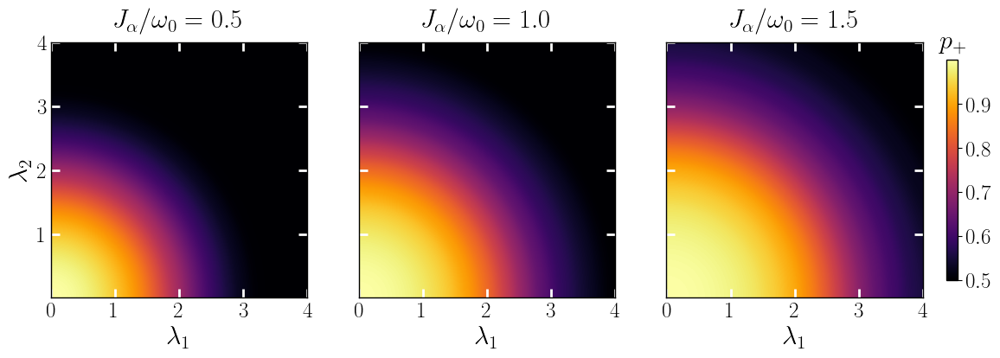

Heatmap panel: pplus_exact


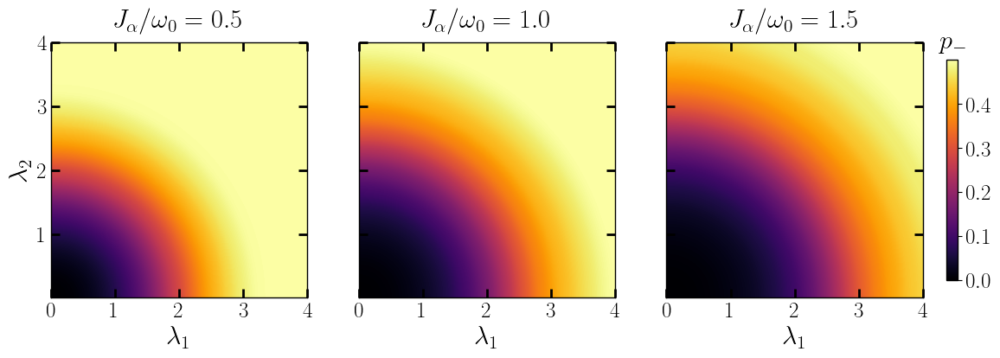

Heatmap panel: pminus_exact


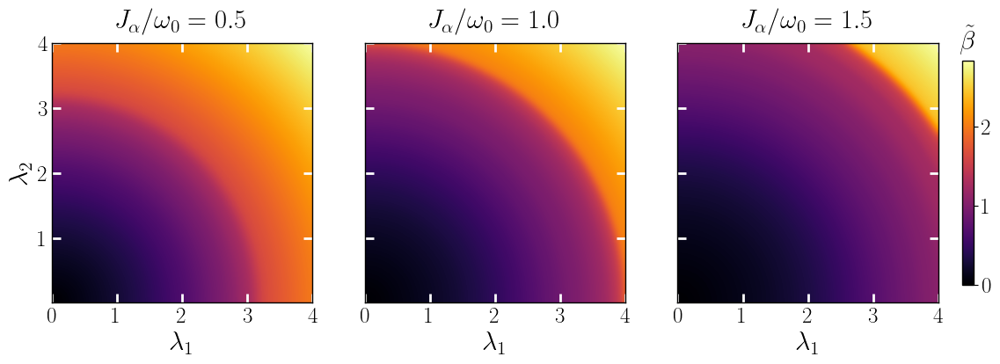

Heatmap panel: theta_exact


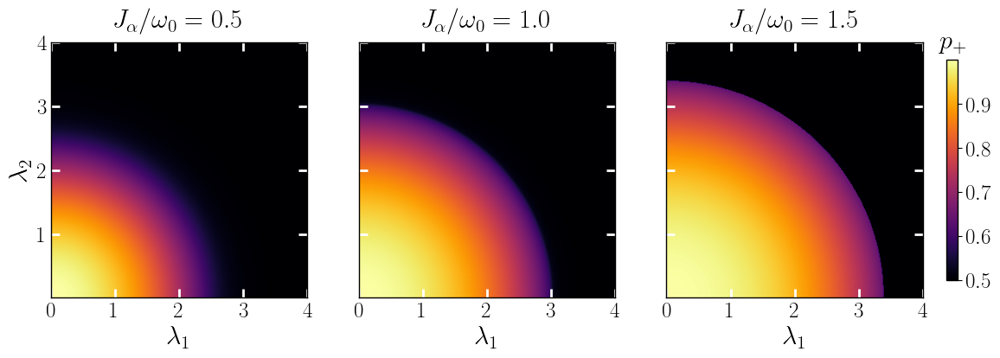

Heatmap panel: pplus_var


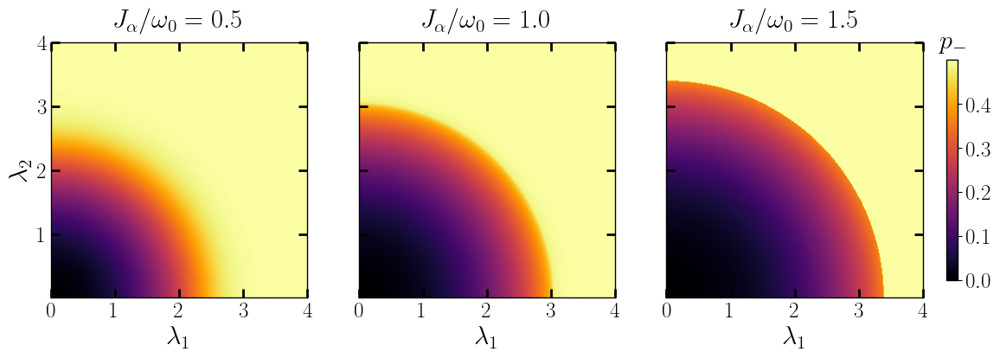

Heatmap panel: pminus_var


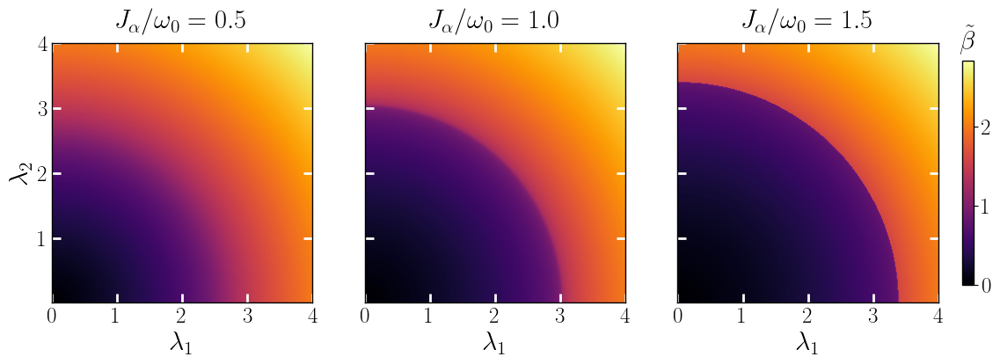

Heatmap panel: theta_var


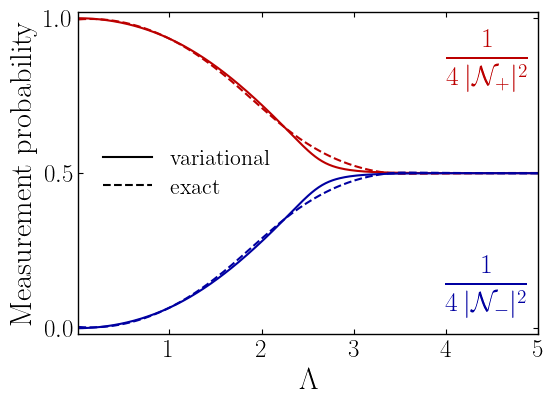

Probabilities (var vs exact), rho=1.0, cv=0.5


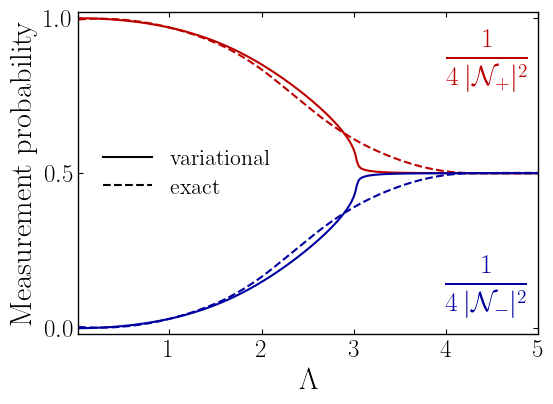

Probabilities (var vs exact), rho=1.0, cv=1.0


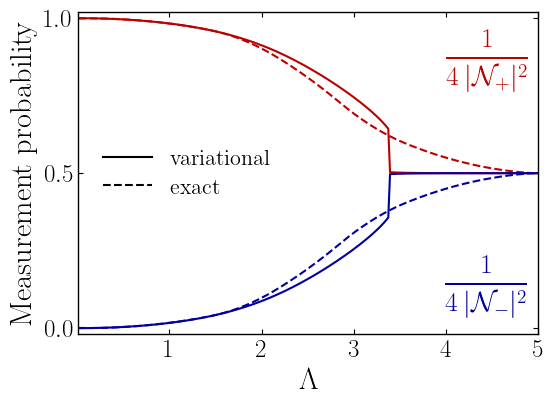

Probabilities (var vs exact), rho=1.0, cv=1.5


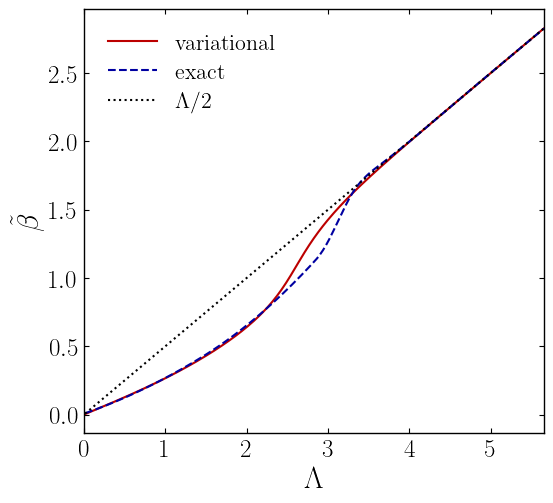

theta_tilde (var vs exact), rho=1.0, cv=0.5


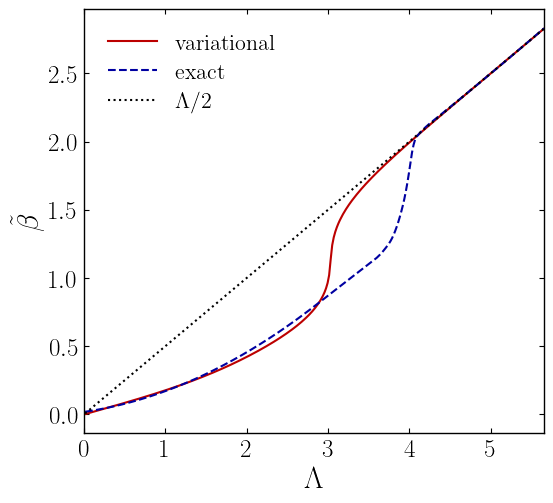

theta_tilde (var vs exact), rho=1.0, cv=1.0


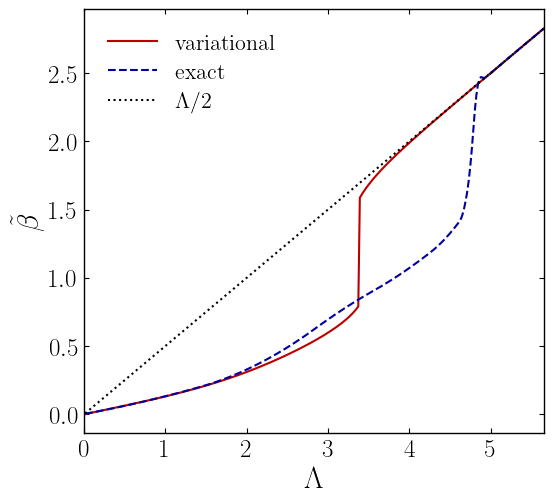

theta_tilde (var vs exact), rho=1.0, cv=1.5


In [7]:
# ══════════════════════════════════════════════════════════════════
#  PUNTO 3 — p_±, θ̃ desde overlaps guardados. Exacto vs variacional.
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
n_lam    = 300
cv_list  = [0.5, 1.0, 1.5]
rho_list = [1.0]

root_dir = f"cat_state_variational_params_omega0{omega0:.1f}_nl1_{n_lam}_nl2_{n_lam}"

def _load(cv, name):
    pl = f"{cv:.1f}_omega0{omega0:.1f}_nl1_{n_lam}_nl2_{n_lam}"
    return np.loadtxt(os.path.join(root_dir, f"cv_{cv}", f"{name}_{pl}.txt"))

lam1_arr = _load(cv_list[0], "coord_lambda1")
lam2_arr = _load(cv_list[0], "coord_lambda2")
extent   = [lam1_arr[0], lam1_arr[-1], lam2_arr[0], lam2_arr[-1]]

# ── derivar p_± y θ̃ (exacto Y variacional) ──────────────────────
p_plus_ex = {}; p_minus_ex = {}
p_plus_var = {}; p_minus_var = {}
theta_ex = {}; theta_var = {}
for cv in cv_list:
    o_ex  = np.abs(_load(cv, "overlap_exact"))   # exacto sale negativo → |·|
    o_var = np.abs(_load(cv, "overlap_var"))
    p_plus_ex[cv]   = 0.5*(1.0 + o_ex)
    p_minus_ex[cv]  = 0.5*(1.0 - o_ex)
    p_plus_var[cv]  = 0.5*(1.0 + o_var)
    p_minus_var[cv] = 0.5*(1.0 - o_var)
    theta_ex[cv]  = np.sqrt(np.clip(-0.5*np.log(np.clip(o_ex,  1e-300, None)), 0.0, None))
    theta_var[cv] = np.sqrt(np.clip(-0.5*np.log(np.clip(o_var, 1e-300, None)), 0.0, None))

# ══════════════════════════════════════════════════════════════════
#  HEATMAPS (inferno) — paneles 1×3 por cv
# ══════════════════════════════════════════════════════════════════
def _row_heatmap(data_by_cv, label, ftag, limits=False, col_ticks='white', sigma=0.0):
    vmax = max(np.nanmax(data_by_cv[cv]) for cv in cv_list)
    if limits:
        vmin = 0.5
    else: vmin = 0.0
    fig, axes = plt.subplots(1, 3, figsize=(14, 5.5))
    for idx, cv in enumerate(cv_list):
        ax = axes[idx]
        data = data_by_cv[cv]
        if sigma and sigma > 0:                       
            data = gaussian_filter(data, sigma=sigma, mode='nearest')
        im = ax.imshow(data, origin='lower', aspect='equal', extent=extent, cmap='inferno', vmin=vmin, vmax=vmax)
        ax.set_xlabel(r'$\lambda_1$')
        ax.tick_params(axis='x', direction='in', bottom=True, top=True, right=True, left=True, color=col_ticks, size=7.5, width=2.0)
        ax.tick_params(axis='y', direction='in', right=True, left=True, color=col_ticks, size=7.5, width=2.0, labelleft=(idx == 0))
        if idx == 0:
            ax.set_ylabel(r'$\lambda_2$')
        ax.set_title(rf'$J_\alpha /\omega_0={cv}$', pad=12)
        ax.set_xticks([0.0, 1.0,  2.0, 3.0,  4.0])
    cbar =fig.colorbar(im, ax=axes.ravel().tolist(), fraction=0.046, pad=0.025, shrink=0.6)
    cbar.ax.set_title(label, pad=10)
    plt.savefig(f'Resultados_aniso/heatmap_cat_{ftag}.png', bbox_inches='tight', transparent=False, dpi=300)
    plt.show()
    print(f'Heatmap panel: {ftag}')

_row_heatmap(p_plus_ex,  r'$p_+$',            'pplus_exact',  True,  sigma=4.0)
_row_heatmap(p_minus_ex, r'$p_-$',            'pminus_exact', False, col_ticks='black', sigma=4.0)
_row_heatmap(theta_ex,   r'$\tilde{\beta}$', 'theta_exact',  False, sigma=4.0)
_row_heatmap(p_plus_var,  r'$p_+$',            'pplus_var',  True)
_row_heatmap(p_minus_var, r'$p_-$',            'pminus_var', False, col_ticks='black')
_row_heatmap(theta_var,   r'$\tilde{\beta}$', 'theta_var',  False)

# ══════════════════════════════════════════════════════════════════
#  CORTES λ₂=ρλ₁
# ══════════════════════════════════════════════════════════════════
def _cut(data2d, rho, n_cut=300):
    itp = RegularGridInterpolator((lam2_arr, lam1_arr), data2d, bounds_error=False, fill_value=np.nan)
    l1max = min(lam1_arr[-1], lam2_arr[-1]/rho)
    l1 = np.linspace(max(lam1_arr[0], 0.01), l1max, n_cut)
    l2 = rho*l1
    Lam = np.sqrt(l1**2 + l2**2)
    return Lam, itp(np.column_stack([l2, l1]))

plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

# ── (a) PROBABILIDADES ──────────────────────────────────────────
C_PLUS  = plt.cm.seismic(0.88)
C_MINUS = plt.cm.seismic(0.12)

for rho in rho_list:
    for cv in cv_list:
        Lc, pp_e = _cut(p_plus_ex[cv],   rho)
        _,  pm_e = _cut(p_minus_ex[cv],  rho)
        _,  pp_v = _cut(p_plus_var[cv],  rho)
        _,  pm_v = _cut(p_minus_var[cv], rho)

        pp_e = _smooth(pp_e, window=15, poly=3)           
        pp_e = _spline_smooth(Lc, pp_e, s_factor=1e-4)

        pm_e = _smooth(pm_e, window=15, poly=3)           
        pm_e = _spline_smooth(Lc, pm_e, s_factor=1e-4)

        fig, ax = plt.subplots(figsize=(6.0, 4.5))
        ax.plot(Lc, pp_v, '-',  color=C_PLUS,  lw=1.5)
        ax.plot(Lc, pp_e, '--', color=C_PLUS,  lw=1.5)
        ax.plot(Lc, pm_v, '-',  color=C_MINUS, lw=1.5)
        ax.plot(Lc, pm_e, '--', color=C_MINUS, lw=1.5)

        ax.set_xlabel(r'$\Lambda$')
        ax.set_ylabel(r'Measurement probability', labelpad=5)
        ax.set_xlim(Lc[0], Lc[-1]); ax.set_ylim(-0.02, 1.02)
        ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)
        ax.set_xlim(Lc[0], 5)
        ax.yaxis.set_major_locator(ticker.FixedLocator([0.0, 0.5, 1.0]))
        ax.text(0.975, 0.85, r'$\dfrac{1}{4\,|\mathcal{N}_+|^{2}}$', transform=ax.transAxes, color=C_PLUS,  ha='right', va='center', fontsize=20)
        ax.text(0.975, 0.15, r'$\dfrac{1}{4\,|\mathcal{N}_-|^{2}}$', transform=ax.transAxes, color=C_MINUS, ha='right', va='center', fontsize=20)
        leg = [mlines.Line2D([], [], color='k', ls='-',  lw=1.5, label='variational'), mlines.Line2D([], [], color='k', ls='--', lw=1.5, label='exact')]
        ax.legend(handles=leg, frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, loc='center left', borderpad=0.6, handlelength=2.2, labelspacing=0.4)
        plt.tight_layout()
        plt.savefig(f'Resultados_aniso/prob_cat_rho{rho}_cv{cv}.png', bbox_inches='tight', transparent=False, dpi=300)
        plt.show()
        print(f'Probabilities (var vs exact), rho={rho}, cv={cv}')

# ── (b) θ̃ ──────────────────────────────────────────────────────
C_VAR = plt.cm.seismic(0.88)
C_EX  = plt.cm.seismic(0.12)

for rho in rho_list:
    for cv in cv_list:
        Lc, th_v = _cut(theta_var[cv], rho)
        _,  th_e = _cut(theta_ex[cv],  rho)

        th_e = _smooth(th_e, window=13, poly=3)           
        th_e = _spline_smooth(Lc, th_e, s_factor=1e-4)

        fig, ax = plt.subplots(figsize=(6, 5.5))
        ax.plot(Lc, th_v, '-',  color=C_VAR, lw=1.5, label='variational')
        ax.plot(Lc, th_e, '--', color=C_EX,  lw=1.5, label='exact')
        ax.plot(Lc, Lc/2.0, 'k:', lw=1.5, label=r'$\Lambda/2$')
        ax.set_xlabel(r'$\Lambda$'); ax.set_ylabel(r'$\tilde{\beta}$')
        ax.set_xlim(0.0, Lc[-1])
        ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
        ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)
        plt.tight_layout()
        plt.savefig(f'Resultados_aniso/theta_tilde_rho{rho}_cv{cv}.png', bbox_inches='tight', transparent=False, dpi=300)
        plt.show()
        print(f'theta_tilde (var vs exact), rho={rho}, cv={cv}')

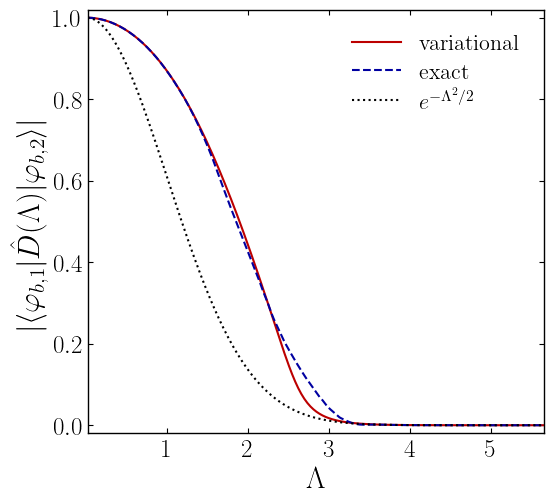

Overlaps (var vs exact), rho=1.0, cv=0.5


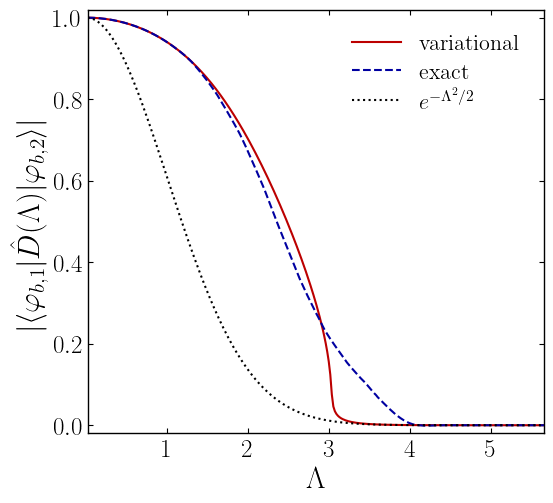

Overlaps (var vs exact), rho=1.0, cv=1.0


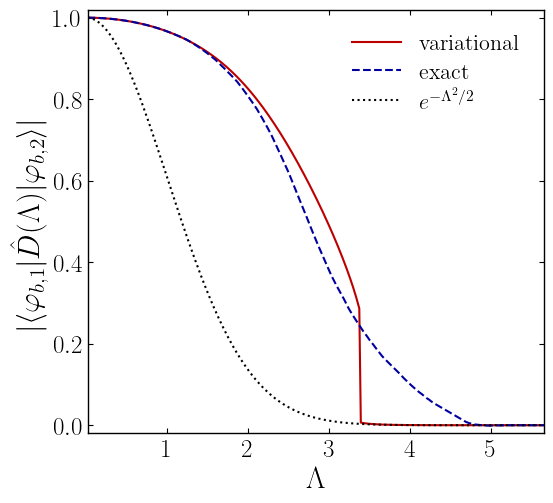

Overlaps (var vs exact), rho=1.0, cv=1.5


In [29]:
C_VAR = plt.cm.seismic(0.88)
C_EX  = plt.cm.seismic(0.12)

for rho in rho_list:
    for cv in cv_list:
        Lc, ov_v = _cut(np.abs(_load(cv, "overlap_var")),  rho)
        _,  ov_e = _cut(np.abs(_load(cv, "overlap_exact")), rho)

        ov_e = _smooth(ov_e, window=39, poly=3)           
        #ov_e = _spline_smooth(Lc, ov_e, s_factor=1e-4)

        fig, ax = plt.subplots(figsize=(6, 5.5))
        ax.plot(Lc, ov_v, '-',  color=C_VAR, lw=1.5, label='variational')
        ax.plot(Lc, ov_e, '--', color=C_EX,  lw=1.5, label='exact')
        ax.plot(Lc, np.exp(-Lc**2/2), 'k:', lw=1.5, label=r'$e^{-\Lambda^2/2}$')
        ax.set_xlabel(r'$\Lambda$')
        ax.set_ylabel(r'$|\langle\varphi_{b,1}|\hat D(\Lambda)|\varphi_{b,2}\rangle|$')
        ax.set_xlim(Lc[0], Lc[-1]); ax.set_ylim(-0.02, 1.02)
        ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
        ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)
        plt.tight_layout()
        plt.savefig(f'Resultados_aniso/overlap_cat_rho{rho}_cv{cv}.png', bbox_inches='tight', transparent=False, dpi=300)
        plt.show()
        print(f'Overlaps (var vs exact), rho={rho}, cv={cv}')

In [8]:
def _X2_cat(lam1, lam2, a, r, evec_ex, M, sign=+1):
    """
    <X²>_cat para la rama sign: exacto (directo por vectores) y variacional.
    Devuelve (X2_exact, X2_var).
      exacto : <Cat_ex|X²|Cat_ex>, gato construido como vector.
      var    : e^{-2r}/2 + 4θ²|N±|²,  con θ=(Λ-α)/2  (NO tilde-θ).
    """
    Lam = _Lambda(lam1, lam2)
    n1  = M + 1
    aop = np.diag(np.sqrt(np.arange(1, n1)), 1)
    X   = (aop + aop.T) / np.sqrt(2)
    X2  = X @ X

    # ── exacto: gato como vector, <cat|X²|cat> ──
    phi1 = evec_ex[:n1]
    phi2 = evec_ex[n1:]
    DpH  = disp_matrix(M, +0.5*Lam)
    DmH  = disp_matrix(M, -0.5*Lam)
    cat_ex = DpH @ phi2 + (-sign) * (DmH @ phi1)   # −sign: signo de φ2
    cat_ex /= np.linalg.norm(cat_ex)
    X2_exact = np.vdot(cat_ex, X2 @ cat_ex).real

    # ── variacional: e^{-2r}/2 + 4θ²|N±|²,  θ=(Λ-α)/2 ──
    theta = 0.5 * (Lam - a)
    o_var = np.exp(-2.0 * theta**2 * np.exp(2.0*r))
    Nvar2 = 1.0 / (2.0 * (1.0 + sign*o_var))
    X2_var = 0.5*np.exp(-2.0*r) + 4.0*theta**2 * Nvar2

    return X2_exact, X2_var


def _Xcorr_cat(lam1, lam2, a, r, evec_ex, M, sign=+1, sector='even'):
    """
    Cross-correlator del gato <X1 X2>_{e/o} para la rama sign.
    sector='even' → +λ1λ2/Λ²  ;  'odd' → −λ1λ2/Λ²
    Devuelve (XX_exact, XX_var).
    """
    Lam  = _Lambda(lam1, lam2)
    pref = (lam1*lam2) / Lam**2
    if sector == 'odd':
        pref = -pref
    X2e, X2v = _X2_cat(lam1, lam2, a, r, evec_ex, M, sign=sign)
    return pref*(X2e - 0.5), pref*(X2v - 0.5)

In [10]:
# ══════════════════════════════════════════════════════════════════
# EJECUCIÓN — CROSS-CORRELATOR del gato <X1X2>, sector par, ambas ramas
# ══════════════════════════════════════════════════════════════════

omega0   = 1.0
cv_list  = [0.5, 1.0, 1.5]
n_lam    = 300
lam1_arr = np.linspace(0.01, 4.0, n_lam)
lam2_arr = np.linspace(0.01, 4.0, n_lam)
SECTOR   = 'even'   # 'even' (+) o 'odd' (−)

# directorio principal (el mismo del gato)
root_dir = f"cat_state_variational_params_omega0{omega0:.1f}_nl1_{n_lam}_nl2_{n_lam}"
if not os.path.isdir(root_dir):
    raise FileNotFoundError(
        f"No existe el directorio principal del gato '{root_dir}'. "
        f"Ejecuta primero la celda del gato (que crea las coordenadas y parámetros).")

def _xcorr_point(i2, j1, cv):
    lam1 = lam1_arr[j1]; lam2 = lam2_arr[i2]
    Lam  = np.sqrt(lam1**2 + lam2**2)
    M = _Mof_Lam(Lam)

    E, x = _minimize_cat(lam1, lam2, cv)          # x = (alpha, r) variacional
    Ee, vec, _ = E_cat_exact(lam1, lam2, cv, M=M)

    xx_e_p, xx_v_p = _Xcorr_cat(lam1, lam2, x[0], x[1], vec, M, sign=+1, sector=SECTOR)
    xx_e_m, xx_v_m = _Xcorr_cat(lam1, lam2, x[0], x[1], vec, M, sign=-1, sector=SECTOR)
    return (i2, j1, xx_e_p, xx_v_p, xx_e_m, xx_v_m)

def _blank(): return {cv: np.full((n_lam, n_lam), np.nan) for cv in cv_list}
xxe_p=_blank(); xxv_p=_blank(); xxe_m=_blank(); xxv_m=_blank()

for cv in cv_list:
    print(f"cv={cv}: cross-correlator {n_lam}×{n_lam} = {n_lam*n_lam} nodos ...", flush=True)
    args = [(i2, j1, cv) for i2 in range(n_lam) for j1 in range(n_lam)]
    chunks = np.array_split(np.arange(len(args)), 20); done = 0
    with joblib.parallel_backend('loky', n_jobs=-1):
        for chunk_idx in chunks:
            batch = [args[a] for a in chunk_idx]
            res = joblib.Parallel()(joblib.delayed(_xcorr_point)(*a) for a in batch)
            for (i2,j1,xe_p,xv_p,xe_m,xv_m) in res:
                xxe_p[cv][i2,j1]=xe_p; xxv_p[cv][i2,j1]=xv_p
                xxe_m[cv][i2,j1]=xe_m; xxv_m[cv][i2,j1]=xv_m
            done += len(chunk_idx)
            print(f"   {100.0*done/len(args):5.1f}%", flush=True)

print("Ejecución cross-correlator lista.")

# ── GUARDAR dentro del directorio principal, en cv_*/xcorr_{SECTOR}/ ──
_SAVE_MAP = [
    (xxe_p, 'xcorr_exact_plus'), (xxv_p, 'xcorr_var_plus'),
    (xxe_m, 'xcorr_exact_minus'),(xxv_m, 'xcorr_var_minus'),
]
for cv in cv_list:
    param_label = f"{cv:.1f}_omega0{omega0:.1f}_nl1_{n_lam}_nl2_{n_lam}"
    cv_dir  = os.path.join(root_dir, f"cv_{cv}")
    if not os.path.isdir(cv_dir):
        raise FileNotFoundError(f"Falta el subdirectorio del gato '{cv_dir}'.")
    xc_dir  = os.path.join(cv_dir, f"xcorr_{SECTOR}")   # subcarpeta del cross-correlator
    os.makedirs(xc_dir, exist_ok=True)
    hdr = (f"cv={cv}, sector={SECTOR}, omega0={omega0}, detuning cero\n"
           f"malla 2D [filas=lam2, columnas=lam1], "
           f"lam1,lam2: {n_lam} pts en [{lam1_arr[0]:.3f},{lam1_arr[-1]:.3f}]")
    for dct, name in _SAVE_MAP:
        np.savetxt(os.path.join(xc_dir, f"{name}_{param_label}.txt"),
                   dct[cv], fmt='%.8e', header=f"{name}\n{hdr}")
    print(f"cv={cv}: guardado en {os.path.abspath(xc_dir)}/", flush=True)

print(f"\nCross-correlator guardado dentro de {os.path.abspath(root_dir)}/")

cv=0.5: cross-correlator 300×300 = 90000 nodos ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
cv=1.0: cross-correlator 300×300 = 90000 nodos ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
cv=1.5: cross-correlator 300×300 = 90000 nodos ...
     5.0%
    10.0%
    15.0%
    20.0%
    25.0%
    30.0%
    35.0%
    40.0%
    45.0%
    50.0%
    55.0%
    60.0%
    65.0%
    70.0%
    75.0%
    80.0%
    85.0%
    90.0%
    95.0%
   100.0%
Ejecución cross-correlator lista.
cv=0.5: guardado en c:\Users\yumab\OneDrive\Documentos\KitaevHolstein\cat_state_variational_params_omega01.0_nl1_300_nl2_300\cv_0.5\xcorr_even/
cv=1.0: guardado en c:\Users\yumab\OneDrive\Documentos\KitaevHolstein

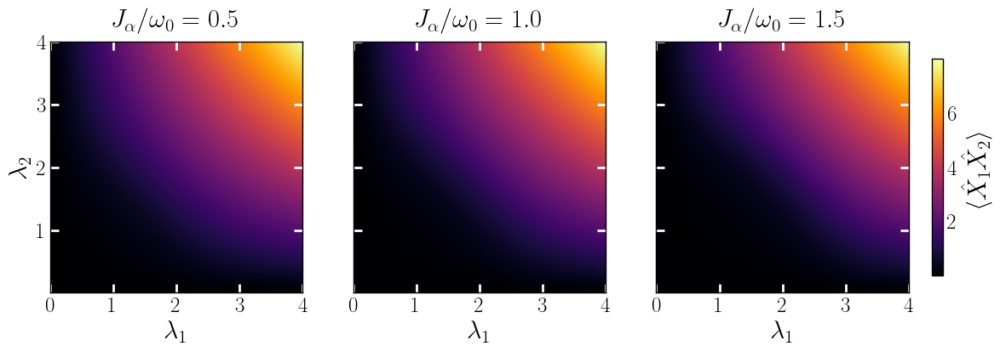

Heatmap panel: xcorr even plus


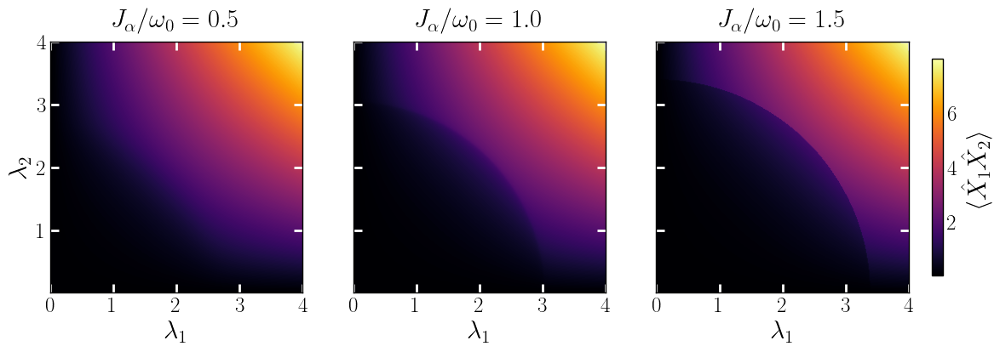

Heatmap panel: xcorr even plus


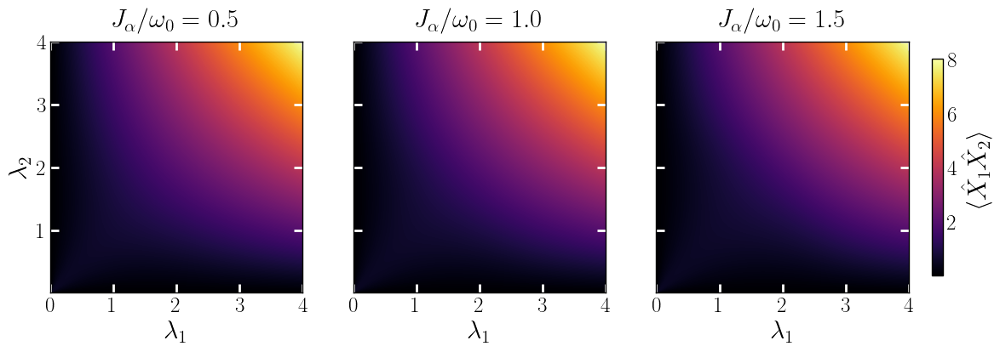

Heatmap panel: xcorr even minus


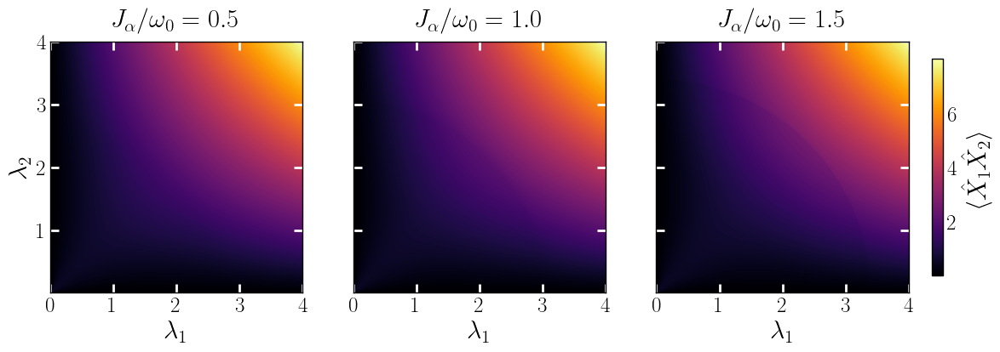

Heatmap panel: xcorr even minus


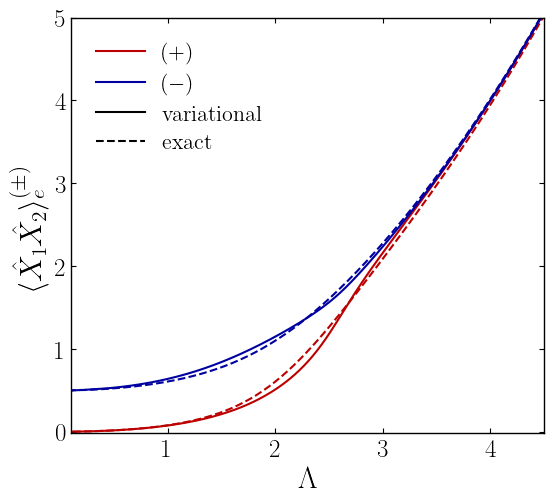

Cut xcorr even (ambas ramas), rho=1.0, cv=0.5


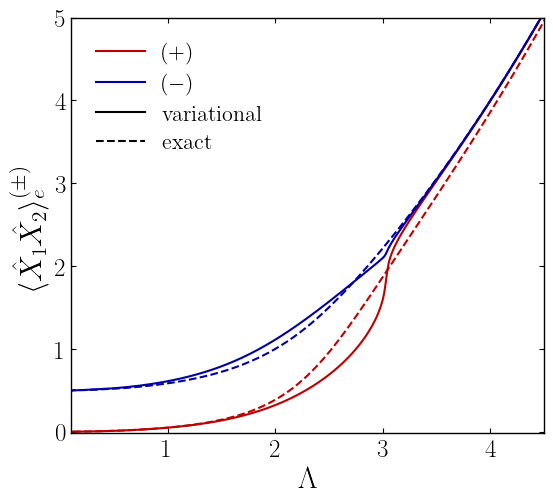

Cut xcorr even (ambas ramas), rho=1.0, cv=1.0


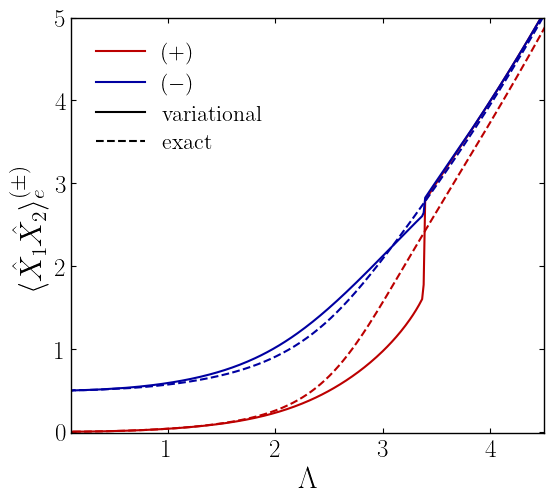

Cut xcorr even (ambas ramas), rho=1.0, cv=1.5


In [9]:
# ══════════════════════════════════════════════════════════════════
# GRAFICACIÓN — CROSS-CORRELATOR del gato <X1X2>
#   (a) heatmap rama +   (b) heatmap rama −   (c) cortes ambas ramas
# ══════════════════════════════════════════════════════════════════

omega0   = 1.0
n_lam    = 300
cv_list  = [0.5, 1.0, 1.5]
rho_list = [1.0]
SECTOR   = 'even'

# directorio principal del gato (coordenadas) + subcarpeta del cross-correlator
root_dir = f"cat_state_variational_params_omega0{omega0:.1f}_nl1_{n_lam}_nl2_{n_lam}"
if not os.path.isdir(root_dir):
    raise FileNotFoundError(
        f"No existe el directorio principal '{root_dir}'. Ejecuta primero el gato.")

def _load_coord(cv, name):
    """Coordenadas: viven directamente en cv_* (guardadas por la celda del gato)."""
    pl = f"{cv:.1f}_omega0{omega0:.1f}_nl1_{n_lam}_nl2_{n_lam}"
    path = os.path.join(root_dir, f"cv_{cv}", f"{name}_{pl}.txt")
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Falta '{path}' (¿ejecutaste la celda del gato?).")
    return np.loadtxt(path)

def _load_xc(cv, name):
    """Cross-correlator: en cv_*/xcorr_{SECTOR}/."""
    pl = f"{cv:.1f}_omega0{omega0:.1f}_nl1_{n_lam}_nl2_{n_lam}"
    path = os.path.join(root_dir, f"cv_{cv}", f"xcorr_{SECTOR}", f"{name}_{pl}.txt")
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Falta '{path}' (¿ejecutaste la celda del cross-correlator?).")
    return np.loadtxt(path)

os.makedirs('Resultados_aniso', exist_ok=True)

lam1_arr = _load_coord(cv_list[0], "coord_lambda1")
lam2_arr = _load_coord(cv_list[0], "coord_lambda2")
extent   = [lam1_arr[0], lam1_arr[-1], lam2_arr[0], lam2_arr[-1]]

xx_ex_p = {cv: _load_xc(cv, "xcorr_exact_plus")  for cv in cv_list}
xx_va_p = {cv: _load_xc(cv, "xcorr_var_plus")    for cv in cv_list}
xx_ex_m = {cv: _load_xc(cv, "xcorr_exact_minus") for cv in cv_list}
xx_va_m = {cv: _load_xc(cv, "xcorr_var_minus")   for cv in cv_list}

# ── (a,b) HEATMAPS por rama (1×3), exactos suavizados ──
def _row_heatmap(data_by_cv, ftag, sigma=0.0):
    vmax = max(np.nanmax(data_by_cv[cv]) for cv in cv_list)
    vmin = min(np.nanmin(data_by_cv[cv]) for cv in cv_list)
    fig, axes = plt.subplots(1, 3, figsize=(14, 5.5))
    for idx, cv in enumerate(cv_list):
        ax = axes[idx]
        data = data_by_cv[cv]
        if sigma and sigma > 0:
            data = gaussian_filter(data, sigma=sigma, mode='nearest')
        im = ax.imshow(data, origin='lower', aspect='equal', extent=extent, cmap='inferno', vmin=vmin, vmax=vmax)
        ax.set_xlabel(r'$\lambda_1$')
        ax.tick_params(axis='x', direction='in', bottom=True, top=True, right=True, left=True, color='white', size=7.5, width=2.0)
        ax.tick_params(axis='y', direction='in', right=True, left=True, color='white', size=7.5, width=2.0, labelleft=(idx == 0))
        if idx == 0:
            ax.set_ylabel(r'$\lambda_2$')
        ax.set_title(rf'$J_\alpha /\omega_0={cv}$', pad=12)
        ax.set_xticks([0.0, 1.0, 2.0, 3.0, 4.0])
    cbar = fig.colorbar(im, ax=axes.ravel().tolist(), fraction=0.046, pad=0.025, shrink=0.6, label=r'$\langle \hat X_1 \hat X_2\rangle$')
    plt.savefig(f'Resultados_aniso/heatmap_xcorr_{SECTOR}_{ftag}.png', bbox_inches='tight', transparent=False, dpi=300)
    plt.show()
    print(f'Heatmap panel: xcorr {SECTOR} {ftag}')

_row_heatmap(xx_ex_p, 'plus')     # rama +
_row_heatmap(xx_va_p, 'plus')     # rama +
_row_heatmap(xx_ex_m, 'minus')    # rama −
_row_heatmap(xx_va_m, 'minus')    # rama −

# ── (c) CORTES radiales: ambas ramas en cada figura (por cv) ──
def _cut(data2d, rho, n_cut=400):
    itp = RegularGridInterpolator((lam2_arr, lam1_arr), data2d, bounds_error=False, fill_value=np.nan)
    l1max = min(lam1_arr[-1], lam2_arr[-1]/rho)
    l1 = np.linspace(max(lam1_arr[0], 0.01), l1max, n_cut)
    l2 = rho*l1
    return np.sqrt(l1**2 + l2**2), itp(np.column_stack([l2, l1]))

C_PLUS  = plt.cm.seismic(0.88)    # rojo  → rama +
C_MINUS = plt.cm.seismic(0.12)    # azul  → rama −
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

for rho in rho_list:
    for cv in cv_list:
        Lc, xe_p = _cut(xx_ex_p[cv], rho)
        _,  xv_p = _cut(xx_va_p[cv], rho)
        _,  xe_m = _cut(xx_ex_m[cv], rho)
        _,  xv_m = _cut(xx_va_m[cv], rho)
        #xe_p = _smooth(xe_p, window=7, poly=3)
        #xe_m = _smooth(xe_m, window=7, poly=3)
        tend = Lc**2 / 4.0                        # asíntota Λ²/4 (= λ²/2)

        fig, ax = plt.subplots(figsize=(6.0, 5.5))
        ax.plot(Lc, xv_p, '-',  color=C_PLUS,  lw=1.5)
        ax.plot(Lc, xe_p, '--', color=C_PLUS,  lw=1.5)
        ax.plot(Lc, xv_m, '-',  color=C_MINUS, lw=1.5)
        ax.plot(Lc, xe_m, '--', color=C_MINUS, lw=1.5)

        ax.set_xlabel(r'$\Lambda$')
        ax.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle_e^{(\pm)}$')
        ax.set_xlim(0.1, 4.5)
        ax.set_ylim(-0.02, 5.0)
        ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)

        leg = [mlines.Line2D([], [], color=C_PLUS,  lw=1.5, label=r'$(+)$'),
               mlines.Line2D([], [], color=C_MINUS, lw=1.5, label=r'$(-)$'),
               mlines.Line2D([], [], color='k', ls='-',  lw=1.5, label='variational'),
               mlines.Line2D([], [], color='k', ls='--', lw=1.5, label='exact')]
        ax.legend(handles=leg, frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, loc='upper left', borderpad=0.6,  handlelength=2.2, labelspacing=0.4)
        plt.tight_layout()
        plt.savefig(f'Resultados_aniso/cut_xcorr_{SECTOR}_rho{rho}_cv{cv}.png', bbox_inches='tight', transparent=False, dpi=300)
        plt.show()
        print(f'Cut xcorr {SECTOR} (ambas ramas), rho={rho}, cv={cv}')

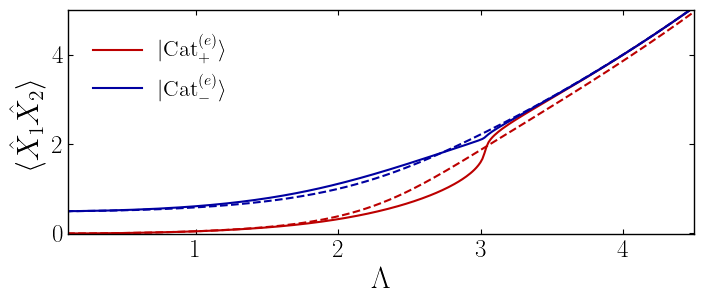

Cut xcorr even (ambas ramas), rho=1.0, cv=1.0


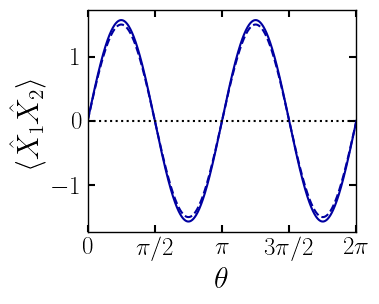

Corte angular 2π, xcorr rama −, Λ=2.5, cv=1.0


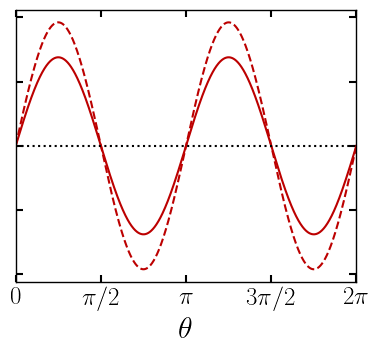

Corte angular 2π, xcorr rama −, Λ=2.5, cv=1.0


In [10]:
# ══════════════════════════════════════════════════════════════════
# CORTE ANGULAR — <X1X2> vs θ ∈ [0,2π] a Λ fijo (rama −)
#   Simetría: <X²> depende solo de Λ (mismo en 4 cuadrantes).
#   El prefactor λ1λ2/Λ² = (1/2)sin2θ da el signo: +(I,III), −(II,IV).
#   Reconstruimos θ∈[0,2π] desde el 1er cuadrante ya calculado.
# ══════════════════════════════════════════════════════════════════
LAM_FIX = 2.5
CV      = 1.0
n_theta = 300

def _angular_cut_q1(data2d, Lam, n_th):
    """Interpola el mapa 2D en el arco de radio Λ, primer cuadrante θ∈[0,π/2]."""
    itp = RegularGridInterpolator((lam2_arr, lam1_arr), data2d, bounds_error=False, fill_value=np.nan)
    th = np.linspace(1e-3, np.pi/2 - 1e-3, n_th)
    lam1 = Lam*np.cos(th); lam2 = Lam*np.sin(th)
    return th, itp(np.column_stack([lam2, lam1]))

C_PLUS  = plt.cm.seismic(0.88)    # rojo  → rama +
C_MINUS = plt.cm.seismic(0.12)    # azul  → rama −
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

for rho in [1.0]:
    for cv in [1.0]:
        Lc, xe_p = _cut(xx_ex_p[cv], rho)
        _,  xv_p = _cut(xx_va_p[cv], rho)
        _,  xe_m = _cut(xx_ex_m[cv], rho)
        _,  xv_m = _cut(xx_va_m[cv], rho)
        #xe_p = _smooth(xe_p, window=7, poly=3)
        #xe_m = _smooth(xe_m, window=7, poly=3)
        tend = Lc**2 / 4.0                        # asíntota Λ²/4 (= λ²/2)

        fig, ax = plt.subplots(figsize=(7.5, 3.5))
        ax.plot(Lc, xv_p, '-',  color=C_PLUS,  lw=1.5)
        ax.plot(Lc, xe_p, '--', color=C_PLUS,  lw=1.5)
        ax.plot(Lc, xv_m, '-',  color=C_MINUS, lw=1.5)
        ax.plot(Lc, xe_m, '--', color=C_MINUS, lw=1.5)

        ax.set_xlabel(r'$\Lambda$')
        ax.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle$')
        ax.set_xlim(0.1, 4.5)
        ax.set_ylim(-0.02, 5.0)
        ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)

        leg = [mlines.Line2D([], [], color=C_PLUS,  lw=1.5, label=r'$|\mathrm{Cat}_{+}^{(e)}\rangle$'),
               mlines.Line2D([], [], color=C_MINUS, lw=1.5, label=r'$|\mathrm{Cat}_{-}^{(e)}\rangle$')]
        ax.legend(handles=leg, frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, loc='upper left', borderpad=0.6,  handlelength=2.2, labelspacing=0.4)
        plt.tight_layout()
        plt.savefig(f'Resultados_aniso/cut_xcorr_{SECTOR}_rho{rho}_cv{cv}.png', bbox_inches='tight', transparent=False, dpi=300)
        plt.show()
        print(f'Cut xcorr {SECTOR} (ambas ramas), rho={rho}, cv={cv}')

# 1) datos del primer cuadrante (rama −), y recuperar <X²>-1/2 quitando el prefactor
th_q1, xe_q1 = _angular_cut_q1(xx_ex_m[CV], LAM_FIX, n_theta)
_,     xv_q1 = _angular_cut_q1(xx_va_m[CV], LAM_FIX, n_theta)
pref_q1 = 0.5*np.sin(2*th_q1)                       # λ1λ2/Λ² en el cuad I
core_ex = xe_q1 / pref_q1                           # = <X²>_ex - 1/2  (independiente de θ)
core_va = xv_q1 / pref_q1                           # = <X²>_var - 1/2

# como <X²> depende solo de Λ, el "core" debería ser ~constante en θ; promediamos
core_ex_val = np.nanmedian(core_ex)
core_va_val = np.nanmedian(core_va)

# 2) reconstruir θ ∈ [0, 2π]: XX(θ) = (1/2)sin(2θ)·core
th_full = np.linspace(0.0, 2*np.pi, 4*n_theta)
pref_full = 0.5*np.sin(2*th_full)
XX_ex = pref_full * core_ex_val
XX_va = pref_full * core_va_val

fig, ax = plt.subplots(figsize=(4.25, 3.5))
ax.plot(th_full, XX_va, '-',  color=C_MINUS, lw=1.5)
ax.plot(th_full, XX_ex, '--', color=C_MINUS, lw=1.5)
ax.axhline(0.0, color='k', ls=':', lw=1.5)
ax.set_xlabel(r'$\theta$')
ax.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle$')
ax.set_xlim(0.0, np.pi)
ax.set_xticks([0, np.pi/2, np.pi, 3*np.pi/2, 2*np.pi])
ax.set_xticklabels([r'$0$', r'$\pi/2$', r'$\pi$', r'$3\pi/2$', r'$2\pi$'])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True, size=5, width=1.5)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, loc='upper right', borderpad=0.6, handlelength=2.2, labelspacing=0.4)

plt.tight_layout()
plt.savefig(f'Resultados_aniso/angular_xcorr_{SECTOR}_minus_2pi_Lam{LAM_FIX}_cv{CV}.png',  bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print(f'Corte angular 2π, xcorr rama −, Λ={LAM_FIX}, cv={CV}')



# 1) datos del primer cuadrante (rama −), y recuperar <X²>-1/2 quitando el prefactor
th_q1, xe_q1 = _angular_cut_q1(xx_ex_p[CV], LAM_FIX, n_theta)
_,     xv_q1 = _angular_cut_q1(xx_va_p[CV], LAM_FIX, n_theta)
pref_q1 = 0.5*np.sin(2*th_q1)                       # λ1λ2/Λ² en el cuad I
core_ex = xe_q1 / pref_q1                           # = <X²>_ex - 1/2  (independiente de θ)
core_va = xv_q1 / pref_q1                           # = <X²>_var - 1/2

# como <X²> depende solo de Λ, el "core" debería ser ~constante en θ; promediamos
core_ex_val = np.nanmedian(core_ex)
core_va_val = np.nanmedian(core_va)

# 2) reconstruir θ ∈ [0, 2π]: XX(θ) = (1/2)sin(2θ)·core
th_full = np.linspace(0.0, 2*np.pi, 4*n_theta)
pref_full = 0.5*np.sin(2*th_full)
XX_ex = pref_full * core_ex_val
XX_va = pref_full * core_va_val

# ── graficar ──
C_EX = plt.cm.seismic(0.12)   # azul  → exacto
C_VA = plt.cm.seismic(0.88)   # rojo  → variacional
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

fig, ax = plt.subplots(figsize=(4.25,4.0))
ax.plot(th_full, XX_va, '-',  color=C_PLUS, lw=1.5)
ax.plot(th_full, XX_ex, '--', color=C_PLUS, lw=1.5)
ax.axhline(0.0, color='k', ls=':', lw=1.5)

ax.set_xlabel(r'$\theta$')
ax.set_xlim(0.0, np.pi)
ax.set_xticks([0, np.pi/2, np.pi, 3*np.pi/2, 2*np.pi])
ax.set_xticklabels([r'$0$', r'$\pi/2$', r'$\pi$', r'$3\pi/2$', r'$2\pi$'])
ax.tick_params(axis='x', direction='in', bottom=True, top=True, left=True, right=True, size=5, width=1.5)
ax.tick_params(axis='y', direction='in',left=True, right=True, size=5, width=1.5, labelleft=False, labelright=False)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, loc='upper right', borderpad=0.6, handlelength=2.2, labelspacing=0.4)

plt.tight_layout()
plt.savefig(f'Resultados_aniso/angular_xcorr_{SECTOR}_minus_2pi_Lam{LAM_FIX}_cv{CV}.png',  bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print(f'Corte angular 2π, xcorr rama −, Λ={LAM_FIX}, cv={CV}')

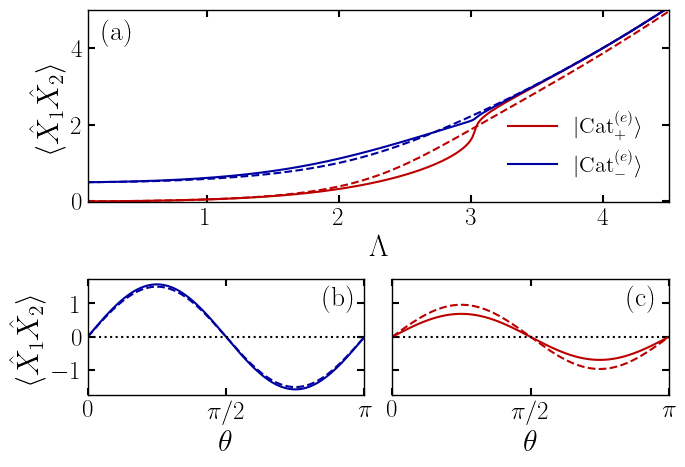

Figura (a) radial + (b) angular rama− + (c) angular rama+, Λ=2.5, cv=1.0


In [49]:
# ══════════════════════════════════════════════════════════════════
#  FIGURA — (a) <X1X2> vs Λ  |  (b) corte angular rama −  |  (c) rama +
#     layout:   (a)
#             (b) | (c)
# ══════════════════════════════════════════════════════════════════
import matplotlib.gridspec as gridspec

LAM_FIX = 2.5
CV      = 1.0
n_theta = 300
rho     = 1.0
cv      = 1.0

C_PLUS  = plt.cm.seismic(0.88)    # rojo  → rama +
C_MINUS = plt.cm.seismic(0.12)    # azul  → rama −
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

# ── datos panel (a): corte radial ──
Lc, xe_p = _cut(xx_ex_p[cv], rho)
_,  xv_p = _cut(xx_va_p[cv], rho)
_,  xe_m = _cut(xx_ex_m[cv], rho)
_,  xv_m = _cut(xx_va_m[cv], rho)

# ── datos panel (b): angular rama − ──
th_q1, xe_q1 = _angular_cut_q1(xx_ex_m[CV], LAM_FIX, n_theta)
_,     xv_q1 = _angular_cut_q1(xx_va_m[CV], LAM_FIX, n_theta)
pref_q1 = 0.5*np.sin(2*th_q1)
core_ex_m = np.nanmedian(xe_q1 / pref_q1)
core_va_m = np.nanmedian(xv_q1 / pref_q1)

th_full   = np.linspace(0.0, 2*np.pi, 4*n_theta)
pref_full = 0.5*np.sin(2*th_full)
XX_ex_m = pref_full * core_ex_m
XX_va_m = pref_full * core_va_m

# ── datos panel (c): angular rama + ──
th_q1, xe_q1 = _angular_cut_q1(xx_ex_p[CV], LAM_FIX, n_theta)
_,     xv_q1 = _angular_cut_q1(xx_va_p[CV], LAM_FIX, n_theta)
core_ex_p = np.nanmedian(xe_q1 / pref_q1)
core_va_p = np.nanmedian(xv_q1 / pref_q1)

XX_ex_p = pref_full * core_ex_p
XX_va_p = pref_full * core_va_p

# ── figura ──
fig = plt.figure(figsize=(7.5, 5.0))
gs  = gridspec.GridSpec(2, 2, figure=fig,
                        height_ratios=[1.0, 0.6],   # ← alto relativo (a) vs (b),(c)
                        width_ratios=[1.0, 1.0],     # ← ancho relativo (b) vs (c)
                        hspace=0.5, wspace=0.1)

# ---------- panel (a): corte radial ----------
ax_a = fig.add_subplot(gs[0, :])
ax_a.plot(Lc, xv_p, '-',  color=C_PLUS,  lw=1.5)
ax_a.plot(Lc, xe_p, '--', color=C_PLUS,  lw=1.5)
ax_a.plot(Lc, xv_m, '-',  color=C_MINUS, lw=1.5)
ax_a.plot(Lc, xe_m, '--', color=C_MINUS, lw=1.5)
ax_a.set_xlabel(r'$\Lambda$')
ax_a.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle$')
ax_a.set_xlim(0.1, 4.5)
ax_a.set_ylim(-0.02, 5.0)
ax_a.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True, size=5, width=1.5)
leg_a = [mlines.Line2D([], [], color=C_PLUS,  lw=1.5, label=r'$|\mathrm{Cat}_{+}^{(e)}\rangle$'),
         mlines.Line2D([], [], color=C_MINUS, lw=1.5, label=r'$|\mathrm{Cat}_{-}^{(e)}\rangle$')]
ax_a.legend(handles=leg_a, frameon=True, edgecolor='black', framealpha=0.0, fancybox=False,
            loc='lower right', borderpad=0.6, handlelength=2.2, labelspacing=0.4)
ax_a.text(0.025, 0.95, r'(a)', transform=ax_a.transAxes, ha='left', va='top', fontsize=20)

# ---------- panel (b): angular rama − ----------
ax_b = fig.add_subplot(gs[1, 0])
ax_b.plot(th_full, XX_va_m, '-',  color=C_MINUS, lw=1.5)
ax_b.plot(th_full, XX_ex_m, '--', color=C_MINUS, lw=1.5)
ax_b.axhline(0.0, color='k', ls=':', lw=1.5)
ax_b.set_xlabel(r'$\theta$')
ax_b.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle$')
ax_b.set_xlim(0.0, np.pi)
ax_b.set_xticks([0, np.pi/2, np.pi])
ax_b.set_xticklabels([r'$0$', r'$\pi/2$', r'$\pi$'])
ax_b.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True,
                 size=5, width=1.5)
ax_b.text(0.85, 0.95, r'(b)', transform=ax_b.transAxes, ha='left', va='top', fontsize=20)

# ---------- panel (c): angular rama + ----------
ax_c = fig.add_subplot(gs[1, 1], sharey=ax_b)
ax_c.plot(th_full, XX_va_p, '-',  color=C_PLUS, lw=1.5)
ax_c.plot(th_full, XX_ex_p, '--', color=C_PLUS, lw=1.5)
ax_c.axhline(0.0, color='k', ls=':', lw=1.5)
ax_c.set_xlabel(r'$\theta$')
ax_c.set_xlim(0.0, np.pi)
ax_c.set_xticks([0, np.pi/2, np.pi])
ax_c.set_xticklabels([r'$0$', r'$\pi/2$', r'$\pi$'])
ax_c.tick_params(axis='x', direction='in', bottom=True, top=True, size=5, width=1.5)
ax_c.tick_params(axis='y', direction='in', left=True, right=True, size=5, width=1.5,
                 labelleft=False, labelright=False)
ax_c.text(0.85, 0.95, r'(c)', transform=ax_c.transAxes, ha='left', va='top', fontsize=20)

plt.savefig(f'paper_figures/xcorr_radial_angular_{SECTOR}_Lam{LAM_FIX}_cv{CV}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print(f'Figura (a) radial + (b) angular rama− + (c) angular rama+, Λ={LAM_FIX}, cv={CV}')

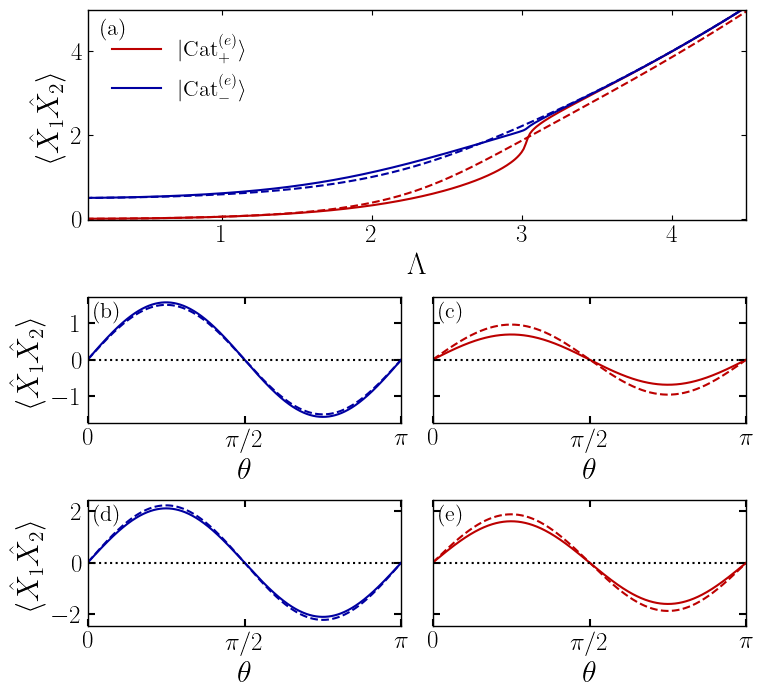

Figura (a) radial + (b,c) angular Λ=2.5 + (d,e) angular Λ=3.0, cv=1.0


In [30]:
# ══════════════════════════════════════════════════════════════════
#  FIGURA — (a) radial | (b),(c) angular Λ=2.5 | (d),(e) angular Λ=3.0
#     layout:   (a)
#             (b) | (c)
#             (d) | (e)
# ══════════════════════════════════════════════════════════════════
import matplotlib.gridspec as gridspec

LAM_1   = 2.5
LAM_2   = 3.0
CV      = 1.0
n_theta = 300
rho     = 1.0
cv      = 1.0

C_PLUS  = plt.cm.seismic(0.88)    # rojo  → rama +
C_MINUS = plt.cm.seismic(0.12)    # azul  → rama −
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

th_full   = np.linspace(0.0, 2*np.pi, 4*n_theta)
pref_full = 0.5*np.sin(2*th_full)

def _angular_branch(data2d, Lam):
    """Reconstruye XX(θ) en [0,2π] desde el 1er cuadrante: XX = (1/2)sin(2θ)·core."""
    th_q1, x_q1 = _angular_cut_q1(data2d, Lam, n_theta)
    core = np.nanmedian(x_q1 / (0.5*np.sin(2*th_q1)))
    return pref_full * core

# ── datos panel (a): corte radial ──
Lc, xe_p = _cut(xx_ex_p[cv], rho)
_,  xv_p = _cut(xx_va_p[cv], rho)
_,  xe_m = _cut(xx_ex_m[cv], rho)
_,  xv_m = _cut(xx_va_m[cv], rho)

# ── datos angulares: (b),(c) a Λ=2.5 ; (d),(e) a Λ=3.0 ──
XX_va_m1 = _angular_branch(xx_va_m[CV], LAM_1); XX_ex_m1 = _angular_branch(xx_ex_m[CV], LAM_1)
XX_va_p1 = _angular_branch(xx_va_p[CV], LAM_1); XX_ex_p1 = _angular_branch(xx_ex_p[CV], LAM_1)
XX_va_m2 = _angular_branch(xx_va_m[CV], LAM_2); XX_ex_m2 = _angular_branch(xx_ex_m[CV], LAM_2)
XX_va_p2 = _angular_branch(xx_va_p[CV], LAM_2); XX_ex_p2 = _angular_branch(xx_ex_p[CV], LAM_2)

# ── figura ──
fig = plt.figure(figsize=(8.5, 8.0))
gs  = gridspec.GridSpec(3, 2, figure=fig,
                        height_ratios=[1.0, 0.6, 0.6],   # ← alto relativo por fila
                        width_ratios=[1.0, 1.0],
                        hspace=0.5, wspace=0.1)

def _fmt_angular(ax, label, show_ylabel):
    ax.axhline(0.0, color='k', ls=':', lw=1.5)
    ax.set_xlabel(r'$\theta$')
    ax.set_xlim(0.0, np.pi)
    ax.set_xticks([0, np.pi/2, np.pi])
    ax.set_xticklabels([r'$0$', r'$\pi/2$', r'$\pi$'])
    ax.tick_params(axis='x', direction='in', bottom=True, top=True, size=5, width=1.5)
    if show_ylabel:
        ax.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle$')
        ax.tick_params(axis='y', direction='in', left=True, right=True, size=5, width=1.5)
    else:
        ax.tick_params(axis='y', direction='in', left=True, right=True, size=5, width=1.5,
                       labelleft=False, labelright=False)
    ax.text(0.02, 0.96, label, transform=ax.transAxes, ha='left', va='top', fontsize=16)

# ---------- (a): corte radial ----------
ax_a = fig.add_subplot(gs[0, :])
ax_a.plot(Lc, xv_p, '-',  color=C_PLUS,  lw=1.5)
ax_a.plot(Lc, xe_p, '--', color=C_PLUS,  lw=1.5)
ax_a.plot(Lc, xv_m, '-',  color=C_MINUS, lw=1.5)
ax_a.plot(Lc, xe_m, '--', color=C_MINUS, lw=1.5)
ax_a.set_xlabel(r'$\Lambda$')
ax_a.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle$')
ax_a.set_xlim(0.1, 4.5)
ax_a.set_ylim(-0.02, 5.0)
ax_a.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)
leg_a = [mlines.Line2D([], [], color=C_PLUS,  lw=1.5, label=r'$|\mathrm{Cat}_{+}^{(e)}\rangle$'),
         mlines.Line2D([], [], color=C_MINUS, lw=1.5, label=r'$|\mathrm{Cat}_{-}^{(e)}\rangle$')]
ax_a.legend(handles=leg_a, frameon=True, edgecolor='black', framealpha=0.0, fancybox=False,
            loc='upper left', borderpad=0.6, handlelength=2.2, labelspacing=0.4)
ax_a.text(0.02, 0.96, r'(a)', transform=ax_a.transAxes, ha='left', va='top', fontsize=16)

# ---------- (b): angular rama −, Λ=2.5 ----------
ax_b = fig.add_subplot(gs[1, 0])
ax_b.plot(th_full, XX_va_m1, '-',  color=C_MINUS, lw=1.5)
ax_b.plot(th_full, XX_ex_m1, '--', color=C_MINUS, lw=1.5)
_fmt_angular(ax_b, r'(b)', show_ylabel=True)

# ---------- (c): angular rama +, Λ=2.5 ----------
ax_c = fig.add_subplot(gs[1, 1], sharey=ax_b)
ax_c.plot(th_full, XX_va_p1, '-',  color=C_PLUS, lw=1.5)
ax_c.plot(th_full, XX_ex_p1, '--', color=C_PLUS, lw=1.5)
_fmt_angular(ax_c, r'(c)', show_ylabel=False)

# ---------- (d): angular rama −, Λ=3.0 ----------
ax_d = fig.add_subplot(gs[2, 0])
ax_d.plot(th_full, XX_va_m2, '-',  color=C_MINUS, lw=1.5)
ax_d.plot(th_full, XX_ex_m2, '--', color=C_MINUS, lw=1.5)
_fmt_angular(ax_d, r'(d)', show_ylabel=True)

# ---------- (e): angular rama +, Λ=3.0 ----------
ax_e = fig.add_subplot(gs[2, 1], sharey=ax_d)
ax_e.plot(th_full, XX_va_p2, '-',  color=C_PLUS, lw=1.5)
ax_e.plot(th_full, XX_ex_p2, '--', color=C_PLUS, lw=1.5)
_fmt_angular(ax_e, r'(e)', show_ylabel=False)

plt.savefig(f'Resultados_aniso/xcorr_radial_angular_{SECTOR}_Lam{LAM_1}_{LAM_2}_cv{CV}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print(f'Figura (a) radial + (b,c) angular Λ={LAM_1} + (d,e) angular Λ={LAM_2}, cv={CV}')

  rho=1.0, cv=0.5: calculando rayo ...


  rho=1.0, cv=1.0: calculando rayo ...
  rho=1.0, cv=1.5: calculando rayo ...


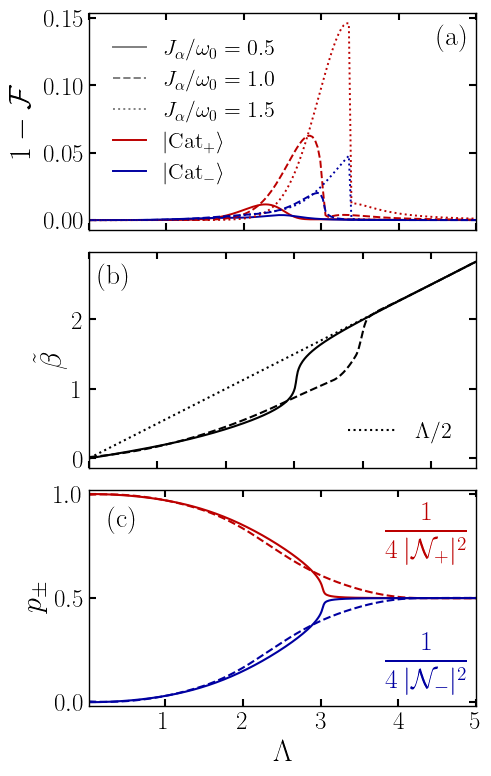

Figura tres paneles (a) 1-F + (b) β̃ + (c) probabilidades, rho=1.0


In [48]:
# ══════════════════════════════════════════════════════════════════
#  FIGURA 3 PANELES — (a) 1-F  |  (b) β̃  |  (c) probabilidades   (cv=1.0 en b,c)
# ══════════════════════════════════════════════════════════════════
import matplotlib.gridspec as gridspec

cv  = 1.0
rho = 1.0

LS      = {0.5: '-', 1.0: '--', 1.5: ':'}
n_Lam   = 150
Lam_max = 5.0

C_PLUS  = plt.cm.seismic(0.88)
C_MINUS = plt.cm.seismic(0.12)
C_VAR   = plt.cm.seismic(0.88)
C_EX    = plt.cm.seismic(0.12)

# ── datos panel (a): infidelidad (todas las cv, como tu figura original) ──
rays = {}
for cv_i in cv_list:
    print(f"  rho={rho}, cv={cv_i}: calculando rayo ...", flush=True)
    rays[cv_i] = _cat_ray(rho, cv_i)

# ── datos panel (b): β̃ ──
Lc, th_v = _cut(theta_var[cv], rho)
_,  th_e = _cut(theta_ex[cv],  rho)
th_e = _smooth(th_e, window=13, poly=3)
th_e = _spline_smooth(Lc, th_e, s_factor=1e-4)

# ── datos panel (c): probabilidades ──
_, pp_e = _cut(p_plus_ex[cv],   rho)
_, pm_e = _cut(p_minus_ex[cv],  rho)
_, pp_v = _cut(p_plus_var[cv],  rho)
_, pm_v = _cut(p_minus_var[cv], rho)
pp_e = _smooth(pp_e, window=15, poly=3)
pp_e = _spline_smooth(Lc, pp_e, s_factor=1e-4)
pm_e = _smooth(pm_e, window=15, poly=3)
pm_e = _spline_smooth(Lc, pm_e, s_factor=1e-4)

# ── figura ──
fig = plt.figure(figsize=(5.0, 9.0))
gs  = gridspec.GridSpec(3, 1, figure=fig, hspace=0.1, height_ratios=[1.0, 1.0, 1.0])  

# ---------- panel (a): infidelidad ----------
ax_a = fig.add_subplot(gs[0, 0])
Lc_ray = None
for cv_i in cv_list:
    ray = rays[cv_i]
    Lc_ray = ray['Lam']
    ax_a.plot(Lc_ray, ray['infid_p'], LS[cv_i], color=C_PLUS,  lw=1.4)
    ax_a.plot(Lc_ray, ray['infid_m'], LS[cv_i], color=C_MINUS, lw=1.4)
ax_a.set_ylabel(r'$1-\mathcal{F}$')
ax_a.set_xlim(Lc_ray[0], Lam_max)
ax_a.set_xticks(np.arange(0, np.floor(Lc_ray[-1]) + 1, 1))
ax_a.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True, size=5, width=1.5)
ax_a.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=False)
handles  = [mlines.Line2D([], [], color='gray', ls=LS[cv_i], lw=1.4, label=rf'$J_\alpha/\omega_0={cv_i}$') for cv_i in cv_list]
handles += [mlines.Line2D([], [], color=C_PLUS,  lw=1.4, label=r'$|\mathrm{Cat}_+\rangle$'), mlines.Line2D([], [], color=C_MINUS, lw=1.4, label=r'$|\mathrm{Cat}_-\rangle$')]
ax_a.legend(handles=handles, loc='upper left', ncol=1, frameon=True,edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=1.5, labelspacing=0.4)
ax_a.text(0.9, 0.95, r'(a)', transform=ax_a.transAxes, ha='left', va='top', fontsize=20)

# ---------- panel (b): β̃ ----------
ax_b = fig.add_subplot(gs[1, 0])
ax_b.plot(Lc, th_v, '-',  color='k', lw=1.5)
ax_b.plot(Lc, th_e, '--', color='k',  lw=1.5)
ax_b.plot(Lc, Lc/2.0, 'k:', lw=1.5, label=r'$\Lambda/2$')
ax_b.set_ylabel(r'$\tilde{\beta}$')
ax_b.set_xlim(0.0, Lc[-1])
ax_b.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True, size=5, width=1.5)
ax_b.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=False)
ax_b.set_xticks(np.arange(0, np.floor(Lc_ray[-1]) + 1, 1))
ax_b.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4, loc='lower right')
ax_b.text(0.025, 0.95, r'(b)', transform=ax_b.transAxes, ha='left', va='top', fontsize=20)

# ---------- panel (c): probabilidades ----------
ax_c = fig.add_subplot(gs[2, 0])
ax_c.plot(Lc, pp_v, '-',  color=C_PLUS,  lw=1.5)
ax_c.plot(Lc, pp_e, '--', color=C_PLUS,  lw=1.5)
ax_c.plot(Lc, pm_v, '-',  color=C_MINUS, lw=1.5)
ax_c.plot(Lc, pm_e, '--', color=C_MINUS, lw=1.5)
ax_c.set_xlabel(r'$\Lambda$')
ax_c.set_ylabel(r'$p_{\pm}$', labelpad=5)
ax_c.set_xlim(Lc[0], 5)
ax_c.set_ylim(-0.02, 1.02)
ax_c.yaxis.set_major_locator(ticker.FixedLocator([0.0, 0.5, 1.0]))
ax_c.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True, size=5, width=1.5)
ax_c.text(0.975, 0.8, r'$\dfrac{1}{4\,|\mathcal{N}_+|^{2}}$', transform=ax_c.transAxes,color=C_PLUS,  ha='right', va='center', fontsize=20)
ax_c.text(0.975, 0.2, r'$\dfrac{1}{4\,|\mathcal{N}_-|^{2}}$', transform=ax_c.transAxes,color=C_MINUS, ha='right', va='center', fontsize=20)
ax_c.text(0.05, 0.925, r'(c)', transform=ax_c.transAxes,ha='left', va='top', fontsize=20)

plt.tight_layout()
plt.savefig(f'paper_figures/infid_beta_prob_threepanel_vertical_rho{rho}_cv{cv}.png', bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print(f'Figura tres paneles (a) 1-F + (b) β̃ + (c) probabilidades, rho={rho}')

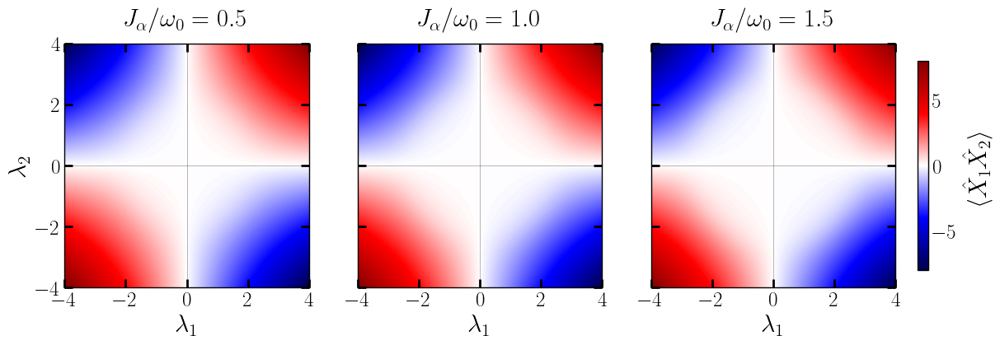

Heatmap 4-cuadrantes: xcorr even exact_plus


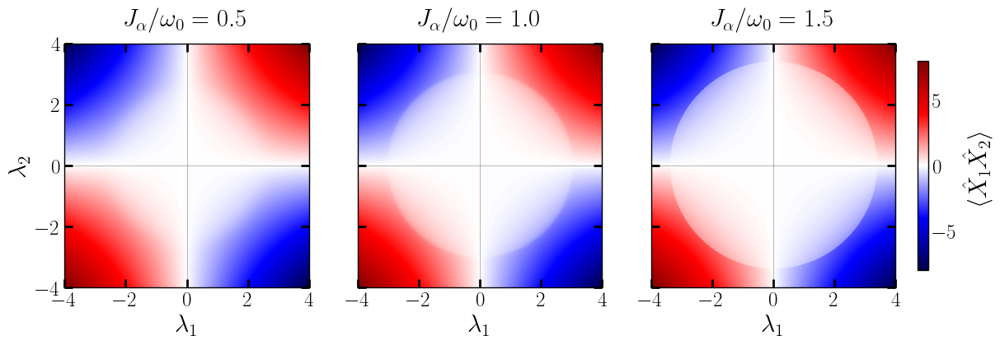

Heatmap 4-cuadrantes: xcorr even var_plus


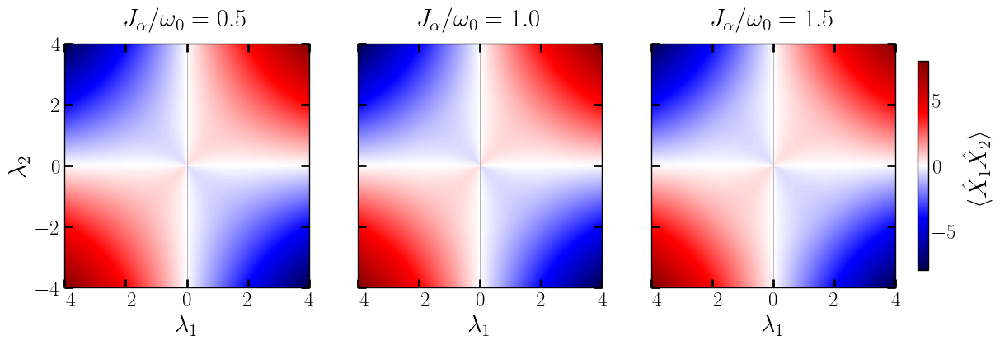

Heatmap 4-cuadrantes: xcorr even exact_minus


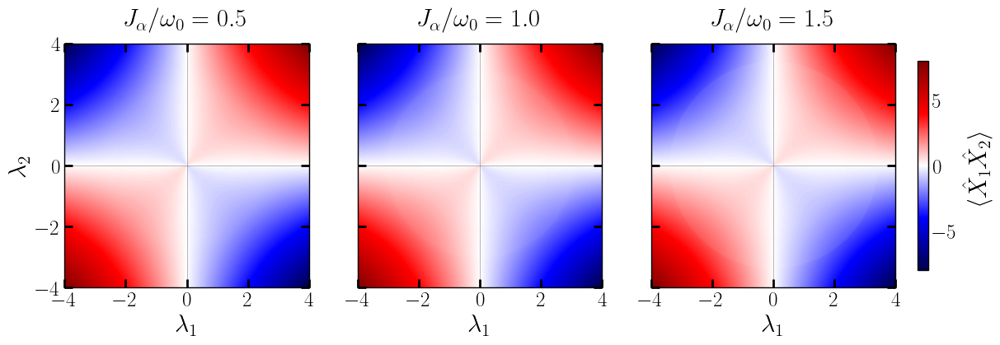

Heatmap 4-cuadrantes: xcorr even var_minus


In [23]:
# ══════════════════════════════════════════════════════════════════
# HEATMAPS <X1X2> en los 4 CUADRANTES (por simetría de reflexión)
#   <X²> depende solo de Λ (igual en 4 cuadrantes);
#   prefactor λ1λ2/Λ² da signo: +(I,III), −(II,IV).
#   Paneles 1×3 (los 3 cv). Colormap divergente centrado en 0.
# ══════════════════════════════════════════════════════════════════

def _mirror_4q(data_q1):
    """Construye el mapa en 4 cuadrantes desde el primer cuadrante.
       data_q1: array [i2=lam2, j1=lam1] con lam1,lam2 >= 0.
       Devuelve (data_full, extent_full)."""
    d = np.asarray(data_q1, float)
    ny, nx = d.shape
    # bloques: signo por cuadrante (I:+, II:−, III:+, IV:−)
    #   eje x: [-lam1_max ... 0 ... +lam1_max]  (columnas)
    #   eje y: [-lam2_max ... 0 ... +lam2_max]  (filas)
    # I  (x>0,y>0): d
    # II (x<0,y>0): -d  reflejado en x (columnas invertidas)
    # III(x<0,y<0): +d  reflejado en x e y
    # IV (x>0,y<0): -d  reflejado en y (filas invertidas)
    Q1 =  d
    Q2 = -d[:, ::-1]
    Q3 =  d[::-1, ::-1]
    Q4 = -d[::-1, :]
    top    = np.hstack([Q2, Q1])   # fila superior (y>0): II | I
    bottom = np.hstack([Q3, Q4])   # fila inferior (y<0): III| IV
    full   = np.vstack([bottom, top])
    ext = [-lam1_arr[-1], lam1_arr[-1], -lam2_arr[-1], lam2_arr[-1]]
    return full, ext

def _row_heatmap_4q(data_by_cv, ftag, sigma=0.0):
    # simetrizar cada cv y escala común centrada en 0
    full = {}; ext = None
    for cv in cv_list:
        full[cv], ext = _mirror_4q(data_by_cv[cv])
    vmax = max(np.nanmax(np.abs(full[cv])) for cv in cv_list)
    vlim = vmax   # simétrico: [-vmax, +vmax]
    fig, axes = plt.subplots(1, 3, figsize=(14, 5.5))
    for idx, cv in enumerate(cv_list):
        ax = axes[idx]
        data = full[cv]
        if sigma and sigma > 0:
            data = gaussian_filter(data, sigma=sigma, mode='nearest')
        im = ax.imshow(data, origin='lower', aspect='equal', extent=ext,
                       cmap='seismic', vmin=-vlim, vmax=vlim)
        ax.set_xlabel(r'$\lambda_1$')
        ax.tick_params(axis='x', direction='in', bottom=True, top=True, right=True, left=True, color='black', size=7.5, width=2.0)
        ax.tick_params(axis='y', direction='in', right=True, left=True, color='black', size=7.5, width=2.0, labelleft=(idx == 0))
        if idx == 0:
            ax.set_ylabel(r'$\lambda_2$')
        ax.set_title(rf'$J_\alpha /\omega_0={cv}$', pad=15)
        ax.set_xticks([-4, -2, 0, 2, 4])
        ax.set_yticks([-4, -2, 0, 2, 4])
        ax.axhline(0, color='k', lw=0.5, alpha=0.4)
        ax.axvline(0, color='k', lw=0.5, alpha=0.4)

    cbar = fig.colorbar(im, ax=axes.ravel().tolist(), fraction=0.046, pad=0.025, shrink=0.6, label=r'$\langle \hat X_1 \hat X_2\rangle$')
    plt.savefig(f'Resultados_aniso/heatmap_xcorr_4q_{SECTOR}_{ftag}.png', bbox_inches='tight', transparent=False, dpi=300)
    plt.show()
    print(f'Heatmap 4-cuadrantes: xcorr {SECTOR} {ftag}')

_row_heatmap_4q(xx_ex_p, 'exact_plus',  sigma=1.0)   # rama + exacto
_row_heatmap_4q(xx_va_p, 'var_plus')                 # rama + variacional
_row_heatmap_4q(xx_ex_m, 'exact_minus', sigma=1.0)   # rama − exacto
_row_heatmap_4q(xx_va_m, 'var_minus')                # rama − variacional

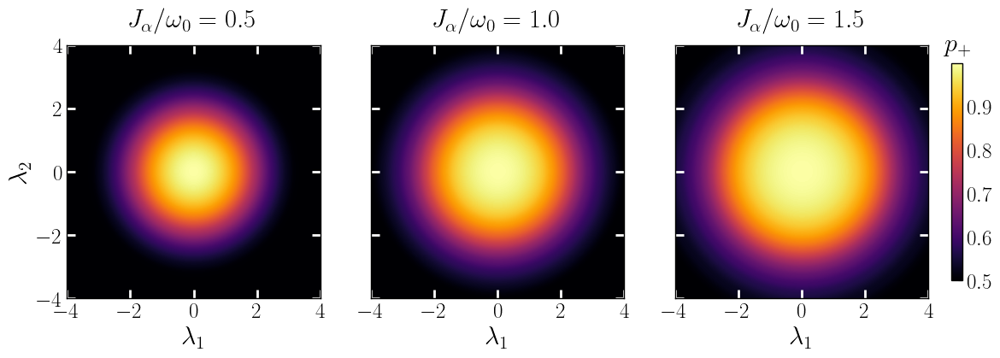

Heatmap 4-cuadrantes: pplus_exact


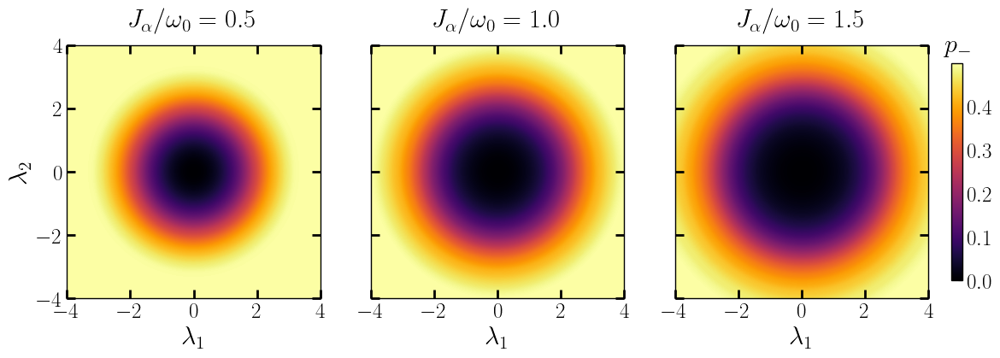

Heatmap 4-cuadrantes: pminus_exact


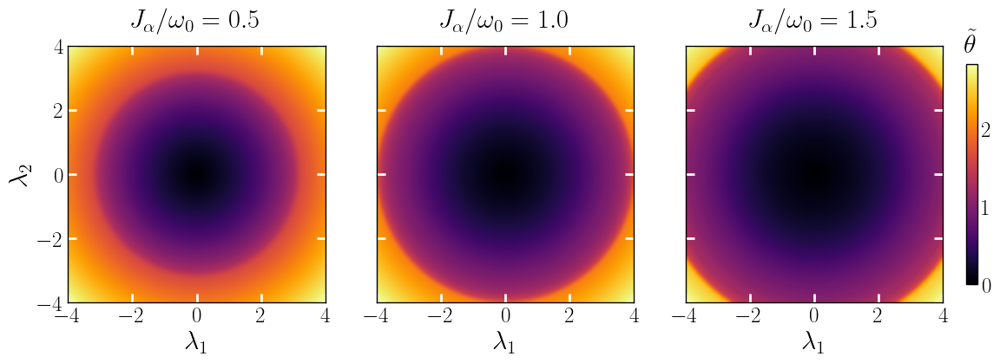

Heatmap 4-cuadrantes: theta_exact


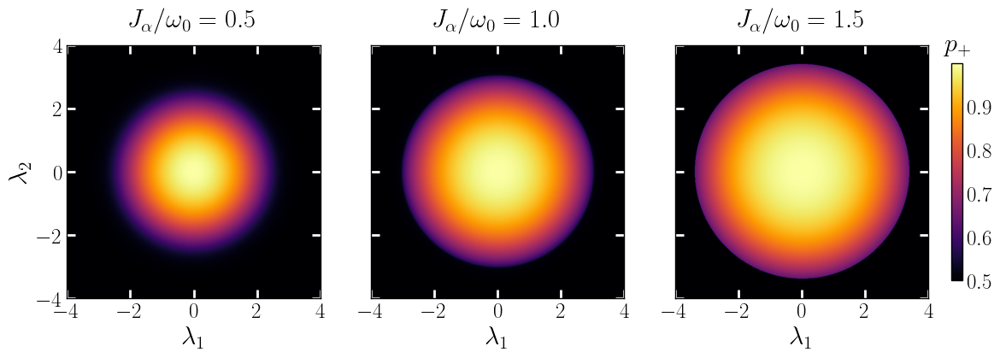

Heatmap 4-cuadrantes: pplus_var


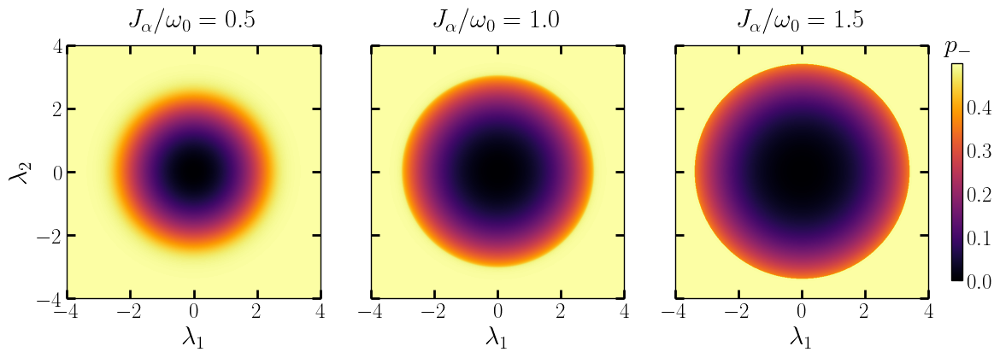

Heatmap 4-cuadrantes: pminus_var


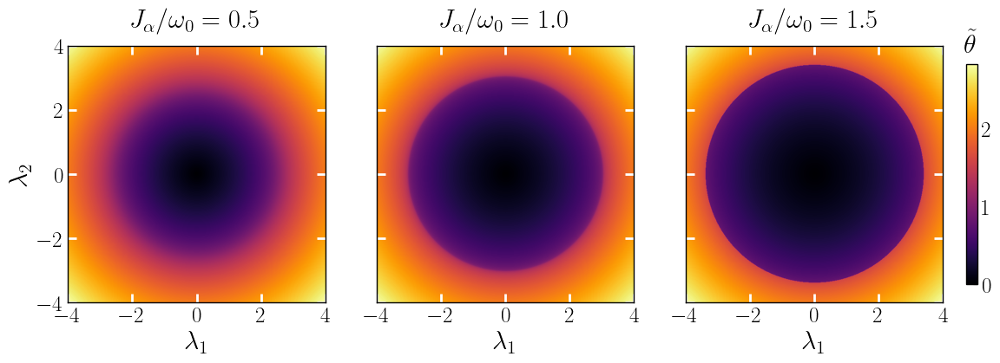

Heatmap 4-cuadrantes: theta_var


In [27]:
# ══════════════════════════════════════════════════════════════════
#  HEATMAPS 4 CUADRANTES — p_±, θ̃ (dependen solo de Λ → sin cambio de signo)
# ══════════════════════════════════════════════════════════════════

def _mirror_4q_even(data_q1):
    """Replica el primer cuadrante a los 4 SIN cambio de signo
       (p±, θ̃ dependen solo de Λ). Devuelve (data_full, extent_full)."""
    d = np.asarray(data_q1, float)
    # I:(x>0,y>0)=d ; II:(x<0,y>0)=reflejo x ; III:(x<0,y<0)=reflejo xy ; IV:(x>0,y<0)=reflejo y
    Q1 = d
    Q2 = d[:, ::-1]
    Q3 = d[::-1, ::-1]
    Q4 = d[::-1, :]
    top    = np.hstack([Q2, Q1])   # y>0: II | I
    bottom = np.hstack([Q3, Q4])   # y<0: III| IV
    full   = np.vstack([bottom, top])
    ext = [-lam1_arr[-1], lam1_arr[-1], -lam2_arr[-1], lam2_arr[-1]]
    return full, ext

def _row_heatmap_4q(data_by_cv, label, ftag, limits=False, col_ticks='white', sigma=0.0):
    full = {}; ext = None
    for cv in cv_list:
        full[cv], ext = _mirror_4q_even(data_by_cv[cv])
    vmax = max(np.nanmax(full[cv]) for cv in cv_list)
    vmin = 0.5 if limits else 0.0
    fig, axes = plt.subplots(1, 3, figsize=(14, 5.5))
    for idx, cv in enumerate(cv_list):
        ax = axes[idx]
        data = full[cv]
        if sigma and sigma > 0:
            data = gaussian_filter(data, sigma=sigma, mode='nearest')
        im = ax.imshow(data, origin='lower', aspect='equal', extent=ext, cmap='inferno', vmin=vmin, vmax=vmax)
        ax.set_xlabel(r'$\lambda_1$')
        ax.tick_params(axis='x', direction='in', bottom=True, top=True, right=True, left=True, color=col_ticks, size=7.5, width=2.0)
        ax.tick_params(axis='y', direction='in', right=True, left=True, color=col_ticks, size=7.5, width=2.0, labelleft=(idx == 0))
        if idx == 0:
            ax.set_ylabel(r'$\lambda_2$')
        ax.set_title(rf'$J_\alpha /\omega_0={cv}$', pad=15)
        ax.set_xticks([-4, -2, 0, 2, 4])
        ax.set_yticks([-4, -2, 0, 2, 4])

    cbar = fig.colorbar(im, ax=axes.ravel().tolist(), fraction=0.046, pad=0.025, shrink=0.6)
    cbar.ax.set_title(label, pad=10)
    plt.savefig(f'Resultados_aniso/heatmap_cat_4q_{ftag}.png', bbox_inches='tight', transparent=False, dpi=300)
    plt.show()
    print(f'Heatmap 4-cuadrantes: {ftag}')

_row_heatmap_4q(p_plus_ex,   r'$p_+$',            'pplus_exact',  True,  sigma=4.0)
_row_heatmap_4q(p_minus_ex,  r'$p_-$',            'pminus_exact', False, col_ticks='black', sigma=4.0)
_row_heatmap_4q(theta_ex,    r'$\tilde{\theta}$', 'theta_exact',  False, sigma=4.0)
_row_heatmap_4q(p_plus_var,  r'$p_+$',            'pplus_var',    True)
_row_heatmap_4q(p_minus_var, r'$p_-$',            'pminus_var',   False, col_ticks='black')
_row_heatmap_4q(theta_var,   r'$\tilde{\theta}$', 'theta_var',    False)

## Wigner Function

### Functions

In [18]:
def disp_matrix_complex(M_ph, alpha):
    """Elementos de matriz <m'|D(alpha)|n> en base de Fock, alpha complejo.
    D(alpha) = exp(alpha a^dag - alpha* a)
    """
    N       = M_ph + 1
    alpha   = complex(alpha)
    alpha_c = np.conj(alpha)
    abs2    = (alpha * alpha_c).real
    gauss   = np.exp(-0.5 * abs2)
    facts   = np.array([float(factorial(k, exact=True)) for k in range(N)])

    D = np.zeros((N, N), dtype=complex)
    for mp in range(N):
        for n in range(N):
            if mp >= n:
                k    = mp - n
                pref = gauss * (alpha**k) * np.sqrt(facts[n] / facts[mp])
                D[mp, n] = pref * eval_genlaguerre(n, k, abs2)
            else:
                k    = n - mp
                pref = gauss * ((-alpha_c)**k) * np.sqrt(facts[mp] / facts[n])
                D[mp, n] = pref * eval_genlaguerre(mp, k, abs2)
    return D


def exact_cat_state(lam1, lam2, evec_ex, M, sign=+1):
    """Estado gato EXACTO (vector Fock, dim M+1), misma construcción
    que dentro de _cat_overlap."""
    Lam = _Lambda(lam1, lam2)
    n1  = M + 1

    phi1 = evec_ex[:n1]
    phi2 = evec_ex[n1:]

    DpL2 = disp_matrix(M, +0.5*Lam)
    DmL2 = disp_matrix(M, -0.5*Lam)

    cat_ex = DpL2 @ phi2 + (-sign) * (DmL2 @ phi1)
    cat_ex /= np.linalg.norm(cat_ex)
    return cat_ex


def wigner_cat(psi, xvec, pvec, verbose=True, n_jobs=-1):
    """W(alpha) = (2/pi) * sum_n (-1)^n |<n| D(-alpha) |psi>|^2
       Vectorizado + paralelo. Usa simetría vertical W(x,-p)=W(x,p)
       (válida para gatos con lóbulos en el eje real): calcula p>=0 y refleja."""
    N = len(psi)

    # ── precomputar lo independiente de alpha ──
    lnf = np.zeros(N); lnf[1:] = np.cumsum(np.log(np.arange(1, N)))
    parity = (-1.0) ** np.arange(N)
    mp_idx = np.arange(N)[:, None]
    n_idx  = np.arange(N)[None, :]
    K       = np.abs(mp_idx - n_idx)
    upper   = mp_idx >= n_idx
    deg     = np.where(upper, n_idx, mp_idx)
    lnmin   = np.minimum(lnf[mp_idx], lnf[n_idx])
    lnmax   = np.maximum(lnf[mp_idx], lnf[n_idx])
    sqrtfac = np.exp(0.5 * (lnmin - lnmax))
    pow_alpha = None  # placeholder

    def _row(p):
        row = np.zeros(len(xvec))
        for ix, x in enumerate(xvec):
            alpha = -(x + 1j*p)
            ac    = np.conj(alpha)
            abs2  = (alpha * ac).real
            gauss = np.exp(-0.5 * abs2)
            L     = eval_genlaguerre(deg, K, abs2)
            phase = np.where(upper, alpha**K, (-ac)**K)
            D     = gauss * phase * sqrtfac * L
            c     = D @ psi
            row[ix] = (2.0/np.pi) * np.sum(parity * np.abs(c)**2)
        return row

    # ── índices de p con p>=0 (mitad a calcular) ──
    pvec = np.asarray(pvec)
    idx_pos = np.where(pvec >= 0.0)[0]      # filas a calcular explícitamente
    p_pos   = pvec[idx_pos]

    # calcular solo la mitad p>=0
    if n_jobs == 1:
        rows_pos = []
        for k, p in enumerate(p_pos):
            rows_pos.append(_row(p))
            if verbose and (k+1) % 10 == 0:
                print(f"   fila {k+1:3d}/{len(p_pos)} (p>=0)  "
                      f"({100.0*(k+1)/len(p_pos):5.1f}%)", flush=True)
        rows_pos = np.array(rows_pos)
    else:
        import joblib
        if verbose:
            print(f"   calculando {len(p_pos)} filas (p>=0) en paralelo ...", flush=True)
        rows_pos = np.array(joblib.Parallel(n_jobs=n_jobs)(
            joblib.delayed(_row)(p) for p in p_pos))
        if verbose:
            print(f"   listo ({len(p_pos)} filas); reflejando a p<0 ...", flush=True)

    # ── ensamblar W completo usando W(x,-p) = W(x,p) ──
    # mapa: para cada p en pvec, buscar su |p| en p_pos
    W = np.zeros((len(pvec), len(xvec)))
    # diccionario valor_p>=0 -> fila calculada
    pos_lookup = {round(pp, 12): rows_pos[k] for k, pp in enumerate(p_pos)}
    for ip, p in enumerate(pvec):
        key = round(abs(p), 12)
        if key in pos_lookup:
            W[ip, :] = pos_lookup[key]
        else:
            # p negativo cuyo |p| no está exacto en la malla: calcular (fallback)
            W[ip, :] = _row(p)
    return W

def wigner_and_cuts_num(psi, xvec, pvec, verbose=True):
    W = wigner_cat(psi, xvec, pvec, verbose=verbose)
    ip0 = np.argmin(np.abs(pvec))
    ix0 = np.argmin(np.abs(xvec))
    cut_p0 = W[ip0, :]
    cut_x0 = W[:, ix0]
    return W, cut_p0, cut_x0


def get_wigner_data_num(states, xvec, pvec):
    """states: lista de vectores de Fock (no Qobj de QuTiP)."""
    Ws, cuts_p0, cuts_x0 = [], [], []
    for psi in states:
        W, cut_p, cut_x = wigner_and_cuts_num(psi, xvec, pvec)
        Ws.append(W)
        cuts_p0.append(cut_p)
        cuts_x0.append(cut_x)
    return Ws, cuts_p0, cuts_x0

def wigner_negativity(W, xvec, pvec):
    """Volumen de negatividad de Kenfack-Zyczkowski:
    delta = 1/2 * (integral |W| d^2alpha - 1) = integral |W_-| d^2alpha
    Requiere que W esté en la convención 2/pi (normalizada a integral=1
    sobre d(Re alpha) d(Im alpha), consistente con wigner_cat)."""
    dx = xvec[1] - xvec[0]
    dp = pvec[1] - pvec[0]

    norm_check = np.trapz(np.trapz(W, xvec, axis=1), pvec)
    delta = 0.5 * (np.trapz(np.trapz(np.abs(W), xvec, axis=1), pvec) - 1.0)

    return delta, norm_check

def plot_wigner_single(W, cut_reim0, cut_re0im, title,
                       xvec, pvec, cmap='RdBu',
                       axis_lim=(-1.5*np.sqrt(2), 1.5*np.sqrt(2)),
                       cut_margin=1.15, figsize=(8.5, 8.5),
                       cbar_shrink=0.4, cbar_x=-0.12, cbar_w=0.04, labeleven=False):
        
    re = xvec        # ya en convención Re(alpha) directa (sin dividir por sqrt(2))
    im = pvec        # ya en convención Im(alpha) directa

    vmax = np.max(np.abs(W))
    norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)

    fig, ax_main = plt.figure(figsize=figsize), None
    ax_main = fig.add_subplot(1, 1, 1)

    # ── mapa central ──────────────────────────────────────────────
    im_h = ax_main.pcolormesh(re, im, W, cmap=cmap, norm=norm, shading='auto')
    ax_main.axhline(0.0, color='k', ls='--', lw=1.5)
    ax_main.axvline(0.0, color='k', ls='--', lw=1.5)
    ax_main.set_xlim(*axis_lim); ax_main.set_ylim(*axis_lim)

    # ── Forzar xticks cada 1 ──────────────────────────────
    ax_main.yaxis.set_major_locator(ticker.MultipleLocator(1))

    if labeleven == True:
        ax_main.yaxis.set_major_locator(ticker.MultipleLocator(2))

    ax_main.set_aspect('equal', adjustable='box')
    ax_main.set_axisbelow(False)

    # ── paneles laterales y colorbar anclados al mapa ─────────────
    divider  = make_axes_locatable(ax_main)
    ax_below = divider.append_axes("bottom", size="30%", pad=0.05, sharex=ax_main)
    ax_right = divider.append_axes("right",  size="30%", pad=0.05, sharey=ax_main)

    ax_main.tick_params(axis='x', labelbottom=False, labeltop=True, direction='in', top=True, bottom=True)
    ax_main.tick_params(axis='y', direction='in', left=True, right=True)
    ax_main.text(0.0, 1.05, r'$\mathrm{Re}(\alpha)$', transform=ax_main.transAxes, ha='left', va='bottom')
    ax_main.text(-0.05, 1.0, r'$\mathrm{Im}(\alpha)$', transform=ax_main.transAxes, ha='right', va='top', rotation=90)

    # ── límite simétrico común de los cortes ──────────────────────
    m = cut_margin * max(np.max(np.abs(cut_reim0)), np.max(np.abs(cut_re0im)))

    # ── corte inferior: W(Re α, Im α = 0)  [eje x invertido] ──────
    ax_below.plot(re, cut_reim0, color='k', lw=1.3)
    ax_below.set_xlim(axis_lim[0], axis_lim[1])
    ax_below.invert_xaxis()
    if np.all(cut_reim0 > 0):       # estrictamente positivo
        ax_below.set_ylim(0.0, m)
    else:                           # hay W < 0  o  W = 0
        ax_below.set_ylim(-m, m)
    ax_below.set_ylabel(r'$W$', rotation=0, labelpad=15, va='center')
    ax_below.tick_params(axis='x', labelbottom=False, direction='in', top=True, right=True)
    ax_below.tick_params(axis='y', direction='in', top=True, right=True)

    # ── corte derecho: W(Re α = 0, Im α) ──────────────────────────
    ax_right.plot(cut_re0im, im, color='k', lw=1.3)
    tol = 1e-3   # umbral para ignorar positividad/negatividad espuria
    has_pos = np.max(cut_re0im) >  tol
    has_neg = np.min(cut_re0im) < -tol

    if has_pos and has_neg:          # cambia de signo
        ax_right.set_xlim(m, -m)
    elif has_pos:                    # esencialmente positivo
        ax_right.set_xlim(m, 0.0)    # invertido: +m (izq) … 0 (der)
    elif has_neg:                    # esencialmente negativo
        ax_right.set_xlim(0.0, -m)   # invertido: 0 (izq) … −m (der)
    else:                            # ~0 en todo el corte
        ax_right.set_xlim(m, -m)
    ax_right.set_xlabel(r'$W$')
    ax_right.tick_params(axis='y', labelleft=False, direction='in', top=True, right=True)
    ax_right.tick_params(axis='x', direction='in', top=True, right=True)

    # ── colorbar como inset del mapa: centrada y con "shrink" ─────
    cax = ax_main.inset_axes([cbar_x, (1 - cbar_shrink)/2, cbar_w, cbar_shrink])
    cbar = fig.colorbar(im_h, cax=cax)
    cax.yaxis.set_ticks_position('left')
    cax.yaxis.set_label_position('left')
    cax.set_title(r'$W$')
    return fig

    fig, axes = plot_wigner_stack_num(
    [W, W_minus],
    [cut_p0, cut_p0_minus],
    [cut_x0, cut_x0_minus],
    xvec=xvec, pvec=pvec,
    axis_lim=(-4.2, 4.2), labeleven=True,
    suptitle=fr'Gato exacto, $\lambda_1={lam1_val}$, $\lambda_2={lam2_val}$',
    savepath='Resultados/Wigner_cat_pm.png'   # o None si no quieres guardar
)
plt.show()

def plot_wigner_stack_num(Ws, cuts_p0, cuts_x0,
                          xvec, pvec, cmap='RdBu',
                          axis_lim=(-4.2, 4.2), ylim=(-2.1, 2.1),
                          data_aspect=0.5, cut_margin=1.15, panel_frac=0.30,
                          tol=1e-3, labeleven=True, figsize=(6.0, 5.5), suptitle=None,
                          savepath=None, fig=None, label_offset=0):
    re = xvec; im = pvec; n = len(Ws)          
    X = axis_lim[1]-axis_lim[0]; Y = ylim[1]-ylim[0]; Fw, Fh = figsize

    vmax = max(np.max(np.abs(W)) for W in Ws)
    norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)

    if fig is None:
        fig = plt.figure(figsize=figsize)

    wm = 0.62; hm = data_aspect*wm*(Fw/Fh)*(Y/X)
    wr = panel_frac*wm - 0.01; hb = panel_frac*hm + 0.01
    padr, padb = 0.01, 0.016
    Lm, Tm     = 0.10, 0.12
    gap_v      = 0.06
    gap_cb, hcb = 0.1, 0.035
    Hg = hm + padb + hb

    axes = []
    for i in range(n):
        y_main = (1.0 - Tm - hm) - i*(Hg + gap_v)
        ax_main  = fig.add_axes([Lm,         y_main,         wm, hm])
        ax_below = fig.add_axes([Lm,         y_main-padb-hb, wm, hb])
        ax_right = fig.add_axes([Lm+wm+padr, y_main,         wr, hm])
        axes.append((ax_main, ax_below, ax_right))

        ax_main.pcolormesh(re, im, Ws[i], cmap=cmap, norm=norm, shading='auto', zorder=0)
        ax_main.axhline(0, color='k', ls='--', lw=1.3, zorder=1)
        ax_main.axvline(0, color='k', ls='--', lw=1.3, zorder=1)
        ax_main.set_xlim(axis_lim[0], axis_lim[1])
        ax_main.set_ylim(*ylim)
        ax_main.yaxis.set_major_locator(ticker.MultipleLocator(2 if labeleven else 1))
        ax_main.tick_params(axis='both', direction='in', length=3.5, top=True, bottom=True, left=True, right=True)
        ax_main.tick_params(axis='x', labelbottom=False, labeltop=(i==0))
        for spine in ax_main.spines.values():
            spine.set_zorder(5)
        ax_main.xaxis.set_tick_params(zorder=5)
        ax_main.yaxis.set_tick_params(zorder=5)
        ax_main.xaxis.set_label_position('top')
        if i == 0:
            ax_main.set_xlabel(r'$\mathrm{Re}(\alpha)$', labelpad=7.5)
        ax_main.set_ylabel(r'$\mathrm{Im}(\alpha)$', labelpad=5)
        ax_main.text(0.015, 0.94, f'({chr(97+label_offset+i)})', transform=ax_main.transAxes,
                     ha='left', va='top', bbox=dict(boxstyle='round,pad=0.12', fc='none', ec='none'))

        m = cut_margin * max(np.max(np.abs(cuts_p0[i])), np.max(np.abs(cuts_x0[i])))

        ax_below.plot(re, cuts_p0[i], 'k', lw=1.2)
        ax_below.set_xlim(axis_lim[1], axis_lim[0])
        lo, hi = _lo_hi(cuts_p0[i], m, tol); ax_below.set_ylim(lo, hi)
        ax_below.set_ylabel(r'$W$', rotation=0, labelpad=14, va='center')
        ax_below.tick_params(axis='x', labelbottom=False, direction='in', top=True, bottom=True, size=3.5)
        ax_below.tick_params(axis='y', direction='in', left=True, right=True, size=3.5)

        ax_right.plot(cuts_x0[i], im, 'k', lw=1.2)
        ax_right.set_ylim(*ylim)
        lo, hi = _lo_hi(cuts_x0[i], m, tol); ax_right.set_xlim(hi, lo)
        ax_right.set_xlabel(r'$W$')
        ax_right.tick_params(axis='y', labelleft=False, direction='in', left=True, right=True, size=3.5, rotation=45)
        ax_right.tick_params(axis='x', direction='in', top=True, bottom=True, size=3.5)

    y_last_below = (1.0 - Tm - hm) - (n-1)*(Hg + gap_v) - padb - hb
    y_cb = y_last_below - gap_cb - hcb
    cax = fig.add_axes([Lm, y_cb, wm, hcb])
    sm = ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    cax.xaxis.set_ticks_position('bottom'); cax.xaxis.set_label_position('bottom')
    cax.text(1.035, 0.5, r'$W$', transform=cax.transAxes, ha='left', va='center')

    if suptitle:
        fig.suptitle(suptitle, y=1.0)

    if savepath:
        fig.savefig(savepath, bbox_inches='tight', transparent=False, dpi=300)

    return fig, axes

def _lo_hi(cut, m, tol):
    hp = np.max(cut) >  tol
    hn = np.min(cut) < -tol
    if hp and hn: return (-m, m)
    if hp:        return (0.0, m)
    if hn:        return (-m, 0.0)
    return (-m, m)



In [19]:
# ══════════════════════════════════════════════════════════════════
#  GATO VARIACIONAL (QuTiP) + negatividad — para comparar con el exacto
# ══════════════════════════════════════════════════════════════════

def coh_squeezed(beta, r, N):
    """|r,β⟩ = D(β) S(r)|0⟩  (qutip ket)."""
    return qt.displace(N, beta) * qt.squeeze(N, r) * qt.basis(N, 0)

def cat_norm(beta, r, sign):
    """N_± = [2(1 ± e^{-2β²e^{2r}})]^{-1/2}."""
    overlap = np.exp(-2.0 * beta**2 * np.exp(2.0*r))
    return 1.0 / np.sqrt(2.0 * (1.0 + sign*overlap))

def cat_state_variational(beta, r, sign, N):
    """|Cat_±⟩ = N_± ( |r,β⟩ ± |r,-β⟩ )  (normalización analítica)."""
    psi = coh_squeezed(beta, r, N) + sign * coh_squeezed(-beta, r, N)
    return cat_norm(beta, r, sign) * psi

In [20]:
def _neg_point(Lam, sign, xvec, pvec, cv_val=1.0):
    """δ y norm_check (∫W) de la Wigner para un Λ y una rama."""
    lam1 = lam2 = Lam / np.sqrt(2.0)
    M = _Mof_Lam(Lam)
    Ee, vec, _ = E_cat_exact(lam1, lam2, cv_val, M=M)

    n1 = M + 1
    phi1 = vec[:n1]; phi2 = vec[n1:]
    DpL2 = disp_matrix(M, +0.5*Lam); DmL2 = disp_matrix(M, -0.5*Lam)
    cat = DpL2 @ phi2 + (-sign) * (DmL2 @ phi1)
    psi = cat / np.linalg.norm(cat)

    W = wigner_cat(psi, xvec, pvec, verbose=False)
    delta, norm_check = wigner_negativity(W, xvec, pvec)
    return delta, norm_check

def _neg_point_variational(Lam, sign, xvec, pvec, N=None, cv_val=1.0):
    """δ y ∫W del gato VARIACIONAL a un Λ (rama sign). Recalcula (α,r) en ρ=1."""
    lam1 = lam2 = Lam / np.sqrt(2.0)
    E, x = _minimize_cat(lam1, lam2, cv_val)      # x = (alpha, r)
    a, r = x[0], x[1]
    theta = 0.5 * (Lam - a)                        # desplazamiento del lóbulo (β)
    if N is None:
        N = _Mof_Lam(Lam)
    psi = cat_state_variational(theta, r, sign, N)
    W = qt.wigner(psi, xvec, pvec)
    return wigner_negativity(W, xvec, pvec)

### Exact cat states Wigner function

In [103]:
# ══════════════════════════════════════════════════════════════════
#  EJECUCIÓN — 1 estado gato exacto + Wigner numérica + gráfica
# ══════════════════════════════════════════════════════════════════

# ── parámetros del punto a evaluar ──
lam1_val = 3.7
lam2_val = 3.7
omega0 = 1.0
cv_val   = 1.0          # s = t (impar) o Δ (par), según qué sector uses
sign_val = +1           # rama del gato: +1 o -1

# ── diagonalización exacta y estado gato ──
Lam = np.sqrt(lam1_val**2 + lam2_val**2)
M   = _Mof_Lam(Lam)

Ee, vec, _ = E_cat_exact(lam1_val, lam2_val, cv_val, M=M)
cat_state  = exact_cat_state(lam1_val, lam2_val, vec, M, sign=sign_val)

# ── grilla en el plano Re(alpha) vs Im(alpha) ──
xvec = np.linspace(-4.2, 4.2, 601)
pvec = np.linspace(-4.2, 4.2, 601)

# ── Wigner numérica + cortes ──
W, cut_p0, cut_x0 = wigner_and_cuts_num(cat_state, xvec=xvec, pvec=pvec, verbose=True)


   calculando 301 filas (p>=0) en paralelo ...
   listo (301 filas); reflejando a p<0 ...


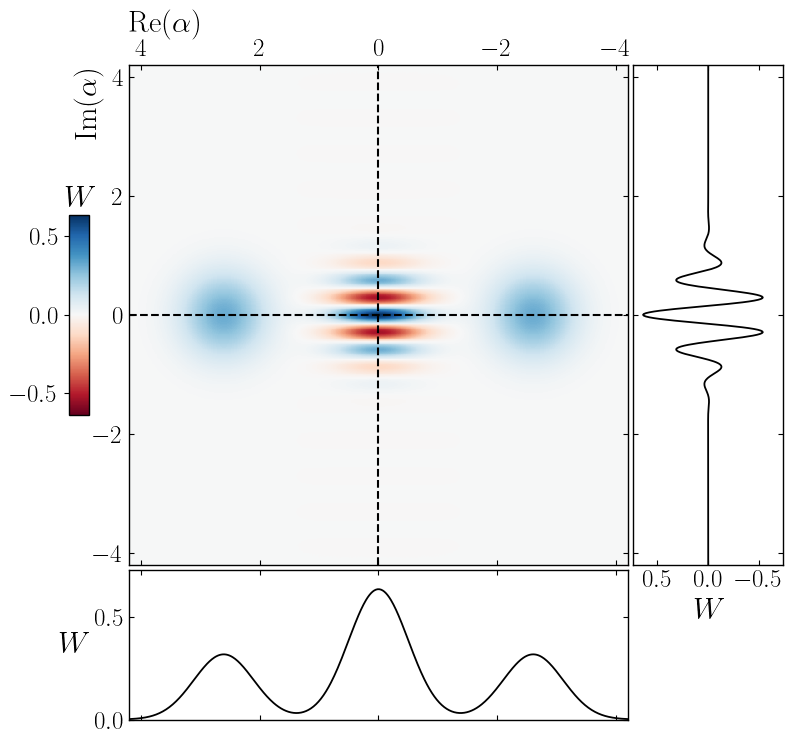

In [106]:
# ── gráfica ──
fig = plot_wigner_single(
    W, cut_p0, cut_x0,
    title=fr'Gato exacto, $\lambda_1={lam1_val}$, $\lambda_2={lam2_val}$, sign={sign_val:+d}',
    xvec=xvec, pvec=pvec,
    axis_lim=(-4.2, 4.2), labeleven=True
)

plt.show()



In [107]:
delta, norm_check = wigner_negativity(W, xvec, pvec)
print(f"Volumen de negatividad δ = {delta:.4f}")
print(f"Chequeo normalización ∫W = {norm_check:.4f} ")

Volumen de negatividad δ = 0.3128
Chequeo normalización ∫W = 0.9993 


In [ ]:
# ── parámetros del punto a evaluar ──
lam1_val = 3.0
lam2_val = 3.0
omega0 = 1.0
cv_val   = 1.0          # s = t (impar) o Δ (par), según qué sector uses
sign_val = -1           # rama del gato: +1 o -1

# ── diagonalización exacta y estado gato ──
Lam = np.sqrt(lam1_val**2 + lam2_val**2)
M   = _Mof_Lam(Lam)

Ee, vec, _ = E_cat_exact(lam1_val, lam2_val, cv_val, M=M)
cat_state  = exact_cat_state(lam1_val, lam2_val, vec, M, sign=sign_val)

# ── grilla en el plano Re(alpha) vs Im(alpha) ──
xvec = np.linspace(-4.2, 4.2, 201)
pvec = np.linspace(-2.2, 2.2, 101)

# ── Wigner numérica + cortes ──
W_minus, cut_p0_minus, cut_x0_minus = wigner_and_cuts_num(cat_state, xvec=xvec, pvec=pvec, verbose=True)

   calculando 151 filas (p>=0) en paralelo ...
   listo (151 filas); reflejando a p<0 ...


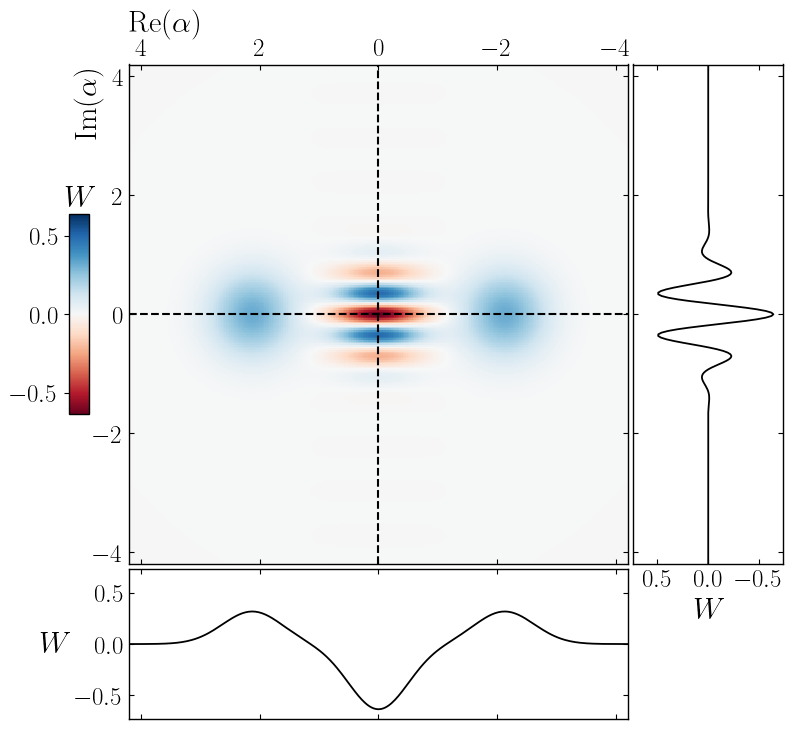

In [92]:
# ── gráfica ──
fig = plot_wigner_single(
    W_minus, cut_p0_minus, cut_x0_minus,
    title=fr'Gato exacto, $\lambda_1={lam1_val}$, $\lambda_2={lam2_val}$, sign={sign_val:+d}',
    xvec=xvec, pvec=pvec,
    axis_lim=(-4.2, 4.2), labeleven=True
)

plt.show()

In [93]:
delta, norm_check = wigner_negativity(W_minus, xvec, pvec)
print(f"Volumen de negatividad δ = {delta:.4f}")
print(f"Chequeo normalización ∫W = {norm_check:.4f} ")

Volumen de negatividad δ = 0.3009
Chequeo normalización ∫W = 1.0000 


In [95]:
# ── parámetros del punto a evaluar ──
lam1_val = 1.0
lam2_val = 1.0
omega0 = 1.0
cv_val   = 1.0          # s = t (impar) o Δ (par), según qué sector uses
sign_val = -1           # rama del gato: +1 o -1

# ── diagonalización exacta y estado gato ──
Lam = np.sqrt(lam1_val**2 + lam2_val**2)
M   = _Mof_Lam(Lam)

Ee, vec, _ = E_cat_exact(lam1_val, lam2_val, cv_val, M=M)
cat_state  = exact_cat_state(lam1_val, lam2_val, vec, M, sign=sign_val)

# ── grilla en el plano Re(alpha) vs Im(alpha) ──
xvec = np.linspace(-2.2, 2.2, 301)
pvec = np.linspace(-2.2, 2.2, 301)

# ── Wigner numérica + cortes ──
W, cut_p0, cut_x0 = wigner_and_cuts_num(cat_state, xvec=xvec, pvec=pvec, verbose=True)

   calculando 151 filas (p>=0) en paralelo ...


   listo (151 filas); reflejando a p<0 ...


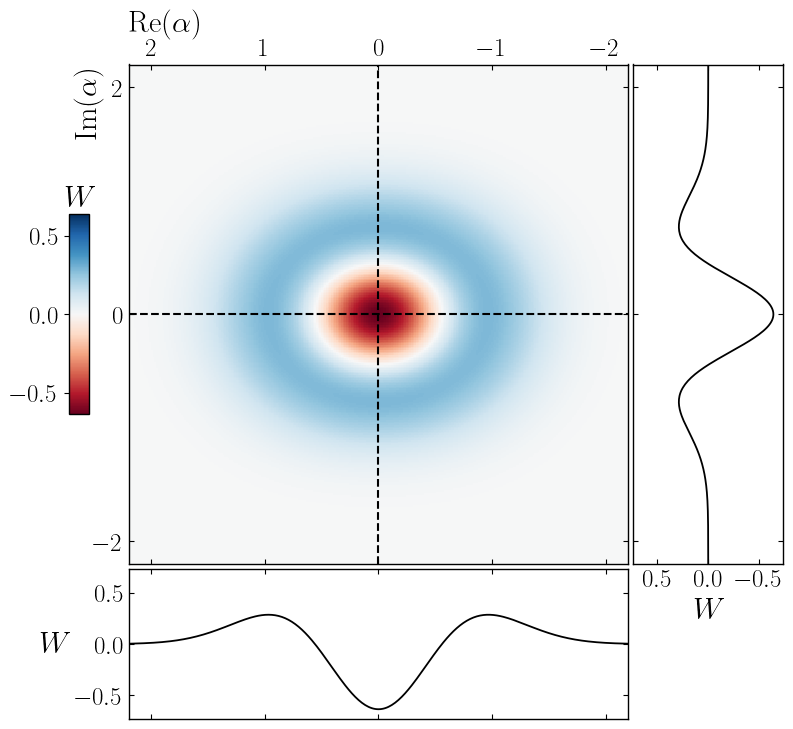

In [96]:
# ── gráfica ──
fig = plot_wigner_single(
    W, cut_p0, cut_x0,
    title=fr'Gato exacto, $\lambda_1={lam1_val}$, $\lambda_2={lam2_val}$, sign={sign_val:+d}',
    xvec=xvec, pvec=pvec,
    axis_lim=(-2.2, 2.2), labeleven=True
)

plt.show()



In [97]:
delta, norm_check = wigner_negativity(W, xvec, pvec)
print(f"Volumen de negatividad δ = {delta:.4f}")
print(f"Chequeo normalización ∫W = {norm_check:.4f} ")

Volumen de negatividad δ = 0.2124
Chequeo normalización ∫W = 0.9987 


In [98]:
# ── parámetros del punto a evaluar ──
lam1_val = 2.0
lam2_val = 2.0
omega0 = 1.0
cv_val   = 1.0          # s = t (impar) o Δ (par), según qué sector uses
sign_val = 1           # rama del gato: +1 o -1

# ── diagonalización exacta y estado gato ──
Lam = np.sqrt(lam1_val**2 + lam2_val**2)
M   = _Mof_Lam(Lam)

Ee, vec, _ = E_cat_exact(lam1_val, lam2_val, cv_val, M=M)
cat_state  = exact_cat_state(lam1_val, lam2_val, vec, M, sign=sign_val)

# ── grilla en el plano Re(alpha) vs Im(alpha) ──
xvec = np.linspace(-2.2, 2.2, 301)
pvec = np.linspace(-2.2, 2.2, 301)

# ── Wigner numérica + cortes ──
W, cut_p0, cut_x0 = wigner_and_cuts_num(cat_state, xvec=xvec, pvec=pvec, verbose=True)

   calculando 151 filas (p>=0) en paralelo ...
   listo (151 filas); reflejando a p<0 ...


In [64]:
delta, norm_check = wigner_negativity(W, xvec, pvec)
print(f"Volumen de negatividad δ = {delta:.4f}")
print(f"Chequeo normalización ∫W = {norm_check:.4f} ")


Volumen de negatividad δ = 0.1445
Chequeo normalización ∫W = 0.9639 


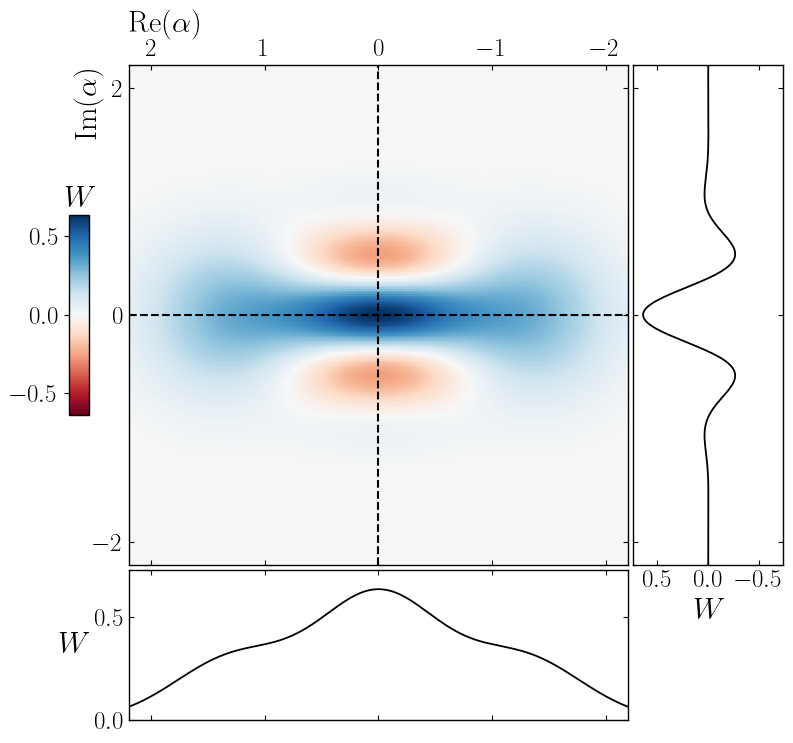

In [99]:
# ── gráfica ──
fig = plot_wigner_single(
    W, cut_p0, cut_x0,
    title=fr'Gato exacto, $\lambda_1={lam1_val}$, $\lambda_2={lam2_val}$, sign={sign_val:+d}',
    xvec=xvec, pvec=pvec,
    axis_lim=(-2.2, 2.2), labeleven=True
)

plt.show()

In [119]:
# ── parámetros del punto a evaluar ──
lam1_val = 2.0
lam2_val = 2.0
omega0 = 1.0
cv_val   = 1.0          # s = t (impar) o Δ (par), según qué sector uses
sign_val = -1           # rama del gato: +1 o -1

# ── diagonalización exacta y estado gato ──
Lam = np.sqrt(lam1_val**2 + lam2_val**2)
M   = _Mof_Lam(Lam)

Ee, vec, _ = E_cat_exact(lam1_val, lam2_val, cv_val, M=M)
cat_state  = exact_cat_state(lam1_val, lam2_val, vec, M, sign=sign_val)

# ── grilla en el plano Re(alpha) vs Im(alpha) ──
xvec = np.linspace(-2.2, 2.2, 201)
pvec = np.linspace(-2.2, 2.2, 201)

# ── Wigner numérica + cortes ──
W, cut_p0, cut_x0 = wigner_and_cuts_num(cat_state, xvec=xvec, pvec=pvec, verbose=True)

   calculando 101 filas (p>=0) en paralelo ...


   listo (101 filas); reflejando a p<0 ...


In [120]:
delta, norm_check = wigner_negativity(W, xvec, pvec)
print(f"Volumen de negatividad δ = {delta:.4f}")
print(f"Chequeo normalización ∫W = {norm_check:.4f} ")

Volumen de negatividad δ = 0.2162
Chequeo normalización ∫W = 0.9473 


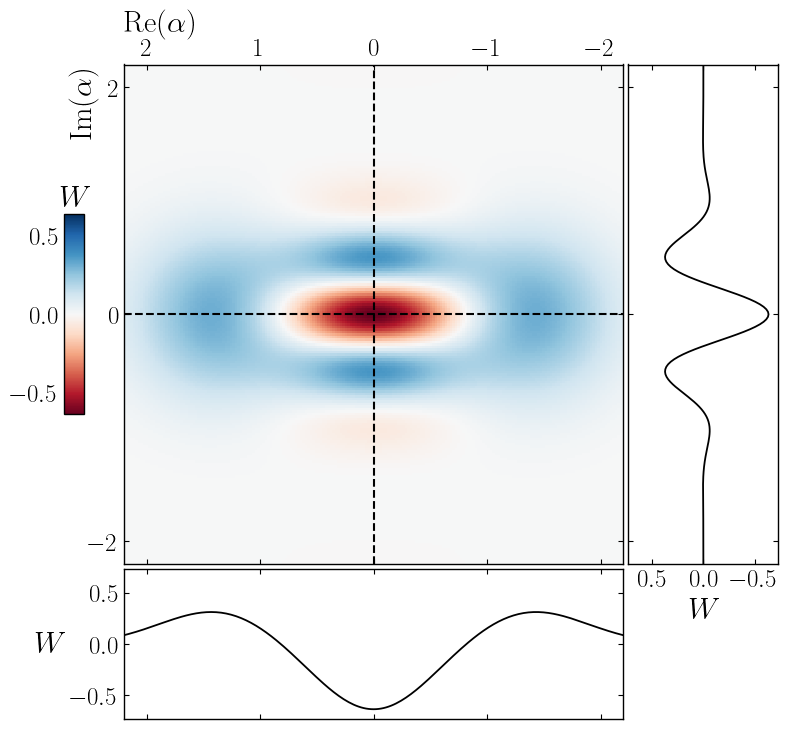

In [121]:
# ── gráfica ──
fig = plot_wigner_single(
    W, cut_p0, cut_x0,
    title=fr'Gato exacto, $\lambda_1={lam1_val}$, $\lambda_2={lam2_val}$, sign={sign_val:+d}',
    xvec=xvec, pvec=pvec,
    axis_lim=(-2.2, 2.2), labeleven=True
)

plt.show()

In [ ]:
# ══════════════════════════════════════════════════════════════════
#  EJECUCIÓN — curva de negatividad δ(Λ) para ambas ramas (ρ=1)
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
cv_val   = 1.0
nLam     = 200
Lam_arr  = np.linspace(0.01, 7.0, nLam)

# malla de Wigner 
xvec = np.linspace(-5.0, 5.0, 301)
pvec = np.linspace(-2.2, 2.2, 301)

delta_p = np.full(nLam, np.nan); norm_p = np.full(nLam, np.nan)
delta_m = np.full(nLam, np.nan); norm_m = np.full(nLam, np.nan)

_step10 = max(1, nLam // 10)
for k, Lam in enumerate(Lam_arr):
    delta_p[k], norm_p[k] = _neg_point(Lam, +1, xvec, pvec, cv_val=cv_val)
    delta_m[k], norm_m[k] = _neg_point(Lam, -1, xvec, pvec, cv_val=cv_val)
    if (k+1) % _step10 == 0 or (k+1) == nLam:
        print(f"  {100.0*(k+1)/nLam:5.1f}%  Λ={Lam:5.3f}  "
              f"δ(+)={delta_p[k]:.4f} (∫W={norm_p[k]:.3f}) | "
              f"δ(-)={delta_m[k]:.4f} (∫W={norm_m[k]:.3f})", flush=True)

print("Barrido de negatividad listo.")

os.makedirs('Resultados_aniso', exist_ok=True)
_out = np.column_stack([Lam_arr, delta_p, delta_m, norm_p, norm_m])
np.savetxt('Resultados_aniso/negativity_vs_Lambda.txt', _out, fmt='%.8e',  header='Lambda  delta_plus  delta_minus  norm_plus  norm_minus')
print('Guardado: Resultados_aniso/negativity_vs_Lambda.txt')

   10.0%  Λ=0.677  δ(+)=0.0000 (∫W=1.000) | δ(-)=0.2131 (∫W=1.000)
   20.0%  Λ=1.380  δ(+)=0.0001 (∫W=1.000) | δ(-)=0.2133 (∫W=1.001)
   30.0%  Λ=2.082  δ(+)=0.0210 (∫W=1.001) | δ(-)=0.2156 (∫W=1.002)
   40.0%  Λ=2.785  δ(+)=0.1536 (∫W=0.999) | δ(-)=0.2407 (∫W=0.999)
   50.0%  Λ=3.487  δ(+)=0.2585 (∫W=1.000) | δ(-)=0.2770 (∫W=1.000)
   60.0%  Λ=4.190  δ(+)=0.2956 (∫W=1.000) | δ(-)=0.2996 (∫W=1.000)
   70.0%  Λ=4.892  δ(+)=0.3097 (∫W=1.000) | δ(-)=0.3108 (∫W=1.000)
   80.0%  Λ=5.595  δ(+)=0.3153 (∫W=1.000) | δ(-)=0.3156 (∫W=1.000)


KeyboardInterrupt: 

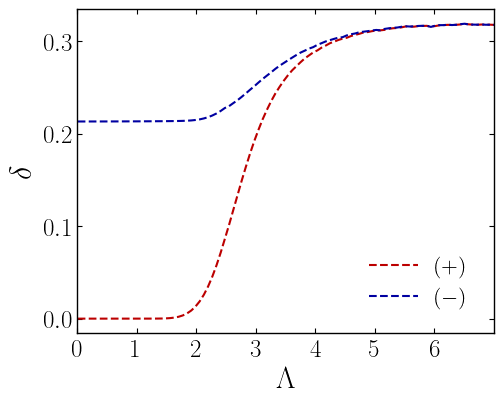

Curva de negatividad guardada.


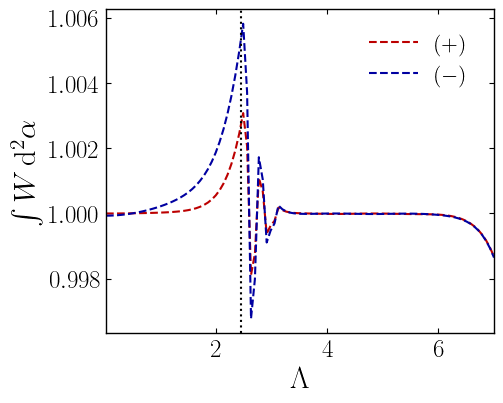

Diagnóstico de normalización guardado.


In [ ]:
# ══════════════════════════════════════════════════════════════════
#  NEGATIVIDAD δ(Λ) — ambas ramas
# ══════════════════════════════════════════════════════════════════
C_PLUS  = plt.cm.seismic(0.88)
C_MINUS = plt.cm.seismic(0.12)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'


fig, ax = plt.subplots(figsize=(5.5, 4.5))
ax.plot(Lam_arr, delta_p, '--', color=C_PLUS,  lw=1.5, ms=3, label=r'$(+)$')
ax.plot(Lam_arr, delta_m, '--', color=C_MINUS, lw=1.5, ms=3, label=r'$(-)$')
ax.set_xlabel(r'$\Lambda$')
ax.set_ylabel(r'$\delta$')
ax.set_xlim(Lam_arr[0], Lam_arr[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)
ax.set_xticks(np.arange(0, 7, 1))
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, loc='lower right', borderpad=0.6, handlelength=2.2, labelspacing=0.4)
plt.tight_layout()
plt.savefig('Resultados_aniso/negativity_vs_Lambda.png', bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Curva de negatividad guardada.')

# ══════════════════════════════════════════════════════════════════
#  DIAGNÓSTICO — normalización ∫W dα (debe ser 1 en todo Λ)
# ══════════════════════════════════════════════════════════════════
fig, ax = plt.subplots(figsize=(5.5, 4.5))
ax.plot(Lam_arr, norm_p, '--', color=C_PLUS,  lw=1.5, ms=3, label=r'$(+)$')
ax.plot(Lam_arr, norm_m, '--', color=C_MINUS, lw=1.5, ms=3, label=r'$(-)$')
ax.axvline(2.45, color='k', ls=':', lw=1.5)
ax.set_xlabel(r'$\Lambda$')
ax.set_ylabel(r'$\int W\,\mathrm{d}^2\alpha$')
ax.set_xlim(Lam_arr[0], Lam_arr[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, loc='best', borderpad=0.6, handlelength=2.2, labelspacing=0.4)
plt.tight_layout()
plt.savefig('Resultados_aniso/diag_norm_check.png', bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Diagnóstico de normalización guardado.')

### Variational cat states Wigner function

In [ ]:
# ══════════════════════════════════════════════════════════════════
#  EJECUCIÓN — negatividad VARIACIONAL δ(Λ), ambas ramas (ρ=1)
#    Recalcula α, r con _minimize_cat en cada Λ ∈ [0.01, 8.0]
# ══════════════════════════════════════════════════════════════════
omega0  = 1.0
cv_val  = 1.0
nLam     = 300
Lam_arr  = np.linspace(0.01, 7.0, nLam)

# malla de Wigner 
xvec = np.linspace(-9.0, 9.0, 601)
pvec = np.linspace(-3.0, 3.0, 301)

delta_p_v = np.full(nLam, np.nan); norm_p_v = np.full(nLam, np.nan)
delta_m_v = np.full(nLam, np.nan); norm_m_v = np.full(nLam, np.nan)


_step10 = max(1, nLam // 10)
for k, Lam in enumerate(Lam_arr):
    delta_p_v[k], norm_p_v[k] = _neg_point_variational(Lam, +1, xvec, pvec, cv_val=cv_val)
    delta_m_v[k], norm_m_v[k] = _neg_point_variational(Lam, -1, xvec, pvec)
    if (k+1) % _step10 == 0 or (k+1) == nLam:
        print(f"  {100.0*(k+1)/nLam:5.1f}%  Λ={Lam:5.3f}  "
              f"δ_v(+)={delta_p_v[k]:.4f} (∫W={norm_p_v[k]:.3f}) | "
              f"δ_v(-)={delta_m_v[k]:.4f} (∫W={norm_m_v[k]:.3f})", flush=True)

print("Barrido variacional listo.")

os.makedirs('Resultados_aniso', exist_ok=True)
_out = np.column_stack([Lam_arr, delta_p_v, delta_m_v, norm_p_v, norm_m_v])
np.savetxt('Resultados_aniso/negativity_variational_vs_Lambda.txt', _out, fmt='%.8e', header='Lambda  delta_plus_var  delta_minus_var  norm_plus_var  norm_minus_var')
print('Guardado: negativity_variational_vs_Lambda.txt')

KeyboardInterrupt: 

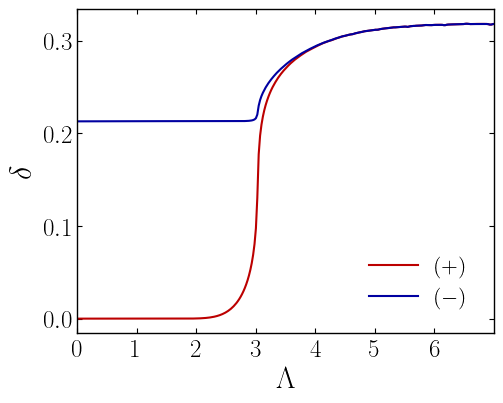

Curva de negatividad variacional guardada.


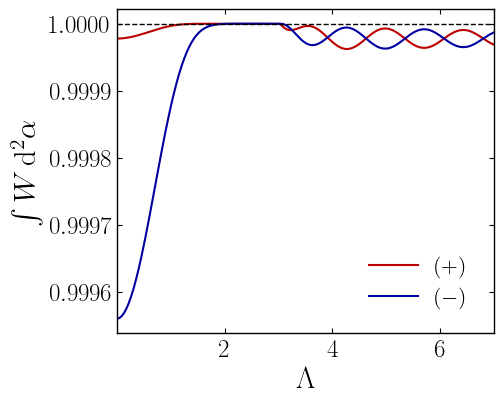

Diagnóstico de normalización variacional guardado.


In [ ]:
# ══════════════════════════════════════════════════════════════════
#  NEGATIVIDAD VARIACIONAL δ(Λ) — ambas ramas
# ══════════════════════════════════════════════════════════════════
C_PLUS  = plt.cm.seismic(0.88)
C_MINUS = plt.cm.seismic(0.12)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

fig, ax = plt.subplots(figsize=(5.5, 4.5))
ax.plot(Lam_arr, delta_p_v, '-', color=C_PLUS,  lw=1.5, ms=3, label=r'$(+)$')
ax.plot(Lam_arr, delta_m_v, '-', color=C_MINUS, lw=1.5, ms=3, label=r'$(-)$')
ax.set_xlabel(r'$\Lambda$')
ax.set_ylabel(r'$\delta$')
ax.set_xlim(Lam_arr[0], 7.0)
ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)
ax.set_xticks(np.arange(0, 7, 1))
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, loc='lower right', borderpad=0.6, handlelength=2.2, labelspacing=0.4)
plt.tight_layout()
plt.savefig('Resultados_aniso/negativity_variational_vs_Lambda.png', bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Curva de negatividad variacional guardada.')

# ══════════════════════════════════════════════════════════════════
#  DIAGNÓSTICO VARIACIONAL — normalización ∫W dα (debe ser 1)
# ══════════════════════════════════════════════════════════════════
fig, ax = plt.subplots(figsize=(5.5, 4.5))
ax.plot(Lam_arr, norm_p_v, '-', color=C_PLUS,  lw=1.5, ms=3, label=r'$(+)$')
ax.plot(Lam_arr, norm_m_v, '-', color=C_MINUS, lw=1.5, ms=3, label=r'$(-)$')
ax.axhline(1.0, color='k', ls='--', lw=1.0)
ax.set_xlabel(r'$\Lambda$')
ax.set_ylabel(r'$\int W\,\mathrm{d}^2\alpha$')
ax.set_xlim(Lam_arr[0], 7.0)
ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, loc='best', borderpad=0.6, handlelength=2.2, labelspacing=0.4)
plt.tight_layout()
plt.savefig('Resultados_aniso/diag_norm_check_variational.png', bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Diagnóstico de normalización variacional guardado.')

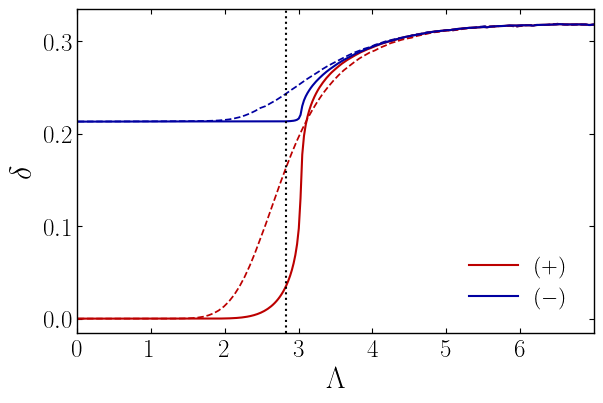

Comparación negatividad exacto vs variacional guardada.


In [67]:
# ══════════════════════════════════════════════════════════════════
#  NEGATIVIDAD δ(Λ) — exacto (dashed) vs variacional (solid), ambas ramas
# ══════════════════════════════════════════════════════════════════
# cargar los dos archivos
_ex = np.loadtxt('Resultados_aniso/negativity_vs_Lambda.txt')
_va = np.loadtxt('Resultados_aniso/negativity_variational_vs_Lambda.txt')

Lam_ex, dp_ex, dm_ex = _ex[:, 0], _ex[:, 1], _ex[:, 2]
Lam_va, dp_va, dm_va = _va[:, 0], _va[:, 1], _va[:, 2]

C_PLUS  = plt.cm.seismic(0.88)   # rojo  → rama +
C_MINUS = plt.cm.seismic(0.12)   # azul  → rama −
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

fig, ax = plt.subplots(figsize=(6.5, 4.5))

# variacional: línea sólida
# exacto: línea dashed
ax.plot(Lam_ex, dp_ex, '--', color=C_PLUS,  lw=1.25)
ax.plot(Lam_ex, dm_ex, '--', color=C_MINUS, lw=1.25)
ax.plot(Lam_va, dp_va, '-', color=C_PLUS,  lw=1.5)
ax.plot(Lam_va, dm_va, '-', color=C_MINUS, lw=1.5)
ax.axvline(2*np.sqrt(2), color='k', ls=':', lw=1.5)

ax.set_xlabel(r'$\Lambda$')
ax.set_ylabel(r'$\delta$')
ax.set_xlim(0.01, 7.0)
ax.set_xticks(np.arange(0, 7, 1))
ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)

leg = [mlines.Line2D([], [], color=C_PLUS,  lw=1.5, label=r'$(+)$'),
       mlines.Line2D([], [], color=C_MINUS, lw=1.5, label=r'$(-)$')]
ax.legend(handles=leg, frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, loc='lower right', borderpad=0.6, handlelength=2.2, labelspacing=0.4)

plt.tight_layout()
plt.savefig('Resultados_aniso/negativity_exact_vs_variational.png', bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Comparación negatividad exacto vs variacional guardada.')

In [40]:
# ── parámetros del punto a evaluar ──
lam1_val = 3.0
lam2_val = 3.0
omega0 = 1.0
cv_val   = 1.0          # s = t (impar) o Δ (par), según qué sector uses
sign_val = +1           # rama del gato: +1 o -1

# ── diagonalización exacta y estado gato ──
Lam = np.sqrt(lam1_val**2 + lam2_val**2)
M   = _Mof_Lam(Lam)

Ee, vec, _ = E_cat_exact(lam1_val, lam2_val, cv_val, M=M)
cat_state  = exact_cat_state(lam1_val, lam2_val, vec, M, sign=sign_val)

# ── grilla en el plano Re(alpha) vs Im(alpha) ──
xvec = np.linspace(-4.2, 4.2, 301)
pvec = np.linspace(-4.2, 4.2, 301)

# ── Wigner numérica + cortes ──
W_exact1, cut_p0_exact1, cut_x0_exact1 = wigner_and_cuts_num(cat_state, xvec=xvec, pvec=pvec, verbose=True)

   calculando 151 filas (p>=0) en paralelo ...
   listo (151 filas); reflejando a p<0 ...


In [41]:
# ── minimización variacional: (alpha, r) que minimizan E(a,r) ──
lam1_val = 3.0
lam2_val = 3.0

Ev, xv = _minimize_cat(lam1_val, lam2_val, cv_val)
a_val, r_val = xv
theta_val = 0.5 * (Lam - a_val)     # desplazamiento del lóbulo, β

# mismo cutoff de Fock que el caso exacto, para comparar en igualdad de condiciones
N_var = M

cat_state_var = cat_state_variational(theta_val, r_val, sign_val, N_var)

# ── Wigner (QuTiP) + cortes, mismo formato que el bloque exacto ──
W_var = qt.wigner(cat_state_var, xvec, pvec, g=2)

ip0 = np.argmin(np.abs(pvec))
ix0 = np.argmin(np.abs(xvec))
cut_p0_var = W_var[ip0, :]
cut_x0_var = W_var[:, ix0]

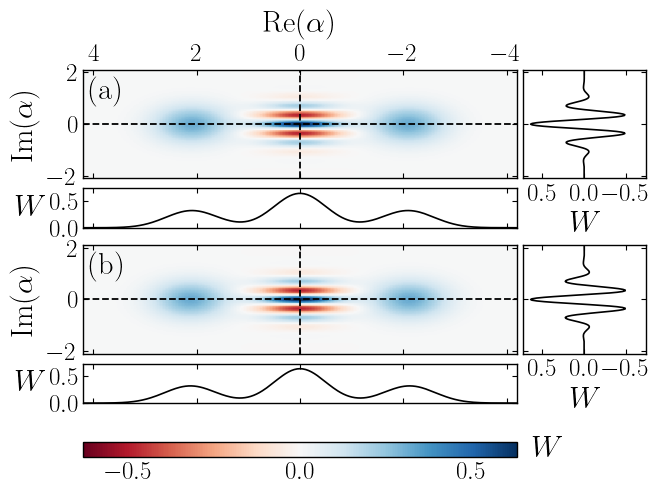

In [42]:
fig, axes = plot_wigner_stack_num(
    [W_exact1, W_var],
    [cut_p0_exact1, cut_p0_var],
    [cut_x0_exact1, cut_x0_var],
    xvec=xvec, pvec=pvec,
    axis_lim=(-4.2, 4.2), labeleven=True, figsize=(7.0, 7.0)
)
plt.show()

In [96]:
# ── parámetros del punto a evaluar ──
lam1_val = 2.0
lam2_val = 2.0
omega0 = 1.0
cv_val   = 1.0          # s = t (impar) o Δ (par), según qué sector uses
sign_val = +1           # rama del gato: +1 o -1

# ── diagonalización exacta y estado gato ──
Lam = np.sqrt(lam1_val**2 + lam2_val**2)
M   = _Mof_Lam(Lam)

Ee, vec, _ = E_cat_exact(lam1_val, lam2_val, cv_val, M=M)
cat_state  = exact_cat_state(lam1_val, lam2_val, vec, M, sign=sign_val)

# ── grilla en el plano Re(alpha) vs Im(alpha) ──
xvec = np.linspace(-4.2, 4.2, 301)
pvec = np.linspace(-4.2, 4.2, 301)

# ── Wigner numérica + cortes ──
W_exact2, cut_p0_exact2, cut_x0_exact2 = wigner_and_cuts_num(cat_state, xvec=xvec, pvec=pvec, verbose=True)

   calculando 151 filas (p>=0) en paralelo ...
   listo (151 filas); reflejando a p<0 ...


In [97]:
# ── minimización variacional: (alpha, r) que minimizan E(a,r) ──
lam1_val = 2.0
lam2_val = 2.0
Ev, xv = _minimize_cat(lam1_val, lam2_val, cv_val)
a_val, r_val = xv
theta_val = 0.5 * (Lam - a_val)     # desplazamiento del lóbulo, β

# mismo cutoff de Fock que el caso exacto, para comparar en igualdad de condiciones
N_var = M

cat_state_var = cat_state_variational(theta_val, r_val, sign_val, N_var)

# ── Wigner (QuTiP) + cortes, mismo formato que el bloque exacto ──
W_var2 = qt.wigner(cat_state_var, xvec, pvec, g=2)

ip0 = np.argmin(np.abs(pvec))
ix0 = np.argmin(np.abs(xvec))
cut_p0_var2 = W_var2[ip0, :]
cut_x0_var2 = W_var2[:, ix0]

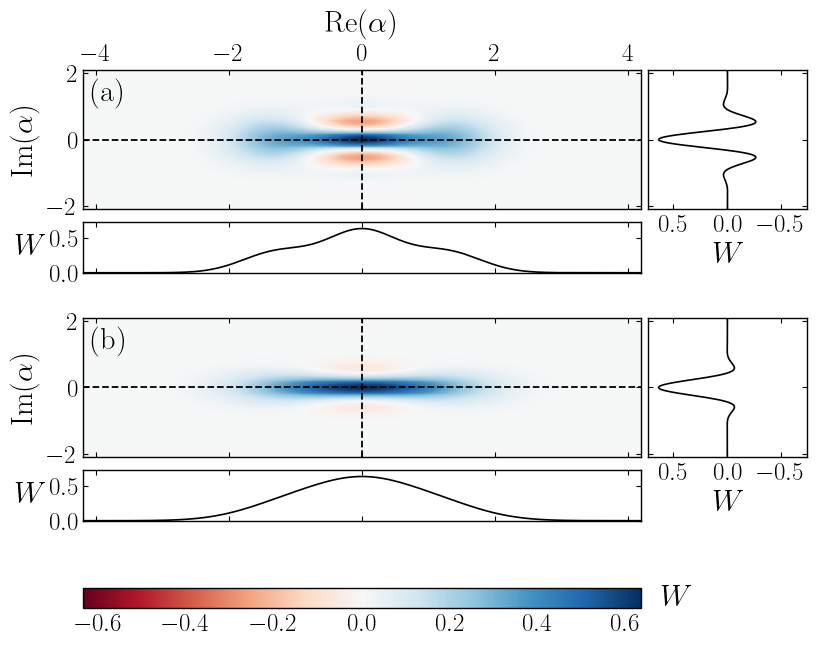

In [131]:
fig, axes = plot_wigner_stack_num(
    [W_exact2, W_var2],
    [cut_p0_exact2, cut_p0_var2],
    [cut_x0_exact2, cut_x0_var2],
    xvec=xvec, pvec=pvec,
    axis_lim=(-4.2, 4.2), labeleven=True, figsize=(9.0, 9.0)
)
plt.show()

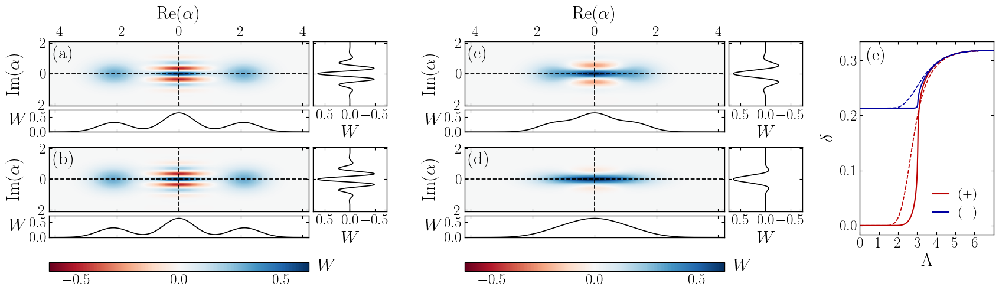

Figura combinada (a-d: Wigner, e: negatividad) guardada.


In [144]:
# ══════════════════════════════════════════════════════════════════
#  Helper: calcula el alto de figura necesario para que el bloque
#  de Wigner (n paneles apilados) llene la altura, dado un ancho Fw
# ══════════════════════════════════════════════════════════════════
def _required_fh(Fw, n=2, data_aspect=0.5, axis_lim=(-4.2, 4.2), ylim=(-2.1, 2.1),
                  panel_frac=0.30, padb=0.014, gap_v=0.025, gap_cb=0.055, hcb=0.022,
                  Tm=0.12, Bm=0.06):
    """Fh tal que el contenido de plot_wigner_stack_num ocupe (1-Tm-Bm)
    de la altura total, dado el ancho Fw. Debe usar las mismas
    constantes internas (wm, padb, gap_v, gap_cb, hcb, panel_frac) que
    la función original."""
    X = axis_lim[1] - axis_lim[0]; Y = ylim[1] - ylim[0]
    wm = 0.62
    target = 1.0 - Tm - Bm
    const  = n*padb + n*0.01 + (n-1)*gap_v + gap_cb + hcb
    hm     = (target - const) / (n*(1 + panel_frac))
    return data_aspect*wm*Fw*(Y/X) / hm


# ══════════════════════════════════════════════════════════════════
#  FIGURA COMBINADA: Wigner rama+1 | Wigner rama-1 | negatividad δ(Λ)
# ══════════════════════════════════════════════════════════════════
FIG_W      = 17
W_RATIOS   = [0.425, 0.425, 0.175]     # columnas 1 y 2 iguales entre sí

sumR = sum(W_RATIOS)
w0 = FIG_W * W_RATIOS[0] / sumR
w1 = FIG_W * W_RATIOS[1] / sumR     # w1 == w0 con estos ratios
w2 = FIG_W * W_RATIOS[2] / sumR

# alto de figura calculado para que (a)-(d) llenen su espacio, sin sobrar
FIG_H = _required_fh(w0, n=2)

fig = plt.figure(figsize=(FIG_W, FIG_H))
subfigs = fig.subfigures(1, 3, width_ratios=W_RATIOS, wspace=-0.01)

# ---------- panel izquierdo: gato rama 1, exacto vs variacional -> (a),(b) ----------
_ = plot_wigner_stack_num(
    [W_exact2, W_var2],
    [cut_p0_exact2, cut_p0_var2],
    [cut_x0_exact2, cut_x0_var2],
    xvec=xvec, pvec=pvec,
    axis_lim=(-4.2, 4.2), labeleven=True,
    figsize=(w1, FIG_H),
    fig=subfigs[1], label_offset=2
)

_ = plot_wigner_stack_num(
    [W_exact1, W_var],
    [cut_p0_exact1, cut_p0_var],
    [cut_x0_exact1, cut_x0_var],
    xvec=xvec, pvec=pvec,
    axis_lim=(-4.2, 4.2), labeleven=True,
    figsize=(w0, FIG_H),
    fig=subfigs[0], label_offset=0
)


# ---------- panel derecho: negatividad δ(Λ) -> (e) ----------
_ex = np.loadtxt('Resultados_aniso/negativity_vs_Lambda.txt')
_va = np.loadtxt('Resultados_aniso/negativity_variational_vs_Lambda.txt')
Lam_ex, dp_ex, dm_ex = _ex[:, 0], _ex[:, 1], _ex[:, 2]
Lam_va, dp_va, dm_va = _va[:, 0], _va[:, 1], _va[:, 2]

C_PLUS  = plt.cm.seismic(0.88)
C_MINUS = plt.cm.seismic(0.12)

ax_c = subfigs[2].add_subplot(111)

#subfigs[2].subplots_adjust(left=0.24, right=0.96, top=, bottom=0.06)

ax_c.plot(Lam_ex, _smooth(dp_ex, window=13, poly=3), '--', color=C_PLUS,  lw=1.25)
ax_c.plot(Lam_ex, _smooth(dm_ex, window=13, poly=3), '--', color=C_MINUS, lw=1.25)
ax_c.plot(Lam_va, dp_va, '-', color=C_PLUS,  lw=1.5)
ax_c.plot(Lam_va, dm_va, '-', color=C_MINUS, lw=1.5)
ax_c.set_xlabel(r'$\Lambda$')
ax_c.set_ylabel(r'$\delta$')
ax_c.set_xlim(0.01, 7.0)
ax_c.set_xticks(np.arange(0, 7, 1))
ax_c.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)

leg = [mlines.Line2D([], [], color=C_PLUS,  lw=1.5, label=r'$(+)$'), mlines.Line2D([], [], color=C_MINUS, lw=1.5, label=r'$(-)$')]
ax_c.legend(handles=leg, frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, loc='lower right', borderpad=0.6, handlelength=1.2, labelspacing=0.4)
ax_c.text(0.05, 0.97, r'(e)', transform=ax_c.transAxes, ha='left', va='top', fontsize=22)

fig.savefig('paper_figures/wigner_pair_plus_negativity.png', bbox_inches='tight', transparent=False, dpi=300)
#fig.savefig('paper_figures/wigner_pair_plus_negativity.svg', bbox_inches='tight')
plt.show()
print('Figura combinada (a-d: Wigner, e: negatividad) guardada.')

## Two mode cat state Wigner function

### Variational functions

In [15]:
def cat_bimodal(lam1, lam2, cv, N, sector='even', sign=+1, r_thresh=0.05):
    """
    Estado gato bimodal entrelazado (base de sitio), construido con QuTiP.
      sector='even': lóbulos DIAGONAL   (γ1,γ2) ± (-γ1,-γ2), squeeze two-mode signo −
      sector='odd' : lóbulos ANTIDIAG.  (γ1,-γ2) ± (-γ1,γ2), squeeze two-mode signo +
      sign = ±1: rama del gato.
      r_thresh: si |r| < r_thresh no se aplica S(r) (en strong coupling r≈0).
    Devuelve (psi_qobj, (alpha, r, gam1, gam2)).
    """
    Lam = np.sqrt(lam1**2 + lam2**2)
    E, x = _minimize_cat(lam1, lam2, cv)
    alpha, r = x[0], x[1]
    gam1 = lam1 * (0.5 - alpha/(2.0*Lam))
    gam2 = lam2 * (0.5 - alpha/(2.0*Lam))

    a1 = qt.tensor(qt.destroy(N), qt.qeye(N))
    a2 = qt.tensor(qt.qeye(N), qt.destroy(N))
    vac = qt.tensor(qt.basis(N, 0), qt.basis(N, 0))

    # squeezing generalizado de dos modos (solo si |r| supera el umbral)
    if abs(r) >= r_thresh:
        c1  = (lam1/Lam)**2                 # cos²θ
        c2  = (lam2/Lam)**2                 # sin²θ
        c12 = 2.0*lam1*lam2/Lam**2          # sin2θ
        sgn_tm = +1.0 if sector == 'odd' else -1.0
        G = c1*(a1**2 - a1.dag()**2) + c2*(a2**2 - a2.dag()**2) \
            + sgn_tm * c12 * (a1*a2 - a1.dag()*a2.dag())
        S = ((r/2.0) * G).expm()
        base = S * vac
    else:
        base = vac

    D1 = lambda g: qt.tensor(qt.displace(N, g), qt.qeye(N))
    D2 = lambda g: qt.tensor(qt.qeye(N), qt.displace(N, g))

    if sector == 'even':       # diagonal
        lobeA = D1(+gam1) * D2(+gam2) * base
        lobeB = D1(-gam1) * D2(-gam2) * base
    else:                      # antidiagonal
        lobeA = D1(+gam1) * D2(-gam2) * base
        lobeB = D1(-gam1) * D2(+gam2) * base

    psi = (lobeA + sign * lobeB).unit()
    return psi, (alpha, r, gam1, gam2)

def wigner_joint_cut(psi, N, uvec, vvec, plane='real', verbose=True, tag=''):
    """
    Wigner conjunta de dos modos W(α1,α2) en un corte 2D, optimizada.
      plane='real': Re(α1)=u vs Re(α2)=v   (Im=0)
      plane='imag': Im(α1)=u vs Im(α2)=v   (Re=0)

    Usa W = (2/π)² Σ_{n1,n2} (-1)^{n1+n2} |<n1 n2| D1†(α1)⊗D2†(α2) |ψ>|²
    con ψ como matriz N×N: el desplazamiento factoriza por modo
    (D1† por la izquierda, D2†^T por la derecha), sin trazas N²×N².
    Reporta avance cada ~10% de las columnas si verbose.
    """
    # ψ como matriz [n1, n2]
    psi_mat = psi.full().reshape(N, N)

    # signos de paridad por modo
    par = (-1.0) ** np.arange(N)
    Par = np.outer(par, par)            # (-1)^{n1+n2}

    # precomputar las matrices de desplazamiento D†(α) para cada valor del eje.
    # D†(α) = D(-α). Reusamos: mismos valores en u y v (misma malla en ambos ejes).
    def _Ddag(val):
        a = (val + 0j) if plane == 'real' else (1j*val)
        return qt.displace(N, -a).full()        # D†(α) = D(-α), matriz N×N

    # como uvec y vvec pueden diferir, precomputamos ambos
    Ddag_u = [_Ddag(u) for u in uvec]           # para el modo 1
    Ddag_v = [_Ddag(v) for v in vvec]           # para el modo 2
    # transpuestas de las del modo 2 (para aplicar por la derecha)
    Ddag_vT = [Dv.T for Dv in Ddag_v]

    pref = (2.0/np.pi)**2
    nu = len(uvec)
    step10 = max(1, nu // 10)

    W = np.zeros((len(vvec), len(uvec)))
    for iu in range(nu):
        # aplicar D1†(α1) por la izquierda: (N×N)@(N×N) = N×N
        left = Ddag_u[iu] @ psi_mat             # [n1', n2]
        for iv in range(len(vvec)):
            # aplicar D2†(α2) por la derecha (vía transpuesta): left @ D2†^T
            tpsi = left @ Ddag_vT[iv]           # [n1', n2'] = <n1' n2'|D1†⊗D2†|ψ>
            W[iv, iu] = pref * np.sum(Par * (np.abs(tpsi)**2))
        if verbose and ((iu+1) % step10 == 0 or (iu+1) == nu):
            print(f"      [{tag}] {100.0*(iu+1)/nu:5.1f}%", flush=True)
    return W


def wigner_joint_and_cuts(psi, N, uvec, vvec, plane='real', verbose=True, tag=''):
    """W conjunta + cortes centrales (u=0 y v=0)."""
    W = wigner_joint_cut(psi, N, uvec, vvec, plane=plane, verbose=verbose, tag=tag)
    iv0 = np.argmin(np.abs(vvec))
    iu0 = np.argmin(np.abs(uvec))
    return W, W[iv0, :], W[:, iu0]

def _nice_tick(m):
    """Un valor de tick redondo (0.1, 0.2, 0.25, 0.5...) que quepa en [0, m]."""
    for step in [0.5, 0.25, 0.2, 0.1, 0.05]:
        if step <= m:
            return step
    return np.round(m, 2)

def _fmt_ticks(vals):
    """Etiquetas: '0' para el cero, 2 decimales para el resto."""
    return ['0' if abs(v) < 1e-9 else f'{v:.2f}' for v in vals]

def plot_wigner_single_joint(W, cut_reim0, cut_re0im, xlabel, ylabel,
                             xvec, pvec, cmap='RdBu',
                             axis_lim=(-4.2, 4.2),
                             cut_margin=1.15, figsize=(8.5, 8.5),
                             cbar_shrink=0.35, cbar_x=-0.12, cbar_w=0.04, labeleven=False):
    re = xvec
    im = pvec
    vmax = np.max(np.abs(W))
    norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)

    fig = plt.figure(figsize=figsize)
    ax_main = fig.add_subplot(1, 1, 1)

    im_h = ax_main.pcolormesh(re, im, W, cmap=cmap, norm=norm, shading='auto')
    ax_main.axhline(0.0, color='k', ls='--', lw=1.5)
    ax_main.axvline(0.0, color='k', ls='--', lw=1.5)
    ax_main.set_xlim(*axis_lim); ax_main.set_ylim(*axis_lim)
    ax_main.yaxis.set_major_locator(ticker.MultipleLocator(1))
    if labeleven:
        ax_main.yaxis.set_major_locator(ticker.MultipleLocator(2))
        ax_main.xaxis.set_major_locator(ticker.MultipleLocator(2))
    ax_main.set_aspect('equal', adjustable='box')
    ax_main.set_axisbelow(False)

    divider  = make_axes_locatable(ax_main)
    ax_below = divider.append_axes("bottom", size="30%", pad=0.05, sharex=ax_main)
    ax_right = divider.append_axes("right",  size="30%", pad=0.05, sharey=ax_main)

    ax_main.tick_params(axis='x', labelbottom=False, labeltop=True, direction='in', top=True, bottom=True)
    ax_main.tick_params(axis='y', direction='in', left=True, right=True)
    # posiciones ORIGINALES (las que ya te funcionaban), solo parametrizadas
    ax_main.text(-0.025, 1.025, xlabel, transform=ax_main.transAxes, ha='left', va='bottom',fontsize=20)
    ax_main.text(-0.025, 1.025, ylabel, transform=ax_main.transAxes, ha='right', va='top', rotation=90, fontsize=20)

    m = cut_margin * max(np.max(np.abs(cut_reim0)), np.max(np.abs(cut_re0im)))

    tol = 1e-2
    # m independiente por panel (usa el rango real de cada corte)
    m_below = cut_margin * np.max(np.abs(cut_reim0))
    m_right = cut_margin * np.max(np.abs(cut_re0im))

    has_pos1 = np.max(cut_re0im) >  tol
    has_neg1 = np.min(cut_re0im) < -tol
    has_pos2 = np.max(cut_reim0) >  tol
    has_neg2 = np.min(cut_reim0) < -tol

    # panel inferior
    ax_below.plot(re, cut_reim0, color='k', lw=1.3)
    ax_below.set_xlim(axis_lim[0], axis_lim[1])
    #ax_below.invert_xaxis()

    tick_val_b = np.round(0.75 * m_below / cut_margin, 2)

    if has_pos2 and has_neg2:
        ax_below.set_ylim(-m_below, m_below)
        tv = _nice_tick(m_below)
        ax_below.set_yticks([-tv, 0.0, tv])
        ax_below.set_yticklabels(_fmt_ticks([-tv, 0.0, tv]))
    elif has_pos2:
        ax_below.set_ylim(0.0, m_below)
        tv = _nice_tick(m_below)
        ax_below.set_yticks([0.0, tv])
        ax_below.set_yticklabels(_fmt_ticks([0.0, tv]))
    elif has_neg2:
        ax_below.set_ylim(-m_below, 0.0)
        tv = _nice_tick(m_below)
        ax_below.set_yticks([-tv, 0.0])
        ax_below.set_yticklabels(_fmt_ticks([-tv, 0.0]))
    else:
        ax_below.set_ylim(-m_below, m_below)
        tv = _nice_tick(m_below)
        ax_below.set_yticks([-tv, 0.0, tv])
        ax_below.set_yticklabels(_fmt_ticks([-tv, 0.0, tv]))
    ax_below.set_ylabel(r'$W$', rotation=0, labelpad=15, va='center')
    ax_below.tick_params(axis='x', labelbottom=False, direction='in', top=True, right=True)
    ax_below.tick_params(axis='y', direction='in', top=True, right=True)

    # panel derecho
    # panel derecho
    ax_right.plot(cut_re0im, im, color='k', lw=1.3)

    # valor de tick "redondo" dentro del rango (p.ej. 3/4 de m, redondeado)
    tick_val = np.round(0.75 * m_right / cut_margin, 2)   # un tick simétrico legible

    if has_pos1 and has_neg1:
        ax_right.set_xlim(m_right, -m_right)
        tv = _nice_tick(m_right)
        ax_right.set_xticks([tv, 0.0, -tv])
        ax_right.set_xticklabels(_fmt_ticks([tv, 0.0, -tv]))
        ax_right.tick_params(axis='x', labelrotation=45)
    elif has_pos1:
        ax_right.set_xlim(m_right, 0.0)
        tv = _nice_tick(m_right)
        ax_right.set_xticks([tv, 0.0])
        ax_right.set_xticklabels(_fmt_ticks([tv, 0.0]))
    elif has_neg1:
        ax_right.set_xlim(0.0, -m_right)
        tv = _nice_tick(m_right)
        ax_right.set_xticks([0.0, -tv])
        ax_right.set_xticklabels(_fmt_ticks([0.0, -tv]))
    else:
        ax_right.set_xlim(m_right, -m_right)
        tv = _nice_tick(m_right)
        ax_right.set_xticks([tv, 0.0, -tv])
        ax_right.set_xticklabels(_fmt_ticks([tv, 0.0, -tv]))
        ax_right.tick_params(axis='x', labelrotation=45)
    ax_right.set_xlabel(r'$W$')
    ax_right.tick_params(axis='y', labelleft=False, direction='in', top=True, right=True)
    ax_right.tick_params(axis='x', direction='in', top=True, right=True)

    cax = ax_main.inset_axes([cbar_x, (1 - cbar_shrink)/2, cbar_w, cbar_shrink])
    cbar = fig.colorbar(im_h, cax=cax)
    cax.yaxis.set_ticks_position('left')
    cax.yaxis.set_label_position('left')
    cax.set_title(r'$W$')
    return fig

In [16]:
def reduced_dm_mode(psi, mode, N):
    """Matriz densidad reducida de un modo (traza el otro).
       mode=1 → ρ1 = Tr_2|ψ><ψ|;  mode=2 → ρ2 = Tr_1|ψ><ψ|.
       psi: Qobj de dos modos (QuTiP)."""
    rho = psi * psi.dag()
    keep = 0 if mode == 1 else 1
    return rho.ptrace(keep)      # QuTiP traza el otro modo


def wigner_negativity_dm(rho1, xvec, pvec):
    """δ y ∫W de la Wigner de un modo de una matriz densidad ρ (QuTiP).
       Usa qt.wigner (acepta matriz densidad directamente)."""
    W = qt.wigner(rho1, xvec, pvec)
    if not hasattr(np, 'trapz'):
        np.trapz = np.trapezoid
    norm_check = np.trapz(np.trapz(W, xvec, axis=1), pvec)
    delta = 0.5 * (np.trapz(np.trapz(np.abs(W), xvec, axis=1), pvec) - 1.0)
    return delta, norm_check


def marginal_negativities(psi, xvec, pvec):
    """δ1, δ2 (negatividades marginales) del estado bimodal psi (Qobj).
       Reduce cada modo, calcula la Wigner de un modo del reducido, integra."""
    rho1 = reduced_dm_mode(psi, 1, None)
    rho2 = reduced_dm_mode(psi, 2, None)
    d1, n1 = wigner_negativity_dm(rho1, xvec, pvec)
    d2, n2 = wigner_negativity_dm(rho2, xvec, pvec)
    return d1, d2, n1, n2

def entanglement_measures_var(psi, N, tol=1e-12):
    """E_N y S del gato bimodal variacional (Qobj de dos modos, estado PURO).
       Los valores singulares de ψ como matriz N×N son los sqrt(λ_i) de Schmidt:
         E_N = 2 log2( Σ_i s_i ),   S = -Σ_i λ_i log2 λ_i,  λ_i = s_i²."""
    pm = psi.full().reshape(N, N)
    s  = np.linalg.svd(pm, compute_uv=False)
    s  = s[s > np.sqrt(tol)]
    E_N = 2.0*np.log2(np.sum(s))
    lam = s**2
    S   = -np.sum(lam*np.log2(lam))
    return E_N, S

In [17]:

def _cut_along_theta(W, uvec, vvec, theta, s_vec):
    """Perfil de W a lo largo de la recta (u,v) = s·(cosθ, sinθ).
       W está indexada W[iv, iu] → la malla del interpolador es (vvec, uvec)."""
    itp = RegularGridInterpolator((vvec, uvec), W, bounds_error=False, fill_value=np.nan)
    u = s_vec*np.cos(theta)
    v = s_vec*np.sin(theta)
    return itp(np.column_stack([v, u]))


def plot_joint_wigner_2x2(W_re, W_im, uvec, vvec, theta,
                          axis_lim=(-3.5, 3.5), cmap='RdBu',
                          figsize=(9.0, 5.2), n_pts=401,
                          share_scale=True, cut_margin=1.15,
                          show_cut_line=True, cut_size="45%"):
    """
    Dos bloques (Re-Re | Im-Im). Cada bloque: mapa conjunto + corte a lo largo
    de la dirección θ, anclado al mapa con make_axes_locatable (misma anchura,
    mismo eje x). El corte se parametriza por la coordenada horizontal del mapa.
    """

    # corte parametrizado por el eje horizontal u: (u, v) = (u, u·tanθ)
    u_cut = np.linspace(axis_lim[0], axis_lim[1], n_pts)
    v_cut = u_cut*np.tan(theta)

    def _cut(W):
        itp = RegularGridInterpolator((vvec, uvec), W, bounds_error=False, fill_value=np.nan)
        return itp(np.column_stack([v_cut, u_cut]))

    cut_re = _cut(W_re)
    cut_im = _cut(W_im)

    if share_scale:
        vmax = max(np.nanmax(np.abs(W_re)), np.nanmax(np.abs(W_im)))
        vmax_re = vmax_im = vmax
    else:
        vmax_re = np.nanmax(np.abs(W_re)); vmax_im = np.nanmax(np.abs(W_im))

    fig = plt.figure(figsize=figsize)
    gs  = gridspec.GridSpec(1, 2, figure=fig, wspace=0.5)

    def _block(cell, W, cut, vmax, xlabel, ylabel, show_ylabel_W):
        ax = fig.add_subplot(cell)
        norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)
        h = ax.pcolormesh(uvec, vvec, W, cmap=cmap, norm=norm, shading='auto')
        if show_cut_line:
            ax.plot(u_cut, v_cut, color='k', ls=':', lw=1.4)
        ax.set_xlim(*axis_lim); ax.set_ylim(*axis_lim)
        ax.set_aspect('equal', adjustable='box')
        ax.set_axisbelow(False)
        ax.xaxis.set_major_locator(ticker.MultipleLocator(2))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(2))
        ax.set_ylabel(ylabel)
        ax.tick_params(axis='x', labelbottom=False, direction='in', bottom=True, top=True, size=5, width=1.5) 
        ax.tick_params(axis='y', direction='in', left=True, right=True, size=5, width=1.5)

        # panel de corte anclado al mapa: misma anchura, mismo eje x
        div    = make_axes_locatable(ax)
        ax_cut = div.append_axes("bottom", size=cut_size, pad=0.06, sharex=ax)
        ax_cut.plot(u_cut, cut, color='k', lw=1.4)
        m = cut_margin*np.nanmax(np.abs(cut))
        ax_cut.set_ylim(-m, m)
        tv = _nice_tick(m)
        ax_cut.set_yticks([-tv, 0.0, tv])
        ax_cut.set_yticklabels(_fmt_ticks([-tv, 0.0, tv]))
        ax_cut.set_xlabel(xlabel, labelpad=5)
        if show_ylabel_W:
            ax_cut.set_ylabel(r'$W$', rotation=0, labelpad=10, va='center')
        else:
            ax_cut.tick_params(axis='y', labelleft=False)
        ax_cut.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True, size=5, width=1.5)
        return ax, ax_cut, h

    ax_a, ax_c, h_re = _block(gs[0, 0], W_re, cut_re, vmax_re, r'$\mathrm{Re}(\alpha_1)$', r'$\mathrm{Re}(\alpha_2)$', True)
    ax_b, ax_d, h_im = _block(gs[0, 1], W_im, cut_im, vmax_im,  r'$\mathrm{Im}(\alpha_1)$', r'$\mathrm{Im}(\alpha_2)$', False)

    if share_scale:
        cax  = ax_b.inset_axes([1.10, 0.0, 0.075, 0.8])
        cbar = fig.colorbar(h_im, cax=cax)
        cax.set_title(r'$W$', pad=10)
        cax.tick_params(direction='in')
    else:
        for axm, h in [(ax_a, h_re), (ax_b, h_im)]:
            cax = axm.inset_axes([1.10, 0.0, 0.075, 0.8])
            cb  = fig.colorbar(h, cax=cax)
            cax.set_title(r'$W$', pad=10)
            cax.tick_params(direction='in')

    return fig, (ax_a, ax_b, ax_c, ax_d)

### Variational WF

#### WF plots

In [16]:
# ══════════════════════════════════════════════════════════════════
#  EJECUCIÓN — 4 gatos bimodales (par/impar × ±), Wigner conjunta
#  en 2 cortes (Re1-Re2 y Im1-Im2) cada uno → 8 Wigner en total
# ══════════════════════════════════════════════════════════════════
omega0  = 1.0
cv_val  = 1.0
Lam     =  2*np.sqrt(2)
theta   = np.pi/4            
lam1_v  = Lam*np.cos(theta)
lam2_v  = Lam*np.sin(theta)
N_FOCK  = 50                               # truncación por modo (subir si norma≠1)
r_thresh = 0.05

# malla de los cortes (ambos ejes iguales)
uvec = np.linspace(-3.5, 3.5, 201)
vvec = np.linspace(-3.5, 3.5, 201)

cases = [('even', +1), ('even', -1), ('odd', +1), ('odd', -1)]

results = {}   # (sector,sign) -> dict con W_real, cuts, W_imag, cuts, pars
for sector, sign in cases:
    psi, pars = cat_bimodal(lam1_v, lam2_v, cv_val, N_FOCK, sector=sector, sign=sign, r_thresh=r_thresh)
    print(f"{sector} sign={sign:+d}: norma={psi.norm():.6f}, "
          f"α={pars[0]:.4f} r={pars[1]:.4f} γ1={pars[2]:.3f} γ2={pars[3]:.3f}", flush=True)

    lbl = f"{sector}{'+' if sign>0 else '-'}"
    Wr, cr_u, cr_v = wigner_joint_and_cuts(psi, N_FOCK, uvec, vvec, plane='real', tag=lbl+' Re')
    Wi, ci_u, ci_v = wigner_joint_and_cuts(psi, N_FOCK, uvec, vvec,  plane='imag', tag=lbl+' Im')
    results[(sector, sign)] = dict(W_real=Wr, cr_u=cr_u, cr_v=cr_v,
                                   W_imag=Wi, ci_u=ci_u, ci_v=ci_v, pars=pars)

print("Ejecución gatos bimodales lista.")

even sign=+1: norma=1.000000, α=0.6718 r=-0.3363 γ1=0.762 γ2=0.762
      [even+ Re]  10.0%
      [even+ Re]  19.9%
      [even+ Re]  29.9%
      [even+ Re]  39.8%
      [even+ Re]  49.8%
      [even+ Re]  59.7%
      [even+ Re]  69.7%
      [even+ Re]  79.6%
      [even+ Re]  89.6%
      [even+ Re]  99.5%
      [even+ Re] 100.0%
      [even+ Im]  10.0%
      [even+ Im]  19.9%
      [even+ Im]  29.9%
      [even+ Im]  39.8%
      [even+ Im]  49.8%
      [even+ Im]  59.7%
      [even+ Im]  69.7%
      [even+ Im]  79.6%
      [even+ Im]  89.6%
      [even+ Im]  99.5%
      [even+ Im] 100.0%
even sign=-1: norma=1.000000, α=0.6718 r=-0.3363 γ1=0.762 γ2=0.762
      [even- Re]  10.0%
      [even- Re]  19.9%
      [even- Re]  29.9%
      [even- Re]  39.8%
      [even- Re]  49.8%
      [even- Re]  59.7%
      [even- Re]  69.7%
      [even- Re]  79.6%
      [even- Re]  89.6%
      [even- Re]  99.5%
      [even- Re] 100.0%
      [even- Im]  10.0%
      [even- Im]  19.9%
      [even- Im]  29.9%
  

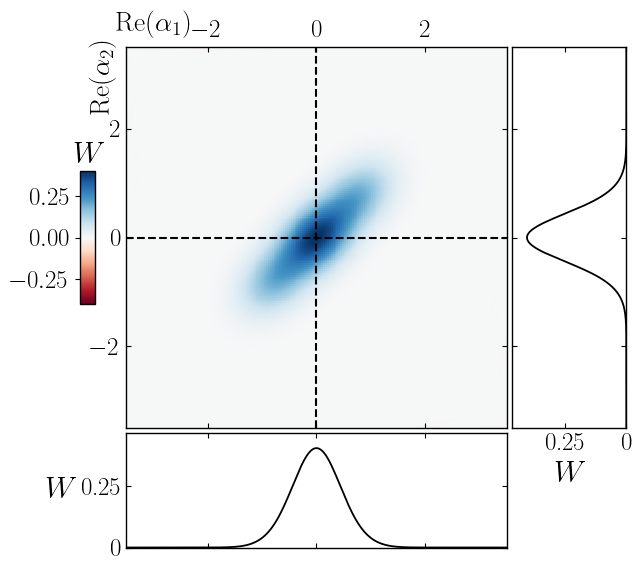

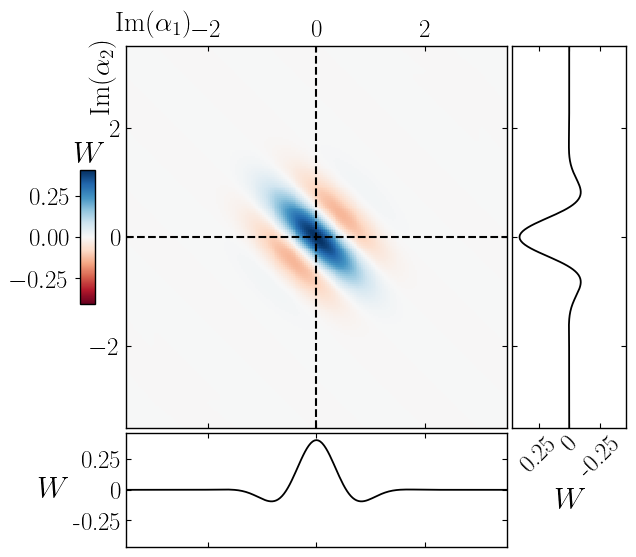

Figuras even_p (ReRe + ImIm) listas.


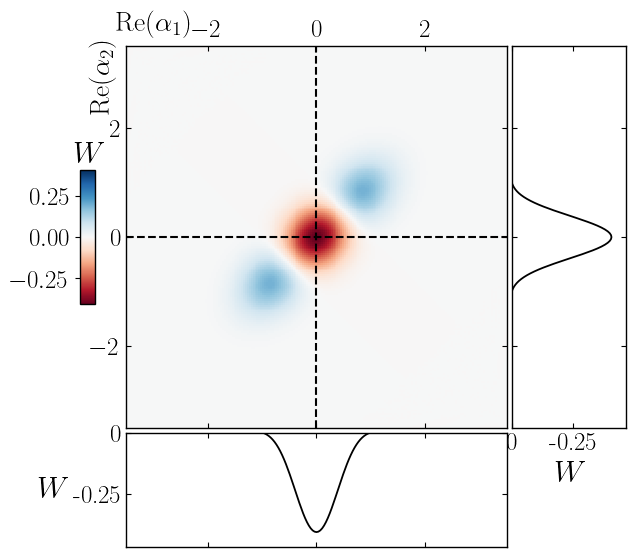

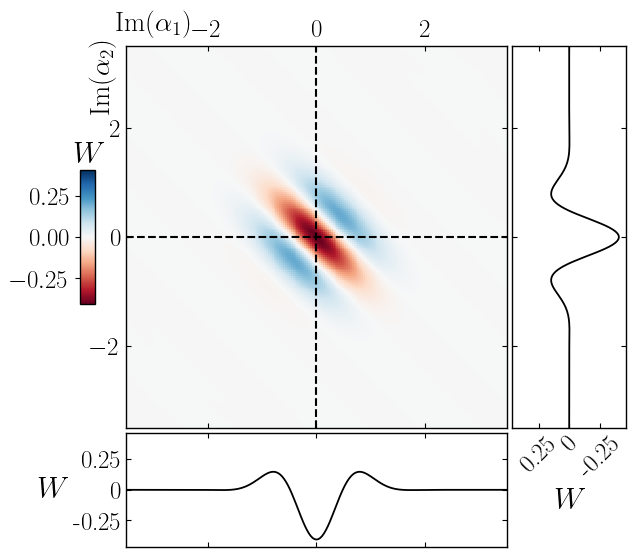

Figuras even_m (ReRe + ImIm) listas.


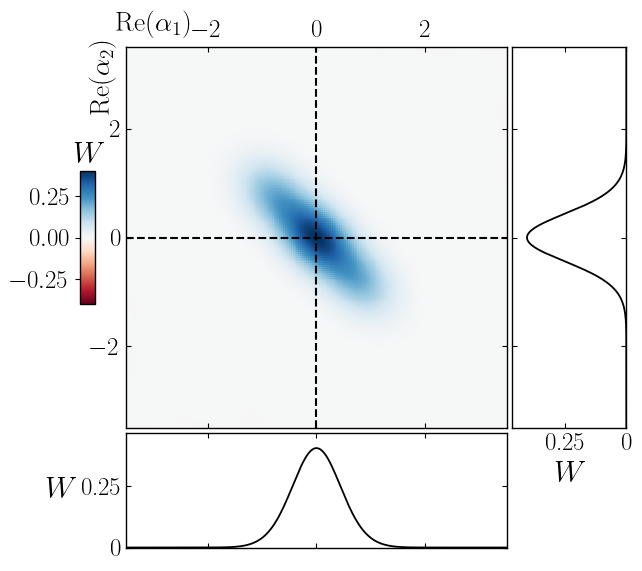

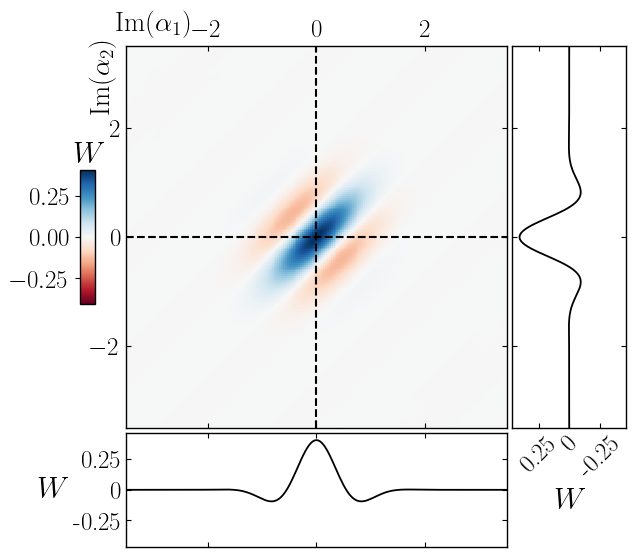

Figuras odd_p (ReRe + ImIm) listas.


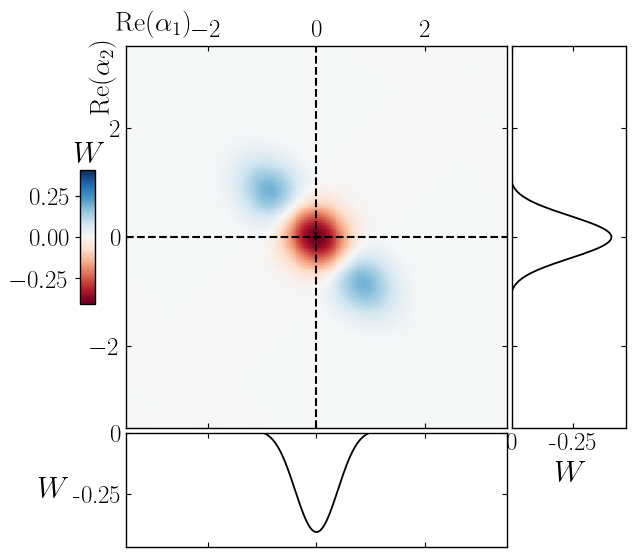

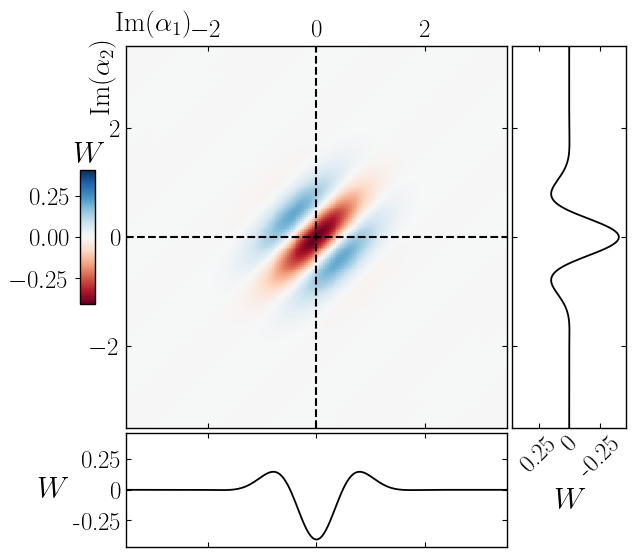

Figuras odd_m (ReRe + ImIm) listas.


In [ ]:
# ══════════════════════════════════════════════════════════════════
#  GRAFICACIÓN — 2 planos por gato bimodal (Re1-Re2 y Im1-Im2)
# ══════════════════════════════════════════════════════════════════
for sector, sign in cases:
    d = results[(sector, sign)]
    tag = f"{sector}_{'p' if sign>0 else 'm'}"

    # plano Re(α1) vs Re(α2)
    fig = plot_wigner_single_joint(
        d['W_real'], d['cr_u'], d['cr_v'],
        xlabel=r'$\mathrm{Re}(\alpha_1)$', ylabel=r'$\mathrm{Re}(\alpha_2)$',
        xvec=uvec, pvec=vvec, axis_lim=(-3.5, 3.5), figsize=(6.5, 6.5), labeleven=True)
    fig.savefig(f'Resultados_aniso/wigner_bimodal_{tag}_ReRe.png', bbox_inches='tight', transparent=False, dpi=300)
    plt.show()

    # plano Im(α1) vs Im(α2)
    fig = plot_wigner_single_joint(
        d['W_imag'], d['ci_u'], d['ci_v'],
        xlabel=r'$\mathrm{Im}(\alpha_1)$', ylabel=r'$\mathrm{Im}(\alpha_2)$',
        xvec=uvec, pvec=vvec, axis_lim=(-3.5, 3.5), figsize=(6.5, 6.5), labeleven=True)
    fig.savefig(f'Resultados_aniso/wigner_bimodal_{tag}_ImIm.png', bbox_inches='tight', transparent=False, dpi=300)
    plt.show()

    print(f'Figuras {tag} (ReRe + ImIm) listas.')

even sign=-1: norma=1.000000, α=0.0011 r=-0.0011 γ1=1.500 γ2=1.500
      [even− Re]  10.0%
      [even− Re]  19.9%
      [even− Re]  29.9%
      [even− Re]  39.8%
      [even− Re]  49.8%
      [even− Re]  59.7%
      [even− Re]  69.7%
      [even− Re]  79.6%
      [even− Re]  89.6%
      [even− Re]  99.5%
      [even− Re] 100.0%
      [even− Im]  10.0%
      [even− Im]  19.9%
      [even− Im]  29.9%
      [even− Im]  39.8%
      [even− Im]  49.8%
      [even− Im]  59.7%
      [even− Im]  69.7%
      [even− Im]  79.6%
      [even− Im]  89.6%
      [even− Im]  99.5%
      [even− Im] 100.0%


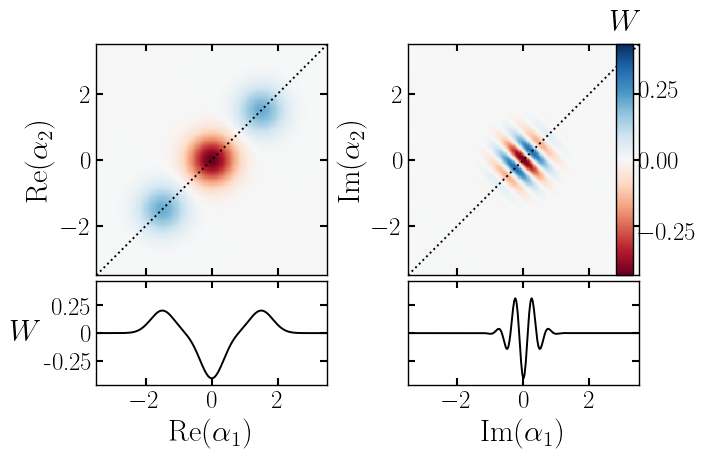

Figura Wigner conjunta (par −): mapas Re-Re / Im-Im + cortes en θ.


In [ ]:
# ══════════════════════════════════════════════════════════════════
#  EJECUCIÓN + FIGURA — gato bimodal par (−), Λ=3√2, cortes Re-Re e Im-Im
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
cv_val   = 1.0
Lam      = 3*np.sqrt(2)
theta    = np.pi/4
lam1_v   = Lam*np.cos(theta)
lam2_v   = Lam*np.sin(theta)
N_FOCK   = 50
r_thresh = 0.05

uvec = np.linspace(-3.5, 3.5, 201)
vvec = np.linspace(-3.5, 3.5, 201)

psi, pars = cat_bimodal(lam1_v, lam2_v, cv_val, N_FOCK,
                        sector='even', sign=-1, r_thresh=r_thresh)
print(f"even sign=-1: norma={psi.norm():.6f}, "
      f"α={pars[0]:.4f} r={pars[1]:.4f} γ1={pars[2]:.3f} γ2={pars[3]:.3f}", flush=True)

W_re, _, _ = wigner_joint_and_cuts(psi, N_FOCK, uvec, vvec, plane='real', tag='even− Re')
W_im, _, _ = wigner_joint_and_cuts(psi, N_FOCK, uvec, vvec, plane='imag', tag='even− Im')


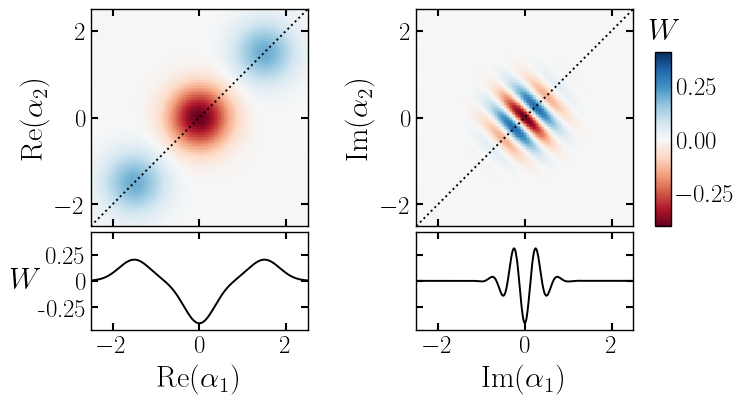

Figura Wigner conjunta (par −): mapas Re-Re / Im-Im + cortes en θ.


In [36]:

fig, axes = plot_joint_wigner_2x2(W_re, W_im, uvec, vvec, theta, axis_lim=(-2.5, 2.5), figsize=(7.0, 7.0), share_scale=True)
fig.savefig(f'paper_figures/wigner_joint_even_minus_Lam{Lam:.3f}.png',  bbox_inches='tight', transparent=False, dpi=300)
fig.savefig(f'paper_figures/wigner_joint_even_minus_Lam{Lam:.3f}.svg',  bbox_inches='tight')
plt.show()
print('Figura Wigner conjunta (par −): mapas Re-Re / Im-Im + cortes en θ.')

#### Marginal negativity

In [ ]:
# ══════════════════════════════════════════════════════════════════
#  EJECUCIÓN — δ1, δ2, E_N y S vs θ (Λ fijo, variacional)
#    θ ∈ (0, 2π);  λ1 = Λcosθ, λ2 = Λsinθ
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
cv_val   = 1.0
Lam_fix  = 3*np.sqrt(2)   # Λ fijo
sector   = 'even'
sign     = +1
N_FOCK   = 50
r_thresh = 0.00001

nth      = 200
theta_arr = np.linspace(0.0, 2.0*np.pi, nth)

xvec = np.linspace(-5.5, 5.5, 301)
pvec = np.linspace(-3.0, 3.0, 251)

d1_arr = np.full(nth, np.nan); d2_arr = np.full(nth, np.nan)
n1_arr = np.full(nth, np.nan); n2_arr = np.full(nth, np.nan)
EN_arr = np.full(nth, np.nan); S_arr  = np.full(nth, np.nan)

_step10 = max(1, nth // 10)
for k, th in enumerate(theta_arr):
    lam1 = Lam_fix * np.cos(th)
    lam2 = Lam_fix * np.sin(th)
    psi, _ = cat_bimodal(lam1, lam2, cv_val, N_FOCK, sector=sector, sign=sign, r_thresh=r_thresh)

    EN_arr[k], S_arr[k] = entanglement_measures_var(psi, N_FOCK)
    d1_arr[k], d2_arr[k], n1_arr[k], n2_arr[k] = marginal_negativities(psi, xvec, pvec)

    if k == 0:
        print(f"θ={th:5.3f}  δ1={d1_arr[k]:.4f} δ2={d2_arr[k]:.4f}  "
              f"E_N={EN_arr[k]:.4f} S={S_arr[k]:.4f}  "
              f"(∫W1={n1_arr[k]:.3f}, ∫W2={n2_arr[k]:.3f})", flush=True)

    if (k+1) % _step10 == 0 or (k+1) == nth:
        print(f"  {100.0*(k+1)/nth:5.1f}%  θ={th:5.3f}  "
              f"δ1={d1_arr[k]:.4f} δ2={d2_arr[k]:.4f}  "
              f"E_N={EN_arr[k]:.4f} S={S_arr[k]:.4f}  "
              f"(∫W1={n1_arr[k]:.3f}, ∫W2={n2_arr[k]:.3f})", flush=True)

print("Barrido marginal θ (variacional) listo.")

os.makedirs('Resultados_aniso', exist_ok=True)
_out = np.column_stack([theta_arr, d1_arr, d2_arr, n1_arr, n2_arr, EN_arr, S_arr])
np.savetxt(f'Resultados_aniso/marginal_negativity_vs_theta_var_{Lam_fix}.txt',
           _out, fmt='%.8e', header='theta  delta1  delta2  norm1  norm2  E_N  S')
print(f'Guardado: marginal_negativity_vs_theta_var_{Lam_fix}.txt')

θ=0.000  δ1=0.2998 δ2=-0.0000  E_N=0.0000 S=-0.0000  (∫W1=1.000, ∫W2=1.000)
   10.0%  θ=0.600  δ1=0.0096 δ2=-0.0000  E_N=0.9987 S=0.9975  (∫W1=1.000, ∫W2=1.000)
   20.0%  θ=1.231  δ1=-0.0000 δ2=0.1027  E_N=0.9481 S=0.8993  (∫W1=1.000, ∫W2=1.000)
   30.0%  θ=1.863  δ1=-0.0000 δ2=0.1354  E_N=0.9109 S=0.8308  (∫W1=1.000, ∫W2=1.000)
   40.0%  θ=2.494  δ1=0.0048 δ2=-0.0000  E_N=0.9994 S=0.9988  (∫W1=1.000, ∫W2=1.000)
   50.0%  θ=3.126  δ1=0.2991 δ2=-0.0000  E_N=0.0934 S=0.0126  (∫W1=1.000, ∫W2=1.000)
   60.0%  θ=3.757  δ1=0.0078 δ2=-0.0000  E_N=0.9990 S=0.9980  (∫W1=1.000, ∫W2=1.000)
   70.0%  θ=4.389  δ1=-0.0000 δ2=0.1132  E_N=0.9375 S=0.8795  (∫W1=1.000, ∫W2=1.000)
   80.0%  θ=5.020  δ1=-0.0000 δ2=0.1241  E_N=0.9252 S=0.8568  (∫W1=1.000, ∫W2=1.000)
   90.0%  θ=5.652  δ1=0.0062 δ2=-0.0000  E_N=0.9992 S=0.9984  (∫W1=1.000, ∫W2=1.000)
  100.0%  θ=6.283  δ1=0.2998 δ2=-0.0000  E_N=0.0000 S=-0.0000  (∫W1=1.000, ∫W2=1.000)
Barrido marginal θ (variacional) listo.
Guardado: marginal_negativity_vs_

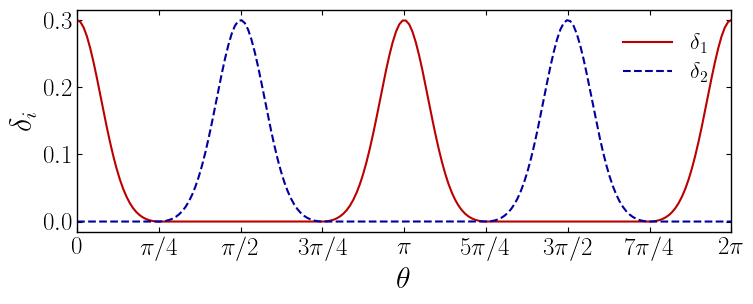

Figura de negatividades marginales vs θ guardada.


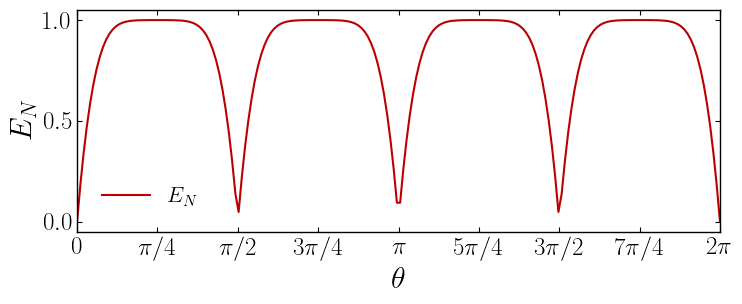

Figura de negatividad logarítmica vs θ guardada.


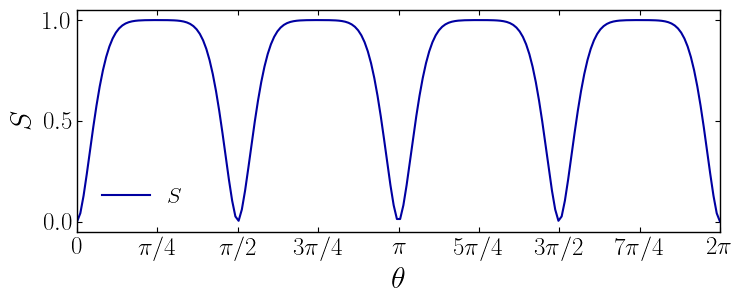

Figura de entropía de von Neumann vs θ guardada.


In [24]:
# ══════════════════════════════════════════════════════════════════
#  GRAFICACIÓN — δ1, δ2, E_N y S vs θ (Λ fijo)
# ══════════════════════════════════════════════════════════════════
_d = np.loadtxt(f'Resultados_aniso/marginal_negativity_vs_theta_var_{Lam_fix}.txt')
theta_arr, d1_arr, d2_arr = _d[:, 0], _d[:, 1], _d[:, 2]
EN_arr, S_arr = _d[:, 5], _d[:, 6]

C_MODE1 = plt.cm.seismic(0.88)   # rojo  → modo 1
C_MODE2 = plt.cm.seismic(0.12)   # azul  → modo 2
C_EN    = plt.cm.seismic(0.88)   # rojo  → E_N
C_S     = plt.cm.seismic(0.12)   # azul  → S
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

# ticks en múltiplos de π/4
tick_pos = np.array([0, 1, 2, 3, 4, 5, 6, 7, 8]) * np.pi/4
tick_lab = [r'$0$', r'$\pi/4$', r'$\pi/2$', r'$3\pi/4$', r'$\pi$',
            r'$5\pi/4$', r'$3\pi/2$', r'$7\pi/4$', r'$2\pi$']

def _fmt_theta(ax, ylabel):
    ax.set_xticks(tick_pos)
    ax.set_xticklabels(tick_lab)
    ax.set_xlim(theta_arr[0], theta_arr[-1])
    ax.set_xlabel(r'$\theta$')
    ax.set_ylabel(ylabel)
    ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                   left=True, right=True)
    ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False,
              loc='best', borderpad=0.6, handlelength=2.2, labelspacing=0.4)

# ── (1) negatividades marginales ──
fig, ax = plt.subplots(figsize=(8.0, 3.5))
ax.plot(theta_arr, d1_arr, '-',  color=C_MODE1, lw=1.5, label=r'$\delta_1$')
ax.plot(theta_arr, d2_arr, '--', color=C_MODE2, lw=1.5, label=r'$\delta_2$')
_fmt_theta(ax, r'$\delta_i$')
plt.tight_layout()
plt.savefig(f'Resultados_aniso/marginal_negativity_vs_theta_var_{Lam_fix}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura de negatividades marginales vs θ guardada.')

# ── (2) negatividad logarítmica ──
fig, ax = plt.subplots(figsize=(8.0, 3.5))
ax.plot(theta_arr, EN_arr, '-', color=C_EN, lw=1.5, label=r'$E_N$')
_fmt_theta(ax, r'$E_N$')
plt.tight_layout()
plt.savefig(f'Resultados_aniso/log_negativity_vs_theta_var_{Lam_fix}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura de negatividad logarítmica vs θ guardada.')

# ── (3) entropía de von Neumann ──
fig, ax = plt.subplots(figsize=(8.0, 3.5))
ax.plot(theta_arr, S_arr, '-', color=C_S, lw=1.5, label=r'$S$')
_fmt_theta(ax, r'$S$')
plt.tight_layout()
plt.savefig(f'Resultados_aniso/vn_entropy_vs_theta_var_{Lam_fix}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura de entropía de von Neumann vs θ guardada.')

In [ ]:
# ══════════════════════════════════════════════════════════════════
#  EJECUCIÓN — δ1, δ2, E_N y S vs θ (Λ fijo, variacional)
#    θ ∈ (0, 2π);  λ1 = Λcosθ, λ2 = Λsinθ
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
cv_val   = 1.0
Lam_fix  = 2*np.sqrt(2)   # Λ fijo
sector   = 'even'
sign     = +1
N_FOCK   = 50
r_thresh = 0.00001

nth      = 200
theta_arr = np.linspace(0.0, 2.0*np.pi, nth)

xvec = np.linspace(-5.5, 5.5, 301)
pvec = np.linspace(-3.0, 3.0, 251)

d1_arr = np.full(nth, np.nan); d2_arr = np.full(nth, np.nan)
n1_arr = np.full(nth, np.nan); n2_arr = np.full(nth, np.nan)
EN_arr = np.full(nth, np.nan); S_arr  = np.full(nth, np.nan)

_step10 = max(1, nth // 10)
for k, th in enumerate(theta_arr):
    lam1 = Lam_fix * np.cos(th)
    lam2 = Lam_fix * np.sin(th)
    psi, _ = cat_bimodal(lam1, lam2, cv_val, N_FOCK, sector=sector, sign=sign, r_thresh=r_thresh)

    EN_arr[k], S_arr[k] = entanglement_measures_var(psi, N_FOCK)
    d1_arr[k], d2_arr[k], n1_arr[k], n2_arr[k] = marginal_negativities(psi, xvec, pvec)

    if k == 0:
        print(f"θ={th:5.3f}  δ1={d1_arr[k]:.4f} δ2={d2_arr[k]:.4f}  "
              f"E_N={EN_arr[k]:.4f} S={S_arr[k]:.4f}  "
              f"(∫W1={n1_arr[k]:.3f}, ∫W2={n2_arr[k]:.3f})", flush=True)

    if (k+1) % _step10 == 0 or (k+1) == nth:
        print(f"  {100.0*(k+1)/nth:5.1f}%  θ={th:5.3f}  "
              f"δ1={d1_arr[k]:.4f} δ2={d2_arr[k]:.4f}  "
              f"E_N={EN_arr[k]:.4f} S={S_arr[k]:.4f}  "
              f"(∫W1={n1_arr[k]:.3f}, ∫W2={n2_arr[k]:.3f})", flush=True)

print("Barrido marginal θ (variacional) listo.")

os.makedirs('Resultados_aniso', exist_ok=True)
_out = np.column_stack([theta_arr, d1_arr, d2_arr, n1_arr, n2_arr, EN_arr, S_arr])
np.savetxt(f'Resultados_aniso/marginal_negativity_vs_theta_var_{Lam_fix}.txt',
           _out, fmt='%.8e', header='theta  delta1  delta2  norm1  norm2  E_N  S')
print(f'Guardado: marginal_negativity_vs_theta_var_{Lam_fix}.txt')

θ=0.000  δ1=0.0350 δ2=-0.0000  E_N=0.0000 S=-0.0000  (∫W1=1.000, ∫W2=1.000)
   10.0%  θ=0.600  δ1=0.0056 δ2=-0.0000  E_N=0.8989 S=0.5356  (∫W1=1.000, ∫W2=1.000)
   20.0%  θ=1.231  δ1=-0.0000 δ2=0.0239  E_N=0.6066 S=0.2759  (∫W1=1.000, ∫W2=1.000)
   30.0%  θ=1.863  δ1=-0.0000 δ2=0.0269  E_N=0.5308 S=0.2208  (∫W1=1.000, ∫W2=1.000)
   40.0%  θ=2.494  δ1=0.0032 δ2=-0.0000  E_N=0.9263 S=0.5636  (∫W1=1.000, ∫W2=1.000)
   50.0%  θ=3.126  δ1=0.0350 δ2=-0.0000  E_N=0.0291 S=0.0015  (∫W1=1.000, ∫W2=1.000)
   60.0%  θ=3.757  δ1=0.0047 δ2=-0.0000  E_N=0.9089 S=0.5458  (∫W1=1.000, ∫W2=1.000)
   70.0%  θ=4.389  δ1=-0.0000 δ2=0.0249  E_N=0.5820 S=0.2574  (∫W1=1.000, ∫W2=1.000)
   80.0%  θ=5.020  δ1=-0.0000 δ2=0.0259  E_N=0.5567 S=0.2390  (∫W1=1.000, ∫W2=1.000)
   90.0%  θ=5.652  δ1=0.0039 δ2=-0.0000  E_N=0.9181 S=0.5551  (∫W1=1.000, ∫W2=1.000)
  100.0%  θ=6.283  δ1=0.0350 δ2=-0.0000  E_N=0.0000 S=-0.0000  (∫W1=1.000, ∫W2=1.000)
Barrido marginal θ (variacional) listo.
Guardado: marginal_negativity_vs_

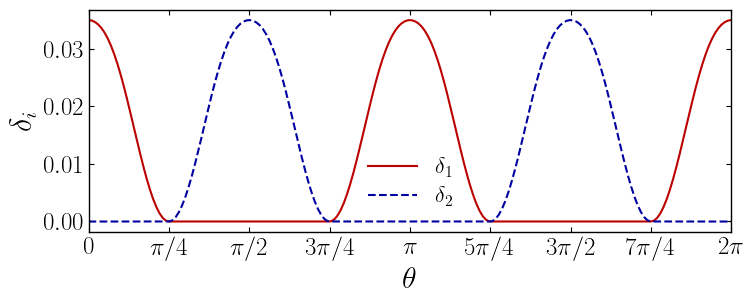

Figura de negatividades marginales vs θ guardada.


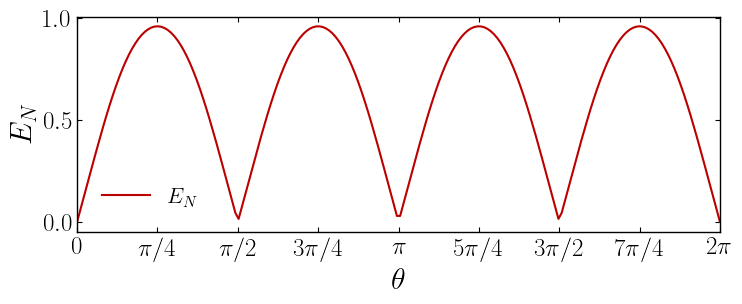

Figura de negatividad logarítmica vs θ guardada.


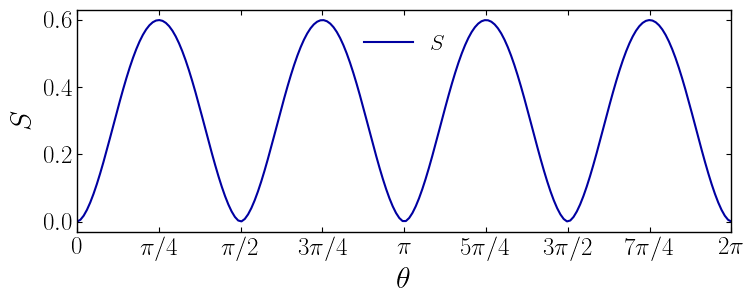

Figura de entropía de von Neumann vs θ guardada.


In [26]:
# ══════════════════════════════════════════════════════════════════
#  GRAFICACIÓN — δ1, δ2, E_N y S vs θ (Λ fijo)
# ══════════════════════════════════════════════════════════════════
_d = np.loadtxt(f'Resultados_aniso/marginal_negativity_vs_theta_var_{Lam_fix}.txt')
theta_arr, d1_arr, d2_arr = _d[:, 0], _d[:, 1], _d[:, 2]
EN_arr, S_arr = _d[:, 5], _d[:, 6]

C_MODE1 = plt.cm.seismic(0.88)   # rojo  → modo 1
C_MODE2 = plt.cm.seismic(0.12)   # azul  → modo 2
C_EN    = plt.cm.seismic(0.88)   # rojo  → E_N
C_S     = plt.cm.seismic(0.12)   # azul  → S
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

# ticks en múltiplos de π/4
tick_pos = np.array([0, 1, 2, 3, 4, 5, 6, 7, 8]) * np.pi/4
tick_lab = [r'$0$', r'$\pi/4$', r'$\pi/2$', r'$3\pi/4$', r'$\pi$',
            r'$5\pi/4$', r'$3\pi/2$', r'$7\pi/4$', r'$2\pi$']

def _fmt_theta(ax, ylabel):
    ax.set_xticks(tick_pos)
    ax.set_xticklabels(tick_lab)
    ax.set_xlim(theta_arr[0], theta_arr[-1])
    ax.set_xlabel(r'$\theta$')
    ax.set_ylabel(ylabel)
    ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                   left=True, right=True)
    ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False,
              loc='best', borderpad=0.6, handlelength=2.2, labelspacing=0.4)

# ── (1) negatividades marginales ──
fig, ax = plt.subplots(figsize=(8.0, 3.5))
ax.plot(theta_arr, d1_arr, '-',  color=C_MODE1, lw=1.5, label=r'$\delta_1$')
ax.plot(theta_arr, d2_arr, '--', color=C_MODE2, lw=1.5, label=r'$\delta_2$')
_fmt_theta(ax, r'$\delta_i$')
plt.tight_layout()
plt.savefig(f'Resultados_aniso/marginal_negativity_vs_theta_var_{Lam_fix}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura de negatividades marginales vs θ guardada.')

# ── (2) negatividad logarítmica ──
fig, ax = plt.subplots(figsize=(8.0, 3.5))
ax.plot(theta_arr, EN_arr, '-', color=C_EN, lw=1.5, label=r'$E_N$')
_fmt_theta(ax, r'$E_N$')
plt.tight_layout()
plt.savefig(f'Resultados_aniso/log_negativity_vs_theta_var_{Lam_fix}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura de negatividad logarítmica vs θ guardada.')

# ── (3) entropía de von Neumann ──
fig, ax = plt.subplots(figsize=(8.0, 3.5))
ax.plot(theta_arr, S_arr, '-', color=C_S, lw=1.5, label=r'$S$')
_fmt_theta(ax, r'$S$')
plt.tight_layout()
plt.savefig(f'Resultados_aniso/vn_entropy_vs_theta_var_{Lam_fix}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura de entropía de von Neumann vs θ guardada.')

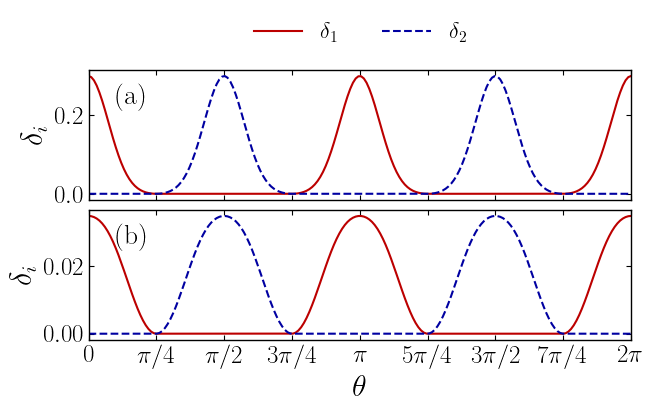

Figura dos paneles δ1,δ2 vs θ guardada.


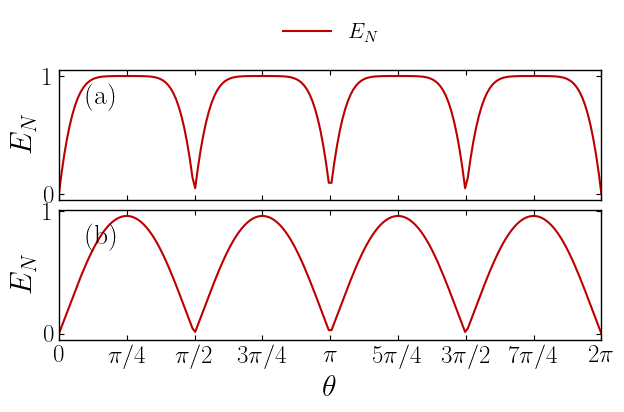

Figura dos paneles E_N vs θ guardada.


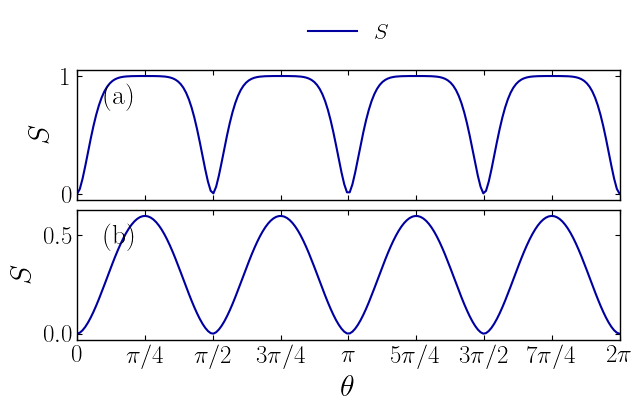

Figura dos paneles S vs θ guardada.


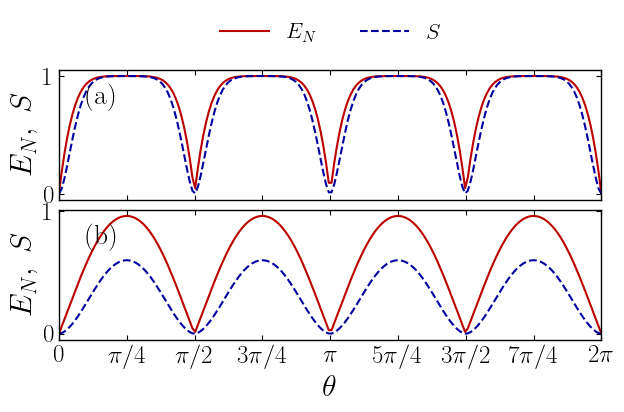

Figura dos paneles E_N y S superpuestas guardada.


In [27]:
# ══════════════════════════════════════════════════════════════════
#  FIGURAS 2 PANELES — δi, E_N y S vs θ para Λ=3√2 (a) y Λ=2√2 (b)
# ══════════════════════════════════════════════════════════════════

LAM_LIST = [3*np.sqrt(2), 2*np.sqrt(2)]

C_MODE1 = plt.cm.seismic(0.88)   # rojo  → modo 1
C_MODE2 = plt.cm.seismic(0.12)   # azul  → modo 2
C_EN    = plt.cm.seismic(0.88)   # rojo  → E_N
C_S     = plt.cm.seismic(0.12)   # azul  → S
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

# ── cargar (7 columnas: θ, δ1, δ2, ∫W1, ∫W2, E_N, S) ──
data = {}
for L in LAM_LIST:
    _d = np.loadtxt(f'Resultados_aniso/marginal_negativity_vs_theta_var_{L}.txt')
    data[L] = dict(th=_d[:, 0], d1=_d[:, 1], d2=_d[:, 2],
                   EN=_d[:, 5], S=_d[:, 6])

tick_pos = np.arange(0, 9) * np.pi/4
tick_lab = [r'$0$', r'$\pi/4$', r'$\pi/2$', r'$3\pi/4$', r'$\pi$',
            r'$5\pi/4$', r'$3\pi/2$', r'$7\pi/4$', r'$2\pi$']


def _twopanel(curves, ylabel, fname, figsize=(7.0, 3.5)):
    """curves: lista de (clave_en_data, estilo, color, etiqueta)."""
    fig = plt.figure(figsize=figsize)
    gs  = gridspec.GridSpec(2, 1, figure=fig, height_ratios=[1.0, 1.0], hspace=0.08)
    ax_a = fig.add_subplot(gs[0, 0])
    ax_b = fig.add_subplot(gs[1, 0], sharex=ax_a)

    for ax, L, lab in zip([ax_a, ax_b], LAM_LIST, [r'(a)', r'(b)']):
        d = data[L]
        for key, ls, col, leg in curves:
            ax.plot(d['th'], d[key], ls, color=col, lw=1.5, label=leg)
        ax.set_ylabel(ylabel)
        ax.set_xlim(d['th'][0], d['th'][-1])
        ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                       left=True, right=True)
        ax.text(0.05, 0.90, lab, transform=ax.transAxes,
                ha='left', va='top', fontsize=20)

    ax_a.tick_params(axis='x', labelbottom=False)
    ax_b.set_xticks(tick_pos)
    ax_b.set_xticklabels(tick_lab)
    ax_b.set_xlabel(r'$\theta$')

    handles, labels = ax_a.get_legend_handles_labels()
    ax_a.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, 1.02),
                ncol=len(curves), frameon=True, edgecolor='black', framealpha=0.0,
                fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

    plt.savefig(f'paper_figures/{fname}', bbox_inches='tight',
                transparent=False, dpi=300)
    plt.show()


# ── (1) negatividades marginales ──
_twopanel([('d1', '-',  C_MODE1, r'$\delta_1$'),
           ('d2', '--', C_MODE2, r'$\delta_2$')],
          r'$\delta_i$', 'marginal_negativity_vs_theta_var_twopanel.png')
print('Figura dos paneles δ1,δ2 vs θ guardada.')

# ── (2) negatividad logarítmica ──
_twopanel([('EN', '-', C_EN, r'$E_N$')],
          r'$E_N$', 'log_negativity_vs_theta_var_twopanel.png')
print('Figura dos paneles E_N vs θ guardada.')

# ── (3) entropía de von Neumann ──
_twopanel([('S', '-', C_S, r'$S$')],
          r'$S$', 'vn_entropy_vs_theta_var_twopanel.png')
print('Figura dos paneles S vs θ guardada.')

# ── (4) opcional: E_N y S superpuestas ──
_twopanel([('EN', '-',  C_EN, r'$E_N$'),
           ('S',  '--', C_S,  r'$S$')],
          r'$E_N,\ S$', 'entanglement_vs_theta_var_twopanel.png')
print('Figura dos paneles E_N y S superpuestas guardada.')

### Exact functions

In [ ]:
def MofLam_sweet_exact(g1, g2, omega0=1.0, n_sigma=4, floor=15, M_cap=55):
    lam_max = max(abs(g1), abs(g2)) / omega0
    M = int(np.ceil(lam_max**2 + n_sigma*lam_max)) 
    M = max(M, floor)          # piso para λ pequeño
    return min(M, M_cap)

def build_LF_hamiltonians_sweet(M, t, Delta, omega1, omega2, g1, g2):
    """
    Hamiltoniano LF en base de SITIO, en el SWEET SPOT (ε̃₁=ε̃₂=0).
    En el sweet spot ε_i = g_i²/ω_i, así que ε_i_eff = ε_i - g_i²/ω_i = 0
    y los bloques electrónicos no llevan offset diagonal.
    """
    nph  = M + 1
    n_ph = nph * nph
    lam1 = g1 / omega1
    lam2 = g2 / omega2

    D1p = disp_matrix(M,  lam1)
    D1m = disp_matrix(M, -lam1)
    D2p = disp_matrix(M,  lam2)
    D2m = disp_matrix(M, -lam2)

    ph_E = np.array([m1*omega1 + m2*omega2
                     for m1 in range(nph) for m2 in range(nph)])

    T_hop  = t     * np.kron(D1p, D2m)
    T_pair = Delta * np.kron(D1m, D2m)

    # Sector par (ε̃₁=ε̃₂=0 → ambos bloques con solo energía fotónica)
    H_e = np.zeros((2*n_ph, 2*n_ph))
    H_e[:n_ph, :n_ph] = np.diag(ph_E)
    H_e[n_ph:, n_ph:] = np.diag(ph_E)
    H_e[:n_ph, n_ph:] = T_pair
    H_e[n_ph:, :n_ph] = T_pair.T

    # Sector impar (ε̃₁=ε̃₂=0)
    H_o = np.zeros((2*n_ph, 2*n_ph))
    H_o[:n_ph, :n_ph] = np.diag(ph_E)
    H_o[n_ph:, n_ph:] = np.diag(ph_E)
    H_o[:n_ph, n_ph:] = T_hop
    H_o[n_ph:, :n_ph] = T_hop.T

    return H_e, H_o, nph, n_ph


def diagonalize_LF_sweet(M, t, Delta, omega1, omega2, g1, g2):
    H_e, H_o, nph, n_ph = build_LF_hamiltonians_sweet(
        M, t, Delta, omega1, omega2, g1, g2)
    ev_e, evec_e = eigh(H_e)
    ev_o, evec_o = eigh(H_o)
    return ev_e, evec_e, ev_o, evec_o, nph, n_ph

def exact_cat_bimodal(g1, g2, evec_ex, nph, n_ph, omega0=1.0, sign=+1, sector='even'):
    lam1 = g1 / omega0
    lam2 = g2 / omega0

    phi1 = evec_ex[:n_ph]
    phi2 = evec_ex[n_ph:]

    D1p = disp_matrix(M, +0.5*lam1); D1m = disp_matrix(M, -0.5*lam1)
    D2p = disp_matrix(M, +0.5*lam2); D2m = disp_matrix(M, -0.5*lam2)

    if sector == 'even':
        Dp = np.kron(D1p, D2p)   # φ2: (+λ1/2, +λ2/2)
        Dm = np.kron(D1m, D2m)   # φ1: (-λ1/2, -λ2/2)
    else:  # 'odd'
        Dp = np.kron(D1p, D2m)   # φ2: (+λ1/2, -λ2/2)
        Dm = np.kron(D1m, D2p)   # φ1: (-λ1/2, +λ2/2)

    cat = Dp @ phi2 + (-sign) * (Dm @ phi1)
    cat /= np.linalg.norm(cat)
    return cat

def wigner_joint_cut_exact(psi_ph, nph, uvec, vvec, plane='real', verbose=True, tag=''):
    """
    Wigner conjunta de dos modos W(α1,α2) en un corte 2D, para un
    vector de Fock de dos modos (dim nph², idx = m1*nph + m2).
      plane='real': Re(α1)=u vs Re(α2)=v   (Im=0)
      plane='imag': Im(α1)=u vs Im(α2)=v   (Re=0)
    W = (2/π)² Σ_{n1,n2}(-1)^{n1+n2}|<n1 n2|D1†(α1)⊗D2†(α2)|ψ>|²
    Con ψ como matriz [n1,n2]: D1† por la izquierda, D2†^T por la derecha.
    """
    psi_mat = psi_ph.reshape(nph, nph)          # [m1, m2]
    par = (-1.0) ** np.arange(nph)
    Par = np.outer(par, par)

    def _Ddag(val):
        a = (val + 0j) if plane == 'real' else (1j*val)
        return disp_matrix_complex(nph-1, -a)   # D†(α) = D(-α)

    Ddag_u = [_Ddag(u) for u in uvec]
    Ddag_vT = [_Ddag(v).T for v in vvec]

    pref = (2.0/np.pi)**2
    nu = len(uvec)
    step10 = max(1, nu // 10)

    W = np.zeros((len(vvec), len(uvec)))
    for iu in range(nu):
        left = Ddag_u[iu] @ psi_mat             # [n1', m2]
        for iv in range(len(vvec)):
            tpsi = left @ Ddag_vT[iv]           # [n1', n2']
            W[iv, iu] = pref * np.sum(Par * (np.abs(tpsi)**2))
        if verbose and ((iu+1) % step10 == 0 or (iu+1) == nu):
            print(f"      [{tag}] {100.0*(iu+1)/nu:5.1f}%", flush=True)
    return W


def wigner_joint_and_cuts_exact(psi_ph, nph, uvec, vvec, plane='real', verbose=True, tag=''):
    W = wigner_joint_cut_exact(psi_ph, nph, uvec, vvec, plane=plane, verbose=verbose, tag=tag)
    iv0 = np.argmin(np.abs(vvec))
    iu0 = np.argmin(np.abs(uvec))
    return W, W[iv0, :], W[:, iu0]

In [10]:
def reduced_dm_mode_exact(psi_ph, nph, mode):
    """Matriz densidad reducida de un modo, desde el vector de Fock de dos modos.
       psi_ph: vector dim nph² (idx = m1*nph + m2).
       mode=1 → ρ1 = Tr_2 (contrae m2);  mode=2 → ρ2 = Tr_1 (contrae m1).
       Devuelve matriz nph×nph."""
    psi_mat = psi_ph.reshape(nph, nph)          # [m1, m2]
    if mode == 1:
        rho = psi_mat @ psi_mat.conj().T        # ρ1[m1,m1'] = Σ_m2 ψ[m1,m2]ψ*[m1',m2]
    else:
        rho = psi_mat.T @ psi_mat.conj()        # ρ2[m2,m2'] = Σ_m1 ψ[m1,m2]ψ*[m1,m2']
    return rho


def wigner_dm_negativity(rho, xvec, pvec, verbose=False, n_jobs=-1):
    """Wigner de un modo de una matriz densidad ρ (nph×nph) + su negatividad.
       W(α) = (2/π) Σ_n (-1)^n <n|D†(α) ρ D(α)|n>
            = (2/π) Σ_n (-1)^n [D†(α) ρ D(α)]_{nn}
       Vectorizado por punto: para cada α, calcula D(-α) (=D†(α)) y la forma
       cuadrática. Reusa disp_matrix_complex."""
    N = rho.shape[0]
    parity = (-1.0) ** np.arange(N)

    def _row(p):
        row = np.zeros(len(xvec))
        for ix, x in enumerate(xvec):
            alpha = (x + 1j*p)
            Dd = disp_matrix_complex(N-1, -alpha)      # D†(α) = D(-α)
            # [D† ρ D]_{nn} = (D† ρ D)diag ; D = Dd†
            M_ = Dd @ rho @ Dd.conj().T
            row[ix] = (2.0/np.pi) * np.sum(parity * np.diag(M_).real)
        return row

    if n_jobs == 1:
        W = np.array([_row(p) for p in pvec])
    else:
        import joblib
        if verbose:
            print(f"   Wigner reducida: {len(pvec)} filas en paralelo ...", flush=True)
        W = np.array(joblib.Parallel(n_jobs=n_jobs)(
            joblib.delayed(_row)(p) for p in pvec))

    if not hasattr(np, 'trapz'):
        np.trapz = np.trapezoid
    norm_check = np.trapz(np.trapz(W, xvec, axis=1), pvec)
    delta = 0.5 * (np.trapz(np.trapz(np.abs(W), xvec, axis=1), pvec) - 1.0)
    return delta, norm_check


def marginal_negativities_exact(psi_ph, nph, xvec, pvec, n_jobs=-1):
    """δ1, δ2 marginales del estado bimodal exacto (vector de Fock)."""
    rho1 = reduced_dm_mode_exact(psi_ph, nph, 1)
    rho2 = reduced_dm_mode_exact(psi_ph, nph, 2)
    d1, n1 = wigner_dm_negativity(rho1, xvec, pvec, n_jobs=n_jobs)
    d2, n2 = wigner_dm_negativity(rho2, xvec, pvec, n_jobs=n_jobs)
    return d1, d2, n1, n2

In [11]:
def pad_state(psi_ph, nph_old, nph_new):
    """Expande el estado de dos modos de nph_old² a nph_new² con ceros en Fock altos."""
    pm = psi_ph.reshape(nph_old, nph_old)
    pm_new = np.zeros((nph_new, nph_new), dtype=complex)
    pm_new[:nph_old, :nph_old] = pm
    return pm_new.reshape(-1)


def marginal_negativities_exact(psi_ph, nph, xvec, pvec, nph_wig=56, n_jobs=-1):
    """δ1, δ2 marginales. Hace padding del estado a nph_wig para Wigner fiel
       (D(α) unitaria en el borde de la malla) sin encarecer la diagonalización."""
    if nph_wig > nph:
        psi_ph = pad_state(psi_ph, nph, nph_wig)
        nph = nph_wig
    pm = psi_ph.reshape(nph, nph)
    rho1 = pm @ pm.conj().T
    rho2 = pm.T @ pm.conj()
    d1, n1 = wigner_dm_negativity(rho1, xvec, pvec, n_jobs=n_jobs)
    d2, n2 = wigner_dm_negativity(rho2, xvec, pvec, n_jobs=n_jobs)
    return d1, d2, n1, n2

### Exact WF

#### WF plots

In [71]:
# ══════════════════════════════════════════════════════════════════
#  EJECUCIÓN — 4 gatos bimodales EXACTOS (base sitio) + Wigner conjunta
# ══════════════════════════════════════════════════════════════════
omega0  = 1.0
cv_val  = 1.0                              # t = Δ = cv
Lam     = 3*np.sqrt(2)
theta   = np.pi/2.0
g1_v    = Lam*np.cos(theta)                # g_i = λ_i·ω0 (con ω0=1)
g2_v    = Lam*np.sin(theta)
M       = MofLam_sweet_exact(g1_v, g2_v, omega0=1.0, M_cap=45)

# diagonalizar en base de SITIO, sweet spot
ev_e, evec_e, ev_o, evec_o, nph, n_ph = diagonalize_LF_sweet(M, cv_val, cv_val, omega0, omega0, g1_v, g2_v)

uvec = np.linspace(-4.0, 4.0, 251)
vvec = np.linspace(-4.0, 4.0, 251)

# sector par usa evec_e (ground), impar usa evec_o
sectors = {'even': evec_e[:, 0], 'odd': evec_o[:, 0]}

results = {}
for sector, vec in sectors.items():
    for sign in [+1, -1]:
        psi_ph = exact_cat_bimodal(g1_v, g2_v, vec, nph, n_ph, omega0, sign=sign, sector=sector)
        print(f"{sector} sign={sign:+d}: norma={np.linalg.norm(psi_ph):.6f}", flush=True)

        lbl = f"{sector}{'+' if sign>0 else '-'}"
        Wr, cr_u, cr_v = wigner_joint_and_cuts_exact(psi_ph, nph, uvec, vvec, plane='real', tag=lbl+' Re')
        Wi, ci_u, ci_v = wigner_joint_and_cuts_exact(psi_ph, nph, uvec, vvec, plane='imag', tag=lbl+' Im')
        results[(sector, sign)] = dict(W_real=Wr, cr_u=cr_u, cr_v=cr_v, W_imag=Wi, ci_u=ci_u, ci_v=ci_v)

print("Ejecución gatos bimodales exactos lista.")

even sign=+1: norma=1.000000
      [even+ Re]  10.0%
      [even+ Re]  19.9%
      [even+ Re]  29.9%
      [even+ Re]  39.8%
      [even+ Re]  49.8%
      [even+ Re]  59.8%
      [even+ Re]  69.7%
      [even+ Re]  79.7%
      [even+ Re]  89.6%
      [even+ Re]  99.6%
      [even+ Re] 100.0%
      [even+ Im]  10.0%
      [even+ Im]  19.9%
      [even+ Im]  29.9%
      [even+ Im]  39.8%
      [even+ Im]  49.8%
      [even+ Im]  59.8%
      [even+ Im]  69.7%
      [even+ Im]  79.7%
      [even+ Im]  89.6%
      [even+ Im]  99.6%
      [even+ Im] 100.0%
even sign=-1: norma=1.000000
      [even- Re]  10.0%
      [even- Re]  19.9%
      [even- Re]  29.9%
      [even- Re]  39.8%
      [even- Re]  49.8%
      [even- Re]  59.8%
      [even- Re]  69.7%
      [even- Re]  79.7%
      [even- Re]  89.6%
      [even- Re]  99.6%
      [even- Re] 100.0%
      [even- Im]  10.0%
      [even- Im]  19.9%
      [even- Im]  29.9%
      [even- Im]  39.8%
      [even- Im]  49.8%
      [even- Im]  59.8%
      

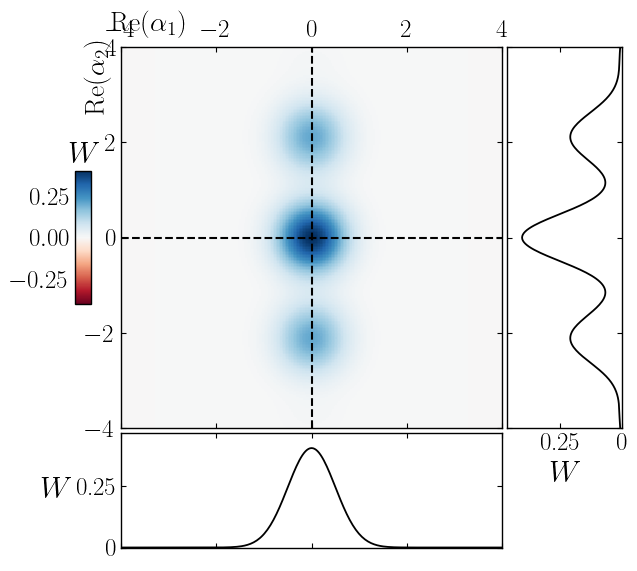

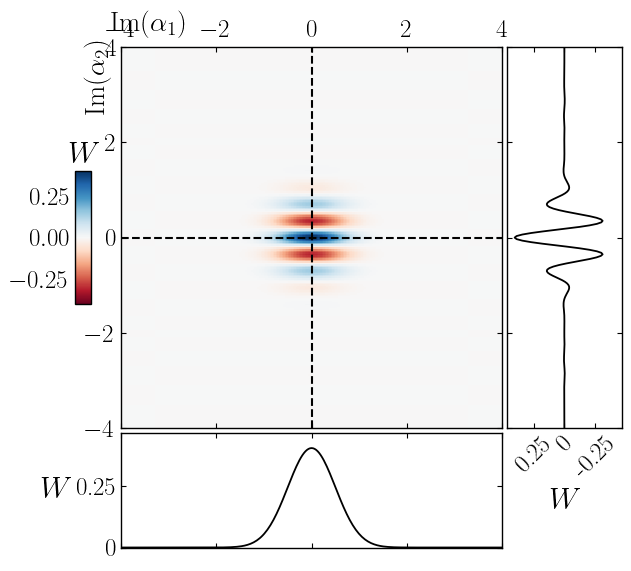

Figuras exactas even_p (ReRe + ImIm) listas.


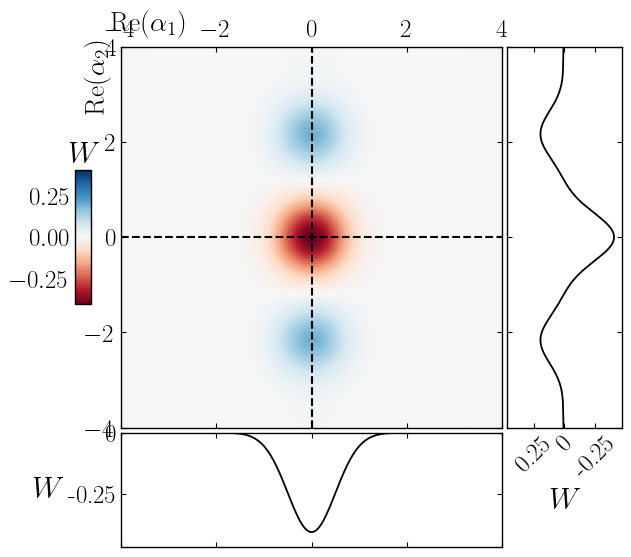

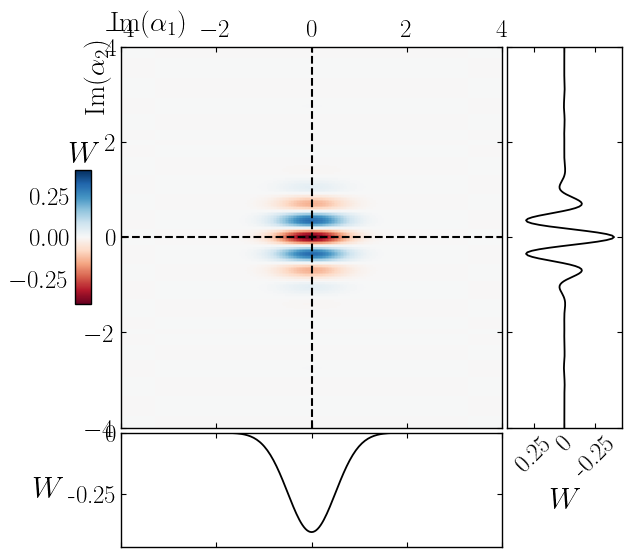

Figuras exactas even_m (ReRe + ImIm) listas.


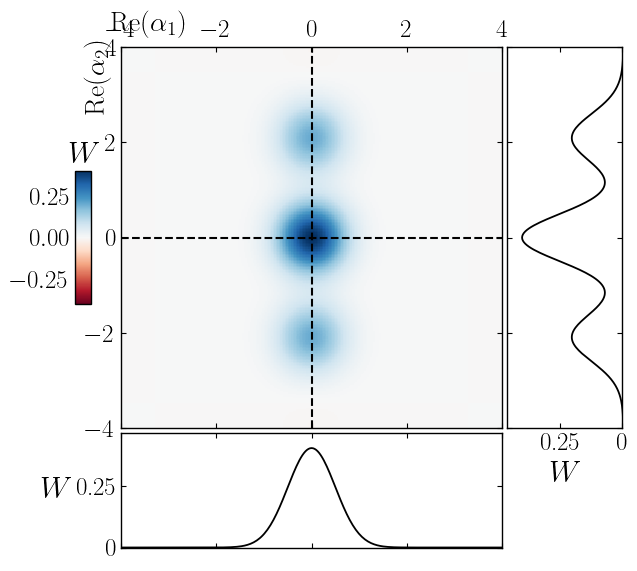

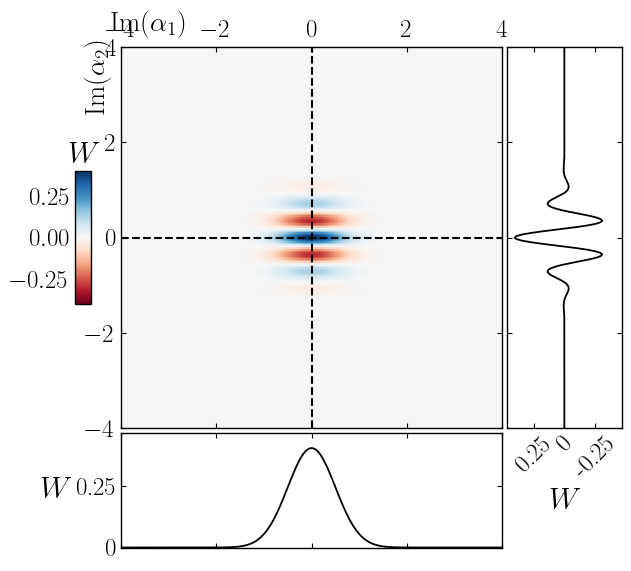

Figuras exactas odd_p (ReRe + ImIm) listas.


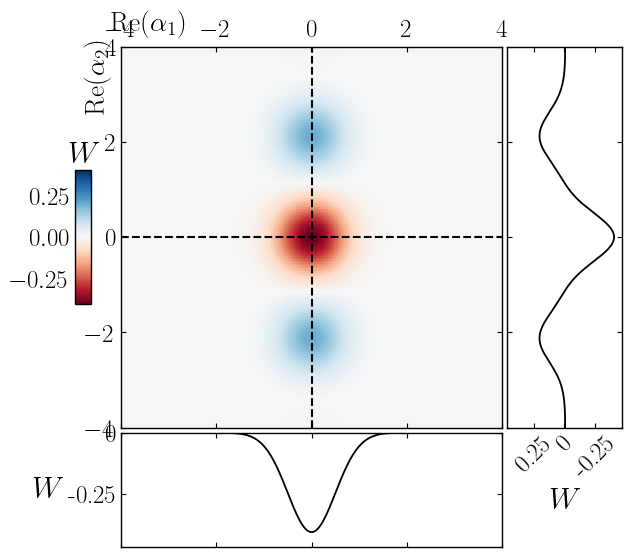

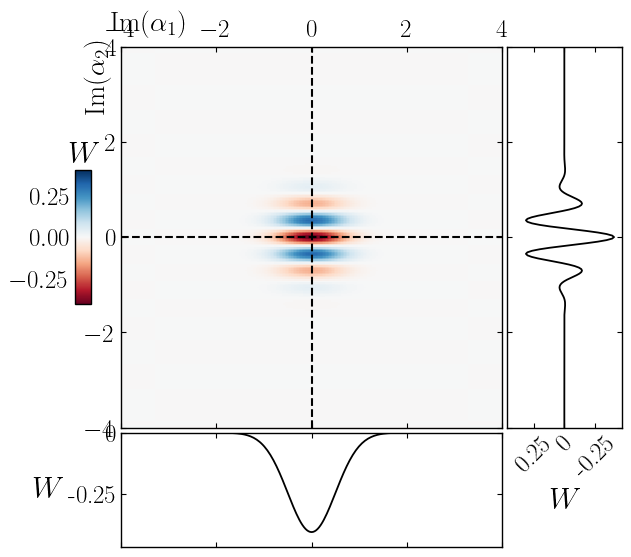

Figuras exactas odd_m (ReRe + ImIm) listas.


In [72]:
# ══════════════════════════════════════════════════════════════════
#  GRAFICACIÓN — 2 planos por gato bimodal exacto (Re1-Re2 y Im1-Im2)
#  Reusa plot_wigner_single_joint con etiquetas por plano.
# ══════════════════════════════════════════════════════════════════
cases = [('even', +1), ('even', -1), ('odd', +1), ('odd', -1)]

for sector, sign in cases:
    d = results[(sector, sign)]
    tag = f"{sector}_{'p' if sign>0 else 'm'}"

    # plano Re(α1) vs Re(α2)
    fig = plot_wigner_single_joint(
        d['W_real'], d['cr_u'], d['cr_v'],
        xlabel=r'$\mathrm{Re}(\alpha_1)$', ylabel=r'$\mathrm{Re}(\alpha_2)$',
        xvec=uvec, pvec=vvec,  labeleven=True, figsize=(6.5, 6.5), axis_lim=(-4.0, 4.0))
    fig.savefig(f'Resultados_aniso/wigner_bimodal_exact_{tag}_ReRe.png', bbox_inches='tight', transparent=False, dpi=300)
    plt.show()

    # plano Im(α1) vs Im(α2)
    fig = plot_wigner_single_joint(
        d['W_imag'], d['ci_u'], d['ci_v'],
        xlabel=r'$\mathrm{Im}(\alpha_1)$', ylabel=r'$\mathrm{Im}(\alpha_2)$',
        xvec=uvec, pvec=vvec, labeleven=True, figsize=(6.5, 6.5), axis_lim=(-4.0, 4.0))
    fig.savefig(f'Resultados_aniso/wigner_bimodal_exact_{tag}_ImIm.png', bbox_inches='tight', transparent=False, dpi=300)
    plt.show()

    print(f'Figuras exactas {tag} (ReRe + ImIm) listas.')

#### Marginal negativity

In [ ]:
# ══════════════════════════════════════════════════════════════════
#  EJECUCIÓN — negatividades marginales δ1, δ2 vs θ (Λ fijo, EXACTO sitio)
#    θ ∈ (0, π);  λ1 = Λcosθ, λ2 = Λsinθ  →  g_i = λ_i·ω0
# ══════════════════════════════════════════════════════════════════
omega0   = 1.0
cv_val   = 1.0
Lam_fix  = 3*np.sqrt(2)       # Λ fijo
sector   = 'even'
sign     = +1
nph_wig  = 85              

nth      = 50
theta_arr = np.linspace(0.0, np.pi, nth)

xvec = np.linspace(-4.2, 4.2, 251)
pvec = np.linspace(-3.0, 3.0, 251)

d1_arr = np.full(nth, np.nan); d2_arr = np.full(nth, np.nan)
n1_arr = np.full(nth, np.nan); n2_arr = np.full(nth, np.nan)

_step10 = max(1, nth // 10)
for k, th in enumerate(theta_arr):
    g1 = Lam_fix * np.cos(th)
    g2 = Lam_fix * np.sin(th)
    M = min(MofLam_sweet_exact(g1, g2, omega0=omega0, M_cap=45) + 25, 55)   # M de diagonalización (barato)
    ev_e, evec_e, ev_o, evec_o, nph, n_ph = diagonalize_LF_sweet(M, cv_val, cv_val, omega0, omega0, g1, g2)
    vec = evec_e[:, 0] if sector == 'even' else evec_o[:, 0]
    psi_ph = exact_cat_bimodal(g1, g2, vec, nph, n_ph, omega0, sign=sign, sector=sector)

    # marginal con padding a nph_wig para Wigner fiel
    d1_arr[k], d2_arr[k], n1_arr[k], n2_arr[k] = marginal_negativities_exact(psi_ph, nph, xvec, pvec, nph_wig=nph_wig)
    if k == 0:
        print(f" θ={th:5.3f}  δ1={d1_arr[k]:.4f} δ2={d2_arr[k]:.4f} " f"(∫W1={n1_arr[k]:.3f}, ∫W2={n2_arr[k]:.3f})", flush=True)
    if (k+1) % _step10 == 0 or (k+1) == nth:
        print(f"  {100.0*(k+1)/nth:5.1f}%  θ={th:5.3f}  " f"δ1={d1_arr[k]:.4f} δ2={d2_arr[k]:.4f} " f"(∫W1={n1_arr[k]:.3f}, ∫W2={n2_arr[k]:.3f})", flush=True)

print("Barrido marginal θ (exacto) listo.")

os.makedirs('Resultados_aniso', exist_ok=True)
_out = np.column_stack([theta_arr, d1_arr, d2_arr, n1_arr, n2_arr])
np.savetxt(f'Resultados_aniso/marginal_negativity_vs_theta_exact_{Lam_fix}.txt', _out, fmt='%.8e', header='theta  delta1  delta2  norm1  norm2')
print(f'Guardado: marginal_negativity_vs_theta_exact_{Lam_fix}.txt')

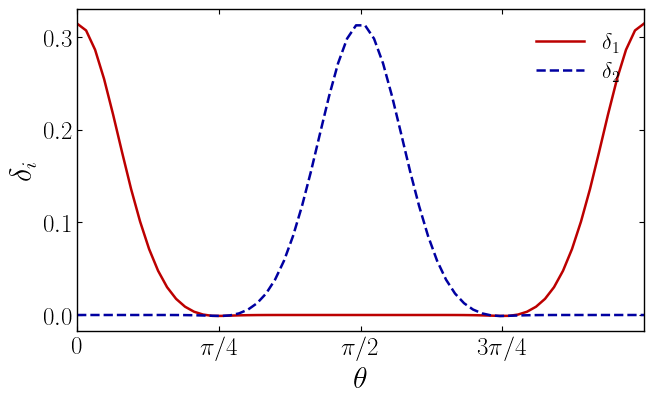

Figura de negatividades marginales vs θ guardada.


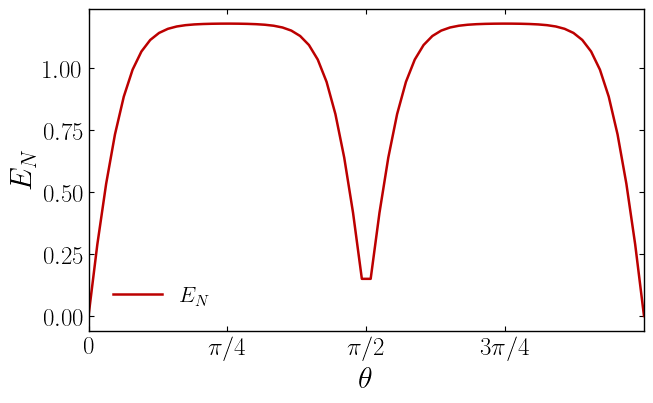

Figura de negatividad logarítmica vs θ guardada.


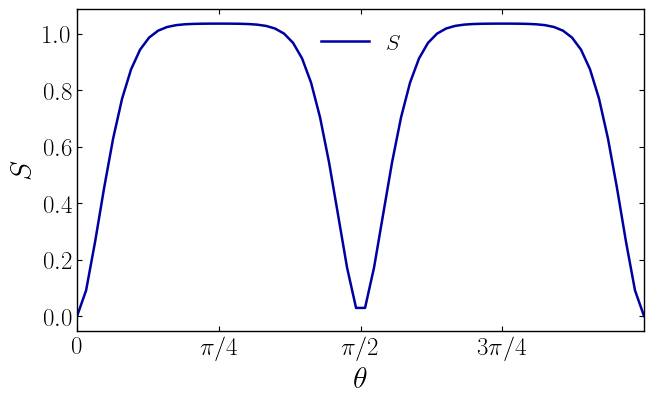

Figura de entropía de von Neumann vs θ guardada.


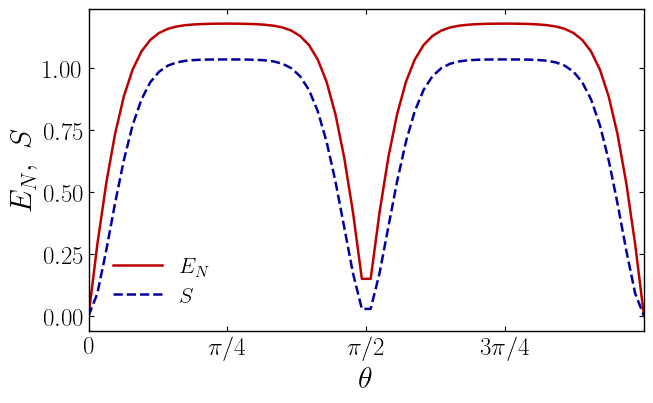

Figura de E_N y S vs θ guardada.


In [29]:
Lam_fix = 3*np.sqrt(2)  # Λ fijo

# ══════════════════════════════════════════════════════════════════
#  GRAFICACIÓN — δ1, δ2, E_N y S vs θ (Λ fijo, exacto)
# ══════════════════════════════════════════════════════════════════
_d = np.loadtxt(f'Resultados_aniso/marginal_negativity_vs_theta_exact_{Lam_fix}.txt')
theta_arr, d1_arr, d2_arr = _d[:, 0], _d[:, 1], _d[:, 2]
EN_arr, S_arr = _d[:, 5], _d[:, 6]

C_MODE1 = plt.cm.seismic(0.88)   # rojo  → modo 1
C_MODE2 = plt.cm.seismic(0.12)   # azul  → modo 2
C_EN    = plt.cm.seismic(0.88)   # rojo  → E_N
C_S     = plt.cm.seismic(0.12)   # azul  → S
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

tick_pos = np.array([0, 1, 2, 3, 4]) * np.pi/4
tick_lab = [r'$0$', r'$\pi/4$', r'$\pi/2$', r'$3\pi/4$', r'$\pi$']

def _fmt(ax, ylabel):
    ax.set_xticks(tick_pos)
    ax.set_xticklabels(tick_lab)
    ax.set_xlim(theta_arr[0], theta_arr[-1])
    ax.set_xlabel(r'$\theta$')
    ax.set_ylabel(ylabel)
    ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                   left=True, right=True)
    ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False,
              loc='best', borderpad=0.6, handlelength=2.2, labelspacing=0.4)

# ── (1) negatividades marginales ──
fig, ax = plt.subplots(figsize=(7.0, 4.5))
ax.plot(theta_arr, d1_arr, '-',  color=C_MODE1, lw=1.8, label=r'$\delta_1$')
ax.plot(theta_arr, d2_arr, '--', color=C_MODE2, lw=1.8, label=r'$\delta_2$')
_fmt(ax, r'$\delta_i$')
plt.tight_layout()
plt.savefig(f'Resultados_aniso/marginal_negativity_vs_theta_exact_{Lam_fix}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura de negatividades marginales vs θ guardada.')

# ── (2) negatividad logarítmica ──
fig, ax = plt.subplots(figsize=(7.0, 4.5))
ax.plot(theta_arr, EN_arr, '-', color=C_EN, lw=1.8, label=r'$E_N$')
_fmt(ax, r'$E_N$')
plt.tight_layout()
plt.savefig(f'Resultados_aniso/log_negativity_vs_theta_exact_{Lam_fix}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura de negatividad logarítmica vs θ guardada.')

# ── (3) entropía de von Neumann ──
fig, ax = plt.subplots(figsize=(7.0, 4.5))
ax.plot(theta_arr, S_arr, '-', color=C_S, lw=1.8, label=r'$S$')
_fmt(ax, r'$S$')
plt.tight_layout()
plt.savefig(f'Resultados_aniso/vn_entropy_vs_theta_exact_{Lam_fix}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura de entropía de von Neumann vs θ guardada.')

# ── (4) E_N y S superpuestas ──
fig, ax = plt.subplots(figsize=(7.0, 4.5))
ax.plot(theta_arr, EN_arr, '-',  color=C_EN, lw=1.8, label=r'$E_N$')
ax.plot(theta_arr, S_arr,  '--', color=C_S,  lw=1.8, label=r'$S$')
_fmt(ax, r'$E_N,\ S$')
plt.tight_layout()
plt.savefig(f'Resultados_aniso/entanglement_vs_theta_exact_{Lam_fix}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura de E_N y S vs θ guardada.')

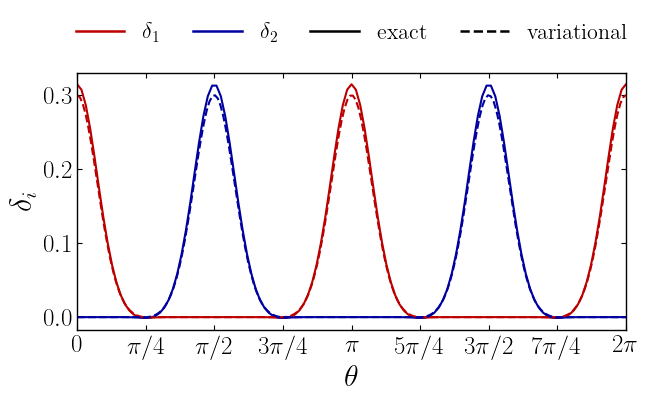

Figura comparativa δ1,δ2 exacto vs variacional guardada.


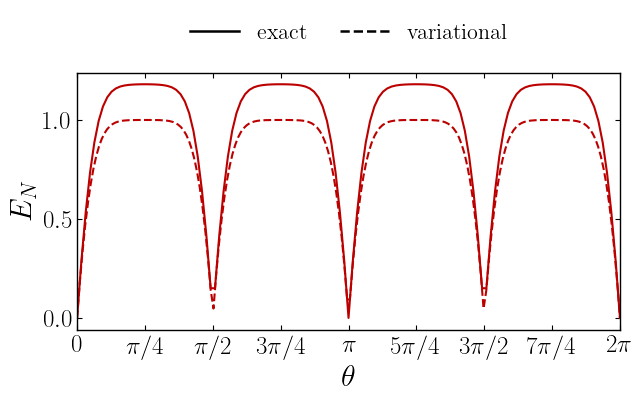

Figura comparativa E_N exacto vs variacional guardada.


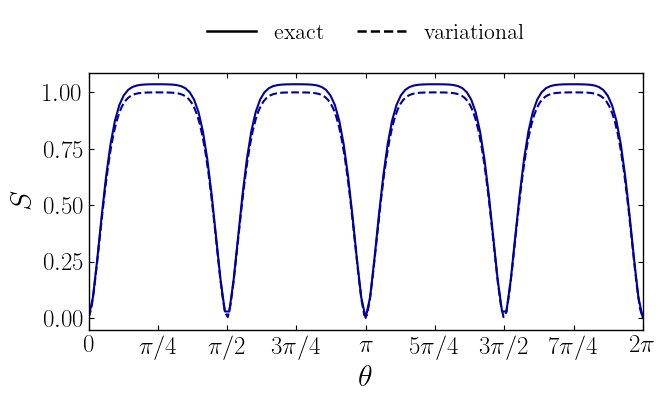

Figura comparativa S exacto vs variacional guardada.


In [31]:
# ══════════════════════════════════════════════════════════════════
#  GRAFICACIÓN — δi, E_N y S vs θ: exacto (sólido) vs variacional (dashed)
#  El exacto se calculó en [0,π] y se replica en [π,2π] por periodicidad
#  (θ→θ+π equivale a λi→−λi, que deja Λ y todas las medidas invariantes)
# ══════════════════════════════════════════════════════════════════
_ex = np.loadtxt(f'Resultados_aniso/marginal_negativity_vs_theta_exact_{Lam_fix}.txt')
_va = np.loadtxt(f'Resultados_aniso/marginal_negativity_vs_theta_var_{Lam_fix}.txt')

th_ex, d1_ex, d2_ex = _ex[:, 0], _ex[:, 1], _ex[:, 2]
EN_ex, S_ex = _ex[:, 5], _ex[:, 6]
th_va, d1_va, d2_va = _va[:, 0], _va[:, 1], _va[:, 2]
EN_va, S_va = _va[:, 5], _va[:, 6]

# replicar el exacto en [π, 2π]  (se omite el primer punto para no duplicar θ=π)
th_ex = np.concatenate([th_ex, th_ex[1:] + np.pi])
d1_ex = np.concatenate([d1_ex, d1_ex[1:]])
d2_ex = np.concatenate([d2_ex, d2_ex[1:]])
EN_ex = np.concatenate([EN_ex, EN_ex[1:]])
S_ex  = np.concatenate([S_ex,  S_ex[1:]])

C_MODE1 = plt.cm.seismic(0.88)   # rojo  → modo 1 / E_N
C_MODE2 = plt.cm.seismic(0.12)   # azul  → modo 2 / S
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

tick_pos = np.array([0, 1, 2, 3, 4, 5, 6, 7, 8]) * np.pi/4
tick_lab = [r'$0$', r'$\pi/4$', r'$\pi/2$', r'$3\pi/4$', r'$\pi$',
            r'$5\pi/4$', r'$3\pi/2$', r'$7\pi/4$', r'$2\pi$']

_h_method = [mlines.Line2D([], [], color='k', ls='-',  lw=1.8, label='exact'),
             mlines.Line2D([], [], color='k', ls='--', lw=1.8, label='variational')]

def _fmt(ax, ylabel, leg):
    ax.set_xticks(tick_pos)
    ax.set_xticklabels(tick_lab)
    ax.set_xlim(0.0, 2*np.pi)
    ax.set_xlabel(r'$\theta$')
    ax.set_ylabel(ylabel)
    ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                   left=True, right=True)
    ax.legend(handles=leg, loc='lower center', bbox_to_anchor=(0.5, 1.02),
              ncol=len(leg), frameon=True, edgecolor='black', framealpha=0.0,
              fancybox=False, borderpad=0.6, handlelength=2.2,
              labelspacing=0.4, columnspacing=1.5)

# ── (1) negatividades marginales ──
fig, ax = plt.subplots(figsize=(7.0, 4.5))
ax.plot(th_ex, d1_ex, '-',  color=C_MODE1, lw=1.5)
ax.plot(th_ex, d2_ex, '-',  color=C_MODE2, lw=1.5)
ax.plot(th_va, d1_va, '--', color=C_MODE1, lw=1.5)
ax.plot(th_va, d2_va, '--', color=C_MODE2, lw=1.5)
leg = [mlines.Line2D([], [], color=C_MODE1, lw=1.8, label=r'$\delta_1$'),
       mlines.Line2D([], [], color=C_MODE2, lw=1.8, label=r'$\delta_2$')] + _h_method
_fmt(ax, r'$\delta_i$', leg)
plt.tight_layout()
plt.savefig(f'Resultados_aniso/marginal_negativity_vs_theta_compare_{Lam_fix}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura comparativa δ1,δ2 exacto vs variacional guardada.')

# ── (2) negatividad logarítmica ──
fig, ax = plt.subplots(figsize=(7.0, 4.5))
ax.plot(th_ex, EN_ex, '-',  color=C_MODE1, lw=1.5)
ax.plot(th_va, EN_va, '--', color=C_MODE1, lw=1.5)
_fmt(ax, r'$E_N$', _h_method)
plt.tight_layout()
plt.savefig(f'Resultados_aniso/log_negativity_vs_theta_compare_{Lam_fix}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura comparativa E_N exacto vs variacional guardada.')

# ── (3) entropía de von Neumann ──
fig, ax = plt.subplots(figsize=(7.0, 4.5))
ax.plot(th_ex, S_ex, '-',  color=C_MODE2, lw=1.5)
ax.plot(th_va, S_va, '--', color=C_MODE2, lw=1.5)
_fmt(ax, r'$S$', _h_method)
plt.tight_layout()
plt.savefig(f'Resultados_aniso/vn_entropy_vs_theta_compare_{Lam_fix}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print('Figura comparativa S exacto vs variacional guardada.')

# Figures

Cargado r1_odd, cv=1.0
  lam1: (200,), lam2: (200,), data: (200, 200)
  rango: [-1.5000, 0.0000]


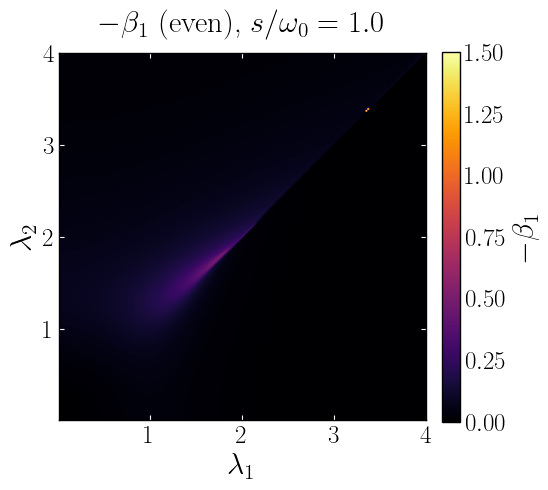

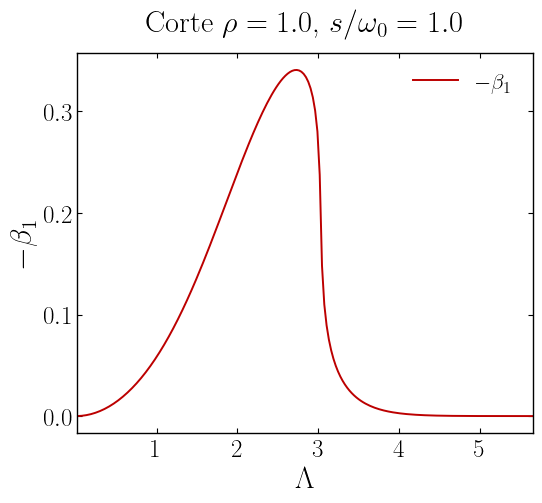

In [ ]:
# ══════════════════════════════════════════════════════════════════
#  EJEMPLO DE LECTURA — alpha1_even, cv=1.0
#  Carga desde los .txt guardados, reconstruye la malla, heatmap + corte ρ=1
# ══════════════════════════════════════════════════════════════════

# ── Parámetros que identifican la corrida (deben coincidir con el guardado) ──
omega0   = 1.0
eps1_val = 0.25
eps2_val = 0.25
n_lam    = 200
cv       = 1.0

# etiquetas EXACTAS como en la celda de guardado
# En la celda que guarda los archivos, el prefijo del nombre es cv_list[0] = 0.5
param_label = (f"{0.5:.1f}_omega0{omega0:.1f}"
               f"_eps1{eps1_val:.2f}_eps2{eps2_val:.2f}"
               f"_nl1_{n_lam}_nl2_{n_lam}")
root_label  = (f"omega0{omega0:.1f}"
               f"_eps1{eps1_val:.2f}_eps2{eps2_val:.2f}"
               f"_nl1_{n_lam}_nl2_{n_lam}")
root_dir = f"variational_params_{root_label}"
cv_dir   = os.path.join(root_dir, f"cv_{cv}")

# ── Cargar coordenadas y el mapa ────────────────────────────────
lam1_arr = np.loadtxt(os.path.join(cv_dir, f"coord_lambda1_{param_label}.txt"))
lam2_arr = np.loadtxt(os.path.join(cv_dir, f"coord_lambda2_{param_label}.txt"))
data     = np.loadtxt(os.path.join(cv_dir, f"r1_odd_{param_label}.txt"))
# data tiene forma [i2, j1]: filas = lam2, columnas = lam1

print(f"Cargado r1_odd, cv={cv}")
print(f"  lam1: {lam1_arr.shape}, lam2: {lam2_arr.shape}, data: {data.shape}")
print(f"  rango: [{np.nanmin(data):.4f}, {np.nanmax(data):.4f}]")

# ── HEATMAP ─────────────────────────────────────────────────────
# graficar -alpha1 (positivo por convención), inferno 0→max
plot_data = -data
extent = [lam1_arr[0], lam1_arr[-1], lam2_arr[0], lam2_arr[-1]]
vmax = np.nanmax(plot_data)

fig, ax = plt.subplots(figsize=(6, 5.5))
im = ax.imshow(plot_data, origin='lower', aspect='equal', extent=extent,
               cmap='inferno', vmin=0.0, vmax=vmax)
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=r'$-\beta_1$')
ax.set_xlabel(r'$\lambda_1$'); ax.set_ylabel(r'$\lambda_2$')
ax.tick_params(axis='both', direction='in', bottom=True, top=True,
               right=True, left=True, color='white')
ax.set_title(rf'$-\beta_1$ (even),  $s/\omega_0={cv}$', pad=15)
plt.tight_layout()
plt.show()

# ── CORTE λ₂ = ρ·λ₁  con ρ=1.0 ──────────────────────────────────
def cut_along_rho(data2d, lam1_arr, lam2_arr, rho, n_cut=200):
    """Extrae data2d[i2,j1] (filas=lam2, cols=lam1) sobre la línea λ₂=ρλ₁.
    Devuelve (Λ, valores) con Λ=√(λ₁²+λ₂²) del corte."""
    interp = RegularGridInterpolator((lam2_arr, lam1_arr), data2d,
                                     bounds_error=False, fill_value=np.nan)
    l1max = min(lam1_arr[-1], lam2_arr[-1]/rho)
    l1 = np.linspace(max(lam1_arr[0], 0.01), l1max, n_cut)
    l2 = rho*l1
    Lam = np.sqrt(l1**2 + l2**2)
    vals = interp(np.column_stack([l2, l1]))
    return Lam, vals

rho = 1.0
Lc, v = cut_along_rho(plot_data, lam1_arr, lam2_arr, rho)

fig, ax = plt.subplots(figsize=(6, 5.5))
ax.plot(Lc, v, '-', color=plt.cm.seismic(0.88), lw=1.4, label=r'$-\beta_1$')
ax.set_xlabel(r'$\Lambda$'); ax.set_ylabel(r'$-\beta_1$')
ax.set_xlim(Lc[0], Lc[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0)
ax.set_title(rf'Corte $\rho={rho}$,  $s/\omega_0={cv}$ ', pad=15)
plt.tight_layout()
plt.show()